# setup

In [2]:
!pip install mrcfile
#!pip install -U mrcfile
!pip install -U scikit-image
!pip install mahotas
!pip install tensorflow==2.7.0 tensorboard==2.7.0
#!pip install torchvision
#!pip install torch
#!conda install scipy==1.3.1
#!pip install torch==1.8.1
!pip install torch==1.8.1+cu102 torchvision==0.9.1+cu102 torchaudio==0.8.1 -f https://download.pytorch.org/whl/torch_stable.html -qq

Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.
Defaulting to user installation because normal site-packages is not writeable
Could not fetch URL https://pypi.org/simple/mrcfile/: There was a problem confirming the ssl certificate: HTTPSConnectionPool(host='pypi.org', port=443): Max retries exceeded with url: /simple/mrcfile/ (Caused by SSLError("Can't connect to HTTPS URL because the SSL module is not available.")) - skipping
ERROR: Could not find a version that satisfies the requirement mrcfile (from versions: none)
ERROR: No matching distribution found for mrcfile
Could not fetch URL https://pypi.org/simple/pip/: There was a problem confirming the ssl certificate: HTTPSConnectionPool(host='pypi.org', port=443): Max retries exceeded with url: /simple/pip/ (Caused by SSLError("Can't connect to HTTPS URL because the SSL module is not available.")) - s

Could not fetch URL https://pypi.org/simple/tensorflow/: There was a problem confirming the ssl certificate: HTTPSConnectionPool(host='pypi.org', port=443): Max retries exceeded with url: /simple/tensorflow/ (Caused by SSLError("Can't connect to HTTPS URL because the SSL module is not available.")) - skipping
ERROR: Could not find a version that satisfies the requirement tensorflow==2.7.0 (from versions: none)
ERROR: No matching distribution found for tensorflow==2.7.0
Could not fetch URL https://pypi.org/simple/pip/: There was a problem confirming the ssl certificate: HTTPSConnectionPool(host='pypi.org', port=443): Max retries exceeded with url: /simple/pip/ (Caused by SSLError("Can't connect to HTTPS URL because the SSL module is not available.")) - skipping
Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.
ERROR: Could not find a version that satisfi

In [1]:
import sys,os
sys.executable
print(sys.path)
sys.path.append("/home/m112040012/.conda/envs/wgan/lib/python3.7/site-packages/")
import mrcfile
import cv2
#import skimage
import numpy as np
import time
#import torch
#print(torch.__version__) #1.13.1+cu117
#import torch.nn as nn
import matplotlib.pyplot as plt
#from skimage.metrics import structural_similarity as ssim
import glob
#import joblib
#import torch.nn.functional as F
import importlib
from tensorflow.keras.callbacks import TensorBoard
import zipfile
import warnings
import concurrent.futures
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
# 忽略特定类别的警告
warnings.filterwarnings("ignore", category=RuntimeWarning)


# 关闭特定类型的警告
warnings.filterwarnings("ignore", category=DeprecationWarning)

import warnings

# 禁用所有警告
warnings.filterwarnings("ignore")
import tensorflow as tf
tf.get_logger().setLevel('ERROR')
# 將 denoise.py 所在資料夾加入 Python 的模組搜尋路徑
sys.path.append('/home/m112040012/vscode/NoiseTransfer2clean-main/denoiser/')
import denoise as dn
from utils.data.loader import load_image

importlib.reload(dn)
!nvidia-smi

['/usr/lib64/python2.7/site-packages/mpich-3.2', '/usr/lib64/python36.zip', '/usr/lib64/python3.6', '/usr/lib64/python3.6/lib-dynload', '', '/usr/local/lib64/python3.6/site-packages', '/usr/local/lib/python3.6/site-packages', '/usr/lib64/python3.6/site-packages', '/usr/lib/python3.6/site-packages', '/usr/local/lib/python3.6/site-packages/IPython/extensions', '/home/m112040012/.ipython']


/home/m112040012/.conda/envs/wgan/lib/python3.7/site-packages/OpenSSL/crypto.py:12: CryptographyDeprecationWarning: Python 3.6 is no longer supported by the Python core team. Therefore, support for it is deprecated in cryptography and will be removed in a future release.
  from cryptography import x509


ImportError: cannot import name '_initExtension'

In [55]:
#看資料夾裡圖片數量 name:名子(自己取) raw_path:資料夾路徑
def file_number(name,raw_path):
    raw= sorted(os.listdir(raw_path))
    print('{}:'.format(name),len(raw))
#file_number('topaz',"/home/m112040012/vscode/data/10077/draw_noise/draw_noise_jpg/")    

#畫單張mrc圖 path:圖片路徑
def plt_mrc_single(path):
    mrc=mrcfile.open(path,permissive=True)
    img_data_clean = mrc.data
    print(img_data_clean.shape)
    if len(img_data_clean.shape) == 3:  # 如果是三维的
        img_data_clean = img_data_clean[0, :, :]
    plt.figure(figsize=(7, 7))
    plt.imshow(img_data_clean, cmap='gray') #img_data_clean_combined #img_data_noise_combined
    plt.axis('off')  # 不顯示坐標軸
    plt.show()
#plot_mrc("/home/m112040012/vscode/data/10077/draw_noise/draw_noise_mrc/sb1_210512 pos 1004 1-3_1.mrc")

#畫list裡面單張mrc圖 idx:第幾張圖 draw_noise_path_combined:圖片的list
def plt_mrc_list(idx,folder_path,draw_noise_path_combined):
    
    file_names = sorted(os.listdir(folder_path))[:10]
    print(file_names[:])
    img_data_noise_list = []


    for file_name in file_names:
        file_path = os.path.join(folder_path, file_name)  # 檔案完整路徑
        mrc=mrcfile.open(file_path,permissive=True) #你可以尝试将 permissive 参数设置为 True，以便在读取文件时忽略一些非严格的错误
        img_data_noise = mrc.data
        img_data_noise_list.append(img_data_noise)

    draw_noise_path_combined = np.stack(img_data_noise_list, axis=0)
    draw_noise_path_combined = (draw_noise_path_combined - np.min(draw_noise_path_combined)) / (np.max(draw_noise_path_combined) - np.min(draw_noise_path_combined))
    draw_noise_path_combined = draw_noise_path_combined.astype(np.float32)
    print('draw_noise_path_combined shape:', draw_noise_path_combined.shape)

    plt.figure(figsize=(7, 7))
    plt.imshow(draw_noise_path_combined[idx],cmap='gray')
    print(file_names[idx])
    plt.axis('off')  # 不顯示坐標軸
    plt.show()
#plt_mrc_list(9,draw_noise_path_combined)

In [6]:
a=cv2.imread("/home/m112040012/vscode/data/aspire/256/syn_jpg/micrograph_91.0.3584.256.jpg")
file_number('name',"/home/m112040012/vscode/data/10077/topaz_jpg_mrc/jpg_topaz_pre_jpg/")

name: 666


# 1.noise extraction

## （1）pre-process

### train coarse cnn denoiser

### Use pretrained coarse cnn denoiser

### 10077_imgs : raw *vs* denoise

In [ ]:
raw_path='/content/gdrive/MyDrive/NT2C/10077/SIM_EM77_5lzf_data/10077_real_noise'
#rawfile_names = sorted(os.listdir(raw_path))
rawfile_names = sorted(os.listdir(raw_path))[:10]
# 建立一個空的列表來存儲所有 MRC 檔案的資料
print(rawfile_names)
rawimg_data_noise_list = []

# 遍歷所有檔案名稱，找出 MRC 檔案並讀取
for file_name in rawfile_names:
    #print(file_name)
    file_path = os.path.join(raw_path, file_name)  # 檔案完整路徑
    #print(file_path)
    mrc=mrcfile.open(file_path, permissive=True) #你可以尝试将 permissive 参数设置为 True，以便在读取文件时忽略一些非严格的错误
    img_data_noise = mrc.data
    rawimg_data_noise_list.append(img_data_noise)


rawimg_data_denoise_combined = np.stack(rawimg_data_noise_list, axis=0)
rawimg_data_denoise_combined = (rawimg_data_denoise_combined - np.min(rawimg_data_denoise_combined)) / (np.max(rawimg_data_denoise_combined) - np.min(rawimg_data_denoise_combined))
rawimg_data_denoise_combined = rawimg_data_denoise_combined.astype(np.float32)
print('raw data shape:', rawimg_data_denoise_combined.shape)

# 指定資料夾路徑
folder_path = '/content/gdrive/MyDrive/NT2C/10077/SIM_EM77_5lzf_data/coarse_cnn_predict'

# 取得資料夾中的所有檔案名稱，並按照順序排序
file_names = sorted(os.listdir(folder_path))[:10]
#file_names = sorted(os.listdir(folder_path), key=lambda f: len(f))
# 建立一個空的列表來存儲所有 MRC 檔案的資料
print(file_names)
img_data_noise_list = []

# 遍歷所有檔案名稱，找出 MRC 檔案並讀取
for file_name in file_names:
    #print(file_name)
    file_path = os.path.join(folder_path, file_name)  # 檔案完整路徑
    #print(file_path)
    mrc=mrcfile.open(file_path, permissive=True) #你可以尝试将 permissive 参数设置为 True，以便在读取文件时忽略一些非严格的错误
    img_data_noise = mrc.data
    img_data_noise_list.append(img_data_noise)


img_data_denoise_combined = np.stack(img_data_noise_list, axis=0)
img_data_denoise_combined = (img_data_denoise_combined - np.min(img_data_denoise_combined)) / (np.max(img_data_denoise_combined) - np.min(img_data_denoise_combined))
img_data_denoise_combined = img_data_denoise_combined.astype(np.float32)
print('denoise data shape:', img_data_denoise_combined.shape)

['sb1_210512 pos 5 1-1_1.mrc', 'sb1_210512 pos 5 1-2_1.mrc', 'sb1_210512 pos 5 1-3_1.mrc', 'sb1_210512 pos 5 2-1_1.mrc', 'sb1_210512 pos 5 2-2_1.mrc', 'sb1_210512 pos 5 2-3_1.mrc', 'sb1_210512 pos 5 3-1_1.mrc', 'sb1_210512 pos 5 3-2_1.mrc', 'sb1_210512 pos 5 3-3_1.mrc', 'sb1_210512 pos 6 1-1_1.mrc']
raw data shape: (10, 4096, 4096)
['sb1_210512 pos 5 1-1_1.mrc', 'sb1_210512 pos 5 1-2_1.mrc', 'sb1_210512 pos 5 1-3_1.mrc', 'sb1_210512 pos 5 2-1_1.mrc', 'sb1_210512 pos 5 2-2_1.mrc', 'sb1_210512 pos 5 2-3_1.mrc', 'sb1_210512 pos 5 3-1_1.mrc', 'sb1_210512 pos 5 3-2_1.mrc', 'sb1_210512 pos 5 3-3_1.mrc', 'sb1_210512 pos 6 1-1_1.mrc']
denoise data shape: (10, 4096, 4096)


In [1]:
# idx=0
# plt.figure(figsize=(18, 6))
# plt.figtext(-0.01, 0.5, '10077 (4096,4096)', fontsize=20, va='center', rotation='vertical', color='black')
# # 第一张图像
# plt.subplot(1, 3, 1)  # 1 表示 1 行, 2 表示 2 列, 1 表示第一个子图
# plt.imshow(rawimg_data_denoise_combined[idx], cmap='gray')
# plt.axis('off')
# plt.title('Raw Image')

# # 第二张图像
# plt.subplot(1, 3, 2)  # 1 表示 1 行, 2 表示 2 列, 2 表示第二个子图
# plt.imshow(img_data_denoise_combined[idx], cmap='gray')
# plt.axis('off')
# plt.title('Denoised Image')

# plt.tight_layout()  # 自动调整子图布局
# plt.show()

## （2）noise locating

### extract noise

In [11]:
##初始去噪后的显微镜图像的路径 上面output
##r原始未处理的显微镜图像的路径
##噪声块提取后的路径，即噪声圖片 空的
##绘制噪声位置标记后的图像保存路径 類似紅框框 空的
start_time = time.time()
#"/home/m112040012/vscode/NoiseTransfer2clean-main/script/new_exact_noise_mrc.py"
#"/home/m112040012/vscode/NoiseTransfer2clean-main_jpg/NoiseTransfer2clean-main/script/new_exact_noise.py"
!python "/home/m112040012/vscode/NoiseTransfer2clean-main/script/new_exact_noise_mrc.py" \
"/home/m112040012/vscode/data/10077/topaz_jpg_mrc/mrc_topaz_pre_jpg/"\
"/home/m112040012/vscode/10077_raw_mrc/" \
"/home/m112040012/vscode/data/10077/noise_patches/mrc_new_exact/" \
"/home/m112040012/vscode/data/10077/draw_noise/draw_noise_mrc_new/"
end_time = time.time()
execution_time = end_time - start_time
print(f"程式總執行時間為: {execution_time} 秒")

RuntimeError: module compiled against API version 0xe but this version of numpy is 0xd
Could not import submodules (exact error was: numpy.core.multiarray failed to import).

There are many reasons for this error the most common one is that you have
either not built the packages or have built (using `python setup.py build`) or
installed them (using `python setup.py install`) and then proceeded to test
mahotas **without changing the current directory**.

Try installing and then changing to another directory before importing mahotas.
/home/m112040012/.local/lib/python3.7/site-packages/mrcfile/mrcinterpreter.py:209: RuntimeWarning: Map ID string not found - not an MRC file, or file is corrupt
  warnings.warn(msg, RuntimeWarning)
/home/m112040012/.local/lib/python3.7/site-packages/mrcfile/mrcinterpreter.py:219: RuntimeWarning: Unrecognised machine stamp: 0x00 0x00 0x00 0x00
  warnings.warn(str(err), RuntimeWarning)
/home/m112040012/.local/lib/python3.7/site-packages/mrcfile/mrcinterpreter.

/home/m112040012/.local/lib/python3.7/site-packages/mrcfile/mrcinterpreter.py:209: RuntimeWarning: Map ID string not found - not an MRC file, or file is corrupt
  warnings.warn(msg, RuntimeWarning)
/home/m112040012/.local/lib/python3.7/site-packages/mrcfile/mrcinterpreter.py:219: RuntimeWarning: Unrecognised machine stamp: 0x00 0x00 0x00 0x00
  warnings.warn(str(err), RuntimeWarning)
std: 14.88129873199186
std: 28.47419806791111
std: 28.69004371003251
std: 30.197863011329225
std: 30.087871533678456
std: 30.953382381955844
std: 30.987907811764675
std: 28.86399225036094
std: 30.60003654890112
std: 30.58633426485648
std: 29.103120617662405
std: 32.3891505206199
std: 30.201566585348765
std: 30.935533867358867
std: 21.36443949956632
std: 28.78613071679115
std: 30.271819837850128
std: 30.253051651113708
std: 28.83120840473749
std: 30.111208032377334
std: 27.540887970111488
std: 30.2523288632666
std: 30.186838738026204
std: 14.852568971562537
std: 21.453156436847124
std: 28.858283005208886
st

std: 32.108923518529096
std: 29.726110569667846
std: 30.297626291216783
std: 31.70267968778063
std: 29.736104051719764
std: 29.776876805412638
std: 27.745647243423125
std: 27.87936833177634
std: 30.117089704807487
std: 30.73273929393235
std: 30.605220822399396
std: 34.216010819281564
std: 35.43618069233132
std: 31.017644909573683
std: 30.561823513436828
std: 30.257082235209673
std: 21.425258132821746
std: 29.200326375653454
std: 29.304486641351854
std: 34.49299368553412
std: 35.15050699707877
std: 30.457237284480716
std: 29.582774784743297
std: 29.700946470865148
std: 30.323005190996863
std: 31.050446815467716
std: 29.493236905052818
std: 32.18016020868016
std: 29.99918428040938
std: 30.466763193936124
std: 29.747707975812816
std: 29.238091031043762
std: 35.68705143073535
std: 27.92954787632915
std: 30.917433739019593
std: 30.051404000623805
std: 34.597690119903895
std: 35.150648153745465
std: 29.321087374410418
std: 28.0460795273781
std: 30.66450437579713
std: 33.36884773707496
std: 3

std: 33.28127889296124
std: 20.70838523832017
std: 35.11136712880962
std: 29.84640364851113
std: 20.694291115793675
std: 21.165062626906664
std: 29.820817871086355
std: 29.114875916577304
std: 28.877234129881728
std: 32.61791968317625
std: 29.968851421886164
std: 30.321216070405583
std: 20.834059859074973
std: 30.999352040688418
std: 29.141374086910055
std: 35.04299657030907
std: 28.88926730355695
std: 32.45275071114915
std: 29.698369058056592
std: 28.86665027509534
std: 29.61697917287376
std: 32.4577454067618
std: 35.71712455566865
std: 32.39073528600182
std: 35.55203416164457
std: 30.229344901994015
std: 30.430501531735732
std: 33.781880442535304
std: 29.95597296040648
std: 32.52546203945381
std: 32.546859514120136
std: 20.75336469081542
std: 33.68835063136393
std: 33.49247728048455
std: 30.52819666869939
std: 28.83713897025189
std: 29.736981747150796
std: 29.583538325561037
std: 35.11509950087737
std: 29.704200864546184
std: 35.03945763321567
std: 32.65203874250237
std: 11.359493205

std: 28.54735388605982
std: 27.71411556714766
std: 29.178949045950997
std: 27.96651901185939
std: 34.953628010982186
std: 27.96031810944999
std: 35.59579501497315
std: 31.906237812803504
std: 29.30721402845098
std: 29.487880128936098
std: 30.804465698149436
std: 29.715543637596568
std: 30.85193831101873
std: 20.716740709917204
std: 29.089025103973807
std: 34.035241050564224
std: 33.30153157118832
std: 33.81451009180293
std: 32.68512012578076
std: 30.850886783495664
std: 32.82121587412177
std: 30.566088222031393
std: 32.817909324360265
std: 29.70433534701445
std: 33.74857926595912
std: 26.8572972111475
std: 29.84150143180059
std: 26.8451065047136
std: 30.995749583794396
std: 26.587294331783227
std: 29.58465678739746
std: 15.11952557238195
std: 30.800108926035406
std: 11.349267902269144
std: 31.897926596484133
std: 32.17882430405759
std: 29.808585523729935
std: 32.45447109187543
std: 30.09824990504574
std: 30.180572775193696
std: 30.180092958157907
std: 28.30906336385496
std: 29.97813125

std: 33.0957798996612
std: 32.83386710552567
std: 28.59606524797644
std: 29.93296829739053
std: 31.82317253457761
std: 29.651840460974483
std: 30.885630474394524
std: 28.911729404380395
std: 29.879036526377902
std: 29.496281566724125
std: 19.149661812830033
std: 32.01432430464088
std: 19.176238374804004
std: 34.15715221437618
std: 32.045480965657845
std: 29.845481003246224
std: 29.66416989980911
std: 32.66271948357199
std: 28.27850654083077
std: 33.20975515342395
std: 34.003803425895796
std: 32.95128223937039
std: 27.939203510949397
std: 32.82559066173259
std: 34.101519145260724
std: 28.483517037429635
std: 34.1297086922299
std: 30.476637480503463
std: 29.487681373720697
std: 29.053964447395657
std: 31.717179075283006
std: 32.162254308555966
std: 29.801144477007213
std: 30.206921624241616
std: 31.468352206148882
std: 29.555461563268697
std: 31.87558035205326
std: 33.474420464043455
std: 29.82072776586993
std: 29.62088166046125
std: 28.435249632570876
std: 28.916680955624223
std: 32.655

std: 30.484264644381994
std: 32.949541525625
std: 30.114278172822793
std: 29.140842954354902
std: 30.12140348243292
std: 29.48440558199972
std: 21.052561559904785
std: 30.32523231373875
std: 21.197424800229115
std: 29.094932775330353
std: 29.901629460460086
std: 32.09107171052442
std: 29.975306130355563
std: 29.898106146801172
std: 30.19970909942288
std: 21.18372222359184
std: 34.03534014304209
std: 28.181862007174157
std: 29.71826550718545
std: 30.010445564181737
std: 28.6899095142932
std: 33.043265493636376
std: 35.06024795619644
std: 28.864664271265404
std: 31.310799009031214
std: 30.049902159669234
std: 30.03692241307651
std: 32.97132701785161
std: 28.85256253014135
std: 32.14142126918824
std: 29.840275523266257
std: 31.886719379707767
std: 29.399271303079576
std: 28.625200844564013
std: 29.440978846687525
std: 27.885339195921123
std: 31.69351610837399
std: 29.9662417892644
std: 33.88745477316801
std: 29.397701730107265
std: 29.59657039157069
std: 32.68829563459926
std: 31.61327246

std: 31.793194111148225
std: 34.25891395372752
std: 29.865677483751433
std: 30.73871933036744
std: 31.97597262847102
std: 32.22789162125974
std: 29.787970021652036
std: 31.530688181993344
std: 34.29393102723409
std: 29.977821971600846
std: 31.836578639718326
std: 33.84718973016587
std: 34.24549420238664
std: 21.58550323832329
std: 31.927161769909315
std: 31.97217092215596
std: 32.69484499701924
std: 31.657220763434744
std: 30.638728942387527
std: 29.0914037768827
std: 30.64852088494618
std: 31.508024341673668
std: 32.18169229920838
std: 29.993976206240962
std: 29.71149218715045
std: 30.17950075577114
std: 30.229641106543262
std: 33.994857276215946
std: 11.88596062760769
std: 33.759650856763145
std: 29.3967160852009
std: 33.926496699579516
std: 30.69100559778337
std: 30.40724748329624
std: 29.948497146004808
std: 29.240079573902552
std: 11.371441870032035
std: 30.509220903480333
std: 33.59086703011572
std: 29.735313178156712
std: 31.69651645628548
std: 29.626248194307497
std: 20.9211604

std: 32.18944905309221
std: 30.43493218135657
std: 32.10079435894931
std: 29.778954081933893
std: 32.07077881314893
std: 30.48026769210715
std: 11.361655817655631
std: 21.183543696371625
std: 30.480027747603014
std: 31.62090274595238
std: 30.985417273954084
std: 30.237884874127356
std: 28.929609205820963
std: 34.82060177895565
std: 32.07607045906999
std: 29.81037676539682
std: 32.262503368525955
std: 35.75211909155836
std: 30.90030389229516
std: 34.221169416637316
std: 30.4149527336778
std: 29.822885380762777
std: 35.779104716319445
std: 32.89953010296526
std: 21.21765922697894
std: 30.665363390049215
std: 34.82712833698222
std: 31.946545418678117
std: 21.20592284656765
std: 30.590521853270435
std: 11.342039303580657
std: 29.846040279325653
std: 31.215312317907006
std: 30.71457359251431
std: 11.306998953756349
std: 21.500561861733537
std: 29.697059256248377
std: 31.16999371947793
std: 35.65061233109662
std: 32.79025745503734
std: 29.825790333825793
std: 30.13696865978197
std: 21.547905

std: 31.420544270295597
std: 29.398831505001723
std: 31.17123450090875
std: 32.316599867957855
std: 29.78771239271813
std: 32.03297674223403
std: 32.02728849377863
std: 31.539892587269357
std: 32.08873020870669
std: 31.246001207031274
std: 30.320926902814985
std: 30.922413875205518
std: 31.09960418468265
std: 32.07738715301991
std: 30.662305574501964
std: 23.84350579055163
std: 31.770011541227355
std: 30.445350495650732
std: 23.78901687893306
std: 34.961459106677914
std: 35.373168885230854
std: 31.81566472972077
std: 28.90709830611639
std: 30.12860168391869
std: 30.338630562380548
std: 30.304423547110552
std: 13.190036554451966
std: 28.515829567828668
std: 29.906277316478583
std: 30.918203859525732
std: 30.480586053976246
std: 30.228589553432048
std: 30.474876432404475
std: 30.21630274739901
std: 29.737868814628623
std: 30.547317556312034
std: 31.602926917263034
std: 28.808110539667318
std: 32.204277608151806
std: 23.873716304568426
std: 13.228056268307311
std: 31.68365421225905
std: 2

std: 30.74501277435848
std: 29.1102528185694
std: 29.587828511772152
std: 30.244635473716745
std: 29.047884060958044
std: 30.54661844028724
std: 30.299498627839057
std: 29.114163879666787
std: 30.46379225474511
std: 30.576816939168562
std: 35.04352745688287
std: 31.508870744325918
std: 30.690470460380382
std: 23.554580559100287
std: 28.59628282778435
std: 11.89305508916844
std: 30.545274525676405
std: 28.999411013740303
std: 13.16811005656
std: 31.00833288223675
std: 30.14990306113326
std: 31.531982182694026
std: 31.638465515135827
std: 29.421084474342678
std: 35.14303310903064
std: 29.12382091126521
std: 29.86312845713696
std: 31.35915232926446
std: 29.132084119002442
std: 31.59045279513527
std: 35.031853625499586
std: 29.895401606332005
std: 13.246149126413519
std: 30.192837501692882
std: 34.13600700880285
std: 31.129770408808227
std: 35.43358814081546
std: 29.13143647479398
std: 31.114054653076412
std: 29.654264621218353
std: 30.357903193489477
std: 23.86317571764047
std: 29.8644082

std: 33.274094694239096
std: 29.483710461937438
std: 31.52346013646217
std: 12.626274476544522
std: 31.59926265032607
std: 20.44104993454241
std: 30.363460473928246
std: 31.965780326970453
std: 12.659695822615634
std: 29.569688757600616
std: 31.68775059433513
std: 28.014327425834097
std: 20.413235820170186
std: 29.319057649928823
std: 33.033463875772135
std: 33.02257767910073
std: 31.808303050223987
std: 21.39699269339046
std: 25.286436614488192
std: 31.78856548109222
std: 30.017555687986754
std: 21.52497867632739
std: 21.494403197969458
std: 29.24955936851675
std: 30.753036144576622
std: 20.349836700250542
std: 29.549955262391418
std: 30.06104219117923
std: 31.818165579077984
std: 28.365012160265213
std: 29.440636937183843
std: 28.96623361407833
std: 31.73242048965698
std: 29.19054852086552
std: 21.34545651442699
std: 29.494909283619158
std: 27.83092279676349
std: 21.57321728687698
std: 30.937222778157164
std: 28.217015836704086
std: 32.96632540762494
std: 27.92788991565317
std: 29.52

std: 28.787230024674397
std: 29.786576606216126
std: 30.88890444541064
std: 18.090110773439942
std: 28.215633701587603
std: 27.885208018895607
std: 33.65877424672106
std: 33.94570556864096
std: 29.96259035328406
std: 29.595012516452236
std: 29.297483756034985
std: 27.706140634764385
std: 31.850301834504897
std: 31.112468635055038
std: 28.743192432166513
std: 31.703070778175245
std: 18.130167358943538
std: 31.718539725332484
std: 28.35656796367868
std: 28.93064611352291
std: 29.588272432712685
std: 31.996639149667285
std: 31.811498850815145
std: 33.39500892731245
std: 24.710986511439355
std: 31.769407843389146
std: 28.891644334979016
std: 31.862465951206122
std: 28.165230791090025
std: 31.860662571291588
std: 21.775723536139175
std: 30.811692378578535
std: 29.372440699170383
std: 29.35017788447414
std: 29.356579301262542
std: 29.467999376380547
std: 29.452153857180143
std: 30.879217939293675
std: 28.68604622685009
std: 28.649287127474874
std: 29.682973426692957
std: 29.465520777339997
s

std: 28.614844456177767
std: 23.718463986997474
std: 30.8943024217589
std: 30.9216618944991
std: 30.693824746029332
std: 33.627107559452575
std: 30.670496935343074
std: 30.401751613572813
std: 21.92628772481264
std: 28.879470783558336
std: 29.372607936695612
std: 29.136226911174276
std: 30.8137396432862
std: 24.658978329398725
std: 28.369558915224108
std: 21.841021854145332
std: 28.74764073658605
std: 31.114858927600803
std: 30.752456449106838
std: 29.99896905140902
std: 30.557737456959714
std: 30.16702870754533
std: 30.043721890064386
std: 29.95395170035075
std: 30.15751701989137
std: 28.982639311157282
std: 29.688386116857508
std: 30.583844408189677
std: 30.945751561461982
std: 29.239055818925337
std: 29.522857559816643
std: 29.20578632275446
std: 30.10065461385353
std: 29.047797567522885
std: 29.879012208527044
std: 29.894726295637426
std: 29.36313196381293
std: 30.551526617437727
std: 30.968252354837556
std: 21.800952644730433
std: 30.19426736287496
std: 30.73658203723818
std: 32.7

std: 29.817417027127703
std: 30.66772471718199
std: 31.64004769581546
std: 23.79210207927509
std: 28.505062481574253
std: 23.415822914381184
std: 30.488578877777194
std: 30.43972642670005
std: 30.06289814244984
std: 29.88148366822126
std: 30.09578954191722
std: 23.68140395559443
std: 29.6479444248552
std: 29.008829285921706
std: 30.312930654386584
std: 21.488650083106954
std: 32.827907465305245
std: 23.754857544998263
std: 29.904009476940534
std: 28.76283180141745
std: 27.364077352668872
std: 30.21255891196016
std: 28.94348180640596
std: 30.755352034247878
std: 30.099296560215862
std: 30.16942056227161
std: 32.80485546974583
std: 30.020402731559063
std: 30.375019621940837
std: 21.219156749784734
std: 32.11958380138539
std: 32.35940186996993
std: 32.29030531608056
std: 27.481045044059766
std: 30.62072061392133
std: 30.43509432290909
std: 29.117700563497994
std: 27.462682470429844
std: 31.263743361348876
std: 32.33607961674584
std: 30.50595814494556
std: 30.368164777364715
std: 28.646630

std: 30.441487992004507
std: 30.778322544830694
std: 21.22796449569691
std: 31.411969488164864
std: 21.53082429959171
std: 29.31626698799527
std: 30.33549044523054
std: 27.91156386475717
std: 29.434231375183792
std: 31.06973129829053
std: 29.76605717477917
std: 31.41294847331968
std: 26.647634911564275
std: 30.912161392837714
std: 29.893023285515575
std: 30.520157909941656
std: 30.335555238928542
std: 31.186922729704943
std: 30.112638634589313
std: 29.756967492435756
std: 29.779370617632914
std: 29.212305544953093
std: 30.195684568313805
std: 31.08959245052977
std: 29.740941604937902
std: 32.183574431346784
std: 27.540314332633244
std: 31.424235463873543
std: 26.506798564248033
std: 30.123497379389292
std: 27.537442216147504
std: 31.021311134890283
std: 30.69943473299205
std: 27.551789404105584
std: 32.33209118636464
std: 29.450799000148766
std: 30.173996551970053
std: 30.339401656174214
std: 30.397502333806223
std: 30.0731128665691
std: 29.610697554942217
std: 21.18231848427474
std: 2

std: 30.049726876550505
std: 23.12396330885829
std: 32.0395765226124
std: 29.975689337925367
std: 29.784746843119542
std: 28.379523102619093
std: 30.098386270728696
std: 30.58531121651705
std: 29.921989037318834
std: 30.12786668155909
std: 21.605377642615824
std: 30.214011481510266
std: 30.726556066516753
std: 30.739026328085785
std: 31.852836936544737
std: 32.06315214207747
std: 30.088901832312754
std: 22.300726891332953
std: 31.322718317790383
std: 29.782310914259355
std: 21.418748500488313
std: 30.239237178756646
std: 32.048974663474226
std: 31.00794422781729
std: 29.99765177162982
std: 30.965382994413414
std: 31.00078456979633
std: 22.28506308125738
std: 29.97999701312084
std: 28.776939558056966
std: 29.35365568185088
std: 30.436185236583114
std: 29.240972301305774
std: 22.342219132802445
std: 29.429548167460137
std: 28.723404364425914
std: 29.705838255343224
std: 29.625950827145562
std: 31.167940473645288
std: 21.607246485797173
std: 31.156120018259855
std: 29.20725866134575
std: 

std: 31.254852829835205
std: 31.322159993839854
std: 31.392276102432483
std: 22.290281222930147
std: 28.11545324468933
std: 31.920593444186892
std: 30.66304782130163
std: 31.912218982803175
std: 28.644682791868394
std: 28.664089941841855
std: 29.643025177342253
std: 32.01097267490579
std: 22.335327053951445
std: 30.36946055445991
std: 31.369619538641793
std: 29.832750378200725
std: 32.1888017409709
std: 31.01505263776929
std: 28.462868175459782
std: 30.171309395945507
std: 30.504047497461265
std: 28.68997109584615
std: 30.83015528975247
std: 32.02017173577925
std: 29.71625955060156
std: 29.628758436964624
std: 28.25187575602956
std: 30.773846774637263
std: 30.883666939595734
std: 28.44619570211983
std: 32.15503566322807
std: 30.681955438203627
std: 30.914642330233736
std: 28.156337983925916
std: 30.322023935567987
std: 29.705054397317696
std: 34.632113458491574
std: 22.456906455836684
std: 31.225803097826528
std: 30.099530487571045
std: 28.809240809981116
std: 29.665978976357717
std: 2

std: 31.080220759063355
std: 31.211107043437206
std: 34.53258323663234
std: 21.212399541932253
std: 30.537615358499377
std: 30.974059071346815
std: 30.28689247742971
std: 21.835180267415772
std: 29.198971602500702
std: 29.941133778098113
std: 29.560118090780904
std: 30.015367362611066
std: 31.103403952441518
std: 29.895319541525485
std: 29.042622541712706
std: 30.218201084930765
std: 29.376159506852343
std: 21.742893229386265
std: 30.0237627468414
std: 21.829619200098396
std: 30.613754881864704
std: 30.94891391209458
std: 24.814342333093304
std: 29.28719107122624
std: 31.26200418647042
std: 21.093018961353955
std: 30.02462806439281
std: 30.139870609949895
std: 30.709207750515013
std: 30.323277390104472
std: 29.700739101942723
std: 29.536127949060138
std: 30.901249368187
std: 21.08729183860484
std: 21.125861250427292
std: 30.0359920067787
std: 30.949337310580777
std: 30.79345715748917
std: 29.276861328059265
std: 30.36822847882754
std: 30.896164174852938
std: 30.12017628618457
std: 31.1

std: 27.281774053751054
std: 29.695694210082614
std: 21.154419395423748
std: 24.80609689988697
std: 29.76410955716431
std: 30.321489718610337
std: 31.263633039274847
std: 29.94675148601143
std: 27.195232473155396
std: 20.225305246237443
std: 27.165252625396302
std: 29.345718592419093
std: 29.823081818639764
std: 32.745224025697986
std: 24.843468688475788
std: 28.851178568708566
std: 27.51028222190429
std: 30.023532169211645
std: 30.94305976023634
std: 31.028842290954575
std: 30.029270880959277
std: 27.028594693031902
std: 27.496363631800584
std: 27.157940108511543
std: 30.242143875589246
std: 30.26713429149147
std: 21.156455529199278
std: 30.852130080907006
std: 27.377232263511857
std: 30.431783894259837
std: 29.40102831893288
std: 30.78673188028257
std: 30.02278342360908
std: 22.769663686738557
std: 30.994088937720026
std: 29.289863653245664
std: 27.004637436670542
std: 24.661701840925918
std: 31.167336193662226
std: 30.08067343084199
std: 30.37577067656311
std: 29.571129189706596
std

std: 29.480341732931258
std: 22.799075442626066
std: 30.157286790952114
std: 29.94222024450645
std: 31.180929251470282
std: 20.311366771117825
std: 27.184878760069758
std: 29.653510085638253
std: 30.432807699162375
std: 29.189938312108627
std: 33.62841282864846
std: 27.4375622795871
std: 27.23741640205693
std: 29.28520051307381
std: 29.44813179472338
std: 27.322151481896654
std: 33.81707667072543
std: 33.32186717781262
std: 27.230868738605157
std: 29.697371244132963
std: 21.49404874623414
std: 30.635449910509294
std: 30.3614329169702
std: 32.26788611421209
std: 29.498207130494396
std: 31.082225649854863
std: 27.305135025741915
std: 19.455132085600685
std: 30.60516931445759
std: 29.680430622580403
std: 29.74416657865688
std: 20.024653030509995
std: 31.986918601004845
std: 29.684324260243724
std: 20.680807003271745
std: 32.16604906479164
std: 29.32687955314322
std: 28.557639788362447
std: 27.290846435635604
std: 29.461751162818246
std: 30.32065858566021
std: 30.140287380530086
std: 29.95

std: 29.2202584066003
std: 29.6330937834966
std: 30.908282109983745
std: 19.615484825008394
std: 30.005191335682667
std: 27.52849426939914
std: 19.62897694427893
std: 29.164433155570812
std: 30.03733794119611
std: 27.516486701856927
std: 30.60291539960304
std: 27.55126355530721
std: 31.955730563714148
std: 30.064815205505298
std: 33.42488867197768
std: 30.895172287513283
std: 21.346912689295078
std: 29.313064398700178
std: 30.276480212906698
std: 29.934320041776488
std: 33.78468874539405
std: 30.120990860102488
std: 30.0905471000491
std: 30.597023932922717
std: 27.610316623720554
std: 20.76241151752011
std: 30.279137678391617
std: 30.81256332249499
std: 30.199733241685607
std: 30.55552495453969
std: 29.030433417200992
std: 30.3005050343165
std: 32.345042333722624
std: 29.11091435646092
std: 29.734224059232474
std: 30.604319996749414
std: 29.818910351857088
std: 30.097054977401697
std: 30.893550863457182
std: 19.70572881373869
std: 30.74652421117085
std: 32.03077833520388
std: 30.343952

std: 34.070569608182275
std: 19.737612809712093
std: 19.754011911249556
std: 30.238722052279172
std: 29.62539338798076
std: 29.90108300453397
std: 28.31844094005067
std: 30.330668842154914
std: 21.906854942144637
std: 22.405604779408378
std: 30.40283609707434
std: 30.539202545556808
std: 30.136867385616387
std: 33.19667853566641
std: 29.901694316277453
std: 31.18192793596982
std: 30.364154070358992
std: 30.06512296820469
std: 33.845852061645154
std: 29.776299724419236
std: 29.99707706015563
std: 22.309476809807695
std: 29.78944183011049
std: 31.163749870590763
std: 30.641710186228504
std: 30.27123024234071
std: 30.194570326412784
std: 28.421542974106053
std: 31.78868254581915
std: 30.32138930081824
std: 30.383303523785784
std: 29.64162487797883
std: 22.415217675892748
std: 28.577125711213327
std: 33.19812523206467
std: 33.919985697041504
std: 29.503122348086265
std: 31.524485350084163
std: 31.263061497401154
std: 30.279522573676527
std: 29.761161223130085
std: 30.658674540324686
std: 2

std: 29.992584699306903
std: 29.55634943080632
std: 33.96920615194174
std: 31.50582728054102
std: 29.634622424984023
std: 34.091600210834955
std: 29.607845284747153
std: 28.70506776662986
std: 22.433893020071114
std: 27.419057539870423
std: 20.004534081884763
std: 31.518397604494005
std: 30.47993017915168
std: 30.605378743461102
std: 29.940746783293136
std: 33.106780454536505
std: 31.386748134252706
std: 30.575313319942538
std: 31.32501734590773
std: 29.77119735437271
std: 22.455624996685273
std: 30.4709461809598
std: 30.46031273222913
std: 30.55526836620261
std: 22.334824961667486
std: 31.104626950901462
std: 30.598245692179102
std: 31.011746587331174
std: 29.500562277015277
std: 24.46859900962653
std: 24.3535062630966
std: 30.702118859961924
std: 30.073184450059735
std: 33.93735474525545
std: 31.42926326585583
std: 28.121318339802087
std: 28.985217492886697
std: 27.38370581787316
std: 29.75644313933209
std: 31.264346373500537
std: 22.555660969303368
std: 29.945659544314893
std: 33.12

std: 31.445656342077765
std: 31.230551159757727
std: 30.730500845360787
std: 27.453522885497293
std: 20.545007766977815
std: 29.348420623275242
std: 29.078258725675678
std: 26.969309134049514
std: 29.023279118715443
std: 30.063776504633708
std: 30.710969856495527
std: 30.635195425093304
std: 31.42144993052786
std: 29.74990811629291
std: 27.23440925455921
std: 18.49841157716613
std: 29.039594832429543
std: 28.03424842126546
std: 18.55045159575749
std: 30.526235069014135
std: 24.36564602421948
std: 30.734356090322144
std: 28.121241606355298
std: 20.506078398912155
std: 24.464637337644813
std: 30.851086826514184
std: 30.922070038974535
std: 29.460935712967025
std: 29.215445476465568
std: 29.905786214655866
std: 28.09555504487719
std: 23.05017795364757
std: 31.490242800788057
std: 30.784348456563283
std: 27.276193095953175
std: 22.984611319977652
std: 22.981436914993495
std: 30.9064853973122
std: 30.706781851385703
std: 30.102777394436423
std: 33.93008220155589
std: 29.954625797966802
std:

std: 30.771172840377925
std: 30.21633964434527
std: 29.545892545806343
std: 30.899657005955337
std: 31.390676996806075
std: 31.612972112772933
std: 29.197656824700218
std: 31.857567489351574
std: 31.20345780089365
std: 30.772214895503655
std: 29.788463138737946
std: 28.48941358524286
std: 29.795969892254053
std: 32.778210377604715
std: 29.3480986824309
std: 29.81530896328846
std: 26.962748672501302
std: 29.10117261478213
std: 31.3386359216205
std: 30.755969661147418
std: 31.275123444432396
std: 32.42542049319636
std: 29.939385106337145
std: 27.02367050735452
std: 30.02545928872784
std: 30.691199558451054
std: 29.13793671297626
std: 32.42447168126198
std: 29.2285868214646
std: 20.60241310315102
std: 29.994218586858064
std: 33.630068320294335
std: 28.616089013706972
std: 29.229113771504196
std: 31.87978476948794
std: 32.85635045882995
std: 21.331894319234877
std: 21.434488993893716
std: 31.6939060648068
std: 32.89557943269787
std: 26.933469300124333
std: 31.793054205618745
std: 33.266275

std: 31.679871285795606
std: 31.045618501222908
std: 24.2080911081466
std: 33.23822828617689
std: 31.14942991154237
std: 35.4663126136902
std: 21.750800204269638
std: 29.374735398762137
std: 23.782269553032595
std: 32.86155275985097
std: 32.67280988755855
std: 31.648325395161912
std: 31.515264562948555
std: 31.223605654618808
std: 31.010402462431415
std: 32.0826422213287
std: 33.12163655371324
std: 33.05794557573565
std: 33.72749997444957
std: 31.28254341834587
std: 31.911020474738585
std: 33.343989204200746
std: 35.224585289995815
std: 30.99772235405332
std: 32.98367403311975
std: 32.11363290344332
std: 32.91292078354623
std: 29.39975435078712
std: 33.337463917684104
std: 31.9365846757961
std: 31.892592444420444
std: 30.758292351405558
std: 32.75910694407606
std: 21.74813751729397
std: 33.2490551623726
std: 30.94628341087543
std: 31.03578827432282
std: 30.882739768556604
std: 33.095016158035506
std: 31.22219218598017
std: 32.8920221297034
std: 32.52412620913004
std: 32.86234355088862


std: 30.689963108800555
std: 30.78473301826381
std: 23.68842642867234
std: 31.72974240504738
std: 33.36999561262773
std: 29.062634655361066
std: 33.52360486881354
std: 30.56328788322698
std: 29.20855171389502
std: 31.3681841196115
std: 30.39581699927999
std: 30.804740981177222
std: 30.901869837558237
std: 30.39211906049392
std: 33.45520246109492
std: 30.405381314766423
std: 29.538721434988325
std: 30.974923663123693
std: 29.489439735934063
std: 30.684976889445956
std: 32.65369281521531
std: 28.9191843156352
std: 35.157625366381474
std: 23.810804710966643
std: 31.912100010382616
std: 35.7072693503633
std: 29.58159297509898
std: 35.763022558455106
std: 29.37564794530906
std: 30.40505536860233
std: 30.559736657374845
std: 31.818230773945015
std: 31.35874158659563
std: 31.182911873114
std: 29.55989257547101
std: 33.06093114869701
std: 31.370612075044725
std: 31.737352976208687
std: 31.651087856881517
std: 30.699950702451268
std: 32.056941480496725
std: 32.68472924846786
std: 30.78223560105

std: 35.63202254985412
std: 32.988132784482815
std: 29.856678338835735
std: 29.662018903151118
std: 28.401473265608075
std: 32.66953549795436
std: 29.5024100143577
std: 32.53243995834469
std: 32.689828519357455
std: 32.638266430951944
std: 29.393407156542445
std: 35.747054539679475
std: 25.37089580542365
std: 31.002700404385365
std: 27.543857524348496
std: 35.33819876334984
std: 27.674882734421463
std: 32.838854949372156
std: 35.7806598789577
std: 29.81404196895828
std: 30.527824955928732
std: 28.356184803029826
std: 27.637210859089276
std: 29.68958381912408
std: 28.798655396891352
std: 30.59553452727483
std: 29.464373614965282
std: 27.634191092835028
std: 32.63439031795291
std: 33.450454846275356
std: 32.6368772980556
std: 19.895000445489814
std: 32.308779458946724
std: 30.034961098007074
std: 29.931128311626757
std: 29.900914274702757
std: 29.872643425141572
std: 35.13813873520756
std: 28.63359690127793
std: 19.847191796633506
std: 29.705693070144317
std: 28.553293937710116
std: 27.5

std: 29.293882283007097
std: 28.942720884579312
std: 32.26840732432179
std: 28.501706694896495
std: 29.657041960925568
std: 31.720965254523634
std: 31.6696150903961
std: 31.782003325737506
std: 31.11553013984085
std: 32.65026904638754
std: 35.017778407629486
std: 31.63277969154914
std: 31.288410902917935
std: 29.784677376258873
std: 32.569229713660874
std: 27.520662999757047
std: 32.695922265639126
std: 29.03369138924903
std: 30.98874604234712
std: 31.745112245420657
std: 32.22887368526639
std: 29.72049488897901
std: 29.668721025634383
std: 31.897995198937096
std: 31.11001198086313
std: 31.674057545559968
std: 34.94939950524459
std: 30.99952023057038
std: 32.628150894149556
std: 32.25787136392865
std: 21.679478757987443
std: 25.10393186421649
std: 30.916083072396226
std: 31.032900355305777
std: 25.347977393860283
std: 21.645695336715143
std: 31.247737427819754
std: 30.829610120563977
std: 27.7402829165975
std: 29.486231108614074
std: 25.566492941398316
std: 31.501822557438327
std: 35.0

std: 33.745055311298344
std: 29.95147473257084
std: 31.168550616898894
std: 30.97415576156224
std: 29.071177496582774
std: 31.536162397269
std: 20.686179395425132
std: 32.592144868768784
std: 32.76047345162455
std: 32.11798168624583
std: 30.302889765428002
std: 24.280847440239917
std: 32.54011389366369
std: 28.384786253637962
std: 30.455242026575505
std: 32.37992544378765
std: 32.86926533169159
std: 33.59183279726787
std: 34.013520638236166
std: 31.632332674936915
std: 30.222237335884774
std: 31.559847292454997
std: 32.417802463890574
std: 31.714767796544926
std: 31.614833324686213
std: 32.42121608334582
std: 32.87794008610907
std: 32.8830653403167
std: 21.71050054658511
std: 20.390606524287364
std: 29.993292364381947
std: 32.8418269506357
std: 33.41955252215845
std: 24.231284455131473
std: 28.496177741653142
std: 30.2204627110261
std: 33.231671503974205
std: 30.52905475113372
std: 29.785393697824023
std: 33.43387140874538
std: 31.162990426352334
std: 32.61289851856989
std: 31.81858400

std: 30.487193874247065
std: 32.50781544599632
std: 31.115617033882803
std: 32.249211616303235
std: 32.55267275660618
std: 32.91791562072361
std: 32.85045762891634
std: 29.257592215873792
std: 30.33274917588069
std: 25.77225495249222
std: 24.06387226074619
std: 30.76092854281117
std: 24.32316505037616
std: 20.048190675701424
std: 30.79691248449457
std: 32.57273915039217
std: 30.40861400008382
std: 30.41677081030932
std: 30.412553013388088
std: 30.46969275110318
std: 32.558527245536574
std: 32.86144296288795
std: 28.3335803607192
std: 28.40259134531998
std: 31.747232691000384
std: 30.519954052958546
std: 32.35251676063606
std: 27.936121418028176
std: 30.362284100078238
std: 19.506184656970458
std: 32.3809592720436
std: 24.31659589387103
std: 32.393207831439234
std: 30.231406064049157
std: 30.638480624493674
std: 32.58551347685766
std: 32.50042067763296
std: 30.716780245212437
std: 32.60392896252758
std: 30.441468886501035
std: 27.894106517806634
std: 33.9218653920374
std: 27.78002550990

std: 31.333387453009447
std: 35.54670893515059
std: 30.68054095451576
std: 28.2251299845782
std: 30.575104793568233
std: 35.28282998202082
std: 31.84725500798253
std: 32.15735411694708
std: 31.85825976430541
std: 31.166945207163888
std: 30.464898942735246
std: 30.678103059013008
std: 27.406213742681288
std: 31.86542574614316
std: 31.204581553809515
std: 28.420981161835194
std: 33.466861522813595
std: 30.38486273833967
std: 30.54736752320331
std: 30.43319592597174
std: 33.04650568964284
std: 31.400765779739285
std: 33.5547290175029
std: 28.22316500802483
std: 28.415468219453363
std: 28.324335760572747
std: 30.201920075317506
std: 30.948111437093758
std: 31.64046781430231
std: 27.36932598543429
std: 32.12356358384689
std: 32.011278724497295
std: 31.391126428124394
std: 30.86385808684953
std: 31.885111346101148
std: 33.7888718170232
std: 27.350813189650808
std: 29.972909719167745
std: 28.327625147093784
std: 31.75063459914833
std: 19.46608837547668
std: 33.01279786958239
std: 27.678799932

std: 31.40711862681885
std: 30.106577938735164
std: 25.526368546483127
std: 32.61558595277452
std: 30.29545826714051
std: 30.505255791002387
std: 31.52487872774998
std: 30.809600948074383
std: 20.303922320919554
std: 30.326706636202168
std: 30.300283335462204
std: 29.432878717129896
std: 31.39521746628885
std: 30.61519032981661
std: 31.113173991387807
std: 29.283440318673883
std: 31.647819952247236
std: 32.72315094810558
std: 29.68984744378068
std: 33.871461406281206
std: 33.08544057086693
std: 28.81281867440633
std: 29.576636126727035
std: 29.289829132189578
std: 29.45785849071958
std: 32.65632756688292
std: 31.026330467400026
std: 30.594921598062708
std: 30.634743092133125
std: 29.254915985588802
std: 32.08794049535376
std: 31.499817187707386
std: 29.477431634502153
std: 30.352173827248652
std: 30.10250933692869
std: 31.081957320856144
std: 28.777438247875548
std: 31.266323998523838
std: 31.121816988889602
std: 29.675900748590852
std: 30.542539985555937
std: 30.853589707602154
std: 2

std: 29.464098532347123
std: 23.41730452638298
std: 30.225300248035083
std: 33.03579367217422
std: 33.75238215883101
std: 32.856654276235076
std: 28.424170714296537
std: 30.353758915357627
std: 32.97580298054293
std: 32.91727229941409
std: 32.32776593686024
std: 30.311466636876105
std: 30.298724015221236
std: 32.36669903827886
std: 32.743473094128206
std: 29.076432635371276
std: 29.18226876338233
std: 32.86564744605988
std: 30.13141571472678
std: 33.23800871546011
std: 32.662672130269485
std: 33.79244449690787
std: 35.720898783820225
std: 30.453178854904976
std: 29.490847141299923
std: 35.84061263208137
std: 30.647384267373855
std: 25.63677879980652
std: 35.71355218501458
std: 30.49623134655778
std: 32.12885911538049
std: 25.836191235528574
std: 32.312210839626815
std: 25.88175058640463
std: 29.205064261609262
std: 33.21029355832142
std: 32.39767582693462
std: 29.668305579515405
std: 30.04387999796731
std: 30.097881804951026
std: 33.33854068272287
std: 30.25396309010564
std: 31.4595963

std: 31.699814867524392
std: 31.068668520298186
std: 31.324064840216234
std: 31.313537306305076
std: 31.227291225369992
std: 31.256075478235598
std: 31.257199270673098
std: 29.17044148852351
std: 30.965781838940142
std: 33.13196090398976
std: 31.545651507009755
std: 31.55748296818617
std: 26.3067565423036
std: 29.819185159194905
std: 28.794584705588722
std: 29.05473962348587
std: 26.206434681687096
std: 28.903015755580867
std: 29.993435841836458
std: 23.127069554641103
std: 32.389227701043986
std: 23.464853808745527
std: 31.575897440234204
std: 29.13676003956813
std: 30.981558186390835
std: 23.53568722446481
std: 31.69341776300535
std: 30.02731260886376
std: 31.756972409969258
std: 31.640667224844083
std: 31.233013836883806
std: 31.429240832508007
std: 32.09058269780638
std: 26.745169002187335
std: 33.013649021563474
std: 23.52070279783996
std: 31.273986898240217
std: 30.960255925973627
std: 31.28348712889874
std: 31.02175711925156
std: 30.788478366580698
std: 31.24498058008447
std: 23

std: 33.4009842964017
std: 33.20749774255632
std: 32.49279560551701
std: 26.110742442701525
std: 33.98591910652614
std: 32.82360736535622
std: 32.50748543820027
std: 33.25255959830189
std: 31.95997414807353
std: 32.97868994253604
std: 32.52727230503275
std: 26.08394871355459
std: 25.95962171982641
std: 33.27468117011754
std: 33.52648297865707
std: 33.31547421275315
std: 33.329820603606116
std: 25.919589915092622
std: 25.846754670903646
std: 25.990348326611763
std: 33.48265000343322
std: 32.73400322235269
std: 33.74626701249565
std: 33.35185915098378
std: 33.76859753196511
std: 33.12363191492046
std: 32.591403560753534
std: 31.790886220734848
std: 33.27841439412802
std: 32.855217134126555
std: 33.451745348021745
std: 31.951391226626903
std: 33.28610952633075
std: 31.786217983363443
std: 33.09843502520763
std: 33.30561963408219
std: 31.335749821040245
std: 33.452740224721644
std: 32.288603001307884
std: 33.25253245063301
std: 33.31833842915465
std: 32.692798592600504
std: 34.077663213862

std: 33.64257334710518
std: 33.93857829691975
std: 34.845858262091284
std: 32.37544547554893
std: 23.11892050654187
std: 32.91667002140201
std: 35.04033427311987
std: 32.82735439118477
std: 34.977507086211844
std: 33.00798544386978
std: 26.673211732337066
std: 32.56105178125533
std: 34.91499402145166
std: 26.64089870696823
std: 33.93828930099398
std: 32.23282520309056
std: 33.915916575850936
std: 35.05719017853265
std: 32.56356322419553
std: 35.02737234447746
std: 34.83478589495312
std: 32.94539377999903
std: 32.6503739539221
std: 32.905099734328864
std: 26.64865991236221
std: 33.90328189849765
std: 33.863721122298415
std: 34.885055025430674
std: 32.78923768787924
std: 33.621624633375596
std: 32.46965193023544
std: 32.706854006420166
std: 26.57631354687748
std: 33.013959936534846
std: 32.81549223925751
std: 23.15814878802099
std: 32.755155508594534
std: 26.732022617767466
std: 32.60532997826641
std: 32.418964984321434
std: 35.048322820329155
std: 26.754388600656263
std: 32.999295082655

std: 18.23745375811053
std: 33.16288417114602
std: 33.28000953264317
std: 19.095865152671806
std: 33.15039601312179
std: 33.03705107576355
std: 34.09324860657587
std: 32.82162486940303
std: 33.77127404644121
std: 35.0994552880946
std: 33.83972455029816
std: 32.90203031358694
std: 33.82310580907185
std: 33.627945785053335
std: 34.00191893048046
std: 32.56182262054505
std: 33.780409552585084
std: 32.702401918634145
std: 32.387367834123246
std: 33.5805810229389
std: 33.95616257444067
std: 32.74200882040324
std: 33.86869802521804
std: 32.74047282917828
std: 32.52286716837816
std: 32.89506292032385
std: 34.053227329432964
std: 32.57222385790387
std: 34.069685303894495
std: 33.75914379073538
std: 33.58645507895519
std: 26.4221371259692
std: 34.1075596905176
std: 26.9657100254158
std: 34.197157227860025
std: 21.849328983489297
std: 33.20119812524125
std: 33.27013159465869
std: 34.10266611595493
std: 33.60826982891721
std: 34.00942637961628
std: 34.0431264823875
std: 32.59336692555457
std: 33.

程式總執行時間為: 5490.524673700333 秒


In [5]:
start_time = time.time()
!python "/home/m112040012/vscode/NoiseTransfer2clean-main/script/new_exact_noise_jpg.py" \
"/home/m112040012/vscode/data/10077/topaz_jpg_mrc/jpg_topaz_pre_jpg/"\
"/home/m112040012/vscode/10077_raw_jpg/" \
"/home/m112040012/vscode/test/b/" \
"/home/m112040012/vscode/test/a/"
end_time = time.time()
execution_time = end_time - start_time
print(f"程式總執行時間為: {execution_time} 秒")

std: 35.0597972703143
std: 35.09490633356248
^C
Process ForkPoolWorker-2:
Process ForkPoolWorker-1:
Traceback (most recent call last):
  File "/home/m112040012/vscode/NoiseTransfer2clean-main/script/new_exact_noise_jpg.py", line 111, in <module>
    pool.map(process_image, input_list[:])
  File "/home/m112040012/.conda/envs/wgan/lib/python3.7/multiprocessing/pool.py", line 268, in map
    return self._map_async(func, iterable, mapstar, chunksize).get()
  File "/home/m112040012/.conda/envs/wgan/lib/python3.7/multiprocessing/pool.py", line 651, in get
    self.wait(timeout)
  File "/home/m112040012/.conda/envs/wgan/lib/python3.7/multiprocessing/pool.py", line 648, in wait
    self._event.wait(timeout)
  File "/home/m112040012/.conda/envs/wgan/lib/python3.7/threading.py", line 552, in wait
    signaled = self._cond.wait(timeout)
  File "/home/m112040012/.conda/envs/wgan/lib/python3.7/threading.py", line 296, in wait
Traceback (most recent call last):
Traceback (most recent call last):
  F

In [27]:
import mrcfile
def is_noise(arr,x0,x1,y0,y1,a):
    if (x0+x1)%2==0:
        x1=x1
    else:
        x1=x1-1
    if (y0+y1)%2==0:
        y1=y1
    else:
        y1=y1-1

    x_center=int(box_size*0.5)
    y_center=int(box_size*0.5)
    #print("x0:{}|x1:{}|y0:{}|y1:{}".format(x0,x1,y0,y1))
    crop_1=arr[:y_center,:x_center]
    crop_2=arr[:y_center,x_center:]
    crop_3=arr[y_center:,:x_center]
    crop_4=arr[y_center:,x_center:]

    #std_global=np.std(arr)
    std_global=a*10 #95
    std_1=np.std(crop_1)
    std_2=np.std(crop_2)
    std_3=np.std(crop_3)
    std_4=np.std(crop_4)
    #print('std_global: {} | std_1: {} | std_2: {} | std_3: {} | std_4: {} '.format(std_global,std_1,std_2,std_3,std_4))
    #print('std:',max(std_1, std_2, std_3, std_4))
    
    isnoise=True
    if std_1>0.1*std_global:
        isnoise=False
        return isnoise,None
    if std_2>0.1*std_global:
        isnoise=False
        return isnoise,None
    if std_3>0.1*std_global:
        isnoise=False
        return isnoise,None
    if std_4>0.1*std_global:
        isnoise=False
        return isnoise,None
    print('std:',max(std_1, std_2, std_3, std_4))
    return isnoise,max(std_1, std_2, std_3, std_4)

box_size=256
par_size=200
step=int(0.04*box_size)
# 怪1 "/home/m112040012/vscode/data/10077/topaz_jpg_mrc/mrc_topaz_pre_mrc/sb1_210512 pos 10 1-1_1.mrc"
#1 "/home/m112040012/vscode/data/10077/topaz_jpg_mrc/jpg_topaz_pre_jpg/sb1_210512 pos 1001 1-1_1.jpg"
#2 "/home/m112040012/vscode/data/10077/topaz_jpg_mrc/jpg_topaz_pre_jpg/sb1_210512 pos 1002 1-3_1.jpg"
#3 "/home/m112040012/vscode/data/10077/topaz_jpg_mrc/jpg_topaz_pre_jpg/sb1_210512 pos 1008 1-3_1.jpg"
#"/home/m112040012/vscode/data/10077/topaz_jpg_mrc/jpg_topaz_pre_jpg/sb1_210512 pos 1002 3-3_1.jpg"
#"/home/m112040012/vscode/data/10077/topaz_jpg_mrc/jpg_topaz_pre_jpg/sb1_210512 pos 1002 3-1_1.jpg"
#denoised_img=cv2.imread("/home/m112040012/vscode/data/10077/topaz_jpg_mrc/jpg_topaz_pre_jpg/sb1_210512 pos 1010 3-1_1.jpg", cv2.IMREAD_GRAYSCALE)
denoised_img=mrcfile.open("/home/m112040012/vscode/data/10077/topaz_jpg_mrc/mrc_topaz_pre_mrc/sb1_210512 pos 10 1-1_1.mrc",permissive=True)
denoised_img=denoised_img.data
denoised_img=((denoised_img-np.min(denoised_img))/(np.max(denoised_img)-np.min(denoised_img))*255)
w,h=denoised_img.shape
pa=[]
for x in range(0,w,256):
    for y in range(0,h,256):
        denoised_arr=denoised_img[x:x+box_size,y:y+box_size]
        pa.append(np.std(denoised_arr))
pa=sorted(pa)
a=pa[int(len(pa)*0.05)]
print(a)
for x in range(0,w,step):
    for y in range(0,h,step):
        if x+box_size>w or y+box_size>h:
            continue
        denoised_arr=denoised_img[x:x+box_size,y:y+box_size]
        noise=is_noise(denoised_arr,x,x+box_size,y,y+box_size,a)
        if noise[0]:
            cv2.rectangle(denoised_img, (y,x), (y+box_size,x+box_size), (0, 0, 255), 10)
#cv2.imwrite("/home/m112040012/vscode/data/10077/draw_noise/test/", denoised_img);
pa=sorted(pa)
std_1=np.std(denoised_img)
#pa

15.529347
std: 15.432791
std: 15.440612
std: 15.483666
std: 15.417608
std: 15.422675
std: 15.460676
std: 15.510393
std: 15.522675
std: 15.252032
std: 15.491191


In [31]:
# x=10
# y=10
# box_size=256
# #cv2.rectangle(denoised_img, (500,500), (500+box_size,500+box_size), (0, 0, 0), 10)
# plt.figure(figsize=(8, 8))
# plt.imshow(denoised_img, cmap='gray')  # cmap='gray'將圖像呈現為灰度
# plt.axis('off')  # 隱藏坐標軸
# plt.show()

In [6]:
start_time = time.time()
!python "/home/m112040012/vscode/NoiseTransfer2clean-main/script/extract_noise_std_crop3201.py" \
"/home/m112040012/vscode/data/10077/topaz_jpg_mrc/mrc_topaz_pre_mrc/"\
"/home/m112040012/vscode/10077_raw_mrc/" \
"/home/m112040012/vscode/data/10077/draw_noise/t/" \
"/home/m112040012/vscode/data/10077/draw_noise/test/"
end_time = time.time()
execution_time = end_time - start_time
print(f"程式總執行時間為: {execution_time} 秒")

/home/m112040012/.local/lib/python3.7/site-packages/mrcfile/mrcinterpreter.py:209: RuntimeWarning: Map ID string not found - not an MRC file, or file is corrupt
  warnings.warn(msg, RuntimeWarning)
/home/m112040012/.local/lib/python3.7/site-packages/mrcfile/mrcinterpreter.py:219: RuntimeWarning: Unrecognised machine stamp: 0x00 0x00 0x00 0x00
  warnings.warn(str(err), RuntimeWarning)
True :: std_global: 135 | std_1: 13.359257698059082 | std_2: 13.146676063537598 | std_3: 13.07655143737793 | std_4: 12.642438888549805 
True :: std_global: 135 | std_1: 9.855345726013184 | std_2: 10.276640892028809 | std_3: 9.761951446533203 | std_4: 10.321674346923828 
True :: std_global: 135 | std_1: 11.695290565490723 | std_2: 10.529474258422852 | std_3: 13.165446281433105 | std_4: 13.44570255279541 
True :: std_global: 135 | std_1: 8.094511985778809 | std_2: 9.30622673034668 | std_3: 10.535981178283691 | std_4: 8.405492782592773 
True :: std_global: 135 | std_1: 8.68256664276123 | std_2: 9.486104965209

True :: std_global: 135 | std_1: 8.716273307800293 | std_2: 8.545201301574707 | std_3: 8.191301345825195 | std_4: 9.659804344177246 
True :: std_global: 135 | std_1: 8.677438735961914 | std_2: 8.274059295654297 | std_3: 8.418310165405273 | std_4: 8.815415382385254 
True :: std_global: 135 | std_1: 9.609874725341797 | std_2: 9.693214416503906 | std_3: 10.910545349121094 | std_4: 10.623747825622559 
True :: std_global: 135 | std_1: 9.303764343261719 | std_2: 8.512707710266113 | std_3: 8.536032676696777 | std_4: 8.31588077545166 
True :: std_global: 135 | std_1: 8.46596908569336 | std_2: 8.658734321594238 | std_3: 8.311506271362305 | std_4: 9.385523796081543 
True :: std_global: 135 | std_1: 8.70703411102295 | std_2: 9.160229682922363 | std_3: 8.888944625854492 | std_4: 8.89138126373291 
True :: std_global: 135 | std_1: 9.930047988891602 | std_2: 9.410453796386719 | std_3: 8.723388671875 | std_4: 10.720952987670898 
True :: std_global: 135 | std_1: 8.356284141540527 | std_2: 7.51631784439

True :: std_global: 135 | std_1: 7.929907321929932 | std_2: 9.17872142791748 | std_3: 8.45067310333252 | std_4: 9.522578239440918 
True :: std_global: 135 | std_1: 7.487581253051758 | std_2: 7.980009078979492 | std_3: 7.629131317138672 | std_4: 8.051017761230469 
True :: std_global: 135 | std_1: 8.44895076751709 | std_2: 8.807698249816895 | std_3: 11.714463233947754 | std_4: 9.573344230651855 
True :: std_global: 135 | std_1: 13.410767555236816 | std_2: 10.578099250793457 | std_3: 10.118240356445312 | std_4: 11.086166381835938 
True :: std_global: 135 | std_1: 8.457762718200684 | std_2: 9.248087882995605 | std_3: 7.5406107902526855 | std_4: 8.616719245910645 
True :: std_global: 135 | std_1: 8.334179878234863 | std_2: 8.318694114685059 | std_3: 9.0648775100708 | std_4: 7.8686347007751465 
True :: std_global: 135 | std_1: 8.341944694519043 | std_2: 9.450050354003906 | std_3: 9.086419105529785 | std_4: 8.684791564941406 
True :: std_global: 135 | std_1: 7.8204216957092285 | std_2: 9.0857

True :: std_global: 135 | std_1: 8.814173698425293 | std_2: 10.260907173156738 | std_3: 8.99380874633789 | std_4: 9.184717178344727 
True :: std_global: 135 | std_1: 8.812322616577148 | std_2: 8.342434883117676 | std_3: 8.034232139587402 | std_4: 8.602527618408203 
True :: std_global: 135 | std_1: 9.090588569641113 | std_2: 9.020214080810547 | std_3: 7.3703484535217285 | std_4: 8.096355438232422 
True :: std_global: 135 | std_1: 7.923848628997803 | std_2: 10.027475357055664 | std_3: 8.151266098022461 | std_4: 8.662549018859863 
True :: std_global: 135 | std_1: 9.155082702636719 | std_2: 10.201024055480957 | std_3: 11.541781425476074 | std_4: 8.599496841430664 
True :: std_global: 135 | std_1: 9.251036643981934 | std_2: 9.149993896484375 | std_3: 9.166292190551758 | std_4: 8.81486988067627 
True :: std_global: 135 | std_1: 9.112380027770996 | std_2: 9.49399185180664 | std_3: 9.720909118652344 | std_4: 7.737826347351074 
True :: std_global: 135 | std_1: 10.693038940429688 | std_2: 10.178

True :: std_global: 135 | std_1: 13.36074447631836 | std_2: 13.227319717407227 | std_3: 9.731048583984375 | std_4: 13.427632331848145 
True :: std_global: 135 | std_1: 13.267440795898438 | std_2: 13.19886302947998 | std_3: 11.896987915039062 | std_4: 8.525300025939941 
True :: std_global: 135 | std_1: 12.436483383178711 | std_2: 13.369529724121094 | std_3: 12.338550567626953 | std_4: 12.030701637268066 
True :: std_global: 135 | std_1: 9.71119499206543 | std_2: 10.479641914367676 | std_3: 13.035991668701172 | std_4: 11.04432487487793 
True :: std_global: 135 | std_1: 13.221102714538574 | std_2: 7.874748229980469 | std_3: 10.084507942199707 | std_4: 9.027778625488281 
True :: std_global: 135 | std_1: 10.22011947631836 | std_2: 10.67805290222168 | std_3: 13.495361328125 | std_4: 13.244389533996582 
True :: std_global: 135 | std_1: 13.381361961364746 | std_2: 9.689155578613281 | std_3: 10.353816032409668 | std_4: 10.591645240783691 
True :: std_global: 135 | std_1: 12.719534873962402 | st

True :: std_global: 135 | std_1: 13.176607131958008 | std_2: 10.358375549316406 | std_3: 12.270642280578613 | std_4: 12.3543062210083 
True :: std_global: 135 | std_1: 12.621461868286133 | std_2: 11.338581085205078 | std_3: 13.438511848449707 | std_4: 9.865819931030273 
True :: std_global: 135 | std_1: 13.42270278930664 | std_2: 12.631317138671875 | std_3: 10.278929710388184 | std_4: 10.081795692443848 
True :: std_global: 135 | std_1: 11.66192626953125 | std_2: 13.13051986694336 | std_3: 13.396656036376953 | std_4: 10.84160041809082 
True :: std_global: 135 | std_1: 13.402381896972656 | std_2: 13.330582618713379 | std_3: 10.759015083312988 | std_4: 11.607416152954102 
True :: std_global: 135 | std_1: 13.030013084411621 | std_2: 13.382131576538086 | std_3: 9.874229431152344 | std_4: 10.867833137512207 
True :: std_global: 135 | std_1: 11.082412719726562 | std_2: 13.139654159545898 | std_3: 13.239892959594727 | std_4: 9.515758514404297 
True :: std_global: 135 | std_1: 13.39320468902587

### noise patches imgs(320,320)or(256,256)

sb1_210512 pos 1000 3-1_1.mrc
sb1_210512 pos 1000 3-3_1.mrc
sb1_210512 pos 1001 2-2_1.mrc

In [21]:
# 指定資料夾路徑
folder_path ="/home/m112040012/vscode/data/10077/draw_noise/draw_noise_mrc/"

# 取得資料夾中的所有檔案名稱，並按照順序排序
file_names = sorted(os.listdir(folder_path))[:10]
# 建立一個空的列表來存儲所有 MRC 檔案的資料
print(file_names[:])
img_data_noise_list = []

# 遍歷所有檔案名稱，找出 MRC 檔案並讀取
for file_name in file_names:
    #print(file_name)
    file_path = os.path.join(folder_path, file_name)  # 檔案完整路徑
    #print(file_path)
    mrc=mrcfile.open(file_path,permissive=True) #你可以尝试将 permissive 参数设置为 True，以便在读取文件时忽略一些非严格的错误
    img_data_noise = mrc.data
    img_data_noise_list.append(img_data_noise)


draw_noise_path_combined = np.stack(img_data_noise_list, axis=0)
draw_noise_path_combined = (draw_noise_path_combined - np.min(draw_noise_path_combined)) / (np.max(draw_noise_path_combined) - np.min(draw_noise_path_combined))
draw_noise_path_combined = draw_noise_path_combined.astype(np.float32)
print('draw_noise_path_combined shape:', draw_noise_path_combined.shape)

#plt_mrc_list(9,draw_noise_path_combined)

['sb1_210512 pos 10 1-1_1.mrc', 'sb1_210512 pos 10 1-2_1.mrc', 'sb1_210512 pos 10 1-3_1.mrc', 'sb1_210512 pos 10 2-1_1.mrc', 'sb1_210512 pos 10 2-2_1.mrc', 'sb1_210512 pos 10 2-3_1.mrc', 'sb1_210512 pos 10 3-1_1.mrc', 'sb1_210512 pos 10 3-2_1.mrc', 'sb1_210512 pos 10 3-3_1.mrc', 'sb1_210512 pos 1000 1-1_1.mrc']
draw_noise_path_combined shape: (10, 4096, 4096)


## （3）GAN_noise_synthesizer

### train wgan

In [4]:
file_number('noise 256*256 number:',"/home/m112040012/vscode/data/10077/noise_patches/10077jpg_topazprejpg/")

noise 256*256 number:: 13811


no1. 4168張noise(20 10077)
no2 9404(108 10077)
no3. 52265(666 10077 th160)
no4 31718(666 10077 th145)


In [ ]:
#### CUDA_VISIBLE_DEVICES=0,1,2
#mrc jpg 改datasets_custom.py
import time
start_time = time.time()
!python "/home/m112040012/vscode/NoiseTransfer2clean-main/noise_synthesizer/pytorch-wgan-master/main_savemrc_320.py" \
--dataset custom \
--batch_size 64 \
--model WGAN-GP \
--dataroot "/home/m112040012/vscode/data/10077/noise_patches/jpg_new_exact/"  \
--cuda True\
--generator_iters 20000 \
--o nn/
end_time = time.time()
execution_time = end_time - start_time
print(f"程式總執行時間為: {execution_time} 秒")

2024-05-17 18:58:23.612563: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/m112040012/.conda/envs/wgan/lib/python3.7/site-packages/cv2/../../lib64:/usr/local/cuda-12.4/lib64:/usr/lib64/mpich-3.2/lib:/usr/java/latest/jre/lib/amd64:/usr/java/latest/jre/lib/amd64/server:/home/m112040012/.conda/envs/myenv/lib
2024-05-17 18:58:23.612612: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
True
WGAN_GradientPenalty init model.
Cuda enabled flag: True
2024-05-17 18:58:32.604149: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2024-05-17 18:58:32.604808: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:1b:00.0 name: NVIDIA

  Discriminator iteration: 1/5, loss_fake: -14.150749206542969, loss_real: 16.98575210571289
  Discriminator iteration: 2/5, loss_fake: -28.358938217163086, loss_real: 16.810163497924805
  Discriminator iteration: 3/5, loss_fake: -32.829246520996094, loss_real: 18.994796752929688
  Discriminator iteration: 4/5, loss_fake: -35.43391036987305, loss_real: 22.963356018066406
Generator iteration: 2/20000, g_loss: -37.510807037353516
  Discriminator iteration: 0/5, loss_fake: 10.14578628540039, loss_real: 27.275936126708984
  Discriminator iteration: 1/5, loss_fake: -18.18626594543457, loss_real: 27.498157501220703
  Discriminator iteration: 2/5, loss_fake: -35.132240295410156, loss_real: 26.5744571685791
  Discriminator iteration: 3/5, loss_fake: -38.91883850097656, loss_real: 28.44884490966797
  Discriminator iteration: 4/5, loss_fake: -41.282318115234375, loss_real: 31.635705947875977
Generator iteration: 3/20000, g_loss: -43.23982238769531
  Discriminator iteration: 0/5, loss_fake: -3.97

  Discriminator iteration: 0/5, loss_fake: -110.98918914794922, loss_real: 121.03860473632812
  Discriminator iteration: 1/5, loss_fake: -120.14351654052734, loss_real: 122.15367126464844
  Discriminator iteration: 2/5, loss_fake: -122.66941833496094, loss_real: 123.3450927734375
  Discriminator iteration: 3/5, loss_fake: -124.2195053100586, loss_real: 124.90704345703125
  Discriminator iteration: 4/5, loss_fake: -125.99247741699219, loss_real: 126.26028442382812
Generator iteration: 18/20000, g_loss: -127.35969543457031
  Discriminator iteration: 0/5, loss_fake: -19.865955352783203, loss_real: 128.06710815429688
  Discriminator iteration: 1/5, loss_fake: -127.69636535644531, loss_real: 115.1677474975586
  Discriminator iteration: 2/5, loss_fake: -129.48577880859375, loss_real: 109.180908203125
  Discriminator iteration: 3/5, loss_fake: -130.69349670410156, loss_real: 123.4940185546875
  Discriminator iteration: 4/5, loss_fake: -131.9798583984375, loss_real: 129.29083251953125
Generato

  Discriminator iteration: 4/5, loss_fake: -211.85061645507812, loss_real: 215.9058837890625
Generator iteration: 33/20000, g_loss: -213.66732788085938
  Discriminator iteration: 0/5, loss_fake: -194.77081298828125, loss_real: 217.22293090820312
  Discriminator iteration: 1/5, loss_fake: -209.434814453125, loss_real: 218.0463409423828
  Discriminator iteration: 2/5, loss_fake: -214.16160583496094, loss_real: 218.97406005859375
  Discriminator iteration: 3/5, loss_fake: -216.51461791992188, loss_real: 220.29855346679688
  Discriminator iteration: 4/5, loss_fake: -218.34246826171875, loss_real: 221.6796875
Generator iteration: 34/20000, g_loss: -219.97714233398438
  Discriminator iteration: 0/5, loss_fake: -208.34365844726562, loss_real: 223.1060791015625
  Discriminator iteration: 1/5, loss_fake: -216.40884399414062, loss_real: 224.09251403808594
  Discriminator iteration: 2/5, loss_fake: -220.02249145507812, loss_real: 225.45208740234375
  Discriminator iteration: 3/5, loss_fake: -222.

  Discriminator iteration: 4/5, loss_fake: -306.75830078125, loss_real: 312.4760437011719
Generator iteration: 49/20000, g_loss: -309.6932373046875
  Discriminator iteration: 0/5, loss_fake: -288.0581970214844, loss_real: 313.83990478515625
  Discriminator iteration: 1/5, loss_fake: -307.4744873046875, loss_real: 314.0986328125
  Discriminator iteration: 2/5, loss_fake: -310.84625244140625, loss_real: 316.3258056640625
  Discriminator iteration: 3/5, loss_fake: -312.83013916015625, loss_real: 317.95208740234375
  Discriminator iteration: 4/5, loss_fake: -314.86175537109375, loss_real: 319.7569580078125
Generator iteration: 50/20000, g_loss: -316.5776062011719
  Discriminator iteration: 0/5, loss_fake: -312.8341064453125, loss_real: 321.39141845703125
  Discriminator iteration: 1/5, loss_fake: -316.04290771484375, loss_real: 322.7691955566406
  Discriminator iteration: 2/5, loss_fake: -318.08135986328125, loss_real: 323.9205017089844
  Discriminator iteration: 3/5, loss_fake: -319.75592

  Discriminator iteration: 3/5, loss_fake: -406.266357421875, loss_real: 413.61859130859375
  Discriminator iteration: 4/5, loss_fake: -408.3672790527344, loss_real: 414.95263671875
Generator iteration: 65/20000, g_loss: -409.877197265625
  Discriminator iteration: 0/5, loss_fake: -400.08673095703125, loss_real: 416.46173095703125
  Discriminator iteration: 1/5, loss_fake: -407.5782470703125, loss_real: 417.33740234375
  Discriminator iteration: 2/5, loss_fake: -410.69183349609375, loss_real: 418.43524169921875
  Discriminator iteration: 3/5, loss_fake: -412.9326477050781, loss_real: 419.9329833984375
  Discriminator iteration: 4/5, loss_fake: -414.861572265625, loss_real: 421.35699462890625
Generator iteration: 66/20000, g_loss: -416.34619140625
  Discriminator iteration: 0/5, loss_fake: -407.94189453125, loss_real: 422.46142578125
  Discriminator iteration: 1/5, loss_fake: -413.957275390625, loss_real: 423.12713623046875
  Discriminator iteration: 2/5, loss_fake: -417.05517578125, lo

  Discriminator iteration: 3/5, loss_fake: -508.806640625, loss_real: 515.3543090820312
  Discriminator iteration: 4/5, loss_fake: -510.8092041015625, loss_real: 517.0792236328125
Generator iteration: 81/20000, g_loss: -512.2022094726562
  Discriminator iteration: 0/5, loss_fake: -502.88165283203125, loss_real: 518.6363525390625
  Discriminator iteration: 1/5, loss_fake: -511.63140869140625, loss_real: 519.1873779296875
  Discriminator iteration: 2/5, loss_fake: -512.9024047851562, loss_real: 520.8096923828125
  Discriminator iteration: 3/5, loss_fake: -515.31298828125, loss_real: 522.20947265625
  Discriminator iteration: 4/5, loss_fake: -517.1611328125, loss_real: 523.609619140625
Generator iteration: 82/20000, g_loss: -518.6041259765625
  Discriminator iteration: 0/5, loss_fake: -509.7639465332031, loss_real: 525.0135498046875
  Discriminator iteration: 1/5, loss_fake: -517.2193603515625, loss_real: 525.8175048828125
  Discriminator iteration: 2/5, loss_fake: -519.5, loss_real: 527.

  Discriminator iteration: 4/5, loss_fake: -615.3549194335938, loss_real: 621.743896484375
Generator iteration: 97/20000, g_loss: -617.0488891601562
  Discriminator iteration: 0/5, loss_fake: -609.9427490234375, loss_real: 622.9567260742188
  Discriminator iteration: 2/5, loss_fake: -615.5814208984375, loss_real: 623.507568359375
  Discriminator iteration: 3/5, loss_fake: -617.980224609375, loss_real: 625.1287231445312
  Discriminator iteration: 4/5, loss_fake: -620.5394287109375, loss_real: 626.4591674804688
Generator iteration: 98/20000, g_loss: -622.0057373046875
  Discriminator iteration: 0/5, loss_fake: -597.6553344726562, loss_real: 628.002685546875
  Discriminator iteration: 1/5, loss_fake: -613.9066162109375, loss_real: 615.4476318359375
  Discriminator iteration: 2/5, loss_fake: -618.8642578125, loss_real: 626.935302734375
  Discriminator iteration: 3/5, loss_fake: -624.6290283203125, loss_real: 629.8789672851562
  Discriminator iteration: 4/5, loss_fake: -626.8096313476562, l

  Discriminator iteration: 2/5, loss_fake: -717.9448852539062, loss_real: 724.2249755859375
  Discriminator iteration: 3/5, loss_fake: -719.649169921875, loss_real: 725.3887329101562
  Discriminator iteration: 4/5, loss_fake: -721.4549560546875, loss_real: 727.0828857421875
Generator iteration: 113/20000, g_loss: -722.9674072265625
  Discriminator iteration: 0/5, loss_fake: -717.0132446289062, loss_real: 728.5306396484375
  Discriminator iteration: 1/5, loss_fake: -721.97607421875, loss_real: 729.0841064453125
  Discriminator iteration: 2/5, loss_fake: -724.598388671875, loss_real: 730.820068359375
  Discriminator iteration: 3/5, loss_fake: -726.5711059570312, loss_real: 732.2767333984375
  Discriminator iteration: 4/5, loss_fake: -728.2850341796875, loss_real: 733.8199462890625
Generator iteration: 114/20000, g_loss: -729.7347412109375
  Discriminator iteration: 0/5, loss_fake: -720.938720703125, loss_real: 734.9002075195312
  Discriminator iteration: 1/5, loss_fake: -727.998474121093

  Discriminator iteration: 2/5, loss_fake: -820.1890258789062, loss_real: 828.3724365234375
  Discriminator iteration: 3/5, loss_fake: -822.65185546875, loss_real: 829.817138671875
  Discriminator iteration: 4/5, loss_fake: -825.5306396484375, loss_real: 831.586669921875
Generator iteration: 129/20000, g_loss: -827.7655029296875
  Discriminator iteration: 0/5, loss_fake: -800.7303466796875, loss_real: 833.158203125
  Discriminator iteration: 1/5, loss_fake: -816.3768310546875, loss_real: 834.8221435546875
  Discriminator iteration: 2/5, loss_fake: -822.7779541015625, loss_real: 836.915283203125
  Discriminator iteration: 3/5, loss_fake: -828.10791015625, loss_real: 838.517578125
  Discriminator iteration: 4/5, loss_fake: -831.6301879882812, loss_real: 840.3330078125
Generator iteration: 130/20000, g_loss: -834.6578369140625
  Discriminator iteration: 0/5, loss_fake: -789.011962890625, loss_real: 841.5183715820312
  Discriminator iteration: 1/5, loss_fake: -818.220458984375, loss_real: 

  Discriminator iteration: 3/5, loss_fake: -939.6316528320312, loss_real: 946.8206787109375
  Discriminator iteration: 4/5, loss_fake: -942.427978515625, loss_real: 947.0693359375
Generator iteration: 145/20000, g_loss: -944.57568359375
  Discriminator iteration: 0/5, loss_fake: -850.1063232421875, loss_real: 949.7320556640625
  Discriminator iteration: 1/5, loss_fake: -940.9815673828125, loss_real: 895.48583984375
  Discriminator iteration: 2/5, loss_fake: -943.443359375, loss_real: 946.013916015625
  Discriminator iteration: 3/5, loss_fake: -947.60791015625, loss_real: 951.07958984375
  Discriminator iteration: 4/5, loss_fake: -950.6461791992188, loss_real: 953.447021484375
Generator iteration: 146/20000, g_loss: -952.8526611328125
  Discriminator iteration: 0/5, loss_fake: -947.8130493164062, loss_real: 956.8883666992188
  Discriminator iteration: 1/5, loss_fake: -950.884033203125, loss_real: 959.40283203125
  Discriminator iteration: 3/5, loss_fake: -953.6709594726562, loss_real: 9

  Discriminator iteration: 4/5, loss_fake: -1045.3271484375, loss_real: 1057.6068115234375
Generator iteration: 161/20000, g_loss: -1049.690673828125
  Discriminator iteration: 0/5, loss_fake: -753.0665283203125, loss_real: 1059.197998046875
  Discriminator iteration: 1/5, loss_fake: -1035.179443359375, loss_real: 1017.9808959960938
  Discriminator iteration: 2/5, loss_fake: -1044.625244140625, loss_real: 995.9874267578125
  Discriminator iteration: 3/5, loss_fake: -1051.8582763671875, loss_real: 1023.7357177734375
  Discriminator iteration: 4/5, loss_fake: -1055.451416015625, loss_real: 1046.1805419921875
Generator iteration: 162/20000, g_loss: -1059.38720703125
  Discriminator iteration: 0/5, loss_fake: -1045.5076904296875, loss_real: 1056.019287109375
  Discriminator iteration: 1/5, loss_fake: -1052.305419921875, loss_real: 1061.2462158203125
  Discriminator iteration: 2/5, loss_fake: -1055.4462890625, loss_real: 1064.6141357421875
  Discriminator iteration: 3/5, loss_fake: -1059.48

  Discriminator iteration: 4/5, loss_fake: -1166.829345703125, loss_real: 1174.755126953125
Generator iteration: 177/20000, g_loss: -1170.09033203125
  Discriminator iteration: 0/5, loss_fake: -1150.5977783203125, loss_real: 1176.8939208984375
  Discriminator iteration: 1/5, loss_fake: -1162.8427734375, loss_real: 1177.039794921875
  Discriminator iteration: 2/5, loss_fake: -1168.808837890625, loss_real: 1177.66748046875
  Discriminator iteration: 3/5, loss_fake: -1171.2003173828125, loss_real: 1180.29248046875
  Discriminator iteration: 4/5, loss_fake: -1176.05615234375, loss_real: 1182.908203125
Generator iteration: 178/20000, g_loss: -1177.8837890625
  Discriminator iteration: 0/5, loss_fake: -1072.47607421875, loss_real: 1184.598876953125
  Discriminator iteration: 1/5, loss_fake: -1163.5791015625, loss_real: 1113.3607177734375
  Discriminator iteration: 2/5, loss_fake: -1175.546875, loss_real: 1146.7177734375
  Discriminator iteration: 3/5, loss_fake: -1180.5001220703125, loss_rea

  Discriminator iteration: 4/5, loss_fake: -1298.46826171875, loss_real: 1303.8321533203125
Generator iteration: 193/20000, g_loss: -1299.541748046875
  Discriminator iteration: 0/5, loss_fake: -1221.512451171875, loss_real: 1305.5638427734375
  Discriminator iteration: 1/5, loss_fake: -1288.711181640625, loss_real: 1254.16357421875
  Discriminator iteration: 2/5, loss_fake: -1297.74853515625, loss_real: 1280.155517578125
  Discriminator iteration: 3/5, loss_fake: -1303.383544921875, loss_real: 1302.628662109375
  Discriminator iteration: 4/5, loss_fake: -1305.5064697265625, loss_real: 1309.4248046875
Generator iteration: 194/20000, g_loss: -1308.56982421875
  Discriminator iteration: 0/5, loss_fake: -1288.096435546875, loss_real: 1313.166748046875
  Discriminator iteration: 1/5, loss_fake: -1303.5322265625, loss_real: 1315.160400390625
  Discriminator iteration: 2/5, loss_fake: -1307.5372314453125, loss_real: 1317.01953125
  Discriminator iteration: 3/5, loss_fake: -1310.7998046875, l

  Discriminator iteration: 2/5, loss_fake: -1417.13525390625, loss_real: 1424.407958984375
  Discriminator iteration: 3/5, loss_fake: -1422.25390625, loss_real: 1429.2099609375
  Discriminator iteration: 4/5, loss_fake: -1424.6800537109375, loss_real: 1431.09375
Generator iteration: 209/20000, g_loss: -1428.16650390625
  Discriminator iteration: 0/5, loss_fake: -1337.6376953125, loss_real: 1431.369873046875
  Discriminator iteration: 1/5, loss_fake: -1425.593017578125, loss_real: 1400.0660400390625
  Discriminator iteration: 2/5, loss_fake: -1429.131591796875, loss_real: 1407.99755859375
  Discriminator iteration: 3/5, loss_fake: -1433.006591796875, loss_real: 1427.18115234375
  Discriminator iteration: 4/5, loss_fake: -1435.689208984375, loss_real: 1432.880859375
Generator iteration: 210/20000, g_loss: -1437.5665283203125
  Discriminator iteration: 0/5, loss_fake: -1419.31787109375, loss_real: 1436.978271484375
  Discriminator iteration: 1/5, loss_fake: -1430.959716796875, loss_real: 

  Discriminator iteration: 2/5, loss_fake: -1463.299560546875, loss_real: 1523.630126953125
  Discriminator iteration: 3/5, loss_fake: -1494.931640625, loss_real: 1531.1773681640625
  Discriminator iteration: 4/5, loss_fake: -1510.668212890625, loss_real: 1535.576904296875
Generator iteration: 225/20000, g_loss: -1523.1064453125
  Discriminator iteration: 0/5, loss_fake: -1231.97216796875, loss_real: 1538.44140625
  Discriminator iteration: 1/5, loss_fake: -1452.459228515625, loss_real: 1529.622314453125
  Discriminator iteration: 2/5, loss_fake: -1505.688720703125, loss_real: 1525.145751953125
  Discriminator iteration: 3/5, loss_fake: -1529.232421875, loss_real: 1533.5341796875
  Discriminator iteration: 4/5, loss_fake: -1539.5780029296875, loss_real: 1537.8721923828125
Generator iteration: 226/20000, g_loss: -1545.213623046875
  Discriminator iteration: 0/5, loss_fake: -1462.5069580078125, loss_real: 1541.662353515625
  Discriminator iteration: 1/5, loss_fake: -1518.0811767578125, l

  Discriminator iteration: 2/5, loss_fake: -1672.229736328125, loss_real: 1670.34326171875
  Discriminator iteration: 3/5, loss_fake: -1680.905517578125, loss_real: 1676.9976806640625
  Discriminator iteration: 4/5, loss_fake: -1685.5631103515625, loss_real: 1679.4718017578125
Generator iteration: 241/20000, g_loss: -1688.9747314453125
  Discriminator iteration: 0/5, loss_fake: -1602.3812255859375, loss_real: 1682.4140625
  Discriminator iteration: 1/5, loss_fake: -1674.8287353515625, loss_real: 1676.2435302734375
  Discriminator iteration: 2/5, loss_fake: -1685.696533203125, loss_real: 1671.427490234375
  Discriminator iteration: 3/5, loss_fake: -1691.8076171875, loss_real: 1681.476318359375
  Discriminator iteration: 4/5, loss_fake: -1694.762939453125, loss_real: 1689.37353515625
Generator iteration: 242/20000, g_loss: -1696.759521484375
  Discriminator iteration: 0/5, loss_fake: -1609.712890625, loss_real: 1692.450927734375
  Discriminator iteration: 1/5, loss_fake: -1683.3005371093

  Discriminator iteration: 3/5, loss_fake: -1811.944580078125, loss_real: 1812.73974609375
  Discriminator iteration: 4/5, loss_fake: -1816.8482666015625, loss_real: 1813.4962158203125
Generator iteration: 257/20000, g_loss: -1820.908203125
  Discriminator iteration: 0/5, loss_fake: -1499.7200927734375, loss_real: 1816.27880859375
  Discriminator iteration: 1/5, loss_fake: -1803.44287109375, loss_real: 1669.396484375
  Discriminator iteration: 2/5, loss_fake: -1819.1812744140625, loss_real: 1695.835205078125
  Discriminator iteration: 3/5, loss_fake: -1825.2978515625, loss_real: 1765.4500732421875
  Discriminator iteration: 4/5, loss_fake: -1828.3883056640625, loss_real: 1791.6971435546875
Generator iteration: 258/20000, g_loss: -1831.2205810546875
  Discriminator iteration: 0/5, loss_fake: -1780.5189208984375, loss_real: 1811.043212890625
  Discriminator iteration: 1/5, loss_fake: -1807.5166015625, loss_real: 1820.3353271484375
  Discriminator iteration: 2/5, loss_fake: -1821.55383300

  Discriminator iteration: 3/5, loss_fake: -1945.7958984375, loss_real: 1943.14306640625
  Discriminator iteration: 4/5, loss_fake: -1951.206298828125, loss_real: 1949.369384765625
Generator iteration: 273/20000, g_loss: -1959.4122314453125
  Discriminator iteration: 0/5, loss_fake: -1743.557861328125, loss_real: 1949.9219970703125
  Discriminator iteration: 1/5, loss_fake: -1926.4007568359375, loss_real: 1941.09228515625
  Discriminator iteration: 2/5, loss_fake: -1951.450439453125, loss_real: 1935.60009765625
  Discriminator iteration: 3/5, loss_fake: -1959.4967041015625, loss_real: 1942.8387451171875
  Discriminator iteration: 4/5, loss_fake: -1967.363037109375, loss_real: 1949.9163818359375
Generator iteration: 274/20000, g_loss: -1972.78515625
  Discriminator iteration: 0/5, loss_fake: -1873.0794677734375, loss_real: 1952.4014892578125
  Discriminator iteration: 1/5, loss_fake: -1940.291748046875, loss_real: 1953.239990234375
  Discriminator iteration: 2/5, loss_fake: -1952.696533

  Discriminator iteration: 3/5, loss_fake: -2090.472412109375, loss_real: 2089.139892578125
  Discriminator iteration: 4/5, loss_fake: -2096.67724609375, loss_real: 2092.07421875
Generator iteration: 289/20000, g_loss: -2103.365234375
  Discriminator iteration: 0/5, loss_fake: -1792.013427734375, loss_real: 2097.284912109375
  Discriminator iteration: 1/5, loss_fake: -2087.299560546875, loss_real: 2060.837890625
  Discriminator iteration: 2/5, loss_fake: -2101.23974609375, loss_real: 2045.0821533203125
  Discriminator iteration: 3/5, loss_fake: -2111.516357421875, loss_real: 2053.68798828125
  Discriminator iteration: 4/5, loss_fake: -2115.49658203125, loss_real: 2084.60986328125
Generator iteration: 290/20000, g_loss: -2118.8935546875
  Discriminator iteration: 0/5, loss_fake: -2073.3388671875, loss_real: 2098.462890625
  Discriminator iteration: 1/5, loss_fake: -2093.556640625, loss_real: 2104.53662109375
  Discriminator iteration: 2/5, loss_fake: -2109.31103515625, loss_real: 2109.8

  Discriminator iteration: 2/5, loss_fake: -2251.97119140625, loss_real: 2159.18017578125
  Discriminator iteration: 3/5, loss_fake: -2256.7021484375, loss_real: 2228.00732421875
  Discriminator iteration: 4/5, loss_fake: -2260.32666015625, loss_real: 2243.87841796875
Generator iteration: 305/20000, g_loss: -2262.264404296875
  Discriminator iteration: 0/5, loss_fake: -2232.884033203125, loss_real: 2256.635498046875
  Discriminator iteration: 1/5, loss_fake: -2239.00732421875, loss_real: 2261.6416015625
  Discriminator iteration: 2/5, loss_fake: -2247.5478515625, loss_real: 2264.79638671875
  Discriminator iteration: 3/5, loss_fake: -2258.648681640625, loss_real: 2266.020751953125
  Discriminator iteration: 4/5, loss_fake: -2262.383056640625, loss_real: 2267.8076171875
Generator iteration: 306/20000, g_loss: -2268.201416015625
  Discriminator iteration: 0/5, loss_fake: -2033.9967041015625, loss_real: 2270.06884765625
  Discriminator iteration: 1/5, loss_fake: -2261.42431640625, loss_re

  Discriminator iteration: 4/5, loss_fake: -2393.79443359375, loss_real: 2392.67333984375
Generator iteration: 321/20000, g_loss: -2395.015625
  Discriminator iteration: 0/5, loss_fake: -2294.116943359375, loss_real: 2396.73583984375
  Discriminator iteration: 1/5, loss_fake: -2368.962890625, loss_real: 2395.3154296875
  Discriminator iteration: 2/5, loss_fake: -2385.33935546875, loss_real: 2395.534423828125
  Discriminator iteration: 3/5, loss_fake: -2396.56201171875, loss_real: 2395.464111328125
  Discriminator iteration: 4/5, loss_fake: -2401.33154296875, loss_real: 2398.7744140625
Generator iteration: 322/20000, g_loss: -2406.546142578125
  Discriminator iteration: 0/5, loss_fake: -1769.11083984375, loss_real: 2401.26318359375
  Discriminator iteration: 1/5, loss_fake: -2399.26904296875, loss_real: 961.5224609375
  Discriminator iteration: 2/5, loss_fake: -2387.83154296875, loss_real: 2392.995849609375
  Discriminator iteration: 3/5, loss_fake: -2358.0, loss_real: 2395.18359375
  D

  Discriminator iteration: 1/5, loss_fake: -2540.373291015625, loss_real: 2530.954833984375
  Discriminator iteration: 2/5, loss_fake: -2543.625, loss_real: 2536.860107421875
  Discriminator iteration: 3/5, loss_fake: -2548.20849609375, loss_real: 2539.085205078125
  Discriminator iteration: 4/5, loss_fake: -2548.116455078125, loss_real: 2547.414794921875
Generator iteration: 338/20000, g_loss: -2555.606689453125
  Discriminator iteration: 0/5, loss_fake: -2458.19970703125, loss_real: 2548.97998046875
  Discriminator iteration: 1/5, loss_fake: -2537.88720703125, loss_real: 2546.974609375
  Discriminator iteration: 2/5, loss_fake: -2545.83203125, loss_real: 2544.394775390625
  Discriminator iteration: 3/5, loss_fake: -2559.353515625, loss_real: 2547.01318359375
  Discriminator iteration: 4/5, loss_fake: -2564.9423828125, loss_real: 2554.62158203125
Generator iteration: 339/20000, g_loss: -2568.4638671875
  Discriminator iteration: 0/5, loss_fake: -2483.81689453125, loss_real: 2560.29541

  Discriminator iteration: 4/5, loss_fake: -2708.0673828125, loss_real: 2681.129638671875
Generator iteration: 354/20000, g_loss: -2712.46240234375
  Discriminator iteration: 0/5, loss_fake: -2626.291259765625, loss_real: 2689.63037109375
  Discriminator iteration: 1/5, loss_fake: -2672.090576171875, loss_real: 2686.4453125
  Discriminator iteration: 2/5, loss_fake: -2694.68603515625, loss_real: 2691.121826171875
  Discriminator iteration: 3/5, loss_fake: -2708.314697265625, loss_real: 2692.8173828125
  Discriminator iteration: 4/5, loss_fake: -2711.675537109375, loss_real: 2700.343994140625
Generator iteration: 355/20000, g_loss: -2721.605224609375
  Discriminator iteration: 0/5, loss_fake: -2440.5966796875, loss_real: 2705.49609375
  Discriminator iteration: 1/5, loss_fake: -2716.052490234375, loss_real: 2638.6875
  Discriminator iteration: 2/5, loss_fake: -2723.297119140625, loss_real: 2624.84521484375
  Discriminator iteration: 3/5, loss_fake: -2729.00341796875, loss_real: 2669.967

  Discriminator iteration: 1/5, loss_fake: -2856.889892578125, loss_real: 2853.28125
  Discriminator iteration: 2/5, loss_fake: -2875.775146484375, loss_real: 2840.007568359375
  Discriminator iteration: 3/5, loss_fake: -2884.86376953125, loss_real: 2852.04248046875
  Discriminator iteration: 4/5, loss_fake: -2890.40576171875, loss_real: 2861.081298828125
Generator iteration: 371/20000, g_loss: -2893.1142578125
  Discriminator iteration: 0/5, loss_fake: -2819.580078125, loss_real: 2870.8642578125
  Discriminator iteration: 1/5, loss_fake: -2858.1943359375, loss_real: 2866.901611328125
  Discriminator iteration: 2/5, loss_fake: -2879.94140625, loss_real: 2872.915283203125
  Discriminator iteration: 3/5, loss_fake: -2887.21240234375, loss_real: 2882.177734375
  Discriminator iteration: 4/5, loss_fake: -2891.4130859375, loss_real: 2887.39892578125
Generator iteration: 372/20000, g_loss: -2897.749755859375
  Discriminator iteration: 0/5, loss_fake: -1632.658203125, loss_real: 2893.53515625

  Discriminator iteration: 3/5, loss_fake: -3030.28759765625, loss_real: 2989.83984375
  Discriminator iteration: 4/5, loss_fake: -3040.51708984375, loss_real: 2995.78466796875
Generator iteration: 387/20000, g_loss: -3041.3017578125
  Discriminator iteration: 0/5, loss_fake: -2607.0888671875, loss_real: 3007.87744140625
  Discriminator iteration: 1/5, loss_fake: -3022.14453125, loss_real: 2919.203125
  Discriminator iteration: 2/5, loss_fake: -3032.26513671875, loss_real: 2927.59423828125
  Discriminator iteration: 3/5, loss_fake: -3042.30224609375, loss_real: 2963.26611328125
  Discriminator iteration: 4/5, loss_fake: -3047.18798828125, loss_real: 3003.5546875
Generator iteration: 388/20000, g_loss: -3051.1044921875
  Discriminator iteration: 0/5, loss_fake: -2746.734375, loss_real: 3024.780517578125
  Discriminator iteration: 1/5, loss_fake: -3022.39892578125, loss_real: 3005.3671875
  Discriminator iteration: 2/5, loss_fake: -3043.60546875, loss_real: 3003.7294921875
  Discriminato

  Discriminator iteration: 2/5, loss_fake: -3153.1875, loss_real: 3139.781005859375
  Discriminator iteration: 3/5, loss_fake: -3119.84521484375, loss_real: 3169.475830078125
  Discriminator iteration: 4/5, loss_fake: -3141.0478515625, loss_real: 3188.795654296875
Generator iteration: 403/20000, g_loss: -3165.649169921875
  Discriminator iteration: 0/5, loss_fake: -1800.45068359375, loss_real: 3200.017578125
  Discriminator iteration: 1/5, loss_fake: -3106.1201171875, loss_real: 3154.515380859375
  Discriminator iteration: 2/5, loss_fake: -3168.9248046875, loss_real: 3104.34912109375
  Discriminator iteration: 3/5, loss_fake: -3182.4853515625, loss_real: 3103.9990234375
  Discriminator iteration: 4/5, loss_fake: -3190.2080078125, loss_real: 3145.58251953125
Generator iteration: 404/20000, g_loss: -3195.12158203125
  Discriminator iteration: 0/5, loss_fake: -3078.0634765625, loss_real: 3165.1142578125
  Discriminator iteration: 1/5, loss_fake: -3116.412353515625, loss_real: 3172.4023437

  Discriminator iteration: 4/5, loss_fake: -3374.81005859375, loss_real: 3333.358642578125
Generator iteration: 419/20000, g_loss: -3376.0947265625
  Discriminator iteration: 0/5, loss_fake: -3205.290771484375, loss_real: 3342.85986328125
  Discriminator iteration: 1/5, loss_fake: -3306.820068359375, loss_real: 3335.65869140625
  Discriminator iteration: 2/5, loss_fake: -3353.21728515625, loss_real: 3322.452880859375
  Discriminator iteration: 3/5, loss_fake: -3370.182861328125, loss_real: 3339.799072265625
  Discriminator iteration: 4/5, loss_fake: -3379.04443359375, loss_real: 3344.84228515625
Generator iteration: 420/20000, g_loss: -3382.00537109375
  Discriminator iteration: 0/5, loss_fake: -1567.0482177734375, loss_real: 3353.19921875
  Discriminator iteration: 1/5, loss_fake: -3370.08447265625, loss_real: 2160.97705078125
  Discriminator iteration: 2/5, loss_fake: -3356.1513671875, loss_real: 3256.98193359375
  Discriminator iteration: 3/5, loss_fake: -3352.69287109375, loss_real

  Discriminator iteration: 0/5, loss_fake: -3162.986328125, loss_real: 3454.078125
  Discriminator iteration: 1/5, loss_fake: -3271.940185546875, loss_real: 3454.69677734375
  Discriminator iteration: 2/5, loss_fake: -3355.54296875, loss_real: 3458.54150390625
  Discriminator iteration: 3/5, loss_fake: -3447.669921875, loss_real: 3474.45068359375
  Discriminator iteration: 4/5, loss_fake: -3489.259765625, loss_real: 3487.4365234375
Generator iteration: 436/20000, g_loss: -3497.787109375
  Discriminator iteration: 0/5, loss_fake: -1935.4189453125, loss_real: 3505.1982421875
  Discriminator iteration: 1/5, loss_fake: -3196.24462890625, loss_real: 3412.806884765625
  Discriminator iteration: 2/5, loss_fake: -3434.38037109375, loss_real: 3360.96630859375
  Discriminator iteration: 3/5, loss_fake: -3494.5859375, loss_real: 3353.79150390625
  Discriminator iteration: 4/5, loss_fake: -3525.47021484375, loss_real: 3447.2568359375
Generator iteration: 437/20000, g_loss: -3524.668701171875
  Dis

  Discriminator iteration: 3/5, loss_fake: -3670.018798828125, loss_real: 3632.84912109375
  Discriminator iteration: 4/5, loss_fake: -3685.62646484375, loss_real: 3652.667236328125
Generator iteration: 452/20000, g_loss: -3694.3046875
  Discriminator iteration: 0/5, loss_fake: -2939.340087890625, loss_real: 3659.803955078125
  Discriminator iteration: 1/5, loss_fake: -3574.8388671875, loss_real: 3600.601318359375
  Discriminator iteration: 2/5, loss_fake: -3670.850830078125, loss_real: 3577.06640625
  Discriminator iteration: 3/5, loss_fake: -3708.17333984375, loss_real: 3601.98583984375
  Discriminator iteration: 4/5, loss_fake: -3711.03076171875, loss_real: 3634.783447265625
Generator iteration: 453/20000, g_loss: -3722.2275390625
  Discriminator iteration: 0/5, loss_fake: -3356.6259765625, loss_real: 3662.42822265625
  Discriminator iteration: 1/5, loss_fake: -3597.58935546875, loss_real: 3650.86669921875
  Discriminator iteration: 2/5, loss_fake: -3681.630859375, loss_real: 3635.6

Generator iteration: 468/20000, g_loss: -3899.2666015625
  Discriminator iteration: 0/5, loss_fake: -3795.2802734375, loss_real: 3837.6376953125
  Discriminator iteration: 1/5, loss_fake: -3821.539306640625, loss_real: 3862.05517578125
  Discriminator iteration: 2/5, loss_fake: -3823.87255859375, loss_real: 3875.85107421875
  Discriminator iteration: 3/5, loss_fake: -3861.259765625, loss_real: 3882.128662109375
  Discriminator iteration: 4/5, loss_fake: -3876.02734375, loss_real: 3884.76025390625
Generator iteration: 469/20000, g_loss: -3887.54345703125
  Discriminator iteration: 0/5, loss_fake: -3341.7099609375, loss_real: 3892.6337890625
  Discriminator iteration: 1/5, loss_fake: -3770.945068359375, loss_real: 3864.84912109375
  Discriminator iteration: 2/5, loss_fake: -3839.58642578125, loss_real: 3850.839599609375
  Discriminator iteration: 3/5, loss_fake: -3879.29638671875, loss_real: 3857.90625
  Discriminator iteration: 4/5, loss_fake: -3897.9208984375, loss_real: 3858.546875
Ge

  Discriminator iteration: 2/5, loss_fake: -4001.243896484375, loss_real: 3975.335205078125
  Discriminator iteration: 3/5, loss_fake: -4053.90673828125, loss_real: 3975.4912109375
  Discriminator iteration: 4/5, loss_fake: -4064.201416015625, loss_real: 4009.54150390625
Generator iteration: 485/20000, g_loss: -4082.07958984375
  Discriminator iteration: 0/5, loss_fake: -3087.690673828125, loss_real: 4032.81201171875
  Discriminator iteration: 1/5, loss_fake: -4021.22412109375, loss_real: 3877.099609375
  Discriminator iteration: 2/5, loss_fake: -4064.4619140625, loss_real: 3842.808837890625
  Discriminator iteration: 3/5, loss_fake: -4073.59228515625, loss_real: 3941.62158203125
  Discriminator iteration: 4/5, loss_fake: -4088.36328125, loss_real: 4001.09716796875
Generator iteration: 486/20000, g_loss: -4089.701904296875
  Discriminator iteration: 0/5, loss_fake: -3605.38916015625, loss_real: 4034.85498046875
  Discriminator iteration: 1/5, loss_fake: -3983.62451171875, loss_real: 40

  Discriminator iteration: 3/5, loss_fake: -4269.30322265625, loss_real: 4150.2939453125
  Discriminator iteration: 4/5, loss_fake: -4271.810546875, loss_real: 4193.22705078125
Generator iteration: 501/20000, g_loss: -4276.7529296875
  Discriminator iteration: 0/5, loss_fake: -3946.9140625, loss_real: 4224.125
  Discriminator iteration: 1/5, loss_fake: -4156.5048828125, loss_real: 4239.9931640625
  Discriminator iteration: 2/5, loss_fake: -4221.5048828125, loss_real: 4236.0869140625
  Discriminator iteration: 3/5, loss_fake: -4263.96484375, loss_real: 4234.263671875
  Discriminator iteration: 4/5, loss_fake: -4278.03515625, loss_real: 4236.23974609375
Generator iteration: 502/20000, g_loss: -4292.97265625
  Discriminator iteration: 0/5, loss_fake: -3757.72216796875, loss_real: 4257.2578125
  Discriminator iteration: 1/5, loss_fake: -4210.6396484375, loss_real: 4209.8115234375
  Discriminator iteration: 2/5, loss_fake: -4278.0830078125, loss_real: 4184.51220703125
  Discriminator iterat

  Discriminator iteration: 1/5, loss_fake: -4326.11865234375, loss_real: 4380.7275390625
  Discriminator iteration: 2/5, loss_fake: -4435.701171875, loss_real: 4311.05224609375
  Discriminator iteration: 3/5, loss_fake: -4449.490234375, loss_real: 4367.3427734375
  Discriminator iteration: 4/5, loss_fake: -4452.46484375, loss_real: 4410.8330078125
Generator iteration: 518/20000, g_loss: -4463.73828125
  Discriminator iteration: 0/5, loss_fake: -3814.19140625, loss_real: 4423.4697265625
  Discriminator iteration: 1/5, loss_fake: -4334.939453125, loss_real: 4385.908203125
  Discriminator iteration: 2/5, loss_fake: -4434.5888671875, loss_real: 4364.86181640625
  Discriminator iteration: 3/5, loss_fake: -4456.5009765625, loss_real: 4365.3935546875
  Discriminator iteration: 4/5, loss_fake: -4478.9248046875, loss_real: 4421.0185546875
Generator iteration: 519/20000, g_loss: -4475.7763671875
  Discriminator iteration: 0/5, loss_fake: -3585.41015625, loss_real: 4449.3330078125
  Discriminator

  Discriminator iteration: 4/5, loss_fake: -4629.732421875, loss_real: 4610.7763671875
Generator iteration: 534/20000, g_loss: -4649.4541015625
  Discriminator iteration: 0/5, loss_fake: -4384.595703125, loss_real: 4605.498046875
  Discriminator iteration: 1/5, loss_fake: -4518.537109375, loss_real: 4605.80517578125
  Discriminator iteration: 2/5, loss_fake: -4604.283203125, loss_real: 4603.85546875
  Discriminator iteration: 3/5, loss_fake: -4621.712890625, loss_real: 4597.94775390625
  Discriminator iteration: 4/5, loss_fake: -4647.2060546875, loss_real: 4619.14697265625
Generator iteration: 535/20000, g_loss: -4657.9951171875
  Discriminator iteration: 0/5, loss_fake: -4091.36181640625, loss_real: 4621.8095703125
  Discriminator iteration: 1/5, loss_fake: -4604.12890625, loss_real: 4551.2626953125
  Discriminator iteration: 2/5, loss_fake: -4659.7177734375, loss_real: 4503.341796875
  Discriminator iteration: 3/5, loss_fake: -4668.259765625, loss_real: 4542.79296875
  Discriminator 

  Discriminator iteration: 3/5, loss_fake: -4819.1044921875, loss_real: 4831.3154296875
  Discriminator iteration: 4/5, loss_fake: -4836.1015625, loss_real: 4833.03369140625
Generator iteration: 551/20000, g_loss: -4844.330078125
  Discriminator iteration: 0/5, loss_fake: -3678.34619140625, loss_real: 4838.0859375
  Discriminator iteration: 1/5, loss_fake: -4760.5693359375, loss_real: 4736.8935546875
  Discriminator iteration: 2/5, loss_fake: -4835.326171875, loss_real: 4687.921875
  Discriminator iteration: 3/5, loss_fake: -4854.177734375, loss_real: 4710.72265625
  Discriminator iteration: 4/5, loss_fake: -4866.63037109375, loss_real: 4771.06396484375
Generator iteration: 552/20000, g_loss: -4872.357421875
  Discriminator iteration: 0/5, loss_fake: -4665.240234375, loss_real: 4813.18017578125
  Discriminator iteration: 1/5, loss_fake: -4738.857421875, loss_real: 4831.7890625
  Discriminator iteration: 2/5, loss_fake: -4807.0859375, loss_real: 4837.5712890625
  Discriminator iteration

  Discriminator iteration: 2/5, loss_fake: -5058.552734375, loss_real: 4630.18603515625
  Discriminator iteration: 3/5, loss_fake: -5069.85546875, loss_real: 4881.1875
  Discriminator iteration: 4/5, loss_fake: -5070.35400390625, loss_real: 4969.54443359375
Generator iteration: 568/20000, g_loss: -5074.1728515625
  Discriminator iteration: 0/5, loss_fake: -4859.048828125, loss_real: 5020.0087890625
  Discriminator iteration: 1/5, loss_fake: -4952.80078125, loss_real: 5030.9833984375
  Discriminator iteration: 2/5, loss_fake: -4983.6806640625, loss_real: 5044.9423828125
  Discriminator iteration: 3/5, loss_fake: -5040.8251953125, loss_real: 5045.06640625
  Discriminator iteration: 4/5, loss_fake: -5070.1083984375, loss_real: 5049.041015625
Generator iteration: 569/20000, g_loss: -5079.583984375
  Discriminator iteration: 0/5, loss_fake: -4600.5419921875, loss_real: 5053.51220703125
  Discriminator iteration: 1/5, loss_fake: -4970.158203125, loss_real: 5017.361328125
  Discriminator iter

  Discriminator iteration: 0/5, loss_fake: -4893.6435546875, loss_real: 5148.5244140625
  Discriminator iteration: 1/5, loss_fake: -5076.03955078125, loss_real: 5163.92431640625
  Discriminator iteration: 2/5, loss_fake: -5194.0673828125, loss_real: 5144.3134765625
  Discriminator iteration: 3/5, loss_fake: -5223.06591796875, loss_real: 5169.9921875
  Discriminator iteration: 4/5, loss_fake: -5255.3818359375, loss_real: 5182.74560546875
Generator iteration: 585/20000, g_loss: -5267.9853515625
  Discriminator iteration: 0/5, loss_fake: -4412.8818359375, loss_real: 5202.6591796875
  Discriminator iteration: 1/5, loss_fake: -5184.30908203125, loss_real: 5082.6689453125
  Discriminator iteration: 2/5, loss_fake: -5232.98876953125, loss_real: 5003.51708984375
  Discriminator iteration: 3/5, loss_fake: -5267.30126953125, loss_real: 5094.1572265625
  Discriminator iteration: 4/5, loss_fake: -5277.814453125, loss_real: 5166.267578125
Generator iteration: 586/20000, g_loss: -5280.259765625
  Di

  Discriminator iteration: 1/5, loss_fake: -5335.59765625, loss_real: 5249.18896484375
  Discriminator iteration: 2/5, loss_fake: -5436.48193359375, loss_real: 5179.6142578125
  Discriminator iteration: 3/5, loss_fake: -5444.06298828125, loss_real: 5257.0419921875
  Discriminator iteration: 4/5, loss_fake: -5463.3759765625, loss_real: 5338.7646484375
Generator iteration: 601/20000, g_loss: -5466.3203125
  Discriminator iteration: 0/5, loss_fake: -5095.0849609375, loss_real: 5373.02197265625
  Discriminator iteration: 1/5, loss_fake: -5276.1328125, loss_real: 5377.193359375
  Discriminator iteration: 2/5, loss_fake: -5396.78955078125, loss_real: 5353.1982421875
  Discriminator iteration: 3/5, loss_fake: -5437.6904296875, loss_real: 5372.74560546875
  Discriminator iteration: 4/5, loss_fake: -5451.30859375, loss_real: 5389.3427734375
Generator iteration: 602/20000, g_loss: -5463.8779296875
  Discriminator iteration: 0/5, loss_fake: -3841.54833984375, loss_real: 5414.61767578125
  Discrim

Generator iteration: 617/20000, g_loss: -5643.8642578125
  Discriminator iteration: 0/5, loss_fake: -4158.3974609375, loss_real: 5619.90478515625
  Discriminator iteration: 1/5, loss_fake: -5530.94580078125, loss_real: 5453.51171875
  Discriminator iteration: 2/5, loss_fake: -5631.18359375, loss_real: 5373.9130859375
  Discriminator iteration: 3/5, loss_fake: -5642.18701171875, loss_real: 5469.2099609375
  Discriminator iteration: 4/5, loss_fake: -5664.3427734375, loss_real: 5538.294921875
Generator iteration: 618/20000, g_loss: -5670.283203125
  Discriminator iteration: 0/5, loss_fake: -4736.900390625, loss_real: 5585.18359375
  Discriminator iteration: 1/5, loss_fake: -5466.0244140625, loss_real: 5502.658203125
  Discriminator iteration: 2/5, loss_fake: -5618.6923828125, loss_real: 5479.03662109375
  Discriminator iteration: 3/5, loss_fake: -5666.05859375, loss_real: 5529.6806640625
  Discriminator iteration: 4/5, loss_fake: -5662.494140625, loss_real: 5583.298828125
Generator iterat

  Discriminator iteration: 4/5, loss_fake: -5865.00927734375, loss_real: 5772.0234375
Generator iteration: 634/20000, g_loss: -5863.9365234375
  Discriminator iteration: 0/5, loss_fake: -4884.33251953125, loss_real: 5813.8271484375
  Discriminator iteration: 1/5, loss_fake: -5619.228515625, loss_real: 5768.4775390625
  Discriminator iteration: 2/5, loss_fake: -5791.4775390625, loss_real: 5725.59765625
  Discriminator iteration: 3/5, loss_fake: -5848.869140625, loss_real: 5736.4443359375
  Discriminator iteration: 4/5, loss_fake: -5868.685546875, loss_real: 5775.4287109375
Generator iteration: 635/20000, g_loss: -5883.0458984375
  Discriminator iteration: 0/5, loss_fake: -4152.32861328125, loss_real: 5823.74658203125
  Discriminator iteration: 1/5, loss_fake: -5820.4150390625, loss_real: 5296.33251953125
  Discriminator iteration: 2/5, loss_fake: -5877.1044921875, loss_real: 5491.67822265625
  Discriminator iteration: 3/5, loss_fake: -5889.5048828125, loss_real: 5697.451171875
  Discrim

  Discriminator iteration: 4/5, loss_fake: -6077.130859375, loss_real: 5926.994140625
Generator iteration: 651/20000, g_loss: -6079.365234375
  Discriminator iteration: 0/5, loss_fake: -5154.7236328125, loss_real: 6002.9130859375
  Discriminator iteration: 1/5, loss_fake: -5916.6357421875, loss_real: 5907.529296875
  Discriminator iteration: 2/5, loss_fake: -6035.404296875, loss_real: 5894.42236328125
  Discriminator iteration: 3/5, loss_fake: -6066.765625, loss_real: 5912.41650390625
  Discriminator iteration: 4/5, loss_fake: -6079.181640625, loss_real: 5988.5
Generator iteration: 652/20000, g_loss: -6101.9697265625
  Discriminator iteration: 0/5, loss_fake: -5010.408203125, loss_real: 6020.14453125
  Discriminator iteration: 1/5, loss_fake: -6011.2509765625, loss_real: 5820.9150390625
  Discriminator iteration: 2/5, loss_fake: -6094.06982421875, loss_real: 5760.0380859375
  Discriminator iteration: 3/5, loss_fake: -6099.18212890625, loss_real: 5936.818359375
  Discriminator iteration

In [11]:
!python -V
import sys
print(sys.version)


Python 3.7.4
3.6.8 (default, Nov 14 2023, 16:29:52) 
[GCC 4.8.5 20150623 (Red Hat 4.8.5-44)]


In [5]:
# %load_ext tensorboard
# %tensorboard --logdir "/home/m112040012/vscode/wgan/9000data/logs/events.out.tfevents.1698141055.ramen.101326.0.v2" --port=8111

### 5lzf: 1024 > 256

1024: 49/1
4096: 992/1 * 250 =248000

In [4]:
file_number('insilicoTEM clean 256*256 number:',"/home/m112040012/vscode/data/3000_insilicoTEM_pair/256/clean/")

insilicoTEM clean 256*256 number:: 155918


In [7]:
!python \
"/home/m112040012/vscode/NoiseTransfer2clean-main/script/imcrop_mrc_256_jpg.py" \
"/home/m112040012/vscode/data/aspire/4096/clean/" \
"/home/m112040012/vscode/test/b/"

micrograph_91
micrograph_104
micrograph_66
^C
Traceback (most recent call last):
  File "/home/m112040012/vscode/NoiseTransfer2clean-main/script/imcrop_mrc_256_jpg.py", line 114, in <module>
    cutImg(path,img,size,step,dout_cut);
  File "/home/m112040012/vscode/NoiseTransfer2clean-main/script/imcrop_mrc_256_jpg.py", line 70, in cutImg
    cv2.imwrite(fout, arr, [cv2.IMWRITE_JPEG_QUALITY, 75]);
KeyboardInterrupt


### 生成wgan img

In [56]:
CUDA_VISIBLE_DEVICES=0,1,2
!python /home/m112040012/vscode/NoiseTransfer2clean-main/noise_synthesizer/pytorch-wgan-master/main_savemrc_320.py \
--dataset custom \
--batch_size 64 \
--model WGAN-GP \
--dataroot "/home/m112040012/vscode/data/10077/noise_patches/jpg_new_exact/"  \
--cuda True \
--is_train False \
--noise_num 156000 \
--load_D "/home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl"\
--load_G "/home/m112040012/vscode/wgan/test_jpg/model/generator.pkl" \
--o "/home/m112040012/vscode/wgan/15600noiseimg_jpgtojpg_new_wgan/"

2024-05-20 12:58:27.610524: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/m112040012/.conda/envs/wgan/lib/python3.7/site-packages/cv2/../../lib64:/usr/local/cuda-12.4/lib64:/usr/lib64/mpich-3.2/lib:/usr/java/latest/jre/lib/amd64:/usr/java/latest/jre/lib/amd64/server:/home/m112040012/.conda/envs/myenv/lib
2024-05-20 12:58:27.610579: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
True
WGAN_GradientPenalty init model.
Cuda enabled flag: True
2024-05-20 12:58:36.657651: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2024-05-20 12:58:36.658295: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:1b:00.0 name: NVIDIA

156000/176
156000/177
156000/178
156000/179
156000/180
156000/181
156000/182
156000/183
156000/184
156000/185
156000/186
156000/187
156000/188
156000/189
156000/190
156000/191
156000/192
156000/193
156000/194
156000/195
156000/196
156000/197
156000/198
156000/199
156000/200
156000/201
156000/202
156000/203
156000/204
156000/205
156000/206
156000/207
156000/208
156000/209
156000/210
156000/211
156000/212
156000/213
156000/214
156000/215
156000/216
156000/217
156000/218
156000/219
156000/220
156000/221
156000/222
156000/223
156000/224
156000/225
156000/226
156000/227
156000/228
156000/229
156000/230
156000/231
156000/232
156000/233
156000/234
156000/235
156000/236
156000/237
156000/238
156000/239
156000/240
156000/241
156000/242
156000/243
156000/244
156000/245
156000/246
156000/247
156000/248
156000/249
156000/250
156000/251
156000/252
156000/253
156000/254
156000/255
156000/256
156000/257
156000/258
156000/259
156000/260
156000/261
156000/262
156000/263
156000/264
156000/265
156000/266

156000/909
156000/910
156000/911
156000/912
156000/913
156000/914
156000/915
156000/916
156000/917
156000/918
156000/919
156000/920
156000/921
156000/922
156000/923
156000/924
156000/925
156000/926
156000/927
156000/928
156000/929
156000/930
156000/931
156000/932
156000/933
156000/934
156000/935
156000/936
156000/937
156000/938
156000/939
156000/940
156000/941
156000/942
156000/943
156000/944
156000/945
156000/946
156000/947
156000/948
156000/949
156000/950
156000/951
156000/952
156000/953
156000/954
156000/955
156000/956
156000/957
156000/958
156000/959
156000/960
156000/961
156000/962
156000/963
156000/964
156000/965
156000/966
156000/967
156000/968
156000/969
156000/970
156000/971
156000/972
156000/973
156000/974
156000/975
156000/976
156000/977
156000/978
156000/979
156000/980
156000/981
156000/982
156000/983
156000/984
156000/985
156000/986
156000/987
156000/988
156000/989
156000/990
156000/991
156000/992
156000/993
156000/994
156000/995
156000/996
156000/997
156000/998
156000/999

156000/1591
156000/1592
156000/1593
156000/1594
156000/1595
156000/1596
156000/1597
156000/1598
156000/1599
156000/1600
156000/1601
156000/1602
156000/1603
156000/1604
156000/1605
156000/1606
156000/1607
156000/1608
156000/1609
156000/1610
156000/1611
156000/1612
156000/1613
156000/1614
156000/1615
156000/1616
156000/1617
156000/1618
156000/1619
156000/1620
156000/1621
156000/1622
156000/1623
156000/1624
156000/1625
156000/1626
156000/1627
156000/1628
156000/1629
156000/1630
156000/1631
156000/1632
156000/1633
156000/1634
156000/1635
156000/1636
156000/1637
156000/1638
156000/1639
156000/1640
156000/1641
156000/1642
156000/1643
156000/1644
156000/1645
156000/1646
156000/1647
156000/1648
156000/1649
156000/1650
156000/1651
156000/1652
156000/1653
156000/1654
156000/1655
156000/1656
156000/1657
156000/1658
156000/1659
156000/1660
156000/1661
156000/1662
156000/1663
156000/1664
156000/1665
156000/1666
156000/1667
156000/1668
156000/1669
156000/1670
156000/1671
156000/1672
156000/1673
1560

156000/2289
156000/2290
156000/2291
156000/2292
156000/2293
156000/2294
156000/2295
156000/2296
156000/2297
156000/2298
156000/2299
156000/2300
156000/2301
156000/2302
156000/2303
156000/2304
156000/2305
156000/2306
156000/2307
156000/2308
156000/2309
156000/2310
156000/2311
156000/2312
156000/2313
156000/2314
156000/2315
156000/2316
156000/2317
156000/2318
156000/2319
156000/2320
156000/2321
156000/2322
156000/2323
156000/2324
156000/2325
156000/2326
156000/2327
156000/2328
156000/2329
156000/2330
156000/2331
156000/2332
156000/2333
156000/2334
156000/2335
156000/2336
156000/2337
156000/2338
156000/2339
156000/2340
156000/2341
156000/2342
156000/2343
156000/2344
156000/2345
156000/2346
156000/2347
156000/2348
156000/2349
156000/2350
156000/2351
156000/2352
156000/2353
156000/2354
156000/2355
156000/2356
156000/2357
156000/2358
156000/2359
156000/2360
156000/2361
156000/2362
156000/2363
156000/2364
156000/2365
156000/2366
156000/2367
156000/2368
156000/2369
156000/2370
156000/2371
1560

156000/2984
156000/2985
156000/2986
156000/2987
156000/2988
156000/2989
156000/2990
156000/2991
156000/2992
156000/2993
156000/2994
156000/2995
156000/2996
156000/2997
156000/2998
156000/2999
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/3000
156000/3001
156000/3002
156000/3003
156000/3004
156000/3005
156000/3006
156000/3007
156000/3008
156000/3009
156000/3010
156000/3011
156000/3012
156000/3013
156000/3014
156000/3015
156000/3016
156000/3017
156000/3018
156000/3019
156000/3020
156000/3021
156000/3022
156000/3023
156000/3024
156000/3025
156000/3026
156000/3027
156000/3028
156000/3029
156000/3030
156000/3031
156000/3032
156000/3033
156000/3034
156000/3035
156000/3036
156000/3037
156000/3038
156000/3039
156000/3040
156000/3041
156000/3042
156000/3043
156000/3044
156000/3045
156000/3046
156000/3047
156000/3048
156000/3049
156000/3050
156000/3051
15

156000/3669
156000/3670
156000/3671
156000/3672
156000/3673
156000/3674
156000/3675
156000/3676
156000/3677
156000/3678
156000/3679
156000/3680
156000/3681
156000/3682
156000/3683
156000/3684
156000/3685
156000/3686
156000/3687
156000/3688
156000/3689
156000/3690
156000/3691
156000/3692
156000/3693
156000/3694
156000/3695
156000/3696
156000/3697
156000/3698
156000/3699
156000/3700
156000/3701
156000/3702
156000/3703
156000/3704
156000/3705
156000/3706
156000/3707
156000/3708
156000/3709
156000/3710
156000/3711
156000/3712
156000/3713
156000/3714
156000/3715
156000/3716
156000/3717
156000/3718
156000/3719
156000/3720
156000/3721
156000/3722
156000/3723
156000/3724
156000/3725
156000/3726
156000/3727
156000/3728
156000/3729
156000/3730
156000/3731
156000/3732
156000/3733
156000/3734
156000/3735
156000/3736
156000/3737
156000/3738
156000/3739
156000/3740
156000/3741
156000/3742
156000/3743
156000/3744
156000/3745
156000/3746
156000/3747
156000/3748
156000/3749
156000/3750
156000/3751
1560

156000/4369
156000/4370
156000/4371
156000/4372
156000/4373
156000/4374
156000/4375
156000/4376
156000/4377
156000/4378
156000/4379
156000/4380
156000/4381
156000/4382
156000/4383
156000/4384
156000/4385
156000/4386
156000/4387
156000/4388
156000/4389
156000/4390
156000/4391
156000/4392
156000/4393
156000/4394
156000/4395
156000/4396
156000/4397
156000/4398
156000/4399
156000/4400
156000/4401
156000/4402
156000/4403
156000/4404
156000/4405
156000/4406
156000/4407
156000/4408
156000/4409
156000/4410
156000/4411
156000/4412
156000/4413
156000/4414
156000/4415
156000/4416
156000/4417
156000/4418
156000/4419
156000/4420
156000/4421
156000/4422
156000/4423
156000/4424
156000/4425
156000/4426
156000/4427
156000/4428
156000/4429
156000/4430
156000/4431
156000/4432
156000/4433
156000/4434
156000/4435
156000/4436
156000/4437
156000/4438
156000/4439
156000/4440
156000/4441
156000/4442
156000/4443
156000/4444
156000/4445
156000/4446
156000/4447
156000/4448
156000/4449
156000/4450
156000/4451
1560

156000/5055
156000/5056
156000/5057
156000/5058
156000/5059
156000/5060
156000/5061
156000/5062
156000/5063
156000/5064
156000/5065
156000/5066
156000/5067
156000/5068
156000/5069
156000/5070
156000/5071
156000/5072
156000/5073
156000/5074
156000/5075
156000/5076
156000/5077
156000/5078
156000/5079
156000/5080
156000/5081
156000/5082
156000/5083
156000/5084
156000/5085
156000/5086
156000/5087
156000/5088
156000/5089
156000/5090
156000/5091
156000/5092
156000/5093
156000/5094
156000/5095
156000/5096
156000/5097
156000/5098
156000/5099
156000/5100
156000/5101
156000/5102
156000/5103
156000/5104
156000/5105
156000/5106
156000/5107
156000/5108
156000/5109
156000/5110
156000/5111
156000/5112
156000/5113
156000/5114
156000/5115
156000/5116
156000/5117
156000/5118
156000/5119
156000/5120
156000/5121
156000/5122
156000/5123
156000/5124
156000/5125
156000/5126
156000/5127
156000/5128
156000/5129
156000/5130
156000/5131
156000/5132
156000/5133
156000/5134
156000/5135
156000/5136
156000/5137
1560

156000/5757
156000/5758
156000/5759
156000/5760
156000/5761
156000/5762
156000/5763
156000/5764
156000/5765
156000/5766
156000/5767
156000/5768
156000/5769
156000/5770
156000/5771
156000/5772
156000/5773
156000/5774
156000/5775
156000/5776
156000/5777
156000/5778
156000/5779
156000/5780
156000/5781
156000/5782
156000/5783
156000/5784
156000/5785
156000/5786
156000/5787
156000/5788
156000/5789
156000/5790
156000/5791
156000/5792
156000/5793
156000/5794
156000/5795
156000/5796
156000/5797
156000/5798
156000/5799
156000/5800
156000/5801
156000/5802
156000/5803
156000/5804
156000/5805
156000/5806
156000/5807
156000/5808
156000/5809
156000/5810
156000/5811
156000/5812
156000/5813
156000/5814
156000/5815
156000/5816
156000/5817
156000/5818
156000/5819
156000/5820
156000/5821
156000/5822
156000/5823
156000/5824
156000/5825
156000/5826
156000/5827
156000/5828
156000/5829
156000/5830
156000/5831
156000/5832
156000/5833
156000/5834
156000/5835
156000/5836
156000/5837
156000/5838
156000/5839
1560

156000/6447
156000/6448
156000/6449
156000/6450
156000/6451
156000/6452
156000/6453
156000/6454
156000/6455
156000/6456
156000/6457
156000/6458
156000/6459
156000/6460
156000/6461
156000/6462
156000/6463
156000/6464
156000/6465
156000/6466
156000/6467
156000/6468
156000/6469
156000/6470
156000/6471
156000/6472
156000/6473
156000/6474
156000/6475
156000/6476
156000/6477
156000/6478
156000/6479
156000/6480
156000/6481
156000/6482
156000/6483
156000/6484
156000/6485
156000/6486
156000/6487
156000/6488
156000/6489
156000/6490
156000/6491
156000/6492
156000/6493
156000/6494
156000/6495
156000/6496
156000/6497
156000/6498
156000/6499
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/6500
156000/6501
156000/6502
156000/6503
156000/6504
156000/6505
156000/6506
156000/6507
156000/6508
156000/6509
156000/6510
156000/6511
156000/6512
156000/6513
156000/6514
15

156000/7132
156000/7133
156000/7134
156000/7135
156000/7136
156000/7137
156000/7138
156000/7139
156000/7140
156000/7141
156000/7142
156000/7143
156000/7144
156000/7145
156000/7146
156000/7147
156000/7148
156000/7149
156000/7150
156000/7151
156000/7152
156000/7153
156000/7154
156000/7155
156000/7156
156000/7157
156000/7158
156000/7159
156000/7160
156000/7161
156000/7162
156000/7163
156000/7164
156000/7165
156000/7166
156000/7167
156000/7168
156000/7169
156000/7170
156000/7171
156000/7172
156000/7173
156000/7174
156000/7175
156000/7176
156000/7177
156000/7178
156000/7179
156000/7180
156000/7181
156000/7182
156000/7183
156000/7184
156000/7185
156000/7186
156000/7187
156000/7188
156000/7189
156000/7190
156000/7191
156000/7192
156000/7193
156000/7194
156000/7195
156000/7196
156000/7197
156000/7198
156000/7199
156000/7200
156000/7201
156000/7202
156000/7203
156000/7204
156000/7205
156000/7206
156000/7207
156000/7208
156000/7209
156000/7210
156000/7211
156000/7212
156000/7213
156000/7214
1560

156000/7829
156000/7830
156000/7831
156000/7832
156000/7833
156000/7834
156000/7835
156000/7836
156000/7837
156000/7838
156000/7839
156000/7840
156000/7841
156000/7842
156000/7843
156000/7844
156000/7845
156000/7846
156000/7847
156000/7848
156000/7849
156000/7850
156000/7851
156000/7852
156000/7853
156000/7854
156000/7855
156000/7856
156000/7857
156000/7858
156000/7859
156000/7860
156000/7861
156000/7862
156000/7863
156000/7864
156000/7865
156000/7866
156000/7867
156000/7868
156000/7869
156000/7870
156000/7871
156000/7872
156000/7873
156000/7874
156000/7875
156000/7876
156000/7877
156000/7878
156000/7879
156000/7880
156000/7881
156000/7882
156000/7883
156000/7884
156000/7885
156000/7886
156000/7887
156000/7888
156000/7889
156000/7890
156000/7891
156000/7892
156000/7893
156000/7894
156000/7895
156000/7896
156000/7897
156000/7898
156000/7899
156000/7900
156000/7901
156000/7902
156000/7903
156000/7904
156000/7905
156000/7906
156000/7907
156000/7908
156000/7909
156000/7910
156000/7911
1560

Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/8500
156000/8501
156000/8502
156000/8503
156000/8504
156000/8505
156000/8506
156000/8507
156000/8508
156000/8509
156000/8510
156000/8511
156000/8512
156000/8513
156000/8514
156000/8515
156000/8516
156000/8517
156000/8518
156000/8519
156000/8520
156000/8521
156000/8522
156000/8523
156000/8524
156000/8525
156000/8526
156000/8527
156000/8528
156000/8529
156000/8530
156000/8531
156000/8532
156000/8533
156000/8534
156000/8535
156000/8536
156000/8537
156000/8538
156000/8539
156000/8540
156000/8541
156000/8542
156000/8543
156000/8544
156000/8545
156000/8546
156000/8547
156000/8548
156000/8549
156000/8550
156000/8551
156000/8552
156000/8553
156000/8554
156000/8555
156000/8556
156000/8557
156000/8558
156000/8559
156000/8560
156000/8561
156000/8562
156000/8563
156000/8564
156000/8565
156000/8566
156000/8567
15

156000/9155
156000/9156
156000/9157
156000/9158
156000/9159
156000/9160
156000/9161
156000/9162
156000/9163
156000/9164
156000/9165
156000/9166
156000/9167
156000/9168
156000/9169
156000/9170
156000/9171
156000/9172
156000/9173
156000/9174
156000/9175
156000/9176
156000/9177
156000/9178
156000/9179
156000/9180
156000/9181
156000/9182
156000/9183
156000/9184
156000/9185
156000/9186
156000/9187
156000/9188
156000/9189
156000/9190
156000/9191
156000/9192
156000/9193
156000/9194
156000/9195
156000/9196
156000/9197
156000/9198
156000/9199
156000/9200
156000/9201
156000/9202
156000/9203
156000/9204
156000/9205
156000/9206
156000/9207
156000/9208
156000/9209
156000/9210
156000/9211
156000/9212
156000/9213
156000/9214
156000/9215
156000/9216
156000/9217
156000/9218
156000/9219
156000/9220
156000/9221
156000/9222
156000/9223
156000/9224
156000/9225
156000/9226
156000/9227
156000/9228
156000/9229
156000/9230
156000/9231
156000/9232
156000/9233
156000/9234
156000/9235
156000/9236
156000/9237
1560

156000/9844
156000/9845
156000/9846
156000/9847
156000/9848
156000/9849
156000/9850
156000/9851
156000/9852
156000/9853
156000/9854
156000/9855
156000/9856
156000/9857
156000/9858
156000/9859
156000/9860
156000/9861
156000/9862
156000/9863
156000/9864
156000/9865
156000/9866
156000/9867
156000/9868
156000/9869
156000/9870
156000/9871
156000/9872
156000/9873
156000/9874
156000/9875
156000/9876
156000/9877
156000/9878
156000/9879
156000/9880
156000/9881
156000/9882
156000/9883
156000/9884
156000/9885
156000/9886
156000/9887
156000/9888
156000/9889
156000/9890
156000/9891
156000/9892
156000/9893
156000/9894
156000/9895
156000/9896
156000/9897
156000/9898
156000/9899
156000/9900
156000/9901
156000/9902
156000/9903
156000/9904
156000/9905
156000/9906
156000/9907
156000/9908
156000/9909
156000/9910
156000/9911
156000/9912
156000/9913
156000/9914
156000/9915
156000/9916
156000/9917
156000/9918
156000/9919
156000/9920
156000/9921
156000/9922
156000/9923
156000/9924
156000/9925
156000/9926
1560

Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/10500
156000/10501
156000/10502
156000/10503
156000/10504
156000/10505
156000/10506
156000/10507
156000/10508
156000/10509
156000/10510
156000/10511
156000/10512
156000/10513
156000/10514
156000/10515
156000/10516
156000/10517
156000/10518
156000/10519
156000/10520
156000/10521
156000/10522
156000/10523
156000/10524
156000/10525
156000/10526
156000/10527
156000/10528
156000/10529
156000/10530
156000/10531
156000/10532
156000/10533
156000/10534
156000/10535
156000/10536
156000/10537
156000/10538
156000/10539
156000/10540
156000/10541
156000/10542
156000/10543
156000/10544
156000/10545
156000/10546
156000/10547
156000/10548
156000/10549
156000/10550
156000/10551
156000/10552
156000/10553
156000/10554
156000/10555
156000/10556
156000/10557
156000/10558
156000/10559
156000/10560
156000/10561
156000/10562

156000/11107
156000/11108
156000/11109
156000/11110
156000/11111
156000/11112
156000/11113
156000/11114
156000/11115
156000/11116
156000/11117
156000/11118
156000/11119
156000/11120
156000/11121
156000/11122
156000/11123
156000/11124
156000/11125
156000/11126
156000/11127
156000/11128
156000/11129
156000/11130
156000/11131
156000/11132
156000/11133
156000/11134
156000/11135
156000/11136
156000/11137
156000/11138
156000/11139
156000/11140
156000/11141
156000/11142
156000/11143
156000/11144
156000/11145
156000/11146
156000/11147
156000/11148
156000/11149
156000/11150
156000/11151
156000/11152
156000/11153
156000/11154
156000/11155
156000/11156
156000/11157
156000/11158
156000/11159
156000/11160
156000/11161
156000/11162
156000/11163
156000/11164
156000/11165
156000/11166
156000/11167
156000/11168
156000/11169
156000/11170
156000/11171
156000/11172
156000/11173
156000/11174
156000/11175
156000/11176
156000/11177
156000/11178
156000/11179
156000/11180
156000/11181
156000/11182
156000/11183

156000/11740
156000/11741
156000/11742
156000/11743
156000/11744
156000/11745
156000/11746
156000/11747
156000/11748
156000/11749
156000/11750
156000/11751
156000/11752
156000/11753
156000/11754
156000/11755
156000/11756
156000/11757
156000/11758
156000/11759
156000/11760
156000/11761
156000/11762
156000/11763
156000/11764
156000/11765
156000/11766
156000/11767
156000/11768
156000/11769
156000/11770
156000/11771
156000/11772
156000/11773
156000/11774
156000/11775
156000/11776
156000/11777
156000/11778
156000/11779
156000/11780
156000/11781
156000/11782
156000/11783
156000/11784
156000/11785
156000/11786
156000/11787
156000/11788
156000/11789
156000/11790
156000/11791
156000/11792
156000/11793
156000/11794
156000/11795
156000/11796
156000/11797
156000/11798
156000/11799
156000/11800
156000/11801
156000/11802
156000/11803
156000/11804
156000/11805
156000/11806
156000/11807
156000/11808
156000/11809
156000/11810
156000/11811
156000/11812
156000/11813
156000/11814
156000/11815
156000/11816

156000/12380
156000/12381
156000/12382
156000/12383
156000/12384
156000/12385
156000/12386
156000/12387
156000/12388
156000/12389
156000/12390
156000/12391
156000/12392
156000/12393
156000/12394
156000/12395
156000/12396
156000/12397
156000/12398
156000/12399
156000/12400
156000/12401
156000/12402
156000/12403
156000/12404
156000/12405
156000/12406
156000/12407
156000/12408
156000/12409
156000/12410
156000/12411
156000/12412
156000/12413
156000/12414
156000/12415
156000/12416
156000/12417
156000/12418
156000/12419
156000/12420
156000/12421
156000/12422
156000/12423
156000/12424
156000/12425
156000/12426
156000/12427
156000/12428
156000/12429
156000/12430
156000/12431
156000/12432
156000/12433
156000/12434
156000/12435
156000/12436
156000/12437
156000/12438
156000/12439
156000/12440
156000/12441
156000/12442
156000/12443
156000/12444
156000/12445
156000/12446
156000/12447
156000/12448
156000/12449
156000/12450
156000/12451
156000/12452
156000/12453
156000/12454
156000/12455
156000/12456

156000/12997
156000/12998
156000/12999
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/13000
156000/13001
156000/13002
156000/13003
156000/13004
156000/13005
156000/13006
156000/13007
156000/13008
156000/13009
156000/13010
156000/13011
156000/13012
156000/13013
156000/13014
156000/13015
156000/13016
156000/13017
156000/13018
156000/13019
156000/13020
156000/13021
156000/13022
156000/13023
156000/13024
156000/13025
156000/13026
156000/13027
156000/13028
156000/13029
156000/13030
156000/13031
156000/13032
156000/13033
156000/13034
156000/13035
156000/13036
156000/13037
156000/13038
156000/13039
156000/13040
156000/13041
156000/13042
156000/13043
156000/13044
156000/13045
156000/13046
156000/13047
156000/13048
156000/13049
156000/13050
156000/13051
156000/13052
156000/13053
156000/13054
156000/13055
156000/13056
156000/13057
156000/13058
156000/13059

156000/13602
156000/13603
156000/13604
156000/13605
156000/13606
156000/13607
156000/13608
156000/13609
156000/13610
156000/13611
156000/13612
156000/13613
156000/13614
156000/13615
156000/13616
156000/13617
156000/13618
156000/13619
156000/13620
156000/13621
156000/13622
156000/13623
156000/13624
156000/13625
156000/13626
156000/13627
156000/13628
156000/13629
156000/13630
156000/13631
156000/13632
156000/13633
156000/13634
156000/13635
156000/13636
156000/13637
156000/13638
156000/13639
156000/13640
156000/13641
156000/13642
156000/13643
156000/13644
156000/13645
156000/13646
156000/13647
156000/13648
156000/13649
156000/13650
156000/13651
156000/13652
156000/13653
156000/13654
156000/13655
156000/13656
156000/13657
156000/13658
156000/13659
156000/13660
156000/13661
156000/13662
156000/13663
156000/13664
156000/13665
156000/13666
156000/13667
156000/13668
156000/13669
156000/13670
156000/13671
156000/13672
156000/13673
156000/13674
156000/13675
156000/13676
156000/13677
156000/13678

156000/14243
156000/14244
156000/14245
156000/14246
156000/14247
156000/14248
156000/14249
156000/14250
156000/14251
156000/14252
156000/14253
156000/14254
156000/14255
156000/14256
156000/14257
156000/14258
156000/14259
156000/14260
156000/14261
156000/14262
156000/14263
156000/14264
156000/14265
156000/14266
156000/14267
156000/14268
156000/14269
156000/14270
156000/14271
156000/14272
156000/14273
156000/14274
156000/14275
156000/14276
156000/14277
156000/14278
156000/14279
156000/14280
156000/14281
156000/14282
156000/14283
156000/14284
156000/14285
156000/14286
156000/14287
156000/14288
156000/14289
156000/14290
156000/14291
156000/14292
156000/14293
156000/14294
156000/14295
156000/14296
156000/14297
156000/14298
156000/14299
156000/14300
156000/14301
156000/14302
156000/14303
156000/14304
156000/14305
156000/14306
156000/14307
156000/14308
156000/14309
156000/14310
156000/14311
156000/14312
156000/14313
156000/14314
156000/14315
156000/14316
156000/14317
156000/14318
156000/14319

156000/14874
156000/14875
156000/14876
156000/14877
156000/14878
156000/14879
156000/14880
156000/14881
156000/14882
156000/14883
156000/14884
156000/14885
156000/14886
156000/14887
156000/14888
156000/14889
156000/14890
156000/14891
156000/14892
156000/14893
156000/14894
156000/14895
156000/14896
156000/14897
156000/14898
156000/14899
156000/14900
156000/14901
156000/14902
156000/14903
156000/14904
156000/14905
156000/14906
156000/14907
156000/14908
156000/14909
156000/14910
156000/14911
156000/14912
156000/14913
156000/14914
156000/14915
156000/14916
156000/14917
156000/14918
156000/14919
156000/14920
156000/14921
156000/14922
156000/14923
156000/14924
156000/14925
156000/14926
156000/14927
156000/14928
156000/14929
156000/14930
156000/14931
156000/14932
156000/14933
156000/14934
156000/14935
156000/14936
156000/14937
156000/14938
156000/14939
156000/14940
156000/14941
156000/14942
156000/14943
156000/14944
156000/14945
156000/14946
156000/14947
156000/14948
156000/14949
156000/14950

156000/15497
156000/15498
156000/15499
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/15500
156000/15501
156000/15502
156000/15503
156000/15504
156000/15505
156000/15506
156000/15507
156000/15508
156000/15509
156000/15510
156000/15511
156000/15512
156000/15513
156000/15514
156000/15515
156000/15516
156000/15517
156000/15518
156000/15519
156000/15520
156000/15521
156000/15522
156000/15523
156000/15524
156000/15525
156000/15526
156000/15527
156000/15528
156000/15529
156000/15530
156000/15531
156000/15532
156000/15533
156000/15534
156000/15535
156000/15536
156000/15537
156000/15538
156000/15539
156000/15540
156000/15541
156000/15542
156000/15543
156000/15544
156000/15545
156000/15546
156000/15547
156000/15548
156000/15549
156000/15550
156000/15551
156000/15552
156000/15553
156000/15554
156000/15555
156000/15556
156000/15557
156000/15558
156000/15559

156000/16125
156000/16126
156000/16127
156000/16128
156000/16129
156000/16130
156000/16131
156000/16132
156000/16133
156000/16134
156000/16135
156000/16136
156000/16137
156000/16138
156000/16139
156000/16140
156000/16141
156000/16142
156000/16143
156000/16144
156000/16145
156000/16146
156000/16147
156000/16148
156000/16149
156000/16150
156000/16151
156000/16152
156000/16153
156000/16154
156000/16155
156000/16156
156000/16157
156000/16158
156000/16159
156000/16160
156000/16161
156000/16162
156000/16163
156000/16164
156000/16165
156000/16166
156000/16167
156000/16168
156000/16169
156000/16170
156000/16171
156000/16172
156000/16173
156000/16174
156000/16175
156000/16176
156000/16177
156000/16178
156000/16179
156000/16180
156000/16181
156000/16182
156000/16183
156000/16184
156000/16185
156000/16186
156000/16187
156000/16188
156000/16189
156000/16190
156000/16191
156000/16192
156000/16193
156000/16194
156000/16195
156000/16196
156000/16197
156000/16198
156000/16199
156000/16200
156000/16201

156000/16747
156000/16748
156000/16749
156000/16750
156000/16751
156000/16752
156000/16753
156000/16754
156000/16755
156000/16756
156000/16757
156000/16758
156000/16759
156000/16760
156000/16761
156000/16762
156000/16763
156000/16764
156000/16765
156000/16766
156000/16767
156000/16768
156000/16769
156000/16770
156000/16771
156000/16772
156000/16773
156000/16774
156000/16775
156000/16776
156000/16777
156000/16778
156000/16779
156000/16780
156000/16781
156000/16782
156000/16783
156000/16784
156000/16785
156000/16786
156000/16787
156000/16788
156000/16789
156000/16790
156000/16791
156000/16792
156000/16793
156000/16794
156000/16795
156000/16796
156000/16797
156000/16798
156000/16799
156000/16800
156000/16801
156000/16802
156000/16803
156000/16804
156000/16805
156000/16806
156000/16807
156000/16808
156000/16809
156000/16810
156000/16811
156000/16812
156000/16813
156000/16814
156000/16815
156000/16816
156000/16817
156000/16818
156000/16819
156000/16820
156000/16821
156000/16822
156000/16823

156000/17370
156000/17371
156000/17372
156000/17373
156000/17374
156000/17375
156000/17376
156000/17377
156000/17378
156000/17379
156000/17380
156000/17381
156000/17382
156000/17383
156000/17384
156000/17385
156000/17386
156000/17387
156000/17388
156000/17389
156000/17390
156000/17391
156000/17392
156000/17393
156000/17394
156000/17395
156000/17396
156000/17397
156000/17398
156000/17399
156000/17400
156000/17401
156000/17402
156000/17403
156000/17404
156000/17405
156000/17406
156000/17407
156000/17408
156000/17409
156000/17410
156000/17411
156000/17412
156000/17413
156000/17414
156000/17415
156000/17416
156000/17417
156000/17418
156000/17419
156000/17420
156000/17421
156000/17422
156000/17423
156000/17424
156000/17425
156000/17426
156000/17427
156000/17428
156000/17429
156000/17430
156000/17431
156000/17432
156000/17433
156000/17434
156000/17435
156000/17436
156000/17437
156000/17438
156000/17439
156000/17440
156000/17441
156000/17442
156000/17443
156000/17444
156000/17445
156000/17446

156000/17999
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/18000
156000/18001
156000/18002
156000/18003
156000/18004
156000/18005
156000/18006
156000/18007
156000/18008
156000/18009
156000/18010
156000/18011
156000/18012
156000/18013
156000/18014
156000/18015
156000/18016
156000/18017
156000/18018
156000/18019
156000/18020
156000/18021
156000/18022
156000/18023
156000/18024
156000/18025
156000/18026
156000/18027
156000/18028
156000/18029
156000/18030
156000/18031
156000/18032
156000/18033
156000/18034
156000/18035
156000/18036
156000/18037
156000/18038
156000/18039
156000/18040
156000/18041
156000/18042
156000/18043
156000/18044
156000/18045
156000/18046
156000/18047
156000/18048
156000/18049
156000/18050
156000/18051
156000/18052
156000/18053
156000/18054
156000/18055
156000/18056
156000/18057
156000/18058
156000/18059
156000/18060
156000/18061

156000/18621
156000/18622
156000/18623
156000/18624
156000/18625
156000/18626
156000/18627
156000/18628
156000/18629
156000/18630
156000/18631
156000/18632
156000/18633
156000/18634
156000/18635
156000/18636
156000/18637
156000/18638
156000/18639
156000/18640
156000/18641
156000/18642
156000/18643
156000/18644
156000/18645
156000/18646
156000/18647
156000/18648
156000/18649
156000/18650
156000/18651
156000/18652
156000/18653
156000/18654
156000/18655
156000/18656
156000/18657
156000/18658
156000/18659
156000/18660
156000/18661
156000/18662
156000/18663
156000/18664
156000/18665
156000/18666
156000/18667
156000/18668
156000/18669
156000/18670
156000/18671
156000/18672
156000/18673
156000/18674
156000/18675
156000/18676
156000/18677
156000/18678
156000/18679
156000/18680
156000/18681
156000/18682
156000/18683
156000/18684
156000/18685
156000/18686
156000/18687
156000/18688
156000/18689
156000/18690
156000/18691
156000/18692
156000/18693
156000/18694
156000/18695
156000/18696
156000/18697

156000/19269
156000/19270
156000/19271
156000/19272
156000/19273
156000/19274
156000/19275
156000/19276
156000/19277
156000/19278
156000/19279
156000/19280
156000/19281
156000/19282
156000/19283
156000/19284
156000/19285
156000/19286
156000/19287
156000/19288
156000/19289
156000/19290
156000/19291
156000/19292
156000/19293
156000/19294
156000/19295
156000/19296
156000/19297
156000/19298
156000/19299
156000/19300
156000/19301
156000/19302
156000/19303
156000/19304
156000/19305
156000/19306
156000/19307
156000/19308
156000/19309
156000/19310
156000/19311
156000/19312
156000/19313
156000/19314
156000/19315
156000/19316
156000/19317
156000/19318
156000/19319
156000/19320
156000/19321
156000/19322
156000/19323
156000/19324
156000/19325
156000/19326
156000/19327
156000/19328
156000/19329
156000/19330
156000/19331
156000/19332
156000/19333
156000/19334
156000/19335
156000/19336
156000/19337
156000/19338
156000/19339
156000/19340
156000/19341
156000/19342
156000/19343
156000/19344
156000/19345

156000/19924
156000/19925
156000/19926
156000/19927
156000/19928
156000/19929
156000/19930
156000/19931
156000/19932
156000/19933
156000/19934
156000/19935
156000/19936
156000/19937
156000/19938
156000/19939
156000/19940
156000/19941
156000/19942
156000/19943
156000/19944
156000/19945
156000/19946
156000/19947
156000/19948
156000/19949
156000/19950
156000/19951
156000/19952
156000/19953
156000/19954
156000/19955
156000/19956
156000/19957
156000/19958
156000/19959
156000/19960
156000/19961
156000/19962
156000/19963
156000/19964
156000/19965
156000/19966
156000/19967
156000/19968
156000/19969
156000/19970
156000/19971
156000/19972
156000/19973
156000/19974
156000/19975
156000/19976
156000/19977
156000/19978
156000/19979
156000/19980
156000/19981
156000/19982
156000/19983
156000/19984
156000/19985
156000/19986
156000/19987
156000/19988
156000/19989
156000/19990
156000/19991
156000/19992
156000/19993
156000/19994
156000/19995
156000/19996
156000/19997
156000/19998
156000/19999
Generator mo

156000/20534
156000/20535
156000/20536
156000/20537
156000/20538
156000/20539
156000/20540
156000/20541
156000/20542
156000/20543
156000/20544
156000/20545
156000/20546
156000/20547
156000/20548
156000/20549
156000/20550
156000/20551
156000/20552
156000/20553
156000/20554
156000/20555
156000/20556
156000/20557
156000/20558
156000/20559
156000/20560
156000/20561
156000/20562
156000/20563
156000/20564
156000/20565
156000/20566
156000/20567
156000/20568
156000/20569
156000/20570
156000/20571
156000/20572
156000/20573
156000/20574
156000/20575
156000/20576
156000/20577
156000/20578
156000/20579
156000/20580
156000/20581
156000/20582
156000/20583
156000/20584
156000/20585
156000/20586
156000/20587
156000/20588
156000/20589
156000/20590
156000/20591
156000/20592
156000/20593
156000/20594
156000/20595
156000/20596
156000/20597
156000/20598
156000/20599
156000/20600
156000/20601
156000/20602
156000/20603
156000/20604
156000/20605
156000/20606
156000/20607
156000/20608
156000/20609
156000/20610

156000/21157
156000/21158
156000/21159
156000/21160
156000/21161
156000/21162
156000/21163
156000/21164
156000/21165
156000/21166
156000/21167
156000/21168
156000/21169
156000/21170
156000/21171
156000/21172
156000/21173
156000/21174
156000/21175
156000/21176
156000/21177
156000/21178
156000/21179
156000/21180
156000/21181
156000/21182
156000/21183
156000/21184
156000/21185
156000/21186
156000/21187
156000/21188
156000/21189
156000/21190
156000/21191
156000/21192
156000/21193
156000/21194
156000/21195
156000/21196
156000/21197
156000/21198
156000/21199
156000/21200
156000/21201
156000/21202
156000/21203
156000/21204
156000/21205
156000/21206
156000/21207
156000/21208
156000/21209
156000/21210
156000/21211
156000/21212
156000/21213
156000/21214
156000/21215
156000/21216
156000/21217
156000/21218
156000/21219
156000/21220
156000/21221
156000/21222
156000/21223
156000/21224
156000/21225
156000/21226
156000/21227
156000/21228
156000/21229
156000/21230
156000/21231
156000/21232
156000/21233

156000/21811
156000/21812
156000/21813
156000/21814
156000/21815
156000/21816
156000/21817
156000/21818
156000/21819
156000/21820
156000/21821
156000/21822
156000/21823
156000/21824
156000/21825
156000/21826
156000/21827
156000/21828
156000/21829
156000/21830
156000/21831
156000/21832
156000/21833
156000/21834
156000/21835
156000/21836
156000/21837
156000/21838
156000/21839
156000/21840
156000/21841
156000/21842
156000/21843
156000/21844
156000/21845
156000/21846
156000/21847
156000/21848
156000/21849
156000/21850
156000/21851
156000/21852
156000/21853
156000/21854
156000/21855
156000/21856
156000/21857
156000/21858
156000/21859
156000/21860
156000/21861
156000/21862
156000/21863
156000/21864
156000/21865
156000/21866
156000/21867
156000/21868
156000/21869
156000/21870
156000/21871
156000/21872
156000/21873
156000/21874
156000/21875
156000/21876
156000/21877
156000/21878
156000/21879
156000/21880
156000/21881
156000/21882
156000/21883
156000/21884
156000/21885
156000/21886
156000/21887

156000/22459
156000/22460
156000/22461
156000/22462
156000/22463
156000/22464
156000/22465
156000/22466
156000/22467
156000/22468
156000/22469
156000/22470
156000/22471
156000/22472
156000/22473
156000/22474
156000/22475
156000/22476
156000/22477
156000/22478
156000/22479
156000/22480
156000/22481
156000/22482
156000/22483
156000/22484
156000/22485
156000/22486
156000/22487
156000/22488
156000/22489
156000/22490
156000/22491
156000/22492
156000/22493
156000/22494
156000/22495
156000/22496
156000/22497
156000/22498
156000/22499
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/22500
156000/22501
156000/22502
156000/22503
156000/22504
156000/22505
156000/22506
156000/22507
156000/22508
156000/22509
156000/22510
156000/22511
156000/22512
156000/22513
156000/22514
156000/22515
156000/22516
156000/22517
156000/22518
156000/22519
156000/22520
156000/22521

156000/23072
156000/23073
156000/23074
156000/23075
156000/23076
156000/23077
156000/23078
156000/23079
156000/23080
156000/23081
156000/23082
156000/23083
156000/23084
156000/23085
156000/23086
156000/23087
156000/23088
156000/23089
156000/23090
156000/23091
156000/23092
156000/23093
156000/23094
156000/23095
156000/23096
156000/23097
156000/23098
156000/23099
156000/23100
156000/23101
156000/23102
156000/23103
156000/23104
156000/23105
156000/23106
156000/23107
156000/23108
156000/23109
156000/23110
156000/23111
156000/23112
156000/23113
156000/23114
156000/23115
156000/23116
156000/23117
156000/23118
156000/23119
156000/23120
156000/23121
156000/23122
156000/23123
156000/23124
156000/23125
156000/23126
156000/23127
156000/23128
156000/23129
156000/23130
156000/23131
156000/23132
156000/23133
156000/23134
156000/23135
156000/23136
156000/23137
156000/23138
156000/23139
156000/23140
156000/23141
156000/23142
156000/23143
156000/23144
156000/23145
156000/23146
156000/23147
156000/23148

156000/23717
156000/23718
156000/23719
156000/23720
156000/23721
156000/23722
156000/23723
156000/23724
156000/23725
156000/23726
156000/23727
156000/23728
156000/23729
156000/23730
156000/23731
156000/23732
156000/23733
156000/23734
156000/23735
156000/23736
156000/23737
156000/23738
156000/23739
156000/23740
156000/23741
156000/23742
156000/23743
156000/23744
156000/23745
156000/23746
156000/23747
156000/23748
156000/23749
156000/23750
156000/23751
156000/23752
156000/23753
156000/23754
156000/23755
156000/23756
156000/23757
156000/23758
156000/23759
156000/23760
156000/23761
156000/23762
156000/23763
156000/23764
156000/23765
156000/23766
156000/23767
156000/23768
156000/23769
156000/23770
156000/23771
156000/23772
156000/23773
156000/23774
156000/23775
156000/23776
156000/23777
156000/23778
156000/23779
156000/23780
156000/23781
156000/23782
156000/23783
156000/23784
156000/23785
156000/23786
156000/23787
156000/23788
156000/23789
156000/23790
156000/23791
156000/23792
156000/23793

156000/24371
156000/24372
156000/24373
156000/24374
156000/24375
156000/24376
156000/24377
156000/24378
156000/24379
156000/24380
156000/24381
156000/24382
156000/24383
156000/24384
156000/24385
156000/24386
156000/24387
156000/24388
156000/24389
156000/24390
156000/24391
156000/24392
156000/24393
156000/24394
156000/24395
156000/24396
156000/24397
156000/24398
156000/24399
156000/24400
156000/24401
156000/24402
156000/24403
156000/24404
156000/24405
156000/24406
156000/24407
156000/24408
156000/24409
156000/24410
156000/24411
156000/24412
156000/24413
156000/24414
156000/24415
156000/24416
156000/24417
156000/24418
156000/24419
156000/24420
156000/24421
156000/24422
156000/24423
156000/24424
156000/24425
156000/24426
156000/24427
156000/24428
156000/24429
156000/24430
156000/24431
156000/24432
156000/24433
156000/24434
156000/24435
156000/24436
156000/24437
156000/24438
156000/24439
156000/24440
156000/24441
156000/24442
156000/24443
156000/24444
156000/24445
156000/24446
156000/24447

Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/25000
156000/25001
156000/25002
156000/25003
156000/25004
156000/25005
156000/25006
156000/25007
156000/25008
156000/25009
156000/25010
156000/25011
156000/25012
156000/25013
156000/25014
156000/25015
156000/25016
156000/25017
156000/25018
156000/25019
156000/25020
156000/25021
156000/25022
156000/25023
156000/25024
156000/25025
156000/25026
156000/25027
156000/25028
156000/25029
156000/25030
156000/25031
156000/25032
156000/25033
156000/25034
156000/25035
156000/25036
156000/25037
156000/25038
156000/25039
156000/25040
156000/25041
156000/25042
156000/25043
156000/25044
156000/25045
156000/25046
156000/25047
156000/25048
156000/25049
156000/25050
156000/25051
156000/25052
156000/25053
156000/25054
156000/25055
156000/25056
156000/25057
156000/25058
156000/25059
156000/25060
156000/25061
156000/25062

156000/25621
156000/25622
156000/25623
156000/25624
156000/25625
156000/25626
156000/25627
156000/25628
156000/25629
156000/25630
156000/25631
156000/25632
156000/25633
156000/25634
156000/25635
156000/25636
156000/25637
156000/25638
156000/25639
156000/25640
156000/25641
156000/25642
156000/25643
156000/25644
156000/25645
156000/25646
156000/25647
156000/25648
156000/25649
156000/25650
156000/25651
156000/25652
156000/25653
156000/25654
156000/25655
156000/25656
156000/25657
156000/25658
156000/25659
156000/25660
156000/25661
156000/25662
156000/25663
156000/25664
156000/25665
156000/25666
156000/25667
156000/25668
156000/25669
156000/25670
156000/25671
156000/25672
156000/25673
156000/25674
156000/25675
156000/25676
156000/25677
156000/25678
156000/25679
156000/25680
156000/25681
156000/25682
156000/25683
156000/25684
156000/25685
156000/25686
156000/25687
156000/25688
156000/25689
156000/25690
156000/25691
156000/25692
156000/25693
156000/25694
156000/25695
156000/25696
156000/25697

156000/26275
156000/26276
156000/26277
156000/26278
156000/26279
156000/26280
156000/26281
156000/26282
156000/26283
156000/26284
156000/26285
156000/26286
156000/26287
156000/26288
156000/26289
156000/26290
156000/26291
156000/26292
156000/26293
156000/26294
156000/26295
156000/26296
156000/26297
156000/26298
156000/26299
156000/26300
156000/26301
156000/26302
156000/26303
156000/26304
156000/26305
156000/26306
156000/26307
156000/26308
156000/26309
156000/26310
156000/26311
156000/26312
156000/26313
156000/26314
156000/26315
156000/26316
156000/26317
156000/26318
156000/26319
156000/26320
156000/26321
156000/26322
156000/26323
156000/26324
156000/26325
156000/26326
156000/26327
156000/26328
156000/26329
156000/26330
156000/26331
156000/26332
156000/26333
156000/26334
156000/26335
156000/26336
156000/26337
156000/26338
156000/26339
156000/26340
156000/26341
156000/26342
156000/26343
156000/26344
156000/26345
156000/26346
156000/26347
156000/26348
156000/26349
156000/26350
156000/26351

156000/26929
156000/26930
156000/26931
156000/26932
156000/26933
156000/26934
156000/26935
156000/26936
156000/26937
156000/26938
156000/26939
156000/26940
156000/26941
156000/26942
156000/26943
156000/26944
156000/26945
156000/26946
156000/26947
156000/26948
156000/26949
156000/26950
156000/26951
156000/26952
156000/26953
156000/26954
156000/26955
156000/26956
156000/26957
156000/26958
156000/26959
156000/26960
156000/26961
156000/26962
156000/26963
156000/26964
156000/26965
156000/26966
156000/26967
156000/26968
156000/26969
156000/26970
156000/26971
156000/26972
156000/26973
156000/26974
156000/26975
156000/26976
156000/26977
156000/26978
156000/26979
156000/26980
156000/26981
156000/26982
156000/26983
156000/26984
156000/26985
156000/26986
156000/26987
156000/26988
156000/26989
156000/26990
156000/26991
156000/26992
156000/26993
156000/26994
156000/26995
156000/26996
156000/26997
156000/26998
156000/26999
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/gener

156000/27568
156000/27569
156000/27570
156000/27571
156000/27572
156000/27573
156000/27574
156000/27575
156000/27576
156000/27577
156000/27578
156000/27579
156000/27580
156000/27581
156000/27582
156000/27583
156000/27584
156000/27585
156000/27586
156000/27587
156000/27588
156000/27589
156000/27590
156000/27591
156000/27592
156000/27593
156000/27594
156000/27595
156000/27596
156000/27597
156000/27598
156000/27599
156000/27600
156000/27601
156000/27602
156000/27603
156000/27604
156000/27605
156000/27606
156000/27607
156000/27608
156000/27609
156000/27610
156000/27611
156000/27612
156000/27613
156000/27614
156000/27615
156000/27616
156000/27617
156000/27618
156000/27619
156000/27620
156000/27621
156000/27622
156000/27623
156000/27624
156000/27625
156000/27626
156000/27627
156000/27628
156000/27629
156000/27630
156000/27631
156000/27632
156000/27633
156000/27634
156000/27635
156000/27636
156000/27637
156000/27638
156000/27639
156000/27640
156000/27641
156000/27642
156000/27643
156000/27644

156000/28219
156000/28220
156000/28221
156000/28222
156000/28223
156000/28224
156000/28225
156000/28226
156000/28227
156000/28228
156000/28229
156000/28230
156000/28231
156000/28232
156000/28233
156000/28234
156000/28235
156000/28236
156000/28237
156000/28238
156000/28239
156000/28240
156000/28241
156000/28242
156000/28243
156000/28244
156000/28245
156000/28246
156000/28247
156000/28248
156000/28249
156000/28250
156000/28251
156000/28252
156000/28253
156000/28254
156000/28255
156000/28256
156000/28257
156000/28258
156000/28259
156000/28260
156000/28261
156000/28262
156000/28263
156000/28264
156000/28265
156000/28266
156000/28267
156000/28268
156000/28269
156000/28270
156000/28271
156000/28272
156000/28273
156000/28274
156000/28275
156000/28276
156000/28277
156000/28278
156000/28279
156000/28280
156000/28281
156000/28282
156000/28283
156000/28284
156000/28285
156000/28286
156000/28287
156000/28288
156000/28289
156000/28290
156000/28291
156000/28292
156000/28293
156000/28294
156000/28295

156000/28870
156000/28871
156000/28872
156000/28873
156000/28874
156000/28875
156000/28876
156000/28877
156000/28878
156000/28879
156000/28880
156000/28881
156000/28882
156000/28883
156000/28884
156000/28885
156000/28886
156000/28887
156000/28888
156000/28889
156000/28890
156000/28891
156000/28892
156000/28893
156000/28894
156000/28895
156000/28896
156000/28897
156000/28898
156000/28899
156000/28900
156000/28901
156000/28902
156000/28903
156000/28904
156000/28905
156000/28906
156000/28907
156000/28908
156000/28909
156000/28910
156000/28911
156000/28912
156000/28913
156000/28914
156000/28915
156000/28916
156000/28917
156000/28918
156000/28919
156000/28920
156000/28921
156000/28922
156000/28923
156000/28924
156000/28925
156000/28926
156000/28927
156000/28928
156000/28929
156000/28930
156000/28931
156000/28932
156000/28933
156000/28934
156000/28935
156000/28936
156000/28937
156000/28938
156000/28939
156000/28940
156000/28941
156000/28942
156000/28943
156000/28944
156000/28945
156000/28946

Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/29500
156000/29501
156000/29502
156000/29503
156000/29504
156000/29505
156000/29506
156000/29507
156000/29508
156000/29509
156000/29510
156000/29511
156000/29512
156000/29513
156000/29514
156000/29515
156000/29516
156000/29517
156000/29518
156000/29519
156000/29520
156000/29521
156000/29522
156000/29523
156000/29524
156000/29525
156000/29526
156000/29527
156000/29528
156000/29529
156000/29530
156000/29531
156000/29532
156000/29533
156000/29534
156000/29535
156000/29536
156000/29537
156000/29538
156000/29539
156000/29540
156000/29541
156000/29542
156000/29543
156000/29544
156000/29545
156000/29546
156000/29547
156000/29548
156000/29549
156000/29550
156000/29551
156000/29552
156000/29553
156000/29554
156000/29555
156000/29556
156000/29557
156000/29558
156000/29559
156000/29560
156000/29561
156000/29562

156000/30120
156000/30121
156000/30122
156000/30123
156000/30124
156000/30125
156000/30126
156000/30127
156000/30128
156000/30129
156000/30130
156000/30131
156000/30132
156000/30133
156000/30134
156000/30135
156000/30136
156000/30137
156000/30138
156000/30139
156000/30140
156000/30141
156000/30142
156000/30143
156000/30144
156000/30145
156000/30146
156000/30147
156000/30148
156000/30149
156000/30150
156000/30151
156000/30152
156000/30153
156000/30154
156000/30155
156000/30156
156000/30157
156000/30158
156000/30159
156000/30160
156000/30161
156000/30162
156000/30163
156000/30164
156000/30165
156000/30166
156000/30167
156000/30168
156000/30169
156000/30170
156000/30171
156000/30172
156000/30173
156000/30174
156000/30175
156000/30176
156000/30177
156000/30178
156000/30179
156000/30180
156000/30181
156000/30182
156000/30183
156000/30184
156000/30185
156000/30186
156000/30187
156000/30188
156000/30189
156000/30190
156000/30191
156000/30192
156000/30193
156000/30194
156000/30195
156000/30196

156000/30772
156000/30773
156000/30774
156000/30775
156000/30776
156000/30777
156000/30778
156000/30779
156000/30780
156000/30781
156000/30782
156000/30783
156000/30784
156000/30785
156000/30786
156000/30787
156000/30788
156000/30789
156000/30790
156000/30791
156000/30792
156000/30793
156000/30794
156000/30795
156000/30796
156000/30797
156000/30798
156000/30799
156000/30800
156000/30801
156000/30802
156000/30803
156000/30804
156000/30805
156000/30806
156000/30807
156000/30808
156000/30809
156000/30810
156000/30811
156000/30812
156000/30813
156000/30814
156000/30815
156000/30816
156000/30817
156000/30818
156000/30819
156000/30820
156000/30821
156000/30822
156000/30823
156000/30824
156000/30825
156000/30826
156000/30827
156000/30828
156000/30829
156000/30830
156000/30831
156000/30832
156000/30833
156000/30834
156000/30835
156000/30836
156000/30837
156000/30838
156000/30839
156000/30840
156000/30841
156000/30842
156000/30843
156000/30844
156000/30845
156000/30846
156000/30847
156000/30848

156000/31424
156000/31425
156000/31426
156000/31427
156000/31428
156000/31429
156000/31430
156000/31431
156000/31432
156000/31433
156000/31434
156000/31435
156000/31436
156000/31437
156000/31438
156000/31439
156000/31440
156000/31441
156000/31442
156000/31443
156000/31444
156000/31445
156000/31446
156000/31447
156000/31448
156000/31449
156000/31450
156000/31451
156000/31452
156000/31453
156000/31454
156000/31455
156000/31456
156000/31457
156000/31458
156000/31459
156000/31460
156000/31461
156000/31462
156000/31463
156000/31464
156000/31465
156000/31466
156000/31467
156000/31468
156000/31469
156000/31470
156000/31471
156000/31472
156000/31473
156000/31474
156000/31475
156000/31476
156000/31477
156000/31478
156000/31479
156000/31480
156000/31481
156000/31482
156000/31483
156000/31484
156000/31485
156000/31486
156000/31487
156000/31488
156000/31489
156000/31490
156000/31491
156000/31492
156000/31493
156000/31494
156000/31495
156000/31496
156000/31497
156000/31498
156000/31499
Generator mo

156000/32063
156000/32064
156000/32065
156000/32066
156000/32067
156000/32068
156000/32069
156000/32070
156000/32071
156000/32072
156000/32073
156000/32074
156000/32075
156000/32076
156000/32077
156000/32078
156000/32079
156000/32080
156000/32081
156000/32082
156000/32083
156000/32084
156000/32085
156000/32086
156000/32087
156000/32088
156000/32089
156000/32090
156000/32091
156000/32092
156000/32093
156000/32094
156000/32095
156000/32096
156000/32097
156000/32098
156000/32099
156000/32100
156000/32101
156000/32102
156000/32103
156000/32104
156000/32105
156000/32106
156000/32107
156000/32108
156000/32109
156000/32110
156000/32111
156000/32112
156000/32113
156000/32114
156000/32115
156000/32116
156000/32117
156000/32118
156000/32119
156000/32120
156000/32121
156000/32122
156000/32123
156000/32124
156000/32125
156000/32126
156000/32127
156000/32128
156000/32129
156000/32130
156000/32131
156000/32132
156000/32133
156000/32134
156000/32135
156000/32136
156000/32137
156000/32138
156000/32139

156000/32715
156000/32716
156000/32717
156000/32718
156000/32719
156000/32720
156000/32721
156000/32722
156000/32723
156000/32724
156000/32725
156000/32726
156000/32727
156000/32728
156000/32729
156000/32730
156000/32731
156000/32732
156000/32733
156000/32734
156000/32735
156000/32736
156000/32737
156000/32738
156000/32739
156000/32740
156000/32741
156000/32742
156000/32743
156000/32744
156000/32745
156000/32746
156000/32747
156000/32748
156000/32749
156000/32750
156000/32751
156000/32752
156000/32753
156000/32754
156000/32755
156000/32756
156000/32757
156000/32758
156000/32759
156000/32760
156000/32761
156000/32762
156000/32763
156000/32764
156000/32765
156000/32766
156000/32767
156000/32768
156000/32769
156000/32770
156000/32771
156000/32772
156000/32773
156000/32774
156000/32775
156000/32776
156000/32777
156000/32778
156000/32779
156000/32780
156000/32781
156000/32782
156000/32783
156000/32784
156000/32785
156000/32786
156000/32787
156000/32788
156000/32789
156000/32790
156000/32791

156000/33368
156000/33369
156000/33370
156000/33371
156000/33372
156000/33373
156000/33374
156000/33375
156000/33376
156000/33377
156000/33378
156000/33379
156000/33380
156000/33381
156000/33382
156000/33383
156000/33384
156000/33385
156000/33386
156000/33387
156000/33388
156000/33389
156000/33390
156000/33391
156000/33392
156000/33393
156000/33394
156000/33395
156000/33396
156000/33397
156000/33398
156000/33399
156000/33400
156000/33401
156000/33402
156000/33403
156000/33404
156000/33405
156000/33406
156000/33407
156000/33408
156000/33409
156000/33410
156000/33411
156000/33412
156000/33413
156000/33414
156000/33415
156000/33416
156000/33417
156000/33418
156000/33419
156000/33420
156000/33421
156000/33422
156000/33423
156000/33424
156000/33425
156000/33426
156000/33427
156000/33428
156000/33429
156000/33430
156000/33431
156000/33432
156000/33433
156000/33434
156000/33435
156000/33436
156000/33437
156000/33438
156000/33439
156000/33440
156000/33441
156000/33442
156000/33443
156000/33444

Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/34000
156000/34001
156000/34002
156000/34003
156000/34004
156000/34005
156000/34006
156000/34007
156000/34008
156000/34009
156000/34010
156000/34011
156000/34012
156000/34013
156000/34014
156000/34015
156000/34016
156000/34017
156000/34018
156000/34019
156000/34020
156000/34021
156000/34022
156000/34023
156000/34024
156000/34025
156000/34026
156000/34027
156000/34028
156000/34029
156000/34030
156000/34031
156000/34032
156000/34033
156000/34034
156000/34035
156000/34036
156000/34037
156000/34038
156000/34039
156000/34040
156000/34041
156000/34042
156000/34043
156000/34044
156000/34045
156000/34046
156000/34047
156000/34048
156000/34049
156000/34050
156000/34051
156000/34052
156000/34053
156000/34054
156000/34055
156000/34056
156000/34057
156000/34058
156000/34059
156000/34060
156000/34061
156000/34062

156000/34639
156000/34640
156000/34641
156000/34642
156000/34643
156000/34644
156000/34645
156000/34646
156000/34647
156000/34648
156000/34649
156000/34650
156000/34651
156000/34652
156000/34653
156000/34654
156000/34655
156000/34656
156000/34657
156000/34658
156000/34659
156000/34660
156000/34661
156000/34662
156000/34663
156000/34664
156000/34665
156000/34666
156000/34667
156000/34668
156000/34669
156000/34670
156000/34671
156000/34672
156000/34673
156000/34674
156000/34675
156000/34676
156000/34677
156000/34678
156000/34679
156000/34680
156000/34681
156000/34682
156000/34683
156000/34684
156000/34685
156000/34686
156000/34687
156000/34688
156000/34689
156000/34690
156000/34691
156000/34692
156000/34693
156000/34694
156000/34695
156000/34696
156000/34697
156000/34698
156000/34699
156000/34700
156000/34701
156000/34702
156000/34703
156000/34704
156000/34705
156000/34706
156000/34707
156000/34708
156000/34709
156000/34710
156000/34711
156000/34712
156000/34713
156000/34714
156000/34715

156000/35293
156000/35294
156000/35295
156000/35296
156000/35297
156000/35298
156000/35299
156000/35300
156000/35301
156000/35302
156000/35303
156000/35304
156000/35305
156000/35306
156000/35307
156000/35308
156000/35309
156000/35310
156000/35311
156000/35312
156000/35313
156000/35314
156000/35315
156000/35316
156000/35317
156000/35318
156000/35319
156000/35320
156000/35321
156000/35322
156000/35323
156000/35324
156000/35325
156000/35326
156000/35327
156000/35328
156000/35329
156000/35330
156000/35331
156000/35332
156000/35333
156000/35334
156000/35335
156000/35336
156000/35337
156000/35338
156000/35339
156000/35340
156000/35341
156000/35342
156000/35343
156000/35344
156000/35345
156000/35346
156000/35347
156000/35348
156000/35349
156000/35350
156000/35351
156000/35352
156000/35353
156000/35354
156000/35355
156000/35356
156000/35357
156000/35358
156000/35359
156000/35360
156000/35361
156000/35362
156000/35363
156000/35364
156000/35365
156000/35366
156000/35367
156000/35368
156000/35369

156000/35946
156000/35947
156000/35948
156000/35949
156000/35950
156000/35951
156000/35952
156000/35953
156000/35954
156000/35955
156000/35956
156000/35957
156000/35958
156000/35959
156000/35960
156000/35961
156000/35962
156000/35963
156000/35964
156000/35965
156000/35966
156000/35967
156000/35968
156000/35969
156000/35970
156000/35971
156000/35972
156000/35973
156000/35974
156000/35975
156000/35976
156000/35977
156000/35978
156000/35979
156000/35980
156000/35981
156000/35982
156000/35983
156000/35984
156000/35985
156000/35986
156000/35987
156000/35988
156000/35989
156000/35990
156000/35991
156000/35992
156000/35993
156000/35994
156000/35995
156000/35996
156000/35997
156000/35998
156000/35999
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/36000
156000/36001
156000/36002
156000/36003
156000/36004
156000/36005
156000/36006
156000/36007
156000/36008

156000/36583
156000/36584
156000/36585
156000/36586
156000/36587
156000/36588
156000/36589
156000/36590
156000/36591
156000/36592
156000/36593
156000/36594
156000/36595
156000/36596
156000/36597
156000/36598
156000/36599
156000/36600
156000/36601
156000/36602
156000/36603
156000/36604
156000/36605
156000/36606
156000/36607
156000/36608
156000/36609
156000/36610
156000/36611
156000/36612
156000/36613
156000/36614
156000/36615
156000/36616
156000/36617
156000/36618
156000/36619
156000/36620
156000/36621
156000/36622
156000/36623
156000/36624
156000/36625
156000/36626
156000/36627
156000/36628
156000/36629
156000/36630
156000/36631
156000/36632
156000/36633
156000/36634
156000/36635
156000/36636
156000/36637
156000/36638
156000/36639
156000/36640
156000/36641
156000/36642
156000/36643
156000/36644
156000/36645
156000/36646
156000/36647
156000/36648
156000/36649
156000/36650
156000/36651
156000/36652
156000/36653
156000/36654
156000/36655
156000/36656
156000/36657
156000/36658
156000/36659

156000/37236
156000/37237
156000/37238
156000/37239
156000/37240
156000/37241
156000/37242
156000/37243
156000/37244
156000/37245
156000/37246
156000/37247
156000/37248
156000/37249
156000/37250
156000/37251
156000/37252
156000/37253
156000/37254
156000/37255
156000/37256
156000/37257
156000/37258
156000/37259
156000/37260
156000/37261
156000/37262
156000/37263
156000/37264
156000/37265
156000/37266
156000/37267
156000/37268
156000/37269
156000/37270
156000/37271
156000/37272
156000/37273
156000/37274
156000/37275
156000/37276
156000/37277
156000/37278
156000/37279
156000/37280
156000/37281
156000/37282
156000/37283
156000/37284
156000/37285
156000/37286
156000/37287
156000/37288
156000/37289
156000/37290
156000/37291
156000/37292
156000/37293
156000/37294
156000/37295
156000/37296
156000/37297
156000/37298
156000/37299
156000/37300
156000/37301
156000/37302
156000/37303
156000/37304
156000/37305
156000/37306
156000/37307
156000/37308
156000/37309
156000/37310
156000/37311
156000/37312

156000/37889
156000/37890
156000/37891
156000/37892
156000/37893
156000/37894
156000/37895
156000/37896
156000/37897
156000/37898
156000/37899
156000/37900
156000/37901
156000/37902
156000/37903
156000/37904
156000/37905
156000/37906
156000/37907
156000/37908
156000/37909
156000/37910
156000/37911
156000/37912
156000/37913
156000/37914
156000/37915
156000/37916
156000/37917
156000/37918
156000/37919
156000/37920
156000/37921
156000/37922
156000/37923
156000/37924
156000/37925
156000/37926
156000/37927
156000/37928
156000/37929
156000/37930
156000/37931
156000/37932
156000/37933
156000/37934
156000/37935
156000/37936
156000/37937
156000/37938
156000/37939
156000/37940
156000/37941
156000/37942
156000/37943
156000/37944
156000/37945
156000/37946
156000/37947
156000/37948
156000/37949
156000/37950
156000/37951
156000/37952
156000/37953
156000/37954
156000/37955
156000/37956
156000/37957
156000/37958
156000/37959
156000/37960
156000/37961
156000/37962
156000/37963
156000/37964
156000/37965

156000/38500
156000/38501
156000/38502
156000/38503
156000/38504
156000/38505
156000/38506
156000/38507
156000/38508
156000/38509
156000/38510
156000/38511
156000/38512
156000/38513
156000/38514
156000/38515
156000/38516
156000/38517
156000/38518
156000/38519
156000/38520
156000/38521
156000/38522
156000/38523
156000/38524
156000/38525
156000/38526
156000/38527
156000/38528
156000/38529
156000/38530
156000/38531
156000/38532
156000/38533
156000/38534
156000/38535
156000/38536
156000/38537
156000/38538
156000/38539
156000/38540
156000/38541
156000/38542
156000/38543
156000/38544
156000/38545
156000/38546
156000/38547
156000/38548
156000/38549
156000/38550
156000/38551
156000/38552
156000/38553
156000/38554
156000/38555
156000/38556
156000/38557
156000/38558
156000/38559
156000/38560
156000/38561
156000/38562
156000/38563
156000/38564
156000/38565
156000/38566
156000/38567
156000/38568
156000/38569
156000/38570
156000/38571
156000/38572
156000/38573
156000/38574
156000/38575
156000/38576

156000/39139
156000/39140
156000/39141
156000/39142
156000/39143
156000/39144
156000/39145
156000/39146
156000/39147
156000/39148
156000/39149
156000/39150
156000/39151
156000/39152
156000/39153
156000/39154
156000/39155
156000/39156
156000/39157
156000/39158
156000/39159
156000/39160
156000/39161
156000/39162
156000/39163
156000/39164
156000/39165
156000/39166
156000/39167
156000/39168
156000/39169
156000/39170
156000/39171
156000/39172
156000/39173
156000/39174
156000/39175
156000/39176
156000/39177
156000/39178
156000/39179
156000/39180
156000/39181
156000/39182
156000/39183
156000/39184
156000/39185
156000/39186
156000/39187
156000/39188
156000/39189
156000/39190
156000/39191
156000/39192
156000/39193
156000/39194
156000/39195
156000/39196
156000/39197
156000/39198
156000/39199
156000/39200
156000/39201
156000/39202
156000/39203
156000/39204
156000/39205
156000/39206
156000/39207
156000/39208
156000/39209
156000/39210
156000/39211
156000/39212
156000/39213
156000/39214
156000/39215

156000/39788
156000/39789
156000/39790
156000/39791
156000/39792
156000/39793
156000/39794
156000/39795
156000/39796
156000/39797
156000/39798
156000/39799
156000/39800
156000/39801
156000/39802
156000/39803
156000/39804
156000/39805
156000/39806
156000/39807
156000/39808
156000/39809
156000/39810
156000/39811
156000/39812
156000/39813
156000/39814
156000/39815
156000/39816
156000/39817
156000/39818
156000/39819
156000/39820
156000/39821
156000/39822
156000/39823
156000/39824
156000/39825
156000/39826
156000/39827
156000/39828
156000/39829
156000/39830
156000/39831
156000/39832
156000/39833
156000/39834
156000/39835
156000/39836
156000/39837
156000/39838
156000/39839
156000/39840
156000/39841
156000/39842
156000/39843
156000/39844
156000/39845
156000/39846
156000/39847
156000/39848
156000/39849
156000/39850
156000/39851
156000/39852
156000/39853
156000/39854
156000/39855
156000/39856
156000/39857
156000/39858
156000/39859
156000/39860
156000/39861
156000/39862
156000/39863
156000/39864

156000/40437
156000/40438
156000/40439
156000/40440
156000/40441
156000/40442
156000/40443
156000/40444
156000/40445
156000/40446
156000/40447
156000/40448
156000/40449
156000/40450
156000/40451
156000/40452
156000/40453
156000/40454
156000/40455
156000/40456
156000/40457
156000/40458
156000/40459
156000/40460
156000/40461
156000/40462
156000/40463
156000/40464
156000/40465
156000/40466
156000/40467
156000/40468
156000/40469
156000/40470
156000/40471
156000/40472
156000/40473
156000/40474
156000/40475
156000/40476
156000/40477
156000/40478
156000/40479
156000/40480
156000/40481
156000/40482
156000/40483
156000/40484
156000/40485
156000/40486
156000/40487
156000/40488
156000/40489
156000/40490
156000/40491
156000/40492
156000/40493
156000/40494
156000/40495
156000/40496
156000/40497
156000/40498
156000/40499
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-

156000/41065
156000/41066
156000/41067
156000/41068
156000/41069
156000/41070
156000/41071
156000/41072
156000/41073
156000/41074
156000/41075
156000/41076
156000/41077
156000/41078
156000/41079
156000/41080
156000/41081
156000/41082
156000/41083
156000/41084
156000/41085
156000/41086
156000/41087
156000/41088
156000/41089
156000/41090
156000/41091
156000/41092
156000/41093
156000/41094
156000/41095
156000/41096
156000/41097
156000/41098
156000/41099
156000/41100
156000/41101
156000/41102
156000/41103
156000/41104
156000/41105
156000/41106
156000/41107
156000/41108
156000/41109
156000/41110
156000/41111
156000/41112
156000/41113
156000/41114
156000/41115
156000/41116
156000/41117
156000/41118
156000/41119
156000/41120
156000/41121
156000/41122
156000/41123
156000/41124
156000/41125
156000/41126
156000/41127
156000/41128
156000/41129
156000/41130
156000/41131
156000/41132
156000/41133
156000/41134
156000/41135
156000/41136
156000/41137
156000/41138
156000/41139
156000/41140
156000/41141

156000/41693
156000/41694
156000/41695
156000/41696
156000/41697
156000/41698
156000/41699
156000/41700
156000/41701
156000/41702
156000/41703
156000/41704
156000/41705
156000/41706
156000/41707
156000/41708
156000/41709
156000/41710
156000/41711
156000/41712
156000/41713
156000/41714
156000/41715
156000/41716
156000/41717
156000/41718
156000/41719
156000/41720
156000/41721
156000/41722
156000/41723
156000/41724
156000/41725
156000/41726
156000/41727
156000/41728
156000/41729
156000/41730
156000/41731
156000/41732
156000/41733
156000/41734
156000/41735
156000/41736
156000/41737
156000/41738
156000/41739
156000/41740
156000/41741
156000/41742
156000/41743
156000/41744
156000/41745
156000/41746
156000/41747
156000/41748
156000/41749
156000/41750
156000/41751
156000/41752
156000/41753
156000/41754
156000/41755
156000/41756
156000/41757
156000/41758
156000/41759
156000/41760
156000/41761
156000/41762
156000/41763
156000/41764
156000/41765
156000/41766
156000/41767
156000/41768
156000/41769

156000/42346
156000/42347
156000/42348
156000/42349
156000/42350
156000/42351
156000/42352
156000/42353
156000/42354
156000/42355
156000/42356
156000/42357
156000/42358
156000/42359
156000/42360
156000/42361
156000/42362
156000/42363
156000/42364
156000/42365
156000/42366
156000/42367
156000/42368
156000/42369
156000/42370
156000/42371
156000/42372
156000/42373
156000/42374
156000/42375
156000/42376
156000/42377
156000/42378
156000/42379
156000/42380
156000/42381
156000/42382
156000/42383
156000/42384
156000/42385
156000/42386
156000/42387
156000/42388
156000/42389
156000/42390
156000/42391
156000/42392
156000/42393
156000/42394
156000/42395
156000/42396
156000/42397
156000/42398
156000/42399
156000/42400
156000/42401
156000/42402
156000/42403
156000/42404
156000/42405
156000/42406
156000/42407
156000/42408
156000/42409
156000/42410
156000/42411
156000/42412
156000/42413
156000/42414
156000/42415
156000/42416
156000/42417
156000/42418
156000/42419
156000/42420
156000/42421
156000/42422

156000/42999
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/43000
156000/43001
156000/43002
156000/43003
156000/43004
156000/43005
156000/43006
156000/43007
156000/43008
156000/43009
156000/43010
156000/43011
156000/43012
156000/43013
156000/43014
156000/43015
156000/43016
156000/43017
156000/43018
156000/43019
156000/43020
156000/43021
156000/43022
156000/43023
156000/43024
156000/43025
156000/43026
156000/43027
156000/43028
156000/43029
156000/43030
156000/43031
156000/43032
156000/43033
156000/43034
156000/43035
156000/43036
156000/43037
156000/43038
156000/43039
156000/43040
156000/43041
156000/43042
156000/43043
156000/43044
156000/43045
156000/43046
156000/43047
156000/43048
156000/43049
156000/43050
156000/43051
156000/43052
156000/43053
156000/43054
156000/43055
156000/43056
156000/43057
156000/43058
156000/43059
156000/43060
156000/43061

156000/43635
156000/43636
156000/43637
156000/43638
156000/43639
156000/43640
156000/43641
156000/43642
156000/43643
156000/43644
156000/43645
156000/43646
156000/43647
156000/43648
156000/43649
156000/43650
156000/43651
156000/43652
156000/43653
156000/43654
156000/43655
156000/43656
156000/43657
156000/43658
156000/43659
156000/43660
156000/43661
156000/43662
156000/43663
156000/43664
156000/43665
156000/43666
156000/43667
156000/43668
156000/43669
156000/43670
156000/43671
156000/43672
156000/43673
156000/43674
156000/43675
156000/43676
156000/43677
156000/43678
156000/43679
156000/43680
156000/43681
156000/43682
156000/43683
156000/43684
156000/43685
156000/43686
156000/43687
156000/43688
156000/43689
156000/43690
156000/43691
156000/43692
156000/43693
156000/43694
156000/43695
156000/43696
156000/43697
156000/43698
156000/43699
156000/43700
156000/43701
156000/43702
156000/43703
156000/43704
156000/43705
156000/43706
156000/43707
156000/43708
156000/43709
156000/43710
156000/43711

156000/44287
156000/44288
156000/44289
156000/44290
156000/44291
156000/44292
156000/44293
156000/44294
156000/44295
156000/44296
156000/44297
156000/44298
156000/44299
156000/44300
156000/44301
156000/44302
156000/44303
156000/44304
156000/44305
156000/44306
156000/44307
156000/44308
156000/44309
156000/44310
156000/44311
156000/44312
156000/44313
156000/44314
156000/44315
156000/44316
156000/44317
156000/44318
156000/44319
156000/44320
156000/44321
156000/44322
156000/44323
156000/44324
156000/44325
156000/44326
156000/44327
156000/44328
156000/44329
156000/44330
156000/44331
156000/44332
156000/44333
156000/44334
156000/44335
156000/44336
156000/44337
156000/44338
156000/44339
156000/44340
156000/44341
156000/44342
156000/44343
156000/44344
156000/44345
156000/44346
156000/44347
156000/44348
156000/44349
156000/44350
156000/44351
156000/44352
156000/44353
156000/44354
156000/44355
156000/44356
156000/44357
156000/44358
156000/44359
156000/44360
156000/44361
156000/44362
156000/44363

156000/44941
156000/44942
156000/44943
156000/44944
156000/44945
156000/44946
156000/44947
156000/44948
156000/44949
156000/44950
156000/44951
156000/44952
156000/44953
156000/44954
156000/44955
156000/44956
156000/44957
156000/44958
156000/44959
156000/44960
156000/44961
156000/44962
156000/44963
156000/44964
156000/44965
156000/44966
156000/44967
156000/44968
156000/44969
156000/44970
156000/44971
156000/44972
156000/44973
156000/44974
156000/44975
156000/44976
156000/44977
156000/44978
156000/44979
156000/44980
156000/44981
156000/44982
156000/44983
156000/44984
156000/44985
156000/44986
156000/44987
156000/44988
156000/44989
156000/44990
156000/44991
156000/44992
156000/44993
156000/44994
156000/44995
156000/44996
156000/44997
156000/44998
156000/44999
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/45000
156000/45001
156000/45002
156000/45003

156000/45574
156000/45575
156000/45576
156000/45577
156000/45578
156000/45579
156000/45580
156000/45581
156000/45582
156000/45583
156000/45584
156000/45585
156000/45586
156000/45587
156000/45588
156000/45589
156000/45590
156000/45591
156000/45592
156000/45593
156000/45594
156000/45595
156000/45596
156000/45597
156000/45598
156000/45599
156000/45600
156000/45601
156000/45602
156000/45603
156000/45604
156000/45605
156000/45606
156000/45607
156000/45608
156000/45609
156000/45610
156000/45611
156000/45612
156000/45613
156000/45614
156000/45615
156000/45616
156000/45617
156000/45618
156000/45619
156000/45620
156000/45621
156000/45622
156000/45623
156000/45624
156000/45625
156000/45626
156000/45627
156000/45628
156000/45629
156000/45630
156000/45631
156000/45632
156000/45633
156000/45634
156000/45635
156000/45636
156000/45637
156000/45638
156000/45639
156000/45640
156000/45641
156000/45642
156000/45643
156000/45644
156000/45645
156000/45646
156000/45647
156000/45648
156000/45649
156000/45650

156000/46225
156000/46226
156000/46227
156000/46228
156000/46229
156000/46230
156000/46231
156000/46232
156000/46233
156000/46234
156000/46235
156000/46236
156000/46237
156000/46238
156000/46239
156000/46240
156000/46241
156000/46242
156000/46243
156000/46244
156000/46245
156000/46246
156000/46247
156000/46248
156000/46249
156000/46250
156000/46251
156000/46252
156000/46253
156000/46254
156000/46255
156000/46256
156000/46257
156000/46258
156000/46259
156000/46260
156000/46261
156000/46262
156000/46263
156000/46264
156000/46265
156000/46266
156000/46267
156000/46268
156000/46269
156000/46270
156000/46271
156000/46272
156000/46273
156000/46274
156000/46275
156000/46276
156000/46277
156000/46278
156000/46279
156000/46280
156000/46281
156000/46282
156000/46283
156000/46284
156000/46285
156000/46286
156000/46287
156000/46288
156000/46289
156000/46290
156000/46291
156000/46292
156000/46293
156000/46294
156000/46295
156000/46296
156000/46297
156000/46298
156000/46299
156000/46300
156000/46301

156000/46872
156000/46873
156000/46874
156000/46875
156000/46876
156000/46877
156000/46878
156000/46879
156000/46880
156000/46881
156000/46882
156000/46883
156000/46884
156000/46885
156000/46886
156000/46887
156000/46888
156000/46889
156000/46890
156000/46891
156000/46892
156000/46893
156000/46894
156000/46895
156000/46896
156000/46897
156000/46898
156000/46899
156000/46900
156000/46901
156000/46902
156000/46903
156000/46904
156000/46905
156000/46906
156000/46907
156000/46908
156000/46909
156000/46910
156000/46911
156000/46912
156000/46913
156000/46914
156000/46915
156000/46916
156000/46917
156000/46918
156000/46919
156000/46920
156000/46921
156000/46922
156000/46923
156000/46924
156000/46925
156000/46926
156000/46927
156000/46928
156000/46929
156000/46930
156000/46931
156000/46932
156000/46933
156000/46934
156000/46935
156000/46936
156000/46937
156000/46938
156000/46939
156000/46940
156000/46941
156000/46942
156000/46943
156000/46944
156000/46945
156000/46946
156000/46947
156000/46948

Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/47500
156000/47501
156000/47502
156000/47503
156000/47504
156000/47505
156000/47506
156000/47507
156000/47508
156000/47509
156000/47510
156000/47511
156000/47512
156000/47513
156000/47514
156000/47515
156000/47516
156000/47517
156000/47518
156000/47519
156000/47520
156000/47521
156000/47522
156000/47523
156000/47524
156000/47525
156000/47526
156000/47527
156000/47528
156000/47529
156000/47530
156000/47531
156000/47532
156000/47533
156000/47534
156000/47535
156000/47536
156000/47537
156000/47538
156000/47539
156000/47540
156000/47541
156000/47542
156000/47543
156000/47544
156000/47545
156000/47546
156000/47547
156000/47548
156000/47549
156000/47550
156000/47551
156000/47552
156000/47553
156000/47554
156000/47555
156000/47556
156000/47557
156000/47558
156000/47559
156000/47560
156000/47561
156000/47562

156000/48113
156000/48114
156000/48115
156000/48116
156000/48117
156000/48118
156000/48119
156000/48120
156000/48121
156000/48122
156000/48123
156000/48124
156000/48125
156000/48126
156000/48127
156000/48128
156000/48129
156000/48130
156000/48131
156000/48132
156000/48133
156000/48134
156000/48135
156000/48136
156000/48137
156000/48138
156000/48139
156000/48140
156000/48141
156000/48142
156000/48143
156000/48144
156000/48145
156000/48146
156000/48147
156000/48148
156000/48149
156000/48150
156000/48151
156000/48152
156000/48153
156000/48154
156000/48155
156000/48156
156000/48157
156000/48158
156000/48159
156000/48160
156000/48161
156000/48162
156000/48163
156000/48164
156000/48165
156000/48166
156000/48167
156000/48168
156000/48169
156000/48170
156000/48171
156000/48172
156000/48173
156000/48174
156000/48175
156000/48176
156000/48177
156000/48178
156000/48179
156000/48180
156000/48181
156000/48182
156000/48183
156000/48184
156000/48185
156000/48186
156000/48187
156000/48188
156000/48189

156000/48765
156000/48766
156000/48767
156000/48768
156000/48769
156000/48770
156000/48771
156000/48772
156000/48773
156000/48774
156000/48775
156000/48776
156000/48777
156000/48778
156000/48779
156000/48780
156000/48781
156000/48782
156000/48783
156000/48784
156000/48785
156000/48786
156000/48787
156000/48788
156000/48789
156000/48790
156000/48791
156000/48792
156000/48793
156000/48794
156000/48795
156000/48796
156000/48797
156000/48798
156000/48799
156000/48800
156000/48801
156000/48802
156000/48803
156000/48804
156000/48805
156000/48806
156000/48807
156000/48808
156000/48809
156000/48810
156000/48811
156000/48812
156000/48813
156000/48814
156000/48815
156000/48816
156000/48817
156000/48818
156000/48819
156000/48820
156000/48821
156000/48822
156000/48823
156000/48824
156000/48825
156000/48826
156000/48827
156000/48828
156000/48829
156000/48830
156000/48831
156000/48832
156000/48833
156000/48834
156000/48835
156000/48836
156000/48837
156000/48838
156000/48839
156000/48840
156000/48841

156000/49418
156000/49419
156000/49420
156000/49421
156000/49422
156000/49423
156000/49424
156000/49425
156000/49426
156000/49427
156000/49428
156000/49429
156000/49430
156000/49431
156000/49432
156000/49433
156000/49434
156000/49435
156000/49436
156000/49437
156000/49438
156000/49439
156000/49440
156000/49441
156000/49442
156000/49443
156000/49444
156000/49445
156000/49446
156000/49447
156000/49448
156000/49449
156000/49450
156000/49451
156000/49452
156000/49453
156000/49454
156000/49455
156000/49456
156000/49457
156000/49458
156000/49459
156000/49460
156000/49461
156000/49462
156000/49463
156000/49464
156000/49465
156000/49466
156000/49467
156000/49468
156000/49469
156000/49470
156000/49471
156000/49472
156000/49473
156000/49474
156000/49475
156000/49476
156000/49477
156000/49478
156000/49479
156000/49480
156000/49481
156000/49482
156000/49483
156000/49484
156000/49485
156000/49486
156000/49487
156000/49488
156000/49489
156000/49490
156000/49491
156000/49492
156000/49493
156000/49494

156000/50051
156000/50052
156000/50053
156000/50054
156000/50055
156000/50056
156000/50057
156000/50058
156000/50059
156000/50060
156000/50061
156000/50062
156000/50063
156000/50064
156000/50065
156000/50066
156000/50067
156000/50068
156000/50069
156000/50070
156000/50071
156000/50072
156000/50073
156000/50074
156000/50075
156000/50076
156000/50077
156000/50078
156000/50079
156000/50080
156000/50081
156000/50082
156000/50083
156000/50084
156000/50085
156000/50086
156000/50087
156000/50088
156000/50089
156000/50090
156000/50091
156000/50092
156000/50093
156000/50094
156000/50095
156000/50096
156000/50097
156000/50098
156000/50099
156000/50100
156000/50101
156000/50102
156000/50103
156000/50104
156000/50105
156000/50106
156000/50107
156000/50108
156000/50109
156000/50110
156000/50111
156000/50112
156000/50113
156000/50114
156000/50115
156000/50116
156000/50117
156000/50118
156000/50119
156000/50120
156000/50121
156000/50122
156000/50123
156000/50124
156000/50125
156000/50126
156000/50127

156000/50705
156000/50706
156000/50707
156000/50708
156000/50709
156000/50710
156000/50711
156000/50712
156000/50713
156000/50714
156000/50715
156000/50716
156000/50717
156000/50718
156000/50719
156000/50720
156000/50721
156000/50722
156000/50723
156000/50724
156000/50725
156000/50726
156000/50727
156000/50728
156000/50729
156000/50730
156000/50731
156000/50732
156000/50733
156000/50734
156000/50735
156000/50736
156000/50737
156000/50738
156000/50739
156000/50740
156000/50741
156000/50742
156000/50743
156000/50744
156000/50745
156000/50746
156000/50747
156000/50748
156000/50749
156000/50750
156000/50751
156000/50752
156000/50753
156000/50754
156000/50755
156000/50756
156000/50757
156000/50758
156000/50759
156000/50760
156000/50761
156000/50762
156000/50763
156000/50764
156000/50765
156000/50766
156000/50767
156000/50768
156000/50769
156000/50770
156000/50771
156000/50772
156000/50773
156000/50774
156000/50775
156000/50776
156000/50777
156000/50778
156000/50779
156000/50780
156000/50781

156000/51360
156000/51361
156000/51362
156000/51363
156000/51364
156000/51365
156000/51366
156000/51367
156000/51368
156000/51369
156000/51370
156000/51371
156000/51372
156000/51373
156000/51374
156000/51375
156000/51376
156000/51377
156000/51378
156000/51379
156000/51380
156000/51381
156000/51382
156000/51383
156000/51384
156000/51385
156000/51386
156000/51387
156000/51388
156000/51389
156000/51390
156000/51391
156000/51392
156000/51393
156000/51394
156000/51395
156000/51396
156000/51397
156000/51398
156000/51399
156000/51400
156000/51401
156000/51402
156000/51403
156000/51404
156000/51405
156000/51406
156000/51407
156000/51408
156000/51409
156000/51410
156000/51411
156000/51412
156000/51413
156000/51414
156000/51415
156000/51416
156000/51417
156000/51418
156000/51419
156000/51420
156000/51421
156000/51422
156000/51423
156000/51424
156000/51425
156000/51426
156000/51427
156000/51428
156000/51429
156000/51430
156000/51431
156000/51432
156000/51433
156000/51434
156000/51435
156000/51436

Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/52000
156000/52001
156000/52002
156000/52003
156000/52004
156000/52005
156000/52006
156000/52007
156000/52008
156000/52009
156000/52010
156000/52011
156000/52012
156000/52013
156000/52014
156000/52015
156000/52016
156000/52017
156000/52018
156000/52019
156000/52020
156000/52021
156000/52022
156000/52023
156000/52024
156000/52025
156000/52026
156000/52027
156000/52028
156000/52029
156000/52030
156000/52031
156000/52032
156000/52033
156000/52034
156000/52035
156000/52036
156000/52037
156000/52038
156000/52039
156000/52040
156000/52041
156000/52042
156000/52043
156000/52044
156000/52045
156000/52046
156000/52047
156000/52048
156000/52049
156000/52050
156000/52051
156000/52052
156000/52053
156000/52054
156000/52055
156000/52056
156000/52057
156000/52058
156000/52059
156000/52060
156000/52061
156000/52062

156000/52607
156000/52608
156000/52609
156000/52610
156000/52611
156000/52612
156000/52613
156000/52614
156000/52615
156000/52616
156000/52617
156000/52618
156000/52619
156000/52620
156000/52621
156000/52622
156000/52623
156000/52624
156000/52625
156000/52626
156000/52627
156000/52628
156000/52629
156000/52630
156000/52631
156000/52632
156000/52633
156000/52634
156000/52635
156000/52636
156000/52637
156000/52638
156000/52639
156000/52640
156000/52641
156000/52642
156000/52643
156000/52644
156000/52645
156000/52646
156000/52647
156000/52648
156000/52649
156000/52650
156000/52651
156000/52652
156000/52653
156000/52654
156000/52655
156000/52656
156000/52657
156000/52658
156000/52659
156000/52660
156000/52661
156000/52662
156000/52663
156000/52664
156000/52665
156000/52666
156000/52667
156000/52668
156000/52669
156000/52670
156000/52671
156000/52672
156000/52673
156000/52674
156000/52675
156000/52676
156000/52677
156000/52678
156000/52679
156000/52680
156000/52681
156000/52682
156000/52683

156000/53252
156000/53253
156000/53254
156000/53255
156000/53256
156000/53257
156000/53258
156000/53259
156000/53260
156000/53261
156000/53262
156000/53263
156000/53264
156000/53265
156000/53266
156000/53267
156000/53268
156000/53269
156000/53270
156000/53271
156000/53272
156000/53273
156000/53274
156000/53275
156000/53276
156000/53277
156000/53278
156000/53279
156000/53280
156000/53281
156000/53282
156000/53283
156000/53284
156000/53285
156000/53286
156000/53287
156000/53288
156000/53289
156000/53290
156000/53291
156000/53292
156000/53293
156000/53294
156000/53295
156000/53296
156000/53297
156000/53298
156000/53299
156000/53300
156000/53301
156000/53302
156000/53303
156000/53304
156000/53305
156000/53306
156000/53307
156000/53308
156000/53309
156000/53310
156000/53311
156000/53312
156000/53313
156000/53314
156000/53315
156000/53316
156000/53317
156000/53318
156000/53319
156000/53320
156000/53321
156000/53322
156000/53323
156000/53324
156000/53325
156000/53326
156000/53327
156000/53328

156000/53870
156000/53871
156000/53872
156000/53873
156000/53874
156000/53875
156000/53876
156000/53877
156000/53878
156000/53879
156000/53880
156000/53881
156000/53882
156000/53883
156000/53884
156000/53885
156000/53886
156000/53887
156000/53888
156000/53889
156000/53890
156000/53891
156000/53892
156000/53893
156000/53894
156000/53895
156000/53896
156000/53897
156000/53898
156000/53899
156000/53900
156000/53901
156000/53902
156000/53903
156000/53904
156000/53905
156000/53906
156000/53907
156000/53908
156000/53909
156000/53910
156000/53911
156000/53912
156000/53913
156000/53914
156000/53915
156000/53916
156000/53917
156000/53918
156000/53919
156000/53920
156000/53921
156000/53922
156000/53923
156000/53924
156000/53925
156000/53926
156000/53927
156000/53928
156000/53929
156000/53930
156000/53931
156000/53932
156000/53933
156000/53934
156000/53935
156000/53936
156000/53937
156000/53938
156000/53939
156000/53940
156000/53941
156000/53942
156000/53943
156000/53944
156000/53945
156000/53946

Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/54500
156000/54501
156000/54502
156000/54503
156000/54504
156000/54505
156000/54506
156000/54507
156000/54508
156000/54509
156000/54510
156000/54511
156000/54512
156000/54513
156000/54514
156000/54515
156000/54516
156000/54517
156000/54518
156000/54519
156000/54520
156000/54521
156000/54522
156000/54523
156000/54524
156000/54525
156000/54526
156000/54527
156000/54528
156000/54529
156000/54530
156000/54531
156000/54532
156000/54533
156000/54534
156000/54535
156000/54536
156000/54537
156000/54538
156000/54539
156000/54540
156000/54541
156000/54542
156000/54543
156000/54544
156000/54545
156000/54546
156000/54547
156000/54548
156000/54549
156000/54550
156000/54551
156000/54552
156000/54553
156000/54554
156000/54555
156000/54556
156000/54557
156000/54558
156000/54559
156000/54560
156000/54561
156000/54562

156000/55131
156000/55132
156000/55133
156000/55134
156000/55135
156000/55136
156000/55137
156000/55138
156000/55139
156000/55140
156000/55141
156000/55142
156000/55143
156000/55144
156000/55145
156000/55146
156000/55147
156000/55148
156000/55149
156000/55150
156000/55151
156000/55152
156000/55153
156000/55154
156000/55155
156000/55156
156000/55157
156000/55158
156000/55159
156000/55160
156000/55161
156000/55162
156000/55163
156000/55164
156000/55165
156000/55166
156000/55167
156000/55168
156000/55169
156000/55170
156000/55171
156000/55172
156000/55173
156000/55174
156000/55175
156000/55176
156000/55177
156000/55178
156000/55179
156000/55180
156000/55181
156000/55182
156000/55183
156000/55184
156000/55185
156000/55186
156000/55187
156000/55188
156000/55189
156000/55190
156000/55191
156000/55192
156000/55193
156000/55194
156000/55195
156000/55196
156000/55197
156000/55198
156000/55199
156000/55200
156000/55201
156000/55202
156000/55203
156000/55204
156000/55205
156000/55206
156000/55207

156000/55750
156000/55751
156000/55752
156000/55753
156000/55754
156000/55755
156000/55756
156000/55757
156000/55758
156000/55759
156000/55760
156000/55761
156000/55762
156000/55763
156000/55764
156000/55765
156000/55766
156000/55767
156000/55768
156000/55769
156000/55770
156000/55771
156000/55772
156000/55773
156000/55774
156000/55775
156000/55776
156000/55777
156000/55778
156000/55779
156000/55780
156000/55781
156000/55782
156000/55783
156000/55784
156000/55785
156000/55786
156000/55787
156000/55788
156000/55789
156000/55790
156000/55791
156000/55792
156000/55793
156000/55794
156000/55795
156000/55796
156000/55797
156000/55798
156000/55799
156000/55800
156000/55801
156000/55802
156000/55803
156000/55804
156000/55805
156000/55806
156000/55807
156000/55808
156000/55809
156000/55810
156000/55811
156000/55812
156000/55813
156000/55814
156000/55815
156000/55816
156000/55817
156000/55818
156000/55819
156000/55820
156000/55821
156000/55822
156000/55823
156000/55824
156000/55825
156000/55826

156000/56370
156000/56371
156000/56372
156000/56373
156000/56374
156000/56375
156000/56376
156000/56377
156000/56378
156000/56379
156000/56380
156000/56381
156000/56382
156000/56383
156000/56384
156000/56385
156000/56386
156000/56387
156000/56388
156000/56389
156000/56390
156000/56391
156000/56392
156000/56393
156000/56394
156000/56395
156000/56396
156000/56397
156000/56398
156000/56399
156000/56400
156000/56401
156000/56402
156000/56403
156000/56404
156000/56405
156000/56406
156000/56407
156000/56408
156000/56409
156000/56410
156000/56411
156000/56412
156000/56413
156000/56414
156000/56415
156000/56416
156000/56417
156000/56418
156000/56419
156000/56420
156000/56421
156000/56422
156000/56423
156000/56424
156000/56425
156000/56426
156000/56427
156000/56428
156000/56429
156000/56430
156000/56431
156000/56432
156000/56433
156000/56434
156000/56435
156000/56436
156000/56437
156000/56438
156000/56439
156000/56440
156000/56441
156000/56442
156000/56443
156000/56444
156000/56445
156000/56446

156000/56988
156000/56989
156000/56990
156000/56991
156000/56992
156000/56993
156000/56994
156000/56995
156000/56996
156000/56997
156000/56998
156000/56999
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/57000
156000/57001
156000/57002
156000/57003
156000/57004
156000/57005
156000/57006
156000/57007
156000/57008
156000/57009
156000/57010
156000/57011
156000/57012
156000/57013
156000/57014
156000/57015
156000/57016
156000/57017
156000/57018
156000/57019
156000/57020
156000/57021
156000/57022
156000/57023
156000/57024
156000/57025
156000/57026
156000/57027
156000/57028
156000/57029
156000/57030
156000/57031
156000/57032
156000/57033
156000/57034
156000/57035
156000/57036
156000/57037
156000/57038
156000/57039
156000/57040
156000/57041
156000/57042
156000/57043
156000/57044
156000/57045
156000/57046
156000/57047
156000/57048
156000/57049
156000/57050

156000/57600
156000/57601
156000/57602
156000/57603
156000/57604
156000/57605
156000/57606
156000/57607
156000/57608
156000/57609
156000/57610
156000/57611
156000/57612
156000/57613
156000/57614
156000/57615
156000/57616
156000/57617
156000/57618
156000/57619
156000/57620
156000/57621
156000/57622
156000/57623
156000/57624
156000/57625
156000/57626
156000/57627
156000/57628
156000/57629
156000/57630
156000/57631
156000/57632
156000/57633
156000/57634
156000/57635
156000/57636
156000/57637
156000/57638
156000/57639
156000/57640
156000/57641
156000/57642
156000/57643
156000/57644
156000/57645
156000/57646
156000/57647
156000/57648
156000/57649
156000/57650
156000/57651
156000/57652
156000/57653
156000/57654
156000/57655
156000/57656
156000/57657
156000/57658
156000/57659
156000/57660
156000/57661
156000/57662
156000/57663
156000/57664
156000/57665
156000/57666
156000/57667
156000/57668
156000/57669
156000/57670
156000/57671
156000/57672
156000/57673
156000/57674
156000/57675
156000/57676

156000/58242
156000/58243
156000/58244
156000/58245
156000/58246
156000/58247
156000/58248
156000/58249
156000/58250
156000/58251
156000/58252
156000/58253
156000/58254
156000/58255
156000/58256
156000/58257
156000/58258
156000/58259
156000/58260
156000/58261
156000/58262
156000/58263
156000/58264
156000/58265
156000/58266
156000/58267
156000/58268
156000/58269
156000/58270
156000/58271
156000/58272
156000/58273
156000/58274
156000/58275
156000/58276
156000/58277
156000/58278
156000/58279
156000/58280
156000/58281
156000/58282
156000/58283
156000/58284
156000/58285
156000/58286
156000/58287
156000/58288
156000/58289
156000/58290
156000/58291
156000/58292
156000/58293
156000/58294
156000/58295
156000/58296
156000/58297
156000/58298
156000/58299
156000/58300
156000/58301
156000/58302
156000/58303
156000/58304
156000/58305
156000/58306
156000/58307
156000/58308
156000/58309
156000/58310
156000/58311
156000/58312
156000/58313
156000/58314
156000/58315
156000/58316
156000/58317
156000/58318

156000/58866
156000/58867
156000/58868
156000/58869
156000/58870
156000/58871
156000/58872
156000/58873
156000/58874
156000/58875
156000/58876
156000/58877
156000/58878
156000/58879
156000/58880
156000/58881
156000/58882
156000/58883
156000/58884
156000/58885
156000/58886
156000/58887
156000/58888
156000/58889
156000/58890
156000/58891
156000/58892
156000/58893
156000/58894
156000/58895
156000/58896
156000/58897
156000/58898
156000/58899
156000/58900
156000/58901
156000/58902
156000/58903
156000/58904
156000/58905
156000/58906
156000/58907
156000/58908
156000/58909
156000/58910
156000/58911
156000/58912
156000/58913
156000/58914
156000/58915
156000/58916
156000/58917
156000/58918
156000/58919
156000/58920
156000/58921
156000/58922
156000/58923
156000/58924
156000/58925
156000/58926
156000/58927
156000/58928
156000/58929
156000/58930
156000/58931
156000/58932
156000/58933
156000/58934
156000/58935
156000/58936
156000/58937
156000/58938
156000/58939
156000/58940
156000/58941
156000/58942

156000/59491
156000/59492
156000/59493
156000/59494
156000/59495
156000/59496
156000/59497
156000/59498
156000/59499
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/59500
156000/59501
156000/59502
156000/59503
156000/59504
156000/59505
156000/59506
156000/59507
156000/59508
156000/59509
156000/59510
156000/59511
156000/59512
156000/59513
156000/59514
156000/59515
156000/59516
156000/59517
156000/59518
156000/59519
156000/59520
156000/59521
156000/59522
156000/59523
156000/59524
156000/59525
156000/59526
156000/59527
156000/59528
156000/59529
156000/59530
156000/59531
156000/59532
156000/59533
156000/59534
156000/59535
156000/59536
156000/59537
156000/59538
156000/59539
156000/59540
156000/59541
156000/59542
156000/59543
156000/59544
156000/59545
156000/59546
156000/59547
156000/59548
156000/59549
156000/59550
156000/59551
156000/59552
156000/59553

156000/60132
156000/60133
156000/60134
156000/60135
156000/60136
156000/60137
156000/60138
156000/60139
156000/60140
156000/60141
156000/60142
156000/60143
156000/60144
156000/60145
156000/60146
156000/60147
156000/60148
156000/60149
156000/60150
156000/60151
156000/60152
156000/60153
156000/60154
156000/60155
156000/60156
156000/60157
156000/60158
156000/60159
156000/60160
156000/60161
156000/60162
156000/60163
156000/60164
156000/60165
156000/60166
156000/60167
156000/60168
156000/60169
156000/60170
156000/60171
156000/60172
156000/60173
156000/60174
156000/60175
156000/60176
156000/60177
156000/60178
156000/60179
156000/60180
156000/60181
156000/60182
156000/60183
156000/60184
156000/60185
156000/60186
156000/60187
156000/60188
156000/60189
156000/60190
156000/60191
156000/60192
156000/60193
156000/60194
156000/60195
156000/60196
156000/60197
156000/60198
156000/60199
156000/60200
156000/60201
156000/60202
156000/60203
156000/60204
156000/60205
156000/60206
156000/60207
156000/60208

156000/60770
156000/60771
156000/60772
156000/60773
156000/60774
156000/60775
156000/60776
156000/60777
156000/60778
156000/60779
156000/60780
156000/60781
156000/60782
156000/60783
156000/60784
156000/60785
156000/60786
156000/60787
156000/60788
156000/60789
156000/60790
156000/60791
156000/60792
156000/60793
156000/60794
156000/60795
156000/60796
156000/60797
156000/60798
156000/60799
156000/60800
156000/60801
156000/60802
156000/60803
156000/60804
156000/60805
156000/60806
156000/60807
156000/60808
156000/60809
156000/60810
156000/60811
156000/60812
156000/60813
156000/60814
156000/60815
156000/60816
156000/60817
156000/60818
156000/60819
156000/60820
156000/60821
156000/60822
156000/60823
156000/60824
156000/60825
156000/60826
156000/60827
156000/60828
156000/60829
156000/60830
156000/60831
156000/60832
156000/60833
156000/60834
156000/60835
156000/60836
156000/60837
156000/60838
156000/60839
156000/60840
156000/60841
156000/60842
156000/60843
156000/60844
156000/60845
156000/60846

156000/61394
156000/61395
156000/61396
156000/61397
156000/61398
156000/61399
156000/61400
156000/61401
156000/61402
156000/61403
156000/61404
156000/61405
156000/61406
156000/61407
156000/61408
156000/61409
156000/61410
156000/61411
156000/61412
156000/61413
156000/61414
156000/61415
156000/61416
156000/61417
156000/61418
156000/61419
156000/61420
156000/61421
156000/61422
156000/61423
156000/61424
156000/61425
156000/61426
156000/61427
156000/61428
156000/61429
156000/61430
156000/61431
156000/61432
156000/61433
156000/61434
156000/61435
156000/61436
156000/61437
156000/61438
156000/61439
156000/61440
156000/61441
156000/61442
156000/61443
156000/61444
156000/61445
156000/61446
156000/61447
156000/61448
156000/61449
156000/61450
156000/61451
156000/61452
156000/61453
156000/61454
156000/61455
156000/61456
156000/61457
156000/61458
156000/61459
156000/61460
156000/61461
156000/61462
156000/61463
156000/61464
156000/61465
156000/61466
156000/61467
156000/61468
156000/61469
156000/61470

156000/62000
156000/62001
156000/62002
156000/62003
156000/62004
156000/62005
156000/62006
156000/62007
156000/62008
156000/62009
156000/62010
156000/62011
156000/62012
156000/62013
156000/62014
156000/62015
156000/62016
156000/62017
156000/62018
156000/62019
156000/62020
156000/62021
156000/62022
156000/62023
156000/62024
156000/62025
156000/62026
156000/62027
156000/62028
156000/62029
156000/62030
156000/62031
156000/62032
156000/62033
156000/62034
156000/62035
156000/62036
156000/62037
156000/62038
156000/62039
156000/62040
156000/62041
156000/62042
156000/62043
156000/62044
156000/62045
156000/62046
156000/62047
156000/62048
156000/62049
156000/62050
156000/62051
156000/62052
156000/62053
156000/62054
156000/62055
156000/62056
156000/62057
156000/62058
156000/62059
156000/62060
156000/62061
156000/62062
156000/62063
156000/62064
156000/62065
156000/62066
156000/62067
156000/62068
156000/62069
156000/62070
156000/62071
156000/62072
156000/62073
156000/62074
156000/62075
156000/62076

156000/62626
156000/62627
156000/62628
156000/62629
156000/62630
156000/62631
156000/62632
156000/62633
156000/62634
156000/62635
156000/62636
156000/62637
156000/62638
156000/62639
156000/62640
156000/62641
156000/62642
156000/62643
156000/62644
156000/62645
156000/62646
156000/62647
156000/62648
156000/62649
156000/62650
156000/62651
156000/62652
156000/62653
156000/62654
156000/62655
156000/62656
156000/62657
156000/62658
156000/62659
156000/62660
156000/62661
156000/62662
156000/62663
156000/62664
156000/62665
156000/62666
156000/62667
156000/62668
156000/62669
156000/62670
156000/62671
156000/62672
156000/62673
156000/62674
156000/62675
156000/62676
156000/62677
156000/62678
156000/62679
156000/62680
156000/62681
156000/62682
156000/62683
156000/62684
156000/62685
156000/62686
156000/62687
156000/62688
156000/62689
156000/62690
156000/62691
156000/62692
156000/62693
156000/62694
156000/62695
156000/62696
156000/62697
156000/62698
156000/62699
156000/62700
156000/62701
156000/62702

156000/63244
156000/63245
156000/63246
156000/63247
156000/63248
156000/63249
156000/63250
156000/63251
156000/63252
156000/63253
156000/63254
156000/63255
156000/63256
156000/63257
156000/63258
156000/63259
156000/63260
156000/63261
156000/63262
156000/63263
156000/63264
156000/63265
156000/63266
156000/63267
156000/63268
156000/63269
156000/63270
156000/63271
156000/63272
156000/63273
156000/63274
156000/63275
156000/63276
156000/63277
156000/63278
156000/63279
156000/63280
156000/63281
156000/63282
156000/63283
156000/63284
156000/63285
156000/63286
156000/63287
156000/63288
156000/63289
156000/63290
156000/63291
156000/63292
156000/63293
156000/63294
156000/63295
156000/63296
156000/63297
156000/63298
156000/63299
156000/63300
156000/63301
156000/63302
156000/63303
156000/63304
156000/63305
156000/63306
156000/63307
156000/63308
156000/63309
156000/63310
156000/63311
156000/63312
156000/63313
156000/63314
156000/63315
156000/63316
156000/63317
156000/63318
156000/63319
156000/63320

156000/63863
156000/63864
156000/63865
156000/63866
156000/63867
156000/63868
156000/63869
156000/63870
156000/63871
156000/63872
156000/63873
156000/63874
156000/63875
156000/63876
156000/63877
156000/63878
156000/63879
156000/63880
156000/63881
156000/63882
156000/63883
156000/63884
156000/63885
156000/63886
156000/63887
156000/63888
156000/63889
156000/63890
156000/63891
156000/63892
156000/63893
156000/63894
156000/63895
156000/63896
156000/63897
156000/63898
156000/63899
156000/63900
156000/63901
156000/63902
156000/63903
156000/63904
156000/63905
156000/63906
156000/63907
156000/63908
156000/63909
156000/63910
156000/63911
156000/63912
156000/63913
156000/63914
156000/63915
156000/63916
156000/63917
156000/63918
156000/63919
156000/63920
156000/63921
156000/63922
156000/63923
156000/63924
156000/63925
156000/63926
156000/63927
156000/63928
156000/63929
156000/63930
156000/63931
156000/63932
156000/63933
156000/63934
156000/63935
156000/63936
156000/63937
156000/63938
156000/63939

156000/64484
156000/64485
156000/64486
156000/64487
156000/64488
156000/64489
156000/64490
156000/64491
156000/64492
156000/64493
156000/64494
156000/64495
156000/64496
156000/64497
156000/64498
156000/64499
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/64500
156000/64501
156000/64502
156000/64503
156000/64504
156000/64505
156000/64506
156000/64507
156000/64508
156000/64509
156000/64510
156000/64511
156000/64512
156000/64513
156000/64514
156000/64515
156000/64516
156000/64517
156000/64518
156000/64519
156000/64520
156000/64521
156000/64522
156000/64523
156000/64524
156000/64525
156000/64526
156000/64527
156000/64528
156000/64529
156000/64530
156000/64531
156000/64532
156000/64533
156000/64534
156000/64535
156000/64536
156000/64537
156000/64538
156000/64539
156000/64540
156000/64541
156000/64542
156000/64543
156000/64544
156000/64545
156000/64546

156000/65096
156000/65097
156000/65098
156000/65099
156000/65100
156000/65101
156000/65102
156000/65103
156000/65104
156000/65105
156000/65106
156000/65107
156000/65108
156000/65109
156000/65110
156000/65111
156000/65112
156000/65113
156000/65114
156000/65115
156000/65116
156000/65117
156000/65118
156000/65119
156000/65120
156000/65121
156000/65122
156000/65123
156000/65124
156000/65125
156000/65126
156000/65127
156000/65128
156000/65129
156000/65130
156000/65131
156000/65132
156000/65133
156000/65134
156000/65135
156000/65136
156000/65137
156000/65138
156000/65139
156000/65140
156000/65141
156000/65142
156000/65143
156000/65144
156000/65145
156000/65146
156000/65147
156000/65148
156000/65149
156000/65150
156000/65151
156000/65152
156000/65153
156000/65154
156000/65155
156000/65156
156000/65157
156000/65158
156000/65159
156000/65160
156000/65161
156000/65162
156000/65163
156000/65164
156000/65165
156000/65166
156000/65167
156000/65168
156000/65169
156000/65170
156000/65171
156000/65172

156000/65721
156000/65722
156000/65723
156000/65724
156000/65725
156000/65726
156000/65727
156000/65728
156000/65729
156000/65730
156000/65731
156000/65732
156000/65733
156000/65734
156000/65735
156000/65736
156000/65737
156000/65738
156000/65739
156000/65740
156000/65741
156000/65742
156000/65743
156000/65744
156000/65745
156000/65746
156000/65747
156000/65748
156000/65749
156000/65750
156000/65751
156000/65752
156000/65753
156000/65754
156000/65755
156000/65756
156000/65757
156000/65758
156000/65759
156000/65760
156000/65761
156000/65762
156000/65763
156000/65764
156000/65765
156000/65766
156000/65767
156000/65768
156000/65769
156000/65770
156000/65771
156000/65772
156000/65773
156000/65774
156000/65775
156000/65776
156000/65777
156000/65778
156000/65779
156000/65780
156000/65781
156000/65782
156000/65783
156000/65784
156000/65785
156000/65786
156000/65787
156000/65788
156000/65789
156000/65790
156000/65791
156000/65792
156000/65793
156000/65794
156000/65795
156000/65796
156000/65797

156000/66343
156000/66344
156000/66345
156000/66346
156000/66347
156000/66348
156000/66349
156000/66350
156000/66351
156000/66352
156000/66353
156000/66354
156000/66355
156000/66356
156000/66357
156000/66358
156000/66359
156000/66360
156000/66361
156000/66362
156000/66363
156000/66364
156000/66365
156000/66366
156000/66367
156000/66368
156000/66369
156000/66370
156000/66371
156000/66372
156000/66373
156000/66374
156000/66375
156000/66376
156000/66377
156000/66378
156000/66379
156000/66380
156000/66381
156000/66382
156000/66383
156000/66384
156000/66385
156000/66386
156000/66387
156000/66388
156000/66389
156000/66390
156000/66391
156000/66392
156000/66393
156000/66394
156000/66395
156000/66396
156000/66397
156000/66398
156000/66399
156000/66400
156000/66401
156000/66402
156000/66403
156000/66404
156000/66405
156000/66406
156000/66407
156000/66408
156000/66409
156000/66410
156000/66411
156000/66412
156000/66413
156000/66414
156000/66415
156000/66416
156000/66417
156000/66418
156000/66419

156000/66967
156000/66968
156000/66969
156000/66970
156000/66971
156000/66972
156000/66973
156000/66974
156000/66975
156000/66976
156000/66977
156000/66978
156000/66979
156000/66980
156000/66981
156000/66982
156000/66983
156000/66984
156000/66985
156000/66986
156000/66987
156000/66988
156000/66989
156000/66990
156000/66991
156000/66992
156000/66993
156000/66994
156000/66995
156000/66996
156000/66997
156000/66998
156000/66999
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/67000
156000/67001
156000/67002
156000/67003
156000/67004
156000/67005
156000/67006
156000/67007
156000/67008
156000/67009
156000/67010
156000/67011
156000/67012
156000/67013
156000/67014
156000/67015
156000/67016
156000/67017
156000/67018
156000/67019
156000/67020
156000/67021
156000/67022
156000/67023
156000/67024
156000/67025
156000/67026
156000/67027
156000/67028
156000/67029

156000/67575
156000/67576
156000/67577
156000/67578
156000/67579
156000/67580
156000/67581
156000/67582
156000/67583
156000/67584
156000/67585
156000/67586
156000/67587
156000/67588
156000/67589
156000/67590
156000/67591
156000/67592
156000/67593
156000/67594
156000/67595
156000/67596
156000/67597
156000/67598
156000/67599
156000/67600
156000/67601
156000/67602
156000/67603
156000/67604
156000/67605
156000/67606
156000/67607
156000/67608
156000/67609
156000/67610
156000/67611
156000/67612
156000/67613
156000/67614
156000/67615
156000/67616
156000/67617
156000/67618
156000/67619
156000/67620
156000/67621
156000/67622
156000/67623
156000/67624
156000/67625
156000/67626
156000/67627
156000/67628
156000/67629
156000/67630
156000/67631
156000/67632
156000/67633
156000/67634
156000/67635
156000/67636
156000/67637
156000/67638
156000/67639
156000/67640
156000/67641
156000/67642
156000/67643
156000/67644
156000/67645
156000/67646
156000/67647
156000/67648
156000/67649
156000/67650
156000/67651

156000/68213
156000/68214
156000/68215
156000/68216
156000/68217
156000/68218
156000/68219
156000/68220
156000/68221
156000/68222
156000/68223
156000/68224
156000/68225
156000/68226
156000/68227
156000/68228
156000/68229
156000/68230
156000/68231
156000/68232
156000/68233
156000/68234
156000/68235
156000/68236
156000/68237
156000/68238
156000/68239
156000/68240
156000/68241
156000/68242
156000/68243
156000/68244
156000/68245
156000/68246
156000/68247
156000/68248
156000/68249
156000/68250
156000/68251
156000/68252
156000/68253
156000/68254
156000/68255
156000/68256
156000/68257
156000/68258
156000/68259
156000/68260
156000/68261
156000/68262
156000/68263
156000/68264
156000/68265
156000/68266
156000/68267
156000/68268
156000/68269
156000/68270
156000/68271
156000/68272
156000/68273
156000/68274
156000/68275
156000/68276
156000/68277
156000/68278
156000/68279
156000/68280
156000/68281
156000/68282
156000/68283
156000/68284
156000/68285
156000/68286
156000/68287
156000/68288
156000/68289

156000/68856
156000/68857
156000/68858
156000/68859
156000/68860
156000/68861
156000/68862
156000/68863
156000/68864
156000/68865
156000/68866
156000/68867
156000/68868
156000/68869
156000/68870
156000/68871
156000/68872
156000/68873
156000/68874
156000/68875
156000/68876
156000/68877
156000/68878
156000/68879
156000/68880
156000/68881
156000/68882
156000/68883
156000/68884
156000/68885
156000/68886
156000/68887
156000/68888
156000/68889
156000/68890
156000/68891
156000/68892
156000/68893
156000/68894
156000/68895
156000/68896
156000/68897
156000/68898
156000/68899
156000/68900
156000/68901
156000/68902
156000/68903
156000/68904
156000/68905
156000/68906
156000/68907
156000/68908
156000/68909
156000/68910
156000/68911
156000/68912
156000/68913
156000/68914
156000/68915
156000/68916
156000/68917
156000/68918
156000/68919
156000/68920
156000/68921
156000/68922
156000/68923
156000/68924
156000/68925
156000/68926
156000/68927
156000/68928
156000/68929
156000/68930
156000/68931
156000/68932

156000/69479
156000/69480
156000/69481
156000/69482
156000/69483
156000/69484
156000/69485
156000/69486
156000/69487
156000/69488
156000/69489
156000/69490
156000/69491
156000/69492
156000/69493
156000/69494
156000/69495
156000/69496
156000/69497
156000/69498
156000/69499
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/69500
156000/69501
156000/69502
156000/69503
156000/69504
156000/69505
156000/69506
156000/69507
156000/69508
156000/69509
156000/69510
156000/69511
156000/69512
156000/69513
156000/69514
156000/69515
156000/69516
156000/69517
156000/69518
156000/69519
156000/69520
156000/69521
156000/69522
156000/69523
156000/69524
156000/69525
156000/69526
156000/69527
156000/69528
156000/69529
156000/69530
156000/69531
156000/69532
156000/69533
156000/69534
156000/69535
156000/69536
156000/69537
156000/69538
156000/69539
156000/69540
156000/69541

156000/70089
156000/70090
156000/70091
156000/70092
156000/70093
156000/70094
156000/70095
156000/70096
156000/70097
156000/70098
156000/70099
156000/70100
156000/70101
156000/70102
156000/70103
156000/70104
156000/70105
156000/70106
156000/70107
156000/70108
156000/70109
156000/70110
156000/70111
156000/70112
156000/70113
156000/70114
156000/70115
156000/70116
156000/70117
156000/70118
156000/70119
156000/70120
156000/70121
156000/70122
156000/70123
156000/70124
156000/70125
156000/70126
156000/70127
156000/70128
156000/70129
156000/70130
156000/70131
156000/70132
156000/70133
156000/70134
156000/70135
156000/70136
156000/70137
156000/70138
156000/70139
156000/70140
156000/70141
156000/70142
156000/70143
156000/70144
156000/70145
156000/70146
156000/70147
156000/70148
156000/70149
156000/70150
156000/70151
156000/70152
156000/70153
156000/70154
156000/70155
156000/70156
156000/70157
156000/70158
156000/70159
156000/70160
156000/70161
156000/70162
156000/70163
156000/70164
156000/70165

156000/70711
156000/70712
156000/70713
156000/70714
156000/70715
156000/70716
156000/70717
156000/70718
156000/70719
156000/70720
156000/70721
156000/70722
156000/70723
156000/70724
156000/70725
156000/70726
156000/70727
156000/70728
156000/70729
156000/70730
156000/70731
156000/70732
156000/70733
156000/70734
156000/70735
156000/70736
156000/70737
156000/70738
156000/70739
156000/70740
156000/70741
156000/70742
156000/70743
156000/70744
156000/70745
156000/70746
156000/70747
156000/70748
156000/70749
156000/70750
156000/70751
156000/70752
156000/70753
156000/70754
156000/70755
156000/70756
156000/70757
156000/70758
156000/70759
156000/70760
156000/70761
156000/70762
156000/70763
156000/70764
156000/70765
156000/70766
156000/70767
156000/70768
156000/70769
156000/70770
156000/70771
156000/70772
156000/70773
156000/70774
156000/70775
156000/70776
156000/70777
156000/70778
156000/70779
156000/70780
156000/70781
156000/70782
156000/70783
156000/70784
156000/70785
156000/70786
156000/70787

156000/71330
156000/71331
156000/71332
156000/71333
156000/71334
156000/71335
156000/71336
156000/71337
156000/71338
156000/71339
156000/71340
156000/71341
156000/71342
156000/71343
156000/71344
156000/71345
156000/71346
156000/71347
156000/71348
156000/71349
156000/71350
156000/71351
156000/71352
156000/71353
156000/71354
156000/71355
156000/71356
156000/71357
156000/71358
156000/71359
156000/71360
156000/71361
156000/71362
156000/71363
156000/71364
156000/71365
156000/71366
156000/71367
156000/71368
156000/71369
156000/71370
156000/71371
156000/71372
156000/71373
156000/71374
156000/71375
156000/71376
156000/71377
156000/71378
156000/71379
156000/71380
156000/71381
156000/71382
156000/71383
156000/71384
156000/71385
156000/71386
156000/71387
156000/71388
156000/71389
156000/71390
156000/71391
156000/71392
156000/71393
156000/71394
156000/71395
156000/71396
156000/71397
156000/71398
156000/71399
156000/71400
156000/71401
156000/71402
156000/71403
156000/71404
156000/71405
156000/71406

156000/71973
156000/71974
156000/71975
156000/71976
156000/71977
156000/71978
156000/71979
156000/71980
156000/71981
156000/71982
156000/71983
156000/71984
156000/71985
156000/71986
156000/71987
156000/71988
156000/71989
156000/71990
156000/71991
156000/71992
156000/71993
156000/71994
156000/71995
156000/71996
156000/71997
156000/71998
156000/71999
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/72000
156000/72001
156000/72002
156000/72003
156000/72004
156000/72005
156000/72006
156000/72007
156000/72008
156000/72009
156000/72010
156000/72011
156000/72012
156000/72013
156000/72014
156000/72015
156000/72016
156000/72017
156000/72018
156000/72019
156000/72020
156000/72021
156000/72022
156000/72023
156000/72024
156000/72025
156000/72026
156000/72027
156000/72028
156000/72029
156000/72030
156000/72031
156000/72032
156000/72033
156000/72034
156000/72035

156000/72580
156000/72581
156000/72582
156000/72583
156000/72584
156000/72585
156000/72586
156000/72587
156000/72588
156000/72589
156000/72590
156000/72591
156000/72592
156000/72593
156000/72594
156000/72595
156000/72596
156000/72597
156000/72598
156000/72599
156000/72600
156000/72601
156000/72602
156000/72603
156000/72604
156000/72605
156000/72606
156000/72607
156000/72608
156000/72609
156000/72610
156000/72611
156000/72612
156000/72613
156000/72614
156000/72615
156000/72616
156000/72617
156000/72618
156000/72619
156000/72620
156000/72621
156000/72622
156000/72623
156000/72624
156000/72625
156000/72626
156000/72627
156000/72628
156000/72629
156000/72630
156000/72631
156000/72632
156000/72633
156000/72634
156000/72635
156000/72636
156000/72637
156000/72638
156000/72639
156000/72640
156000/72641
156000/72642
156000/72643
156000/72644
156000/72645
156000/72646
156000/72647
156000/72648
156000/72649
156000/72650
156000/72651
156000/72652
156000/72653
156000/72654
156000/72655
156000/72656

156000/73225
156000/73226
156000/73227
156000/73228
156000/73229
156000/73230
156000/73231
156000/73232
156000/73233
156000/73234
156000/73235
156000/73236
156000/73237
156000/73238
156000/73239
156000/73240
156000/73241
156000/73242
156000/73243
156000/73244
156000/73245
156000/73246
156000/73247
156000/73248
156000/73249
156000/73250
156000/73251
156000/73252
156000/73253
156000/73254
156000/73255
156000/73256
156000/73257
156000/73258
156000/73259
156000/73260
156000/73261
156000/73262
156000/73263
156000/73264
156000/73265
156000/73266
156000/73267
156000/73268
156000/73269
156000/73270
156000/73271
156000/73272
156000/73273
156000/73274
156000/73275
156000/73276
156000/73277
156000/73278
156000/73279
156000/73280
156000/73281
156000/73282
156000/73283
156000/73284
156000/73285
156000/73286
156000/73287
156000/73288
156000/73289
156000/73290
156000/73291
156000/73292
156000/73293
156000/73294
156000/73295
156000/73296
156000/73297
156000/73298
156000/73299
156000/73300
156000/73301

156000/73846
156000/73847
156000/73848
156000/73849
156000/73850
156000/73851
156000/73852
156000/73853
156000/73854
156000/73855
156000/73856
156000/73857
156000/73858
156000/73859
156000/73860
156000/73861
156000/73862
156000/73863
156000/73864
156000/73865
156000/73866
156000/73867
156000/73868
156000/73869
156000/73870
156000/73871
156000/73872
156000/73873
156000/73874
156000/73875
156000/73876
156000/73877
156000/73878
156000/73879
156000/73880
156000/73881
156000/73882
156000/73883
156000/73884
156000/73885
156000/73886
156000/73887
156000/73888
156000/73889
156000/73890
156000/73891
156000/73892
156000/73893
156000/73894
156000/73895
156000/73896
156000/73897
156000/73898
156000/73899
156000/73900
156000/73901
156000/73902
156000/73903
156000/73904
156000/73905
156000/73906
156000/73907
156000/73908
156000/73909
156000/73910
156000/73911
156000/73912
156000/73913
156000/73914
156000/73915
156000/73916
156000/73917
156000/73918
156000/73919
156000/73920
156000/73921
156000/73922

156000/74465
156000/74466
156000/74467
156000/74468
156000/74469
156000/74470
156000/74471
156000/74472
156000/74473
156000/74474
156000/74475
156000/74476
156000/74477
156000/74478
156000/74479
156000/74480
156000/74481
156000/74482
156000/74483
156000/74484
156000/74485
156000/74486
156000/74487
156000/74488
156000/74489
156000/74490
156000/74491
156000/74492
156000/74493
156000/74494
156000/74495
156000/74496
156000/74497
156000/74498
156000/74499
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/74500
156000/74501
156000/74502
156000/74503
156000/74504
156000/74505
156000/74506
156000/74507
156000/74508
156000/74509
156000/74510
156000/74511
156000/74512
156000/74513
156000/74514
156000/74515
156000/74516
156000/74517
156000/74518
156000/74519
156000/74520
156000/74521
156000/74522
156000/74523
156000/74524
156000/74525
156000/74526
156000/74527

156000/75074
156000/75075
156000/75076
156000/75077
156000/75078
156000/75079
156000/75080
156000/75081
156000/75082
156000/75083
156000/75084
156000/75085
156000/75086
156000/75087
156000/75088
156000/75089
156000/75090
156000/75091
156000/75092
156000/75093
156000/75094
156000/75095
156000/75096
156000/75097
156000/75098
156000/75099
156000/75100
156000/75101
156000/75102
156000/75103
156000/75104
156000/75105
156000/75106
156000/75107
156000/75108
156000/75109
156000/75110
156000/75111
156000/75112
156000/75113
156000/75114
156000/75115
156000/75116
156000/75117
156000/75118
156000/75119
156000/75120
156000/75121
156000/75122
156000/75123
156000/75124
156000/75125
156000/75126
156000/75127
156000/75128
156000/75129
156000/75130
156000/75131
156000/75132
156000/75133
156000/75134
156000/75135
156000/75136
156000/75137
156000/75138
156000/75139
156000/75140
156000/75141
156000/75142
156000/75143
156000/75144
156000/75145
156000/75146
156000/75147
156000/75148
156000/75149
156000/75150

156000/75698
156000/75699
156000/75700
156000/75701
156000/75702
156000/75703
156000/75704
156000/75705
156000/75706
156000/75707
156000/75708
156000/75709
156000/75710
156000/75711
156000/75712
156000/75713
156000/75714
156000/75715
156000/75716
156000/75717
156000/75718
156000/75719
156000/75720
156000/75721
156000/75722
156000/75723
156000/75724
156000/75725
156000/75726
156000/75727
156000/75728
156000/75729
156000/75730
156000/75731
156000/75732
156000/75733
156000/75734
156000/75735
156000/75736
156000/75737
156000/75738
156000/75739
156000/75740
156000/75741
156000/75742
156000/75743
156000/75744
156000/75745
156000/75746
156000/75747
156000/75748
156000/75749
156000/75750
156000/75751
156000/75752
156000/75753
156000/75754
156000/75755
156000/75756
156000/75757
156000/75758
156000/75759
156000/75760
156000/75761
156000/75762
156000/75763
156000/75764
156000/75765
156000/75766
156000/75767
156000/75768
156000/75769
156000/75770
156000/75771
156000/75772
156000/75773
156000/75774

156000/76316
156000/76317
156000/76318
156000/76319
156000/76320
156000/76321
156000/76322
156000/76323
156000/76324
156000/76325
156000/76326
156000/76327
156000/76328
156000/76329
156000/76330
156000/76331
156000/76332
156000/76333
156000/76334
156000/76335
156000/76336
156000/76337
156000/76338
156000/76339
156000/76340
156000/76341
156000/76342
156000/76343
156000/76344
156000/76345
156000/76346
156000/76347
156000/76348
156000/76349
156000/76350
156000/76351
156000/76352
156000/76353
156000/76354
156000/76355
156000/76356
156000/76357
156000/76358
156000/76359
156000/76360
156000/76361
156000/76362
156000/76363
156000/76364
156000/76365
156000/76366
156000/76367
156000/76368
156000/76369
156000/76370
156000/76371
156000/76372
156000/76373
156000/76374
156000/76375
156000/76376
156000/76377
156000/76378
156000/76379
156000/76380
156000/76381
156000/76382
156000/76383
156000/76384
156000/76385
156000/76386
156000/76387
156000/76388
156000/76389
156000/76390
156000/76391
156000/76392

156000/76936
156000/76937
156000/76938
156000/76939
156000/76940
156000/76941
156000/76942
156000/76943
156000/76944
156000/76945
156000/76946
156000/76947
156000/76948
156000/76949
156000/76950
156000/76951
156000/76952
156000/76953
156000/76954
156000/76955
156000/76956
156000/76957
156000/76958
156000/76959
156000/76960
156000/76961
156000/76962
156000/76963
156000/76964
156000/76965
156000/76966
156000/76967
156000/76968
156000/76969
156000/76970
156000/76971
156000/76972
156000/76973
156000/76974
156000/76975
156000/76976
156000/76977
156000/76978
156000/76979
156000/76980
156000/76981
156000/76982
156000/76983
156000/76984
156000/76985
156000/76986
156000/76987
156000/76988
156000/76989
156000/76990
156000/76991
156000/76992
156000/76993
156000/76994
156000/76995
156000/76996
156000/76997
156000/76998
156000/76999
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discr

156000/77546
156000/77547
156000/77548
156000/77549
156000/77550
156000/77551
156000/77552
156000/77553
156000/77554
156000/77555
156000/77556
156000/77557
156000/77558
156000/77559
156000/77560
156000/77561
156000/77562
156000/77563
156000/77564
156000/77565
156000/77566
156000/77567
156000/77568
156000/77569
156000/77570
156000/77571
156000/77572
156000/77573
156000/77574
156000/77575
156000/77576
156000/77577
156000/77578
156000/77579
156000/77580
156000/77581
156000/77582
156000/77583
156000/77584
156000/77585
156000/77586
156000/77587
156000/77588
156000/77589
156000/77590
156000/77591
156000/77592
156000/77593
156000/77594
156000/77595
156000/77596
156000/77597
156000/77598
156000/77599
156000/77600
156000/77601
156000/77602
156000/77603
156000/77604
156000/77605
156000/77606
156000/77607
156000/77608
156000/77609
156000/77610
156000/77611
156000/77612
156000/77613
156000/77614
156000/77615
156000/77616
156000/77617
156000/77618
156000/77619
156000/77620
156000/77621
156000/77622

156000/78200
156000/78201
156000/78202
156000/78203
156000/78204
156000/78205
156000/78206
156000/78207
156000/78208
156000/78209
156000/78210
156000/78211
156000/78212
156000/78213
156000/78214
156000/78215
156000/78216
156000/78217
156000/78218
156000/78219
156000/78220
156000/78221
156000/78222
156000/78223
156000/78224
156000/78225
156000/78226
156000/78227
156000/78228
156000/78229
156000/78230
156000/78231
156000/78232
156000/78233
156000/78234
156000/78235
156000/78236
156000/78237
156000/78238
156000/78239
156000/78240
156000/78241
156000/78242
156000/78243
156000/78244
156000/78245
156000/78246
156000/78247
156000/78248
156000/78249
156000/78250
156000/78251
156000/78252
156000/78253
156000/78254
156000/78255
156000/78256
156000/78257
156000/78258
156000/78259
156000/78260
156000/78261
156000/78262
156000/78263
156000/78264
156000/78265
156000/78266
156000/78267
156000/78268
156000/78269
156000/78270
156000/78271
156000/78272
156000/78273
156000/78274
156000/78275
156000/78276

156000/78827
156000/78828
156000/78829
156000/78830
156000/78831
156000/78832
156000/78833
156000/78834
156000/78835
156000/78836
156000/78837
156000/78838
156000/78839
156000/78840
156000/78841
156000/78842
156000/78843
156000/78844
156000/78845
156000/78846
156000/78847
156000/78848
156000/78849
156000/78850
156000/78851
156000/78852
156000/78853
156000/78854
156000/78855
156000/78856
156000/78857
156000/78858
156000/78859
156000/78860
156000/78861
156000/78862
156000/78863
156000/78864
156000/78865
156000/78866
156000/78867
156000/78868
156000/78869
156000/78870
156000/78871
156000/78872
156000/78873
156000/78874
156000/78875
156000/78876
156000/78877
156000/78878
156000/78879
156000/78880
156000/78881
156000/78882
156000/78883
156000/78884
156000/78885
156000/78886
156000/78887
156000/78888
156000/78889
156000/78890
156000/78891
156000/78892
156000/78893
156000/78894
156000/78895
156000/78896
156000/78897
156000/78898
156000/78899
156000/78900
156000/78901
156000/78902
156000/78903

156000/79453
156000/79454
156000/79455
156000/79456
156000/79457
156000/79458
156000/79459
156000/79460
156000/79461
156000/79462
156000/79463
156000/79464
156000/79465
156000/79466
156000/79467
156000/79468
156000/79469
156000/79470
156000/79471
156000/79472
156000/79473
156000/79474
156000/79475
156000/79476
156000/79477
156000/79478
156000/79479
156000/79480
156000/79481
156000/79482
156000/79483
156000/79484
156000/79485
156000/79486
156000/79487
156000/79488
156000/79489
156000/79490
156000/79491
156000/79492
156000/79493
156000/79494
156000/79495
156000/79496
156000/79497
156000/79498
156000/79499
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/79500
156000/79501
156000/79502
156000/79503
156000/79504
156000/79505
156000/79506
156000/79507
156000/79508
156000/79509
156000/79510
156000/79511
156000/79512
156000/79513
156000/79514
156000/79515

156000/80062
156000/80063
156000/80064
156000/80065
156000/80066
156000/80067
156000/80068
156000/80069
156000/80070
156000/80071
156000/80072
156000/80073
156000/80074
156000/80075
156000/80076
156000/80077
156000/80078
156000/80079
156000/80080
156000/80081
156000/80082
156000/80083
156000/80084
156000/80085
156000/80086
156000/80087
156000/80088
156000/80089
156000/80090
156000/80091
156000/80092
156000/80093
156000/80094
156000/80095
156000/80096
156000/80097
156000/80098
156000/80099
156000/80100
156000/80101
156000/80102
156000/80103
156000/80104
156000/80105
156000/80106
156000/80107
156000/80108
156000/80109
156000/80110
156000/80111
156000/80112
156000/80113
156000/80114
156000/80115
156000/80116
156000/80117
156000/80118
156000/80119
156000/80120
156000/80121
156000/80122
156000/80123
156000/80124
156000/80125
156000/80126
156000/80127
156000/80128
156000/80129
156000/80130
156000/80131
156000/80132
156000/80133
156000/80134
156000/80135
156000/80136
156000/80137
156000/80138

156000/80683
156000/80684
156000/80685
156000/80686
156000/80687
156000/80688
156000/80689
156000/80690
156000/80691
156000/80692
156000/80693
156000/80694
156000/80695
156000/80696
156000/80697
156000/80698
156000/80699
156000/80700
156000/80701
156000/80702
156000/80703
156000/80704
156000/80705
156000/80706
156000/80707
156000/80708
156000/80709
156000/80710
156000/80711
156000/80712
156000/80713
156000/80714
156000/80715
156000/80716
156000/80717
156000/80718
156000/80719
156000/80720
156000/80721
156000/80722
156000/80723
156000/80724
156000/80725
156000/80726
156000/80727
156000/80728
156000/80729
156000/80730
156000/80731
156000/80732
156000/80733
156000/80734
156000/80735
156000/80736
156000/80737
156000/80738
156000/80739
156000/80740
156000/80741
156000/80742
156000/80743
156000/80744
156000/80745
156000/80746
156000/80747
156000/80748
156000/80749
156000/80750
156000/80751
156000/80752
156000/80753
156000/80754
156000/80755
156000/80756
156000/80757
156000/80758
156000/80759

156000/81307
156000/81308
156000/81309
156000/81310
156000/81311
156000/81312
156000/81313
156000/81314
156000/81315
156000/81316
156000/81317
156000/81318
156000/81319
156000/81320
156000/81321
156000/81322
156000/81323
156000/81324
156000/81325
156000/81326
156000/81327
156000/81328
156000/81329
156000/81330
156000/81331
156000/81332
156000/81333
156000/81334
156000/81335
156000/81336
156000/81337
156000/81338
156000/81339
156000/81340
156000/81341
156000/81342
156000/81343
156000/81344
156000/81345
156000/81346
156000/81347
156000/81348
156000/81349
156000/81350
156000/81351
156000/81352
156000/81353
156000/81354
156000/81355
156000/81356
156000/81357
156000/81358
156000/81359
156000/81360
156000/81361
156000/81362
156000/81363
156000/81364
156000/81365
156000/81366
156000/81367
156000/81368
156000/81369
156000/81370
156000/81371
156000/81372
156000/81373
156000/81374
156000/81375
156000/81376
156000/81377
156000/81378
156000/81379
156000/81380
156000/81381
156000/81382
156000/81383

156000/81928
156000/81929
156000/81930
156000/81931
156000/81932
156000/81933
156000/81934
156000/81935
156000/81936
156000/81937
156000/81938
156000/81939
156000/81940
156000/81941
156000/81942
156000/81943
156000/81944
156000/81945
156000/81946
156000/81947
156000/81948
156000/81949
156000/81950
156000/81951
156000/81952
156000/81953
156000/81954
156000/81955
156000/81956
156000/81957
156000/81958
156000/81959
156000/81960
156000/81961
156000/81962
156000/81963
156000/81964
156000/81965
156000/81966
156000/81967
156000/81968
156000/81969
156000/81970
156000/81971
156000/81972
156000/81973
156000/81974
156000/81975
156000/81976
156000/81977
156000/81978
156000/81979
156000/81980
156000/81981
156000/81982
156000/81983
156000/81984
156000/81985
156000/81986
156000/81987
156000/81988
156000/81989
156000/81990
156000/81991
156000/81992
156000/81993
156000/81994
156000/81995
156000/81996
156000/81997
156000/81998
156000/81999
Generator model loaded from /home/m112040012/vscode/wgan/test_jp

156000/82541
156000/82542
156000/82543
156000/82544
156000/82545
156000/82546
156000/82547
156000/82548
156000/82549
156000/82550
156000/82551
156000/82552
156000/82553
156000/82554
156000/82555
156000/82556
156000/82557
156000/82558
156000/82559
156000/82560
156000/82561
156000/82562
156000/82563
156000/82564
156000/82565
156000/82566
156000/82567
156000/82568
156000/82569
156000/82570
156000/82571
156000/82572
156000/82573
156000/82574
156000/82575
156000/82576
156000/82577
156000/82578
156000/82579
156000/82580
156000/82581
156000/82582
156000/82583
156000/82584
156000/82585
156000/82586
156000/82587
156000/82588
156000/82589
156000/82590
156000/82591
156000/82592
156000/82593
156000/82594
156000/82595
156000/82596
156000/82597
156000/82598
156000/82599
156000/82600
156000/82601
156000/82602
156000/82603
156000/82604
156000/82605
156000/82606
156000/82607
156000/82608
156000/82609
156000/82610
156000/82611
156000/82612
156000/82613
156000/82614
156000/82615
156000/82616
156000/82617

156000/83166
156000/83167
156000/83168
156000/83169
156000/83170
156000/83171
156000/83172
156000/83173
156000/83174
156000/83175
156000/83176
156000/83177
156000/83178
156000/83179
156000/83180
156000/83181
156000/83182
156000/83183
156000/83184
156000/83185
156000/83186
156000/83187
156000/83188
156000/83189
156000/83190
156000/83191
156000/83192
156000/83193
156000/83194
156000/83195
156000/83196
156000/83197
156000/83198
156000/83199
156000/83200
156000/83201
156000/83202
156000/83203
156000/83204
156000/83205
156000/83206
156000/83207
156000/83208
156000/83209
156000/83210
156000/83211
156000/83212
156000/83213
156000/83214
156000/83215
156000/83216
156000/83217
156000/83218
156000/83219
156000/83220
156000/83221
156000/83222
156000/83223
156000/83224
156000/83225
156000/83226
156000/83227
156000/83228
156000/83229
156000/83230
156000/83231
156000/83232
156000/83233
156000/83234
156000/83235
156000/83236
156000/83237
156000/83238
156000/83239
156000/83240
156000/83241
156000/83242

156000/83784
156000/83785
156000/83786
156000/83787
156000/83788
156000/83789
156000/83790
156000/83791
156000/83792
156000/83793
156000/83794
156000/83795
156000/83796
156000/83797
156000/83798
156000/83799
156000/83800
156000/83801
156000/83802
156000/83803
156000/83804
156000/83805
156000/83806
156000/83807
156000/83808
156000/83809
156000/83810
156000/83811
156000/83812
156000/83813
156000/83814
156000/83815
156000/83816
156000/83817
156000/83818
156000/83819
156000/83820
156000/83821
156000/83822
156000/83823
156000/83824
156000/83825
156000/83826
156000/83827
156000/83828
156000/83829
156000/83830
156000/83831
156000/83832
156000/83833
156000/83834
156000/83835
156000/83836
156000/83837
156000/83838
156000/83839
156000/83840
156000/83841
156000/83842
156000/83843
156000/83844
156000/83845
156000/83846
156000/83847
156000/83848
156000/83849
156000/83850
156000/83851
156000/83852
156000/83853
156000/83854
156000/83855
156000/83856
156000/83857
156000/83858
156000/83859
156000/83860

156000/84410
156000/84411
156000/84412
156000/84413
156000/84414
156000/84415
156000/84416
156000/84417
156000/84418
156000/84419
156000/84420
156000/84421
156000/84422
156000/84423
156000/84424
156000/84425
156000/84426
156000/84427
156000/84428
156000/84429
156000/84430
156000/84431
156000/84432
156000/84433
156000/84434
156000/84435
156000/84436
156000/84437
156000/84438
156000/84439
156000/84440
156000/84441
156000/84442
156000/84443
156000/84444
156000/84445
156000/84446
156000/84447
156000/84448
156000/84449
156000/84450
156000/84451
156000/84452
156000/84453
156000/84454
156000/84455
156000/84456
156000/84457
156000/84458
156000/84459
156000/84460
156000/84461
156000/84462
156000/84463
156000/84464
156000/84465
156000/84466
156000/84467
156000/84468
156000/84469
156000/84470
156000/84471
156000/84472
156000/84473
156000/84474
156000/84475
156000/84476
156000/84477
156000/84478
156000/84479
156000/84480
156000/84481
156000/84482
156000/84483
156000/84484
156000/84485
156000/84486

156000/85023
156000/85024
156000/85025
156000/85026
156000/85027
156000/85028
156000/85029
156000/85030
156000/85031
156000/85032
156000/85033
156000/85034
156000/85035
156000/85036
156000/85037
156000/85038
156000/85039
156000/85040
156000/85041
156000/85042
156000/85043
156000/85044
156000/85045
156000/85046
156000/85047
156000/85048
156000/85049
156000/85050
156000/85051
156000/85052
156000/85053
156000/85054
156000/85055
156000/85056
156000/85057
156000/85058
156000/85059
156000/85060
156000/85061
156000/85062
156000/85063
156000/85064
156000/85065
156000/85066
156000/85067
156000/85068
156000/85069
156000/85070
156000/85071
156000/85072
156000/85073
156000/85074
156000/85075
156000/85076
156000/85077
156000/85078
156000/85079
156000/85080
156000/85081
156000/85082
156000/85083
156000/85084
156000/85085
156000/85086
156000/85087
156000/85088
156000/85089
156000/85090
156000/85091
156000/85092
156000/85093
156000/85094
156000/85095
156000/85096
156000/85097
156000/85098
156000/85099

156000/85645
156000/85646
156000/85647
156000/85648
156000/85649
156000/85650
156000/85651
156000/85652
156000/85653
156000/85654
156000/85655
156000/85656
156000/85657
156000/85658
156000/85659
156000/85660
156000/85661
156000/85662
156000/85663
156000/85664
156000/85665
156000/85666
156000/85667
156000/85668
156000/85669
156000/85670
156000/85671
156000/85672
156000/85673
156000/85674
156000/85675
156000/85676
156000/85677
156000/85678
156000/85679
156000/85680
156000/85681
156000/85682
156000/85683
156000/85684
156000/85685
156000/85686
156000/85687
156000/85688
156000/85689
156000/85690
156000/85691
156000/85692
156000/85693
156000/85694
156000/85695
156000/85696
156000/85697
156000/85698
156000/85699
156000/85700
156000/85701
156000/85702
156000/85703
156000/85704
156000/85705
156000/85706
156000/85707
156000/85708
156000/85709
156000/85710
156000/85711
156000/85712
156000/85713
156000/85714
156000/85715
156000/85716
156000/85717
156000/85718
156000/85719
156000/85720
156000/85721

156000/86268
156000/86269
156000/86270
156000/86271
156000/86272
156000/86273
156000/86274
156000/86275
156000/86276
156000/86277
156000/86278
156000/86279
156000/86280
156000/86281
156000/86282
156000/86283
156000/86284
156000/86285
156000/86286
156000/86287
156000/86288
156000/86289
156000/86290
156000/86291
156000/86292
156000/86293
156000/86294
156000/86295
156000/86296
156000/86297
156000/86298
156000/86299
156000/86300
156000/86301
156000/86302
156000/86303
156000/86304
156000/86305
156000/86306
156000/86307
156000/86308
156000/86309
156000/86310
156000/86311
156000/86312
156000/86313
156000/86314
156000/86315
156000/86316
156000/86317
156000/86318
156000/86319
156000/86320
156000/86321
156000/86322
156000/86323
156000/86324
156000/86325
156000/86326
156000/86327
156000/86328
156000/86329
156000/86330
156000/86331
156000/86332
156000/86333
156000/86334
156000/86335
156000/86336
156000/86337
156000/86338
156000/86339
156000/86340
156000/86341
156000/86342
156000/86343
156000/86344

156000/86891
156000/86892
156000/86893
156000/86894
156000/86895
156000/86896
156000/86897
156000/86898
156000/86899
156000/86900
156000/86901
156000/86902
156000/86903
156000/86904
156000/86905
156000/86906
156000/86907
156000/86908
156000/86909
156000/86910
156000/86911
156000/86912
156000/86913
156000/86914
156000/86915
156000/86916
156000/86917
156000/86918
156000/86919
156000/86920
156000/86921
156000/86922
156000/86923
156000/86924
156000/86925
156000/86926
156000/86927
156000/86928
156000/86929
156000/86930
156000/86931
156000/86932
156000/86933
156000/86934
156000/86935
156000/86936
156000/86937
156000/86938
156000/86939
156000/86940
156000/86941
156000/86942
156000/86943
156000/86944
156000/86945
156000/86946
156000/86947
156000/86948
156000/86949
156000/86950
156000/86951
156000/86952
156000/86953
156000/86954
156000/86955
156000/86956
156000/86957
156000/86958
156000/86959
156000/86960
156000/86961
156000/86962
156000/86963
156000/86964
156000/86965
156000/86966
156000/86967

156000/87500
156000/87501
156000/87502
156000/87503
156000/87504
156000/87505
156000/87506
156000/87507
156000/87508
156000/87509
156000/87510
156000/87511
156000/87512
156000/87513
156000/87514
156000/87515
156000/87516
156000/87517
156000/87518
156000/87519
156000/87520
156000/87521
156000/87522
156000/87523
156000/87524
156000/87525
156000/87526
156000/87527
156000/87528
156000/87529
156000/87530
156000/87531
156000/87532
156000/87533
156000/87534
156000/87535
156000/87536
156000/87537
156000/87538
156000/87539
156000/87540
156000/87541
156000/87542
156000/87543
156000/87544
156000/87545
156000/87546
156000/87547
156000/87548
156000/87549
156000/87550
156000/87551
156000/87552
156000/87553
156000/87554
156000/87555
156000/87556
156000/87557
156000/87558
156000/87559
156000/87560
156000/87561
156000/87562
156000/87563
156000/87564
156000/87565
156000/87566
156000/87567
156000/87568
156000/87569
156000/87570
156000/87571
156000/87572
156000/87573
156000/87574
156000/87575
156000/87576

156000/88117
156000/88118
156000/88119
156000/88120
156000/88121
156000/88122
156000/88123
156000/88124
156000/88125
156000/88126
156000/88127
156000/88128
156000/88129
156000/88130
156000/88131
156000/88132
156000/88133
156000/88134
156000/88135
156000/88136
156000/88137
156000/88138
156000/88139
156000/88140
156000/88141
156000/88142
156000/88143
156000/88144
156000/88145
156000/88146
156000/88147
156000/88148
156000/88149
156000/88150
156000/88151
156000/88152
156000/88153
156000/88154
156000/88155
156000/88156
156000/88157
156000/88158
156000/88159
156000/88160
156000/88161
156000/88162
156000/88163
156000/88164
156000/88165
156000/88166
156000/88167
156000/88168
156000/88169
156000/88170
156000/88171
156000/88172
156000/88173
156000/88174
156000/88175
156000/88176
156000/88177
156000/88178
156000/88179
156000/88180
156000/88181
156000/88182
156000/88183
156000/88184
156000/88185
156000/88186
156000/88187
156000/88188
156000/88189
156000/88190
156000/88191
156000/88192
156000/88193

156000/88740
156000/88741
156000/88742
156000/88743
156000/88744
156000/88745
156000/88746
156000/88747
156000/88748
156000/88749
156000/88750
156000/88751
156000/88752
156000/88753
156000/88754
156000/88755
156000/88756
156000/88757
156000/88758
156000/88759
156000/88760
156000/88761
156000/88762
156000/88763
156000/88764
156000/88765
156000/88766
156000/88767
156000/88768
156000/88769
156000/88770
156000/88771
156000/88772
156000/88773
156000/88774
156000/88775
156000/88776
156000/88777
156000/88778
156000/88779
156000/88780
156000/88781
156000/88782
156000/88783
156000/88784
156000/88785
156000/88786
156000/88787
156000/88788
156000/88789
156000/88790
156000/88791
156000/88792
156000/88793
156000/88794
156000/88795
156000/88796
156000/88797
156000/88798
156000/88799
156000/88800
156000/88801
156000/88802
156000/88803
156000/88804
156000/88805
156000/88806
156000/88807
156000/88808
156000/88809
156000/88810
156000/88811
156000/88812
156000/88813
156000/88814
156000/88815
156000/88816

156000/89396
156000/89397
156000/89398
156000/89399
156000/89400
156000/89401
156000/89402
156000/89403
156000/89404
156000/89405
156000/89406
156000/89407
156000/89408
156000/89409
156000/89410
156000/89411
156000/89412
156000/89413
156000/89414
156000/89415
156000/89416
156000/89417
156000/89418
156000/89419
156000/89420
156000/89421
156000/89422
156000/89423
156000/89424
156000/89425
156000/89426
156000/89427
156000/89428
156000/89429
156000/89430
156000/89431
156000/89432
156000/89433
156000/89434
156000/89435
156000/89436
156000/89437
156000/89438
156000/89439
156000/89440
156000/89441
156000/89442
156000/89443
156000/89444
156000/89445
156000/89446
156000/89447
156000/89448
156000/89449
156000/89450
156000/89451
156000/89452
156000/89453
156000/89454
156000/89455
156000/89456
156000/89457
156000/89458
156000/89459
156000/89460
156000/89461
156000/89462
156000/89463
156000/89464
156000/89465
156000/89466
156000/89467
156000/89468
156000/89469
156000/89470
156000/89471
156000/89472

156000/90000
156000/90001
156000/90002
156000/90003
156000/90004
156000/90005
156000/90006
156000/90007
156000/90008
156000/90009
156000/90010
156000/90011
156000/90012
156000/90013
156000/90014
156000/90015
156000/90016
156000/90017
156000/90018
156000/90019
156000/90020
156000/90021
156000/90022
156000/90023
156000/90024
156000/90025
156000/90026
156000/90027
156000/90028
156000/90029
156000/90030
156000/90031
156000/90032
156000/90033
156000/90034
156000/90035
156000/90036
156000/90037
156000/90038
156000/90039
156000/90040
156000/90041
156000/90042
156000/90043
156000/90044
156000/90045
156000/90046
156000/90047
156000/90048
156000/90049
156000/90050
156000/90051
156000/90052
156000/90053
156000/90054
156000/90055
156000/90056
156000/90057
156000/90058
156000/90059
156000/90060
156000/90061
156000/90062
156000/90063
156000/90064
156000/90065
156000/90066
156000/90067
156000/90068
156000/90069
156000/90070
156000/90071
156000/90072
156000/90073
156000/90074
156000/90075
156000/90076

156000/90630
156000/90631
156000/90632
156000/90633
156000/90634
156000/90635
156000/90636
156000/90637
156000/90638
156000/90639
156000/90640
156000/90641
156000/90642
156000/90643
156000/90644
156000/90645
156000/90646
156000/90647
156000/90648
156000/90649
156000/90650
156000/90651
156000/90652
156000/90653
156000/90654
156000/90655
156000/90656
156000/90657
156000/90658
156000/90659
156000/90660
156000/90661
156000/90662
156000/90663
156000/90664
156000/90665
156000/90666
156000/90667
156000/90668
156000/90669
156000/90670
156000/90671
156000/90672
156000/90673
156000/90674
156000/90675
156000/90676
156000/90677
156000/90678
156000/90679
156000/90680
156000/90681
156000/90682
156000/90683
156000/90684
156000/90685
156000/90686
156000/90687
156000/90688
156000/90689
156000/90690
156000/90691
156000/90692
156000/90693
156000/90694
156000/90695
156000/90696
156000/90697
156000/90698
156000/90699
156000/90700
156000/90701
156000/90702
156000/90703
156000/90704
156000/90705
156000/90706

156000/91247
156000/91248
156000/91249
156000/91250
156000/91251
156000/91252
156000/91253
156000/91254
156000/91255
156000/91256
156000/91257
156000/91258
156000/91259
156000/91260
156000/91261
156000/91262
156000/91263
156000/91264
156000/91265
156000/91266
156000/91267
156000/91268
156000/91269
156000/91270
156000/91271
156000/91272
156000/91273
156000/91274
156000/91275
156000/91276
156000/91277
156000/91278
156000/91279
156000/91280
156000/91281
156000/91282
156000/91283
156000/91284
156000/91285
156000/91286
156000/91287
156000/91288
156000/91289
156000/91290
156000/91291
156000/91292
156000/91293
156000/91294
156000/91295
156000/91296
156000/91297
156000/91298
156000/91299
156000/91300
156000/91301
156000/91302
156000/91303
156000/91304
156000/91305
156000/91306
156000/91307
156000/91308
156000/91309
156000/91310
156000/91311
156000/91312
156000/91313
156000/91314
156000/91315
156000/91316
156000/91317
156000/91318
156000/91319
156000/91320
156000/91321
156000/91322
156000/91323

156000/91898
156000/91899
156000/91900
156000/91901
156000/91902
156000/91903
156000/91904
156000/91905
156000/91906
156000/91907
156000/91908
156000/91909
156000/91910
156000/91911
156000/91912
156000/91913
156000/91914
156000/91915
156000/91916
156000/91917
156000/91918
156000/91919
156000/91920
156000/91921
156000/91922
156000/91923
156000/91924
156000/91925
156000/91926
156000/91927
156000/91928
156000/91929
156000/91930
156000/91931
156000/91932
156000/91933
156000/91934
156000/91935
156000/91936
156000/91937
156000/91938
156000/91939
156000/91940
156000/91941
156000/91942
156000/91943
156000/91944
156000/91945
156000/91946
156000/91947
156000/91948
156000/91949
156000/91950
156000/91951
156000/91952
156000/91953
156000/91954
156000/91955
156000/91956
156000/91957
156000/91958
156000/91959
156000/91960
156000/91961
156000/91962
156000/91963
156000/91964
156000/91965
156000/91966
156000/91967
156000/91968
156000/91969
156000/91970
156000/91971
156000/91972
156000/91973
156000/91974

156000/92539
156000/92540
156000/92541
156000/92542
156000/92543
156000/92544
156000/92545
156000/92546
156000/92547
156000/92548
156000/92549
156000/92550
156000/92551
156000/92552
156000/92553
156000/92554
156000/92555
156000/92556
156000/92557
156000/92558
156000/92559
156000/92560
156000/92561
156000/92562
156000/92563
156000/92564
156000/92565
156000/92566
156000/92567
156000/92568
156000/92569
156000/92570
156000/92571
156000/92572
156000/92573
156000/92574
156000/92575
156000/92576
156000/92577
156000/92578
156000/92579
156000/92580
156000/92581
156000/92582
156000/92583
156000/92584
156000/92585
156000/92586
156000/92587
156000/92588
156000/92589
156000/92590
156000/92591
156000/92592
156000/92593
156000/92594
156000/92595
156000/92596
156000/92597
156000/92598
156000/92599
156000/92600
156000/92601
156000/92602
156000/92603
156000/92604
156000/92605
156000/92606
156000/92607
156000/92608
156000/92609
156000/92610
156000/92611
156000/92612
156000/92613
156000/92614
156000/92615

156000/93156
156000/93157
156000/93158
156000/93159
156000/93160
156000/93161
156000/93162
156000/93163
156000/93164
156000/93165
156000/93166
156000/93167
156000/93168
156000/93169
156000/93170
156000/93171
156000/93172
156000/93173
156000/93174
156000/93175
156000/93176
156000/93177
156000/93178
156000/93179
156000/93180
156000/93181
156000/93182
156000/93183
156000/93184
156000/93185
156000/93186
156000/93187
156000/93188
156000/93189
156000/93190
156000/93191
156000/93192
156000/93193
156000/93194
156000/93195
156000/93196
156000/93197
156000/93198
156000/93199
156000/93200
156000/93201
156000/93202
156000/93203
156000/93204
156000/93205
156000/93206
156000/93207
156000/93208
156000/93209
156000/93210
156000/93211
156000/93212
156000/93213
156000/93214
156000/93215
156000/93216
156000/93217
156000/93218
156000/93219
156000/93220
156000/93221
156000/93222
156000/93223
156000/93224
156000/93225
156000/93226
156000/93227
156000/93228
156000/93229
156000/93230
156000/93231
156000/93232

156000/93807
156000/93808
156000/93809
156000/93810
156000/93811
156000/93812
156000/93813
156000/93814
156000/93815
156000/93816
156000/93817
156000/93818
156000/93819
156000/93820
156000/93821
156000/93822
156000/93823
156000/93824
156000/93825
156000/93826
156000/93827
156000/93828
156000/93829
156000/93830
156000/93831
156000/93832
156000/93833
156000/93834
156000/93835
156000/93836
156000/93837
156000/93838
156000/93839
156000/93840
156000/93841
156000/93842
156000/93843
156000/93844
156000/93845
156000/93846
156000/93847
156000/93848
156000/93849
156000/93850
156000/93851
156000/93852
156000/93853
156000/93854
156000/93855
156000/93856
156000/93857
156000/93858
156000/93859
156000/93860
156000/93861
156000/93862
156000/93863
156000/93864
156000/93865
156000/93866
156000/93867
156000/93868
156000/93869
156000/93870
156000/93871
156000/93872
156000/93873
156000/93874
156000/93875
156000/93876
156000/93877
156000/93878
156000/93879
156000/93880
156000/93881
156000/93882
156000/93883

156000/94426
156000/94427
156000/94428
156000/94429
156000/94430
156000/94431
156000/94432
156000/94433
156000/94434
156000/94435
156000/94436
156000/94437
156000/94438
156000/94439
156000/94440
156000/94441
156000/94442
156000/94443
156000/94444
156000/94445
156000/94446
156000/94447
156000/94448
156000/94449
156000/94450
156000/94451
156000/94452
156000/94453
156000/94454
156000/94455
156000/94456
156000/94457
156000/94458
156000/94459
156000/94460
156000/94461
156000/94462
156000/94463
156000/94464
156000/94465
156000/94466
156000/94467
156000/94468
156000/94469
156000/94470
156000/94471
156000/94472
156000/94473
156000/94474
156000/94475
156000/94476
156000/94477
156000/94478
156000/94479
156000/94480
156000/94481
156000/94482
156000/94483
156000/94484
156000/94485
156000/94486
156000/94487
156000/94488
156000/94489
156000/94490
156000/94491
156000/94492
156000/94493
156000/94494
156000/94495
156000/94496
156000/94497
156000/94498
156000/94499
Generator model loaded from /home/m112

156000/95035
156000/95036
156000/95037
156000/95038
156000/95039
156000/95040
156000/95041
156000/95042
156000/95043
156000/95044
156000/95045
156000/95046
156000/95047
156000/95048
156000/95049
156000/95050
156000/95051
156000/95052
156000/95053
156000/95054
156000/95055
156000/95056
156000/95057
156000/95058
156000/95059
156000/95060
156000/95061
156000/95062
156000/95063
156000/95064
156000/95065
156000/95066
156000/95067
156000/95068
156000/95069
156000/95070
156000/95071
156000/95072
156000/95073
156000/95074
156000/95075
156000/95076
156000/95077
156000/95078
156000/95079
156000/95080
156000/95081
156000/95082
156000/95083
156000/95084
156000/95085
156000/95086
156000/95087
156000/95088
156000/95089
156000/95090
156000/95091
156000/95092
156000/95093
156000/95094
156000/95095
156000/95096
156000/95097
156000/95098
156000/95099
156000/95100
156000/95101
156000/95102
156000/95103
156000/95104
156000/95105
156000/95106
156000/95107
156000/95108
156000/95109
156000/95110
156000/95111

156000/95657
156000/95658
156000/95659
156000/95660
156000/95661
156000/95662
156000/95663
156000/95664
156000/95665
156000/95666
156000/95667
156000/95668
156000/95669
156000/95670
156000/95671
156000/95672
156000/95673
156000/95674
156000/95675
156000/95676
156000/95677
156000/95678
156000/95679
156000/95680
156000/95681
156000/95682
156000/95683
156000/95684
156000/95685
156000/95686
156000/95687
156000/95688
156000/95689
156000/95690
156000/95691
156000/95692
156000/95693
156000/95694
156000/95695
156000/95696
156000/95697
156000/95698
156000/95699
156000/95700
156000/95701
156000/95702
156000/95703
156000/95704
156000/95705
156000/95706
156000/95707
156000/95708
156000/95709
156000/95710
156000/95711
156000/95712
156000/95713
156000/95714
156000/95715
156000/95716
156000/95717
156000/95718
156000/95719
156000/95720
156000/95721
156000/95722
156000/95723
156000/95724
156000/95725
156000/95726
156000/95727
156000/95728
156000/95729
156000/95730
156000/95731
156000/95732
156000/95733

156000/96279
156000/96280
156000/96281
156000/96282
156000/96283
156000/96284
156000/96285
156000/96286
156000/96287
156000/96288
156000/96289
156000/96290
156000/96291
156000/96292
156000/96293
156000/96294
156000/96295
156000/96296
156000/96297
156000/96298
156000/96299
156000/96300
156000/96301
156000/96302
156000/96303
156000/96304
156000/96305
156000/96306
156000/96307
156000/96308
156000/96309
156000/96310
156000/96311
156000/96312
156000/96313
156000/96314
156000/96315
156000/96316
156000/96317
156000/96318
156000/96319
156000/96320
156000/96321
156000/96322
156000/96323
156000/96324
156000/96325
156000/96326
156000/96327
156000/96328
156000/96329
156000/96330
156000/96331
156000/96332
156000/96333
156000/96334
156000/96335
156000/96336
156000/96337
156000/96338
156000/96339
156000/96340
156000/96341
156000/96342
156000/96343
156000/96344
156000/96345
156000/96346
156000/96347
156000/96348
156000/96349
156000/96350
156000/96351
156000/96352
156000/96353
156000/96354
156000/96355

156000/96902
156000/96903
156000/96904
156000/96905
156000/96906
156000/96907
156000/96908
156000/96909
156000/96910
156000/96911
156000/96912
156000/96913
156000/96914
156000/96915
156000/96916
156000/96917
156000/96918
156000/96919
156000/96920
156000/96921
156000/96922
156000/96923
156000/96924
156000/96925
156000/96926
156000/96927
156000/96928
156000/96929
156000/96930
156000/96931
156000/96932
156000/96933
156000/96934
156000/96935
156000/96936
156000/96937
156000/96938
156000/96939
156000/96940
156000/96941
156000/96942
156000/96943
156000/96944
156000/96945
156000/96946
156000/96947
156000/96948
156000/96949
156000/96950
156000/96951
156000/96952
156000/96953
156000/96954
156000/96955
156000/96956
156000/96957
156000/96958
156000/96959
156000/96960
156000/96961
156000/96962
156000/96963
156000/96964
156000/96965
156000/96966
156000/96967
156000/96968
156000/96969
156000/96970
156000/96971
156000/96972
156000/96973
156000/96974
156000/96975
156000/96976
156000/96977
156000/96978

156000/97512
156000/97513
156000/97514
156000/97515
156000/97516
156000/97517
156000/97518
156000/97519
156000/97520
156000/97521
156000/97522
156000/97523
156000/97524
156000/97525
156000/97526
156000/97527
156000/97528
156000/97529
156000/97530
156000/97531
156000/97532
156000/97533
156000/97534
156000/97535
156000/97536
156000/97537
156000/97538
156000/97539
156000/97540
156000/97541
156000/97542
156000/97543
156000/97544
156000/97545
156000/97546
156000/97547
156000/97548
156000/97549
156000/97550
156000/97551
156000/97552
156000/97553
156000/97554
156000/97555
156000/97556
156000/97557
156000/97558
156000/97559
156000/97560
156000/97561
156000/97562
156000/97563
156000/97564
156000/97565
156000/97566
156000/97567
156000/97568
156000/97569
156000/97570
156000/97571
156000/97572
156000/97573
156000/97574
156000/97575
156000/97576
156000/97577
156000/97578
156000/97579
156000/97580
156000/97581
156000/97582
156000/97583
156000/97584
156000/97585
156000/97586
156000/97587
156000/97588

156000/98131
156000/98132
156000/98133
156000/98134
156000/98135
156000/98136
156000/98137
156000/98138
156000/98139
156000/98140
156000/98141
156000/98142
156000/98143
156000/98144
156000/98145
156000/98146
156000/98147
156000/98148
156000/98149
156000/98150
156000/98151
156000/98152
156000/98153
156000/98154
156000/98155
156000/98156
156000/98157
156000/98158
156000/98159
156000/98160
156000/98161
156000/98162
156000/98163
156000/98164
156000/98165
156000/98166
156000/98167
156000/98168
156000/98169
156000/98170
156000/98171
156000/98172
156000/98173
156000/98174
156000/98175
156000/98176
156000/98177
156000/98178
156000/98179
156000/98180
156000/98181
156000/98182
156000/98183
156000/98184
156000/98185
156000/98186
156000/98187
156000/98188
156000/98189
156000/98190
156000/98191
156000/98192
156000/98193
156000/98194
156000/98195
156000/98196
156000/98197
156000/98198
156000/98199
156000/98200
156000/98201
156000/98202
156000/98203
156000/98204
156000/98205
156000/98206
156000/98207

156000/98749
156000/98750
156000/98751
156000/98752
156000/98753
156000/98754
156000/98755
156000/98756
156000/98757
156000/98758
156000/98759
156000/98760
156000/98761
156000/98762
156000/98763
156000/98764
156000/98765
156000/98766
156000/98767
156000/98768
156000/98769
156000/98770
156000/98771
156000/98772
156000/98773
156000/98774
156000/98775
156000/98776
156000/98777
156000/98778
156000/98779
156000/98780
156000/98781
156000/98782
156000/98783
156000/98784
156000/98785
156000/98786
156000/98787
156000/98788
156000/98789
156000/98790
156000/98791
156000/98792
156000/98793
156000/98794
156000/98795
156000/98796
156000/98797
156000/98798
156000/98799
156000/98800
156000/98801
156000/98802
156000/98803
156000/98804
156000/98805
156000/98806
156000/98807
156000/98808
156000/98809
156000/98810
156000/98811
156000/98812
156000/98813
156000/98814
156000/98815
156000/98816
156000/98817
156000/98818
156000/98819
156000/98820
156000/98821
156000/98822
156000/98823
156000/98824
156000/98825

156000/99367
156000/99368
156000/99369
156000/99370
156000/99371
156000/99372
156000/99373
156000/99374
156000/99375
156000/99376
156000/99377
156000/99378
156000/99379
156000/99380
156000/99381
156000/99382
156000/99383
156000/99384
156000/99385
156000/99386
156000/99387
156000/99388
156000/99389
156000/99390
156000/99391
156000/99392
156000/99393
156000/99394
156000/99395
156000/99396
156000/99397
156000/99398
156000/99399
156000/99400
156000/99401
156000/99402
156000/99403
156000/99404
156000/99405
156000/99406
156000/99407
156000/99408
156000/99409
156000/99410
156000/99411
156000/99412
156000/99413
156000/99414
156000/99415
156000/99416
156000/99417
156000/99418
156000/99419
156000/99420
156000/99421
156000/99422
156000/99423
156000/99424
156000/99425
156000/99426
156000/99427
156000/99428
156000/99429
156000/99430
156000/99431
156000/99432
156000/99433
156000/99434
156000/99435
156000/99436
156000/99437
156000/99438
156000/99439
156000/99440
156000/99441
156000/99442
156000/99443

156000/99984
156000/99985
156000/99986
156000/99987
156000/99988
156000/99989
156000/99990
156000/99991
156000/99992
156000/99993
156000/99994
156000/99995
156000/99996
156000/99997
156000/99998
156000/99999
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/100000
156000/100001
156000/100002
156000/100003
156000/100004
156000/100005
156000/100006
156000/100007
156000/100008
156000/100009
156000/100010
156000/100011
156000/100012
156000/100013
156000/100014
156000/100015
156000/100016
156000/100017
156000/100018
156000/100019
156000/100020
156000/100021
156000/100022
156000/100023
156000/100024
156000/100025
156000/100026
156000/100027
156000/100028
156000/100029
156000/100030
156000/100031
156000/100032
156000/100033
156000/100034
156000/100035
156000/100036
156000/100037
156000/100038
156000/100039
156000/100040
156000/100041
156000/100042
156000/1

156000/100551
156000/100552
156000/100553
156000/100554
156000/100555
156000/100556
156000/100557
156000/100558
156000/100559
156000/100560
156000/100561
156000/100562
156000/100563
156000/100564
156000/100565
156000/100566
156000/100567
156000/100568
156000/100569
156000/100570
156000/100571
156000/100572
156000/100573
156000/100574
156000/100575
156000/100576
156000/100577
156000/100578
156000/100579
156000/100580
156000/100581
156000/100582
156000/100583
156000/100584
156000/100585
156000/100586
156000/100587
156000/100588
156000/100589
156000/100590
156000/100591
156000/100592
156000/100593
156000/100594
156000/100595
156000/100596
156000/100597
156000/100598
156000/100599
156000/100600
156000/100601
156000/100602
156000/100603
156000/100604
156000/100605
156000/100606
156000/100607
156000/100608
156000/100609
156000/100610
156000/100611
156000/100612
156000/100613
156000/100614
156000/100615
156000/100616
156000/100617
156000/100618
156000/100619
156000/100620
156000/100621
156000

156000/101145
156000/101146
156000/101147
156000/101148
156000/101149
156000/101150
156000/101151
156000/101152
156000/101153
156000/101154
156000/101155
156000/101156
156000/101157
156000/101158
156000/101159
156000/101160
156000/101161
156000/101162
156000/101163
156000/101164
156000/101165
156000/101166
156000/101167
156000/101168
156000/101169
156000/101170
156000/101171
156000/101172
156000/101173
156000/101174
156000/101175
156000/101176
156000/101177
156000/101178
156000/101179
156000/101180
156000/101181
156000/101182
156000/101183
156000/101184
156000/101185
156000/101186
156000/101187
156000/101188
156000/101189
156000/101190
156000/101191
156000/101192
156000/101193
156000/101194
156000/101195
156000/101196
156000/101197
156000/101198
156000/101199
156000/101200
156000/101201
156000/101202
156000/101203
156000/101204
156000/101205
156000/101206
156000/101207
156000/101208
156000/101209
156000/101210
156000/101211
156000/101212
156000/101213
156000/101214
156000/101215
156000

156000/101722
156000/101723
156000/101724
156000/101725
156000/101726
156000/101727
156000/101728
156000/101729
156000/101730
156000/101731
156000/101732
156000/101733
156000/101734
156000/101735
156000/101736
156000/101737
156000/101738
156000/101739
156000/101740
156000/101741
156000/101742
156000/101743
156000/101744
156000/101745
156000/101746
156000/101747
156000/101748
156000/101749
156000/101750
156000/101751
156000/101752
156000/101753
156000/101754
156000/101755
156000/101756
156000/101757
156000/101758
156000/101759
156000/101760
156000/101761
156000/101762
156000/101763
156000/101764
156000/101765
156000/101766
156000/101767
156000/101768
156000/101769
156000/101770
156000/101771
156000/101772
156000/101773
156000/101774
156000/101775
156000/101776
156000/101777
156000/101778
156000/101779
156000/101780
156000/101781
156000/101782
156000/101783
156000/101784
156000/101785
156000/101786
156000/101787
156000/101788
156000/101789
156000/101790
156000/101791
156000/101792
156000

156000/102298
156000/102299
156000/102300
156000/102301
156000/102302
156000/102303
156000/102304
156000/102305
156000/102306
156000/102307
156000/102308
156000/102309
156000/102310
156000/102311
156000/102312
156000/102313
156000/102314
156000/102315
156000/102316
156000/102317
156000/102318
156000/102319
156000/102320
156000/102321
156000/102322
156000/102323
156000/102324
156000/102325
156000/102326
156000/102327
156000/102328
156000/102329
156000/102330
156000/102331
156000/102332
156000/102333
156000/102334
156000/102335
156000/102336
156000/102337
156000/102338
156000/102339
156000/102340
156000/102341
156000/102342
156000/102343
156000/102344
156000/102345
156000/102346
156000/102347
156000/102348
156000/102349
156000/102350
156000/102351
156000/102352
156000/102353
156000/102354
156000/102355
156000/102356
156000/102357
156000/102358
156000/102359
156000/102360
156000/102361
156000/102362
156000/102363
156000/102364
156000/102365
156000/102366
156000/102367
156000/102368
156000

156000/102872
156000/102873
156000/102874
156000/102875
156000/102876
156000/102877
156000/102878
156000/102879
156000/102880
156000/102881
156000/102882
156000/102883
156000/102884
156000/102885
156000/102886
156000/102887
156000/102888
156000/102889
156000/102890
156000/102891
156000/102892
156000/102893
156000/102894
156000/102895
156000/102896
156000/102897
156000/102898
156000/102899
156000/102900
156000/102901
156000/102902
156000/102903
156000/102904
156000/102905
156000/102906
156000/102907
156000/102908
156000/102909
156000/102910
156000/102911
156000/102912
156000/102913
156000/102914
156000/102915
156000/102916
156000/102917
156000/102918
156000/102919
156000/102920
156000/102921
156000/102922
156000/102923
156000/102924
156000/102925
156000/102926
156000/102927
156000/102928
156000/102929
156000/102930
156000/102931
156000/102932
156000/102933
156000/102934
156000/102935
156000/102936
156000/102937
156000/102938
156000/102939
156000/102940
156000/102941
156000/102942
156000

156000/103483
156000/103484
156000/103485
156000/103486
156000/103487
156000/103488
156000/103489
156000/103490
156000/103491
156000/103492
156000/103493
156000/103494
156000/103495
156000/103496
156000/103497
156000/103498
156000/103499
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/103500
156000/103501
156000/103502
156000/103503
156000/103504
156000/103505
156000/103506
156000/103507
156000/103508
156000/103509
156000/103510
156000/103511
156000/103512
156000/103513
156000/103514
156000/103515
156000/103516
156000/103517
156000/103518
156000/103519
156000/103520
156000/103521
156000/103522
156000/103523
156000/103524
156000/103525
156000/103526
156000/103527
156000/103528
156000/103529
156000/103530
156000/103531
156000/103532
156000/103533
156000/103534
156000/103535
156000/103536
156000/103537
156000/103538
156000/103539
156000/103540
156000

156000/104078
156000/104079
156000/104080
156000/104081
156000/104082
156000/104083
156000/104084
156000/104085
156000/104086
156000/104087
156000/104088
156000/104089
156000/104090
156000/104091
156000/104092
156000/104093
156000/104094
156000/104095
156000/104096
156000/104097
156000/104098
156000/104099
156000/104100
156000/104101
156000/104102
156000/104103
156000/104104
156000/104105
156000/104106
156000/104107
156000/104108
156000/104109
156000/104110
156000/104111
156000/104112
156000/104113
156000/104114
156000/104115
156000/104116
156000/104117
156000/104118
156000/104119
156000/104120
156000/104121
156000/104122
156000/104123
156000/104124
156000/104125
156000/104126
156000/104127
156000/104128
156000/104129
156000/104130
156000/104131
156000/104132
156000/104133
156000/104134
156000/104135
156000/104136
156000/104137
156000/104138
156000/104139
156000/104140
156000/104141
156000/104142
156000/104143
156000/104144
156000/104145
156000/104146
156000/104147
156000/104148
156000

156000/104689
156000/104690
156000/104691
156000/104692
156000/104693
156000/104694
156000/104695
156000/104696
156000/104697
156000/104698
156000/104699
156000/104700
156000/104701
156000/104702
156000/104703
156000/104704
156000/104705
156000/104706
156000/104707
156000/104708
156000/104709
156000/104710
156000/104711
156000/104712
156000/104713
156000/104714
156000/104715
156000/104716
156000/104717
156000/104718
156000/104719
156000/104720
156000/104721
156000/104722
156000/104723
156000/104724
156000/104725
156000/104726
156000/104727
156000/104728
156000/104729
156000/104730
156000/104731
156000/104732
156000/104733
156000/104734
156000/104735
156000/104736
156000/104737
156000/104738
156000/104739
156000/104740
156000/104741
156000/104742
156000/104743
156000/104744
156000/104745
156000/104746
156000/104747
156000/104748
156000/104749
156000/104750
156000/104751
156000/104752
156000/104753
156000/104754
156000/104755
156000/104756
156000/104757
156000/104758
156000/104759
156000

156000/105262
156000/105263
156000/105264
156000/105265
156000/105266
156000/105267
156000/105268
156000/105269
156000/105270
156000/105271
156000/105272
156000/105273
156000/105274
156000/105275
156000/105276
156000/105277
156000/105278
156000/105279
156000/105280
156000/105281
156000/105282
156000/105283
156000/105284
156000/105285
156000/105286
156000/105287
156000/105288
156000/105289
156000/105290
156000/105291
156000/105292
156000/105293
156000/105294
156000/105295
156000/105296
156000/105297
156000/105298
156000/105299
156000/105300
156000/105301
156000/105302
156000/105303
156000/105304
156000/105305
156000/105306
156000/105307
156000/105308
156000/105309
156000/105310
156000/105311
156000/105312
156000/105313
156000/105314
156000/105315
156000/105316
156000/105317
156000/105318
156000/105319
156000/105320
156000/105321
156000/105322
156000/105323
156000/105324
156000/105325
156000/105326
156000/105327
156000/105328
156000/105329
156000/105330
156000/105331
156000/105332
156000

156000/105839
156000/105840
156000/105841
156000/105842
156000/105843
156000/105844
156000/105845
156000/105846
156000/105847
156000/105848
156000/105849
156000/105850
156000/105851
156000/105852
156000/105853
156000/105854
156000/105855
156000/105856
156000/105857
156000/105858
156000/105859
156000/105860
156000/105861
156000/105862
156000/105863
156000/105864
156000/105865
156000/105866
156000/105867
156000/105868
156000/105869
156000/105870
156000/105871
156000/105872
156000/105873
156000/105874
156000/105875
156000/105876
156000/105877
156000/105878
156000/105879
156000/105880
156000/105881
156000/105882
156000/105883
156000/105884
156000/105885
156000/105886
156000/105887
156000/105888
156000/105889
156000/105890
156000/105891
156000/105892
156000/105893
156000/105894
156000/105895
156000/105896
156000/105897
156000/105898
156000/105899
156000/105900
156000/105901
156000/105902
156000/105903
156000/105904
156000/105905
156000/105906
156000/105907
156000/105908
156000/105909
156000

156000/106414
156000/106415
156000/106416
156000/106417
156000/106418
156000/106419
156000/106420
156000/106421
156000/106422
156000/106423
156000/106424
156000/106425
156000/106426
156000/106427
156000/106428
156000/106429
156000/106430
156000/106431
156000/106432
156000/106433
156000/106434
156000/106435
156000/106436
156000/106437
156000/106438
156000/106439
156000/106440
156000/106441
156000/106442
156000/106443
156000/106444
156000/106445
156000/106446
156000/106447
156000/106448
156000/106449
156000/106450
156000/106451
156000/106452
156000/106453
156000/106454
156000/106455
156000/106456
156000/106457
156000/106458
156000/106459
156000/106460
156000/106461
156000/106462
156000/106463
156000/106464
156000/106465
156000/106466
156000/106467
156000/106468
156000/106469
156000/106470
156000/106471
156000/106472
156000/106473
156000/106474
156000/106475
156000/106476
156000/106477
156000/106478
156000/106479
156000/106480
156000/106481
156000/106482
156000/106483
156000/106484
156000

156000/106989
156000/106990
156000/106991
156000/106992
156000/106993
156000/106994
156000/106995
156000/106996
156000/106997
156000/106998
156000/106999
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/107000
156000/107001
156000/107002
156000/107003
156000/107004
156000/107005
156000/107006
156000/107007
156000/107008
156000/107009
156000/107010
156000/107011
156000/107012
156000/107013
156000/107014
156000/107015
156000/107016
156000/107017
156000/107018
156000/107019
156000/107020
156000/107021
156000/107022
156000/107023
156000/107024
156000/107025
156000/107026
156000/107027
156000/107028
156000/107029
156000/107030
156000/107031
156000/107032
156000/107033
156000/107034
156000/107035
156000/107036
156000/107037
156000/107038
156000/107039
156000/107040
156000/107041
156000/107042
156000/107043
156000/107044
156000/107045
156000/107046
156000

156000/107549
156000/107550
156000/107551
156000/107552
156000/107553
156000/107554
156000/107555
156000/107556
156000/107557
156000/107558
156000/107559
156000/107560
156000/107561
156000/107562
156000/107563
156000/107564
156000/107565
156000/107566
156000/107567
156000/107568
156000/107569
156000/107570
156000/107571
156000/107572
156000/107573
156000/107574
156000/107575
156000/107576
156000/107577
156000/107578
156000/107579
156000/107580
156000/107581
156000/107582
156000/107583
156000/107584
156000/107585
156000/107586
156000/107587
156000/107588
156000/107589
156000/107590
156000/107591
156000/107592
156000/107593
156000/107594
156000/107595
156000/107596
156000/107597
156000/107598
156000/107599
156000/107600
156000/107601
156000/107602
156000/107603
156000/107604
156000/107605
156000/107606
156000/107607
156000/107608
156000/107609
156000/107610
156000/107611
156000/107612
156000/107613
156000/107614
156000/107615
156000/107616
156000/107617
156000/107618
156000/107619
156000

156000/108156
156000/108157
156000/108158
156000/108159
156000/108160
156000/108161
156000/108162
156000/108163
156000/108164
156000/108165
156000/108166
156000/108167
156000/108168
156000/108169
156000/108170
156000/108171
156000/108172
156000/108173
156000/108174
156000/108175
156000/108176
156000/108177
156000/108178
156000/108179
156000/108180
156000/108181
156000/108182
156000/108183
156000/108184
156000/108185
156000/108186
156000/108187
156000/108188
156000/108189
156000/108190
156000/108191
156000/108192
156000/108193
156000/108194
156000/108195
156000/108196
156000/108197
156000/108198
156000/108199
156000/108200
156000/108201
156000/108202
156000/108203
156000/108204
156000/108205
156000/108206
156000/108207
156000/108208
156000/108209
156000/108210
156000/108211
156000/108212
156000/108213
156000/108214
156000/108215
156000/108216
156000/108217
156000/108218
156000/108219
156000/108220
156000/108221
156000/108222
156000/108223
156000/108224
156000/108225
156000/108226
156000

156000/108729
156000/108730
156000/108731
156000/108732
156000/108733
156000/108734
156000/108735
156000/108736
156000/108737
156000/108738
156000/108739
156000/108740
156000/108741
156000/108742
156000/108743
156000/108744
156000/108745
156000/108746
156000/108747
156000/108748
156000/108749
156000/108750
156000/108751
156000/108752
156000/108753
156000/108754
156000/108755
156000/108756
156000/108757
156000/108758
156000/108759
156000/108760
156000/108761
156000/108762
156000/108763
156000/108764
156000/108765
156000/108766
156000/108767
156000/108768
156000/108769
156000/108770
156000/108771
156000/108772
156000/108773
156000/108774
156000/108775
156000/108776
156000/108777
156000/108778
156000/108779
156000/108780
156000/108781
156000/108782
156000/108783
156000/108784
156000/108785
156000/108786
156000/108787
156000/108788
156000/108789
156000/108790
156000/108791
156000/108792
156000/108793
156000/108794
156000/108795
156000/108796
156000/108797
156000/108798
156000/108799
156000

156000/109302
156000/109303
156000/109304
156000/109305
156000/109306
156000/109307
156000/109308
156000/109309
156000/109310
156000/109311
156000/109312
156000/109313
156000/109314
156000/109315
156000/109316
156000/109317
156000/109318
156000/109319
156000/109320
156000/109321
156000/109322
156000/109323
156000/109324
156000/109325
156000/109326
156000/109327
156000/109328
156000/109329
156000/109330
156000/109331
156000/109332
156000/109333
156000/109334
156000/109335
156000/109336
156000/109337
156000/109338
156000/109339
156000/109340
156000/109341
156000/109342
156000/109343
156000/109344
156000/109345
156000/109346
156000/109347
156000/109348
156000/109349
156000/109350
156000/109351
156000/109352
156000/109353
156000/109354
156000/109355
156000/109356
156000/109357
156000/109358
156000/109359
156000/109360
156000/109361
156000/109362
156000/109363
156000/109364
156000/109365
156000/109366
156000/109367
156000/109368
156000/109369
156000/109370
156000/109371
156000/109372
156000

156000/109878
156000/109879
156000/109880
156000/109881
156000/109882
156000/109883
156000/109884
156000/109885
156000/109886
156000/109887
156000/109888
156000/109889
156000/109890
156000/109891
156000/109892
156000/109893
156000/109894
156000/109895
156000/109896
156000/109897
156000/109898
156000/109899
156000/109900
156000/109901
156000/109902
156000/109903
156000/109904
156000/109905
156000/109906
156000/109907
156000/109908
156000/109909
156000/109910
156000/109911
156000/109912
156000/109913
156000/109914
156000/109915
156000/109916
156000/109917
156000/109918
156000/109919
156000/109920
156000/109921
156000/109922
156000/109923
156000/109924
156000/109925
156000/109926
156000/109927
156000/109928
156000/109929
156000/109930
156000/109931
156000/109932
156000/109933
156000/109934
156000/109935
156000/109936
156000/109937
156000/109938
156000/109939
156000/109940
156000/109941
156000/109942
156000/109943
156000/109944
156000/109945
156000/109946
156000/109947
156000/109948
156000

156000/110452
156000/110453
156000/110454
156000/110455
156000/110456
156000/110457
156000/110458
156000/110459
156000/110460
156000/110461
156000/110462
156000/110463
156000/110464
156000/110465
156000/110466
156000/110467
156000/110468
156000/110469
156000/110470
156000/110471
156000/110472
156000/110473
156000/110474
156000/110475
156000/110476
156000/110477
156000/110478
156000/110479
156000/110480
156000/110481
156000/110482
156000/110483
156000/110484
156000/110485
156000/110486
156000/110487
156000/110488
156000/110489
156000/110490
156000/110491
156000/110492
156000/110493
156000/110494
156000/110495
156000/110496
156000/110497
156000/110498
156000/110499
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/110500
156000/110501
156000/110502
156000/110503
156000/110504
156000/110505
156000/110506
156000/110507
156000/110508
156000/110509
156000

156000/111049
156000/111050
156000/111051
156000/111052
156000/111053
156000/111054
156000/111055
156000/111056
156000/111057
156000/111058
156000/111059
156000/111060
156000/111061
156000/111062
156000/111063
156000/111064
156000/111065
156000/111066
156000/111067
156000/111068
156000/111069
156000/111070
156000/111071
156000/111072
156000/111073
156000/111074
156000/111075
156000/111076
156000/111077
156000/111078
156000/111079
156000/111080
156000/111081
156000/111082
156000/111083
156000/111084
156000/111085
156000/111086
156000/111087
156000/111088
156000/111089
156000/111090
156000/111091
156000/111092
156000/111093
156000/111094
156000/111095
156000/111096
156000/111097
156000/111098
156000/111099
156000/111100
156000/111101
156000/111102
156000/111103
156000/111104
156000/111105
156000/111106
156000/111107
156000/111108
156000/111109
156000/111110
156000/111111
156000/111112
156000/111113
156000/111114
156000/111115
156000/111116
156000/111117
156000/111118
156000/111119
156000

156000/111623
156000/111624
156000/111625
156000/111626
156000/111627
156000/111628
156000/111629
156000/111630
156000/111631
156000/111632
156000/111633
156000/111634
156000/111635
156000/111636
156000/111637
156000/111638
156000/111639
156000/111640
156000/111641
156000/111642
156000/111643
156000/111644
156000/111645
156000/111646
156000/111647
156000/111648
156000/111649
156000/111650
156000/111651
156000/111652
156000/111653
156000/111654
156000/111655
156000/111656
156000/111657
156000/111658
156000/111659
156000/111660
156000/111661
156000/111662
156000/111663
156000/111664
156000/111665
156000/111666
156000/111667
156000/111668
156000/111669
156000/111670
156000/111671
156000/111672
156000/111673
156000/111674
156000/111675
156000/111676
156000/111677
156000/111678
156000/111679
156000/111680
156000/111681
156000/111682
156000/111683
156000/111684
156000/111685
156000/111686
156000/111687
156000/111688
156000/111689
156000/111690
156000/111691
156000/111692
156000/111693
156000

156000/112200
156000/112201
156000/112202
156000/112203
156000/112204
156000/112205
156000/112206
156000/112207
156000/112208
156000/112209
156000/112210
156000/112211
156000/112212
156000/112213
156000/112214
156000/112215
156000/112216
156000/112217
156000/112218
156000/112219
156000/112220
156000/112221
156000/112222
156000/112223
156000/112224
156000/112225
156000/112226
156000/112227
156000/112228
156000/112229
156000/112230
156000/112231
156000/112232
156000/112233
156000/112234
156000/112235
156000/112236
156000/112237
156000/112238
156000/112239
156000/112240
156000/112241
156000/112242
156000/112243
156000/112244
156000/112245
156000/112246
156000/112247
156000/112248
156000/112249
156000/112250
156000/112251
156000/112252
156000/112253
156000/112254
156000/112255
156000/112256
156000/112257
156000/112258
156000/112259
156000/112260
156000/112261
156000/112262
156000/112263
156000/112264
156000/112265
156000/112266
156000/112267
156000/112268
156000/112269
156000/112270
156000

156000/112775
156000/112776
156000/112777
156000/112778
156000/112779
156000/112780
156000/112781
156000/112782
156000/112783
156000/112784
156000/112785
156000/112786
156000/112787
156000/112788
156000/112789
156000/112790
156000/112791
156000/112792
156000/112793
156000/112794
156000/112795
156000/112796
156000/112797
156000/112798
156000/112799
156000/112800
156000/112801
156000/112802
156000/112803
156000/112804
156000/112805
156000/112806
156000/112807
156000/112808
156000/112809
156000/112810
156000/112811
156000/112812
156000/112813
156000/112814
156000/112815
156000/112816
156000/112817
156000/112818
156000/112819
156000/112820
156000/112821
156000/112822
156000/112823
156000/112824
156000/112825
156000/112826
156000/112827
156000/112828
156000/112829
156000/112830
156000/112831
156000/112832
156000/112833
156000/112834
156000/112835
156000/112836
156000/112837
156000/112838
156000/112839
156000/112840
156000/112841
156000/112842
156000/112843
156000/112844
156000/112845
156000

156000/113353
156000/113354
156000/113355
156000/113356
156000/113357
156000/113358
156000/113359
156000/113360
156000/113361
156000/113362
156000/113363
156000/113364
156000/113365
156000/113366
156000/113367
156000/113368
156000/113369
156000/113370
156000/113371
156000/113372
156000/113373
156000/113374
156000/113375
156000/113376
156000/113377
156000/113378
156000/113379
156000/113380
156000/113381
156000/113382
156000/113383
156000/113384
156000/113385
156000/113386
156000/113387
156000/113388
156000/113389
156000/113390
156000/113391
156000/113392
156000/113393
156000/113394
156000/113395
156000/113396
156000/113397
156000/113398
156000/113399
156000/113400
156000/113401
156000/113402
156000/113403
156000/113404
156000/113405
156000/113406
156000/113407
156000/113408
156000/113409
156000/113410
156000/113411
156000/113412
156000/113413
156000/113414
156000/113415
156000/113416
156000/113417
156000/113418
156000/113419
156000/113420
156000/113421
156000/113422
156000/113423
156000

156000/113954
156000/113955
156000/113956
156000/113957
156000/113958
156000/113959
156000/113960
156000/113961
156000/113962
156000/113963
156000/113964
156000/113965
156000/113966
156000/113967
156000/113968
156000/113969
156000/113970
156000/113971
156000/113972
156000/113973
156000/113974
156000/113975
156000/113976
156000/113977
156000/113978
156000/113979
156000/113980
156000/113981
156000/113982
156000/113983
156000/113984
156000/113985
156000/113986
156000/113987
156000/113988
156000/113989
156000/113990
156000/113991
156000/113992
156000/113993
156000/113994
156000/113995
156000/113996
156000/113997
156000/113998
156000/113999
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/114000
156000/114001
156000/114002
156000/114003
156000/114004
156000/114005
156000/114006
156000/114007
156000/114008
156000/114009
156000/114010
156000/114011
156000

156000/114526
156000/114527
156000/114528
156000/114529
156000/114530
156000/114531
156000/114532
156000/114533
156000/114534
156000/114535
156000/114536
156000/114537
156000/114538
156000/114539
156000/114540
156000/114541
156000/114542
156000/114543
156000/114544
156000/114545
156000/114546
156000/114547
156000/114548
156000/114549
156000/114550
156000/114551
156000/114552
156000/114553
156000/114554
156000/114555
156000/114556
156000/114557
156000/114558
156000/114559
156000/114560
156000/114561
156000/114562
156000/114563
156000/114564
156000/114565
156000/114566
156000/114567
156000/114568
156000/114569
156000/114570
156000/114571
156000/114572
156000/114573
156000/114574
156000/114575
156000/114576
156000/114577
156000/114578
156000/114579
156000/114580
156000/114581
156000/114582
156000/114583
156000/114584
156000/114585
156000/114586
156000/114587
156000/114588
156000/114589
156000/114590
156000/114591
156000/114592
156000/114593
156000/114594
156000/114595
156000/114596
156000

156000/115110
156000/115111
156000/115112
156000/115113
156000/115114
156000/115115
156000/115116
156000/115117
156000/115118
156000/115119
156000/115120
156000/115121
156000/115122
156000/115123
156000/115124
156000/115125
156000/115126
156000/115127
156000/115128
156000/115129
156000/115130
156000/115131
156000/115132
156000/115133
156000/115134
156000/115135
156000/115136
156000/115137
156000/115138
156000/115139
156000/115140
156000/115141
156000/115142
156000/115143
156000/115144
156000/115145
156000/115146
156000/115147
156000/115148
156000/115149
156000/115150
156000/115151
156000/115152
156000/115153
156000/115154
156000/115155
156000/115156
156000/115157
156000/115158
156000/115159
156000/115160
156000/115161
156000/115162
156000/115163
156000/115164
156000/115165
156000/115166
156000/115167
156000/115168
156000/115169
156000/115170
156000/115171
156000/115172
156000/115173
156000/115174
156000/115175
156000/115176
156000/115177
156000/115178
156000/115179
156000/115180
156000

156000/115697
156000/115698
156000/115699
156000/115700
156000/115701
156000/115702
156000/115703
156000/115704
156000/115705
156000/115706
156000/115707
156000/115708
156000/115709
156000/115710
156000/115711
156000/115712
156000/115713
156000/115714
156000/115715
156000/115716
156000/115717
156000/115718
156000/115719
156000/115720
156000/115721
156000/115722
156000/115723
156000/115724
156000/115725
156000/115726
156000/115727
156000/115728
156000/115729
156000/115730
156000/115731
156000/115732
156000/115733
156000/115734
156000/115735
156000/115736
156000/115737
156000/115738
156000/115739
156000/115740
156000/115741
156000/115742
156000/115743
156000/115744
156000/115745
156000/115746
156000/115747
156000/115748
156000/115749
156000/115750
156000/115751
156000/115752
156000/115753
156000/115754
156000/115755
156000/115756
156000/115757
156000/115758
156000/115759
156000/115760
156000/115761
156000/115762
156000/115763
156000/115764
156000/115765
156000/115766
156000/115767
156000

156000/116282
156000/116283
156000/116284
156000/116285
156000/116286
156000/116287
156000/116288
156000/116289
156000/116290
156000/116291
156000/116292
156000/116293
156000/116294
156000/116295
156000/116296
156000/116297
156000/116298
156000/116299
156000/116300
156000/116301
156000/116302
156000/116303
156000/116304
156000/116305
156000/116306
156000/116307
156000/116308
156000/116309
156000/116310
156000/116311
156000/116312
156000/116313
156000/116314
156000/116315
156000/116316
156000/116317
156000/116318
156000/116319
156000/116320
156000/116321
156000/116322
156000/116323
156000/116324
156000/116325
156000/116326
156000/116327
156000/116328
156000/116329
156000/116330
156000/116331
156000/116332
156000/116333
156000/116334
156000/116335
156000/116336
156000/116337
156000/116338
156000/116339
156000/116340
156000/116341
156000/116342
156000/116343
156000/116344
156000/116345
156000/116346
156000/116347
156000/116348
156000/116349
156000/116350
156000/116351
156000/116352
156000

156000/116864
156000/116865
156000/116866
156000/116867
156000/116868
156000/116869
156000/116870
156000/116871
156000/116872
156000/116873
156000/116874
156000/116875
156000/116876
156000/116877
156000/116878
156000/116879
156000/116880
156000/116881
156000/116882
156000/116883
156000/116884
156000/116885
156000/116886
156000/116887
156000/116888
156000/116889
156000/116890
156000/116891
156000/116892
156000/116893
156000/116894
156000/116895
156000/116896
156000/116897
156000/116898
156000/116899
156000/116900
156000/116901
156000/116902
156000/116903
156000/116904
156000/116905
156000/116906
156000/116907
156000/116908
156000/116909
156000/116910
156000/116911
156000/116912
156000/116913
156000/116914
156000/116915
156000/116916
156000/116917
156000/116918
156000/116919
156000/116920
156000/116921
156000/116922
156000/116923
156000/116924
156000/116925
156000/116926
156000/116927
156000/116928
156000/116929
156000/116930
156000/116931
156000/116932
156000/116933
156000/116934
156000

156000/117447
156000/117448
156000/117449
156000/117450
156000/117451
156000/117452
156000/117453
156000/117454
156000/117455
156000/117456
156000/117457
156000/117458
156000/117459
156000/117460
156000/117461
156000/117462
156000/117463
156000/117464
156000/117465
156000/117466
156000/117467
156000/117468
156000/117469
156000/117470
156000/117471
156000/117472
156000/117473
156000/117474
156000/117475
156000/117476
156000/117477
156000/117478
156000/117479
156000/117480
156000/117481
156000/117482
156000/117483
156000/117484
156000/117485
156000/117486
156000/117487
156000/117488
156000/117489
156000/117490
156000/117491
156000/117492
156000/117493
156000/117494
156000/117495
156000/117496
156000/117497
156000/117498
156000/117499
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/117500
156000/117501
156000/117502
156000/117503
156000/117504
156000

156000/118017
156000/118018
156000/118019
156000/118020
156000/118021
156000/118022
156000/118023
156000/118024
156000/118025
156000/118026
156000/118027
156000/118028
156000/118029
156000/118030
156000/118031
156000/118032
156000/118033
156000/118034
156000/118035
156000/118036
156000/118037
156000/118038
156000/118039
156000/118040
156000/118041
156000/118042
156000/118043
156000/118044
156000/118045
156000/118046
156000/118047
156000/118048
156000/118049
156000/118050
156000/118051
156000/118052
156000/118053
156000/118054
156000/118055
156000/118056
156000/118057
156000/118058
156000/118059
156000/118060
156000/118061
156000/118062
156000/118063
156000/118064
156000/118065
156000/118066
156000/118067
156000/118068
156000/118069
156000/118070
156000/118071
156000/118072
156000/118073
156000/118074
156000/118075
156000/118076
156000/118077
156000/118078
156000/118079
156000/118080
156000/118081
156000/118082
156000/118083
156000/118084
156000/118085
156000/118086
156000/118087
156000

156000/118601
156000/118602
156000/118603
156000/118604
156000/118605
156000/118606
156000/118607
156000/118608
156000/118609
156000/118610
156000/118611
156000/118612
156000/118613
156000/118614
156000/118615
156000/118616
156000/118617
156000/118618
156000/118619
156000/118620
156000/118621
156000/118622
156000/118623
156000/118624
156000/118625
156000/118626
156000/118627
156000/118628
156000/118629
156000/118630
156000/118631
156000/118632
156000/118633
156000/118634
156000/118635
156000/118636
156000/118637
156000/118638
156000/118639
156000/118640
156000/118641
156000/118642
156000/118643
156000/118644
156000/118645
156000/118646
156000/118647
156000/118648
156000/118649
156000/118650
156000/118651
156000/118652
156000/118653
156000/118654
156000/118655
156000/118656
156000/118657
156000/118658
156000/118659
156000/118660
156000/118661
156000/118662
156000/118663
156000/118664
156000/118665
156000/118666
156000/118667
156000/118668
156000/118669
156000/118670
156000/118671
156000

156000/119177
156000/119178
156000/119179
156000/119180
156000/119181
156000/119182
156000/119183
156000/119184
156000/119185
156000/119186
156000/119187
156000/119188
156000/119189
156000/119190
156000/119191
156000/119192
156000/119193
156000/119194
156000/119195
156000/119196
156000/119197
156000/119198
156000/119199
156000/119200
156000/119201
156000/119202
156000/119203
156000/119204
156000/119205
156000/119206
156000/119207
156000/119208
156000/119209
156000/119210
156000/119211
156000/119212
156000/119213
156000/119214
156000/119215
156000/119216
156000/119217
156000/119218
156000/119219
156000/119220
156000/119221
156000/119222
156000/119223
156000/119224
156000/119225
156000/119226
156000/119227
156000/119228
156000/119229
156000/119230
156000/119231
156000/119232
156000/119233
156000/119234
156000/119235
156000/119236
156000/119237
156000/119238
156000/119239
156000/119240
156000/119241
156000/119242
156000/119243
156000/119244
156000/119245
156000/119246
156000/119247
156000

156000/119758
156000/119759
156000/119760
156000/119761
156000/119762
156000/119763
156000/119764
156000/119765
156000/119766
156000/119767
156000/119768
156000/119769
156000/119770
156000/119771
156000/119772
156000/119773
156000/119774
156000/119775
156000/119776
156000/119777
156000/119778
156000/119779
156000/119780
156000/119781
156000/119782
156000/119783
156000/119784
156000/119785
156000/119786
156000/119787
156000/119788
156000/119789
156000/119790
156000/119791
156000/119792
156000/119793
156000/119794
156000/119795
156000/119796
156000/119797
156000/119798
156000/119799
156000/119800
156000/119801
156000/119802
156000/119803
156000/119804
156000/119805
156000/119806
156000/119807
156000/119808
156000/119809
156000/119810
156000/119811
156000/119812
156000/119813
156000/119814
156000/119815
156000/119816
156000/119817
156000/119818
156000/119819
156000/119820
156000/119821
156000/119822
156000/119823
156000/119824
156000/119825
156000/119826
156000/119827
156000/119828
156000

156000/120367
156000/120368
156000/120369
156000/120370
156000/120371
156000/120372
156000/120373
156000/120374
156000/120375
156000/120376
156000/120377
156000/120378
156000/120379
156000/120380
156000/120381
156000/120382
156000/120383
156000/120384
156000/120385
156000/120386
156000/120387
156000/120388
156000/120389
156000/120390
156000/120391
156000/120392
156000/120393
156000/120394
156000/120395
156000/120396
156000/120397
156000/120398
156000/120399
156000/120400
156000/120401
156000/120402
156000/120403
156000/120404
156000/120405
156000/120406
156000/120407
156000/120408
156000/120409
156000/120410
156000/120411
156000/120412
156000/120413
156000/120414
156000/120415
156000/120416
156000/120417
156000/120418
156000/120419
156000/120420
156000/120421
156000/120422
156000/120423
156000/120424
156000/120425
156000/120426
156000/120427
156000/120428
156000/120429
156000/120430
156000/120431
156000/120432
156000/120433
156000/120434
156000/120435
156000/120436
156000/120437
156000

156000/120956
156000/120957
156000/120958
156000/120959
156000/120960
156000/120961
156000/120962
156000/120963
156000/120964
156000/120965
156000/120966
156000/120967
156000/120968
156000/120969
156000/120970
156000/120971
156000/120972
156000/120973
156000/120974
156000/120975
156000/120976
156000/120977
156000/120978
156000/120979
156000/120980
156000/120981
156000/120982
156000/120983
156000/120984
156000/120985
156000/120986
156000/120987
156000/120988
156000/120989
156000/120990
156000/120991
156000/120992
156000/120993
156000/120994
156000/120995
156000/120996
156000/120997
156000/120998
156000/120999
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/121000
156000/121001
156000/121002
156000/121003
156000/121004
156000/121005
156000/121006
156000/121007
156000/121008
156000/121009
156000/121010
156000/121011
156000/121012
156000/121013
156000

156000/121532
156000/121533
156000/121534
156000/121535
156000/121536
156000/121537
156000/121538
156000/121539
156000/121540
156000/121541
156000/121542
156000/121543
156000/121544
156000/121545
156000/121546
156000/121547
156000/121548
156000/121549
156000/121550
156000/121551
156000/121552
156000/121553
156000/121554
156000/121555
156000/121556
156000/121557
156000/121558
156000/121559
156000/121560
156000/121561
156000/121562
156000/121563
156000/121564
156000/121565
156000/121566
156000/121567
156000/121568
156000/121569
156000/121570
156000/121571
156000/121572
156000/121573
156000/121574
156000/121575
156000/121576
156000/121577
156000/121578
156000/121579
156000/121580
156000/121581
156000/121582
156000/121583
156000/121584
156000/121585
156000/121586
156000/121587
156000/121588
156000/121589
156000/121590
156000/121591
156000/121592
156000/121593
156000/121594
156000/121595
156000/121596
156000/121597
156000/121598
156000/121599
156000/121600
156000/121601
156000/121602
156000

156000/122114
156000/122115
156000/122116
156000/122117
156000/122118
156000/122119
156000/122120
156000/122121
156000/122122
156000/122123
156000/122124
156000/122125
156000/122126
156000/122127
156000/122128
156000/122129
156000/122130
156000/122131
156000/122132
156000/122133
156000/122134
156000/122135
156000/122136
156000/122137
156000/122138
156000/122139
156000/122140
156000/122141
156000/122142
156000/122143
156000/122144
156000/122145
156000/122146
156000/122147
156000/122148
156000/122149
156000/122150
156000/122151
156000/122152
156000/122153
156000/122154
156000/122155
156000/122156
156000/122157
156000/122158
156000/122159
156000/122160
156000/122161
156000/122162
156000/122163
156000/122164
156000/122165
156000/122166
156000/122167
156000/122168
156000/122169
156000/122170
156000/122171
156000/122172
156000/122173
156000/122174
156000/122175
156000/122176
156000/122177
156000/122178
156000/122179
156000/122180
156000/122181
156000/122182
156000/122183
156000/122184
156000

156000/122702
156000/122703
156000/122704
156000/122705
156000/122706
156000/122707
156000/122708
156000/122709
156000/122710
156000/122711
156000/122712
156000/122713
156000/122714
156000/122715
156000/122716
156000/122717
156000/122718
156000/122719
156000/122720
156000/122721
156000/122722
156000/122723
156000/122724
156000/122725
156000/122726
156000/122727
156000/122728
156000/122729
156000/122730
156000/122731
156000/122732
156000/122733
156000/122734
156000/122735
156000/122736
156000/122737
156000/122738
156000/122739
156000/122740
156000/122741
156000/122742
156000/122743
156000/122744
156000/122745
156000/122746
156000/122747
156000/122748
156000/122749
156000/122750
156000/122751
156000/122752
156000/122753
156000/122754
156000/122755
156000/122756
156000/122757
156000/122758
156000/122759
156000/122760
156000/122761
156000/122762
156000/122763
156000/122764
156000/122765
156000/122766
156000/122767
156000/122768
156000/122769
156000/122770
156000/122771
156000/122772
156000

156000/123308
156000/123309
156000/123310
156000/123311
156000/123312
156000/123313
156000/123314
156000/123315
156000/123316
156000/123317
156000/123318
156000/123319
156000/123320
156000/123321
156000/123322
156000/123323
156000/123324
156000/123325
156000/123326
156000/123327
156000/123328
156000/123329
156000/123330
156000/123331
156000/123332
156000/123333
156000/123334
156000/123335
156000/123336
156000/123337
156000/123338
156000/123339
156000/123340
156000/123341
156000/123342
156000/123343
156000/123344
156000/123345
156000/123346
156000/123347
156000/123348
156000/123349
156000/123350
156000/123351
156000/123352
156000/123353
156000/123354
156000/123355
156000/123356
156000/123357
156000/123358
156000/123359
156000/123360
156000/123361
156000/123362
156000/123363
156000/123364
156000/123365
156000/123366
156000/123367
156000/123368
156000/123369
156000/123370
156000/123371
156000/123372
156000/123373
156000/123374
156000/123375
156000/123376
156000/123377
156000/123378
156000

156000/123901
156000/123902
156000/123903
156000/123904
156000/123905
156000/123906
156000/123907
156000/123908
156000/123909
156000/123910
156000/123911
156000/123912
156000/123913
156000/123914
156000/123915
156000/123916
156000/123917
156000/123918
156000/123919
156000/123920
156000/123921
156000/123922
156000/123923
156000/123924
156000/123925
156000/123926
156000/123927
156000/123928
156000/123929
156000/123930
156000/123931
156000/123932
156000/123933
156000/123934
156000/123935
156000/123936
156000/123937
156000/123938
156000/123939
156000/123940
156000/123941
156000/123942
156000/123943
156000/123944
156000/123945
156000/123946
156000/123947
156000/123948
156000/123949
156000/123950
156000/123951
156000/123952
156000/123953
156000/123954
156000/123955
156000/123956
156000/123957
156000/123958
156000/123959
156000/123960
156000/123961
156000/123962
156000/123963
156000/123964
156000/123965
156000/123966
156000/123967
156000/123968
156000/123969
156000/123970
156000/123971
156000

156000/124485
156000/124486
156000/124487
156000/124488
156000/124489
156000/124490
156000/124491
156000/124492
156000/124493
156000/124494
156000/124495
156000/124496
156000/124497
156000/124498
156000/124499
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/124500
156000/124501
156000/124502
156000/124503
156000/124504
156000/124505
156000/124506
156000/124507
156000/124508
156000/124509
156000/124510
156000/124511
156000/124512
156000/124513
156000/124514
156000/124515
156000/124516
156000/124517
156000/124518
156000/124519
156000/124520
156000/124521
156000/124522
156000/124523
156000/124524
156000/124525
156000/124526
156000/124527
156000/124528
156000/124529
156000/124530
156000/124531
156000/124532
156000/124533
156000/124534
156000/124535
156000/124536
156000/124537
156000/124538
156000/124539
156000/124540
156000/124541
156000/124542
156000

156000/125059
156000/125060
156000/125061
156000/125062
156000/125063
156000/125064
156000/125065
156000/125066
156000/125067
156000/125068
156000/125069
156000/125070
156000/125071
156000/125072
156000/125073
156000/125074
156000/125075
156000/125076
156000/125077
156000/125078
156000/125079
156000/125080
156000/125081
156000/125082
156000/125083
156000/125084
156000/125085
156000/125086
156000/125087
156000/125088
156000/125089
156000/125090
156000/125091
156000/125092
156000/125093
156000/125094
156000/125095
156000/125096
156000/125097
156000/125098
156000/125099
156000/125100
156000/125101
156000/125102
156000/125103
156000/125104
156000/125105
156000/125106
156000/125107
156000/125108
156000/125109
156000/125110
156000/125111
156000/125112
156000/125113
156000/125114
156000/125115
156000/125116
156000/125117
156000/125118
156000/125119
156000/125120
156000/125121
156000/125122
156000/125123
156000/125124
156000/125125
156000/125126
156000/125127
156000/125128
156000/125129
156000

156000/125646
156000/125647
156000/125648
156000/125649
156000/125650
156000/125651
156000/125652
156000/125653
156000/125654
156000/125655
156000/125656
156000/125657
156000/125658
156000/125659
156000/125660
156000/125661
156000/125662
156000/125663
156000/125664
156000/125665
156000/125666
156000/125667
156000/125668
156000/125669
156000/125670
156000/125671
156000/125672
156000/125673
156000/125674
156000/125675
156000/125676
156000/125677
156000/125678
156000/125679
156000/125680
156000/125681
156000/125682
156000/125683
156000/125684
156000/125685
156000/125686
156000/125687
156000/125688
156000/125689
156000/125690
156000/125691
156000/125692
156000/125693
156000/125694
156000/125695
156000/125696
156000/125697
156000/125698
156000/125699
156000/125700
156000/125701
156000/125702
156000/125703
156000/125704
156000/125705
156000/125706
156000/125707
156000/125708
156000/125709
156000/125710
156000/125711
156000/125712
156000/125713
156000/125714
156000/125715
156000/125716
156000

156000/126219
156000/126220
156000/126221
156000/126222
156000/126223
156000/126224
156000/126225
156000/126226
156000/126227
156000/126228
156000/126229
156000/126230
156000/126231
156000/126232
156000/126233
156000/126234
156000/126235
156000/126236
156000/126237
156000/126238
156000/126239
156000/126240
156000/126241
156000/126242
156000/126243
156000/126244
156000/126245
156000/126246
156000/126247
156000/126248
156000/126249
156000/126250
156000/126251
156000/126252
156000/126253
156000/126254
156000/126255
156000/126256
156000/126257
156000/126258
156000/126259
156000/126260
156000/126261
156000/126262
156000/126263
156000/126264
156000/126265
156000/126266
156000/126267
156000/126268
156000/126269
156000/126270
156000/126271
156000/126272
156000/126273
156000/126274
156000/126275
156000/126276
156000/126277
156000/126278
156000/126279
156000/126280
156000/126281
156000/126282
156000/126283
156000/126284
156000/126285
156000/126286
156000/126287
156000/126288
156000/126289
156000

156000/126805
156000/126806
156000/126807
156000/126808
156000/126809
156000/126810
156000/126811
156000/126812
156000/126813
156000/126814
156000/126815
156000/126816
156000/126817
156000/126818
156000/126819
156000/126820
156000/126821
156000/126822
156000/126823
156000/126824
156000/126825
156000/126826
156000/126827
156000/126828
156000/126829
156000/126830
156000/126831
156000/126832
156000/126833
156000/126834
156000/126835
156000/126836
156000/126837
156000/126838
156000/126839
156000/126840
156000/126841
156000/126842
156000/126843
156000/126844
156000/126845
156000/126846
156000/126847
156000/126848
156000/126849
156000/126850
156000/126851
156000/126852
156000/126853
156000/126854
156000/126855
156000/126856
156000/126857
156000/126858
156000/126859
156000/126860
156000/126861
156000/126862
156000/126863
156000/126864
156000/126865
156000/126866
156000/126867
156000/126868
156000/126869
156000/126870
156000/126871
156000/126872
156000/126873
156000/126874
156000/126875
156000

156000/127391
156000/127392
156000/127393
156000/127394
156000/127395
156000/127396
156000/127397
156000/127398
156000/127399
156000/127400
156000/127401
156000/127402
156000/127403
156000/127404
156000/127405
156000/127406
156000/127407
156000/127408
156000/127409
156000/127410
156000/127411
156000/127412
156000/127413
156000/127414
156000/127415
156000/127416
156000/127417
156000/127418
156000/127419
156000/127420
156000/127421
156000/127422
156000/127423
156000/127424
156000/127425
156000/127426
156000/127427
156000/127428
156000/127429
156000/127430
156000/127431
156000/127432
156000/127433
156000/127434
156000/127435
156000/127436
156000/127437
156000/127438
156000/127439
156000/127440
156000/127441
156000/127442
156000/127443
156000/127444
156000/127445
156000/127446
156000/127447
156000/127448
156000/127449
156000/127450
156000/127451
156000/127452
156000/127453
156000/127454
156000/127455
156000/127456
156000/127457
156000/127458
156000/127459
156000/127460
156000/127461
156000

156000/127981
156000/127982
156000/127983
156000/127984
156000/127985
156000/127986
156000/127987
156000/127988
156000/127989
156000/127990
156000/127991
156000/127992
156000/127993
156000/127994
156000/127995
156000/127996
156000/127997
156000/127998
156000/127999
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/128000
156000/128001
156000/128002
156000/128003
156000/128004
156000/128005
156000/128006
156000/128007
156000/128008
156000/128009
156000/128010
156000/128011
156000/128012
156000/128013
156000/128014
156000/128015
156000/128016
156000/128017
156000/128018
156000/128019
156000/128020
156000/128021
156000/128022
156000/128023
156000/128024
156000/128025
156000/128026
156000/128027
156000/128028
156000/128029
156000/128030
156000/128031
156000/128032
156000/128033
156000/128034
156000/128035
156000/128036
156000/128037
156000/128038
156000

156000/128556
156000/128557
156000/128558
156000/128559
156000/128560
156000/128561
156000/128562
156000/128563
156000/128564
156000/128565
156000/128566
156000/128567
156000/128568
156000/128569
156000/128570
156000/128571
156000/128572
156000/128573
156000/128574
156000/128575
156000/128576
156000/128577
156000/128578
156000/128579
156000/128580
156000/128581
156000/128582
156000/128583
156000/128584
156000/128585
156000/128586
156000/128587
156000/128588
156000/128589
156000/128590
156000/128591
156000/128592
156000/128593
156000/128594
156000/128595
156000/128596
156000/128597
156000/128598
156000/128599
156000/128600
156000/128601
156000/128602
156000/128603
156000/128604
156000/128605
156000/128606
156000/128607
156000/128608
156000/128609
156000/128610
156000/128611
156000/128612
156000/128613
156000/128614
156000/128615
156000/128616
156000/128617
156000/128618
156000/128619
156000/128620
156000/128621
156000/128622
156000/128623
156000/128624
156000/128625
156000/128626
156000

156000/129142
156000/129143
156000/129144
156000/129145
156000/129146
156000/129147
156000/129148
156000/129149
156000/129150
156000/129151
156000/129152
156000/129153
156000/129154
156000/129155
156000/129156
156000/129157
156000/129158
156000/129159
156000/129160
156000/129161
156000/129162
156000/129163
156000/129164
156000/129165
156000/129166
156000/129167
156000/129168
156000/129169
156000/129170
156000/129171
156000/129172
156000/129173
156000/129174
156000/129175
156000/129176
156000/129177
156000/129178
156000/129179
156000/129180
156000/129181
156000/129182
156000/129183
156000/129184
156000/129185
156000/129186
156000/129187
156000/129188
156000/129189
156000/129190
156000/129191
156000/129192
156000/129193
156000/129194
156000/129195
156000/129196
156000/129197
156000/129198
156000/129199
156000/129200
156000/129201
156000/129202
156000/129203
156000/129204
156000/129205
156000/129206
156000/129207
156000/129208
156000/129209
156000/129210
156000/129211
156000/129212
156000

156000/129733
156000/129734
156000/129735
156000/129736
156000/129737
156000/129738
156000/129739
156000/129740
156000/129741
156000/129742
156000/129743
156000/129744
156000/129745
156000/129746
156000/129747
156000/129748
156000/129749
156000/129750
156000/129751
156000/129752
156000/129753
156000/129754
156000/129755
156000/129756
156000/129757
156000/129758
156000/129759
156000/129760
156000/129761
156000/129762
156000/129763
156000/129764
156000/129765
156000/129766
156000/129767
156000/129768
156000/129769
156000/129770
156000/129771
156000/129772
156000/129773
156000/129774
156000/129775
156000/129776
156000/129777
156000/129778
156000/129779
156000/129780
156000/129781
156000/129782
156000/129783
156000/129784
156000/129785
156000/129786
156000/129787
156000/129788
156000/129789
156000/129790
156000/129791
156000/129792
156000/129793
156000/129794
156000/129795
156000/129796
156000/129797
156000/129798
156000/129799
156000/129800
156000/129801
156000/129802
156000/129803
156000

156000/130321
156000/130322
156000/130323
156000/130324
156000/130325
156000/130326
156000/130327
156000/130328
156000/130329
156000/130330
156000/130331
156000/130332
156000/130333
156000/130334
156000/130335
156000/130336
156000/130337
156000/130338
156000/130339
156000/130340
156000/130341
156000/130342
156000/130343
156000/130344
156000/130345
156000/130346
156000/130347
156000/130348
156000/130349
156000/130350
156000/130351
156000/130352
156000/130353
156000/130354
156000/130355
156000/130356
156000/130357
156000/130358
156000/130359
156000/130360
156000/130361
156000/130362
156000/130363
156000/130364
156000/130365
156000/130366
156000/130367
156000/130368
156000/130369
156000/130370
156000/130371
156000/130372
156000/130373
156000/130374
156000/130375
156000/130376
156000/130377
156000/130378
156000/130379
156000/130380
156000/130381
156000/130382
156000/130383
156000/130384
156000/130385
156000/130386
156000/130387
156000/130388
156000/130389
156000/130390
156000/130391
156000

156000/130907
156000/130908
156000/130909
156000/130910
156000/130911
156000/130912
156000/130913
156000/130914
156000/130915
156000/130916
156000/130917
156000/130918
156000/130919
156000/130920
156000/130921
156000/130922
156000/130923
156000/130924
156000/130925
156000/130926
156000/130927
156000/130928
156000/130929
156000/130930
156000/130931
156000/130932
156000/130933
156000/130934
156000/130935
156000/130936
156000/130937
156000/130938
156000/130939
156000/130940
156000/130941
156000/130942
156000/130943
156000/130944
156000/130945
156000/130946
156000/130947
156000/130948
156000/130949
156000/130950
156000/130951
156000/130952
156000/130953
156000/130954
156000/130955
156000/130956
156000/130957
156000/130958
156000/130959
156000/130960
156000/130961
156000/130962
156000/130963
156000/130964
156000/130965
156000/130966
156000/130967
156000/130968
156000/130969
156000/130970
156000/130971
156000/130972
156000/130973
156000/130974
156000/130975
156000/130976
156000/130977
156000

156000/131496
156000/131497
156000/131498
156000/131499
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/131500
156000/131501
156000/131502
156000/131503
156000/131504
156000/131505
156000/131506
156000/131507
156000/131508
156000/131509
156000/131510
156000/131511
156000/131512
156000/131513
156000/131514
156000/131515
156000/131516
156000/131517
156000/131518
156000/131519
156000/131520
156000/131521
156000/131522
156000/131523
156000/131524
156000/131525
156000/131526
156000/131527
156000/131528
156000/131529
156000/131530
156000/131531
156000/131532
156000/131533
156000/131534
156000/131535
156000/131536
156000/131537
156000/131538
156000/131539
156000/131540
156000/131541
156000/131542
156000/131543
156000/131544
156000/131545
156000/131546
156000/131547
156000/131548
156000/131549
156000/131550
156000/131551
156000/131552
156000/131553
156000

156000/132069
156000/132070
156000/132071
156000/132072
156000/132073
156000/132074
156000/132075
156000/132076
156000/132077
156000/132078
156000/132079
156000/132080
156000/132081
156000/132082
156000/132083
156000/132084
156000/132085
156000/132086
156000/132087
156000/132088
156000/132089
156000/132090
156000/132091
156000/132092
156000/132093
156000/132094
156000/132095
156000/132096
156000/132097
156000/132098
156000/132099
156000/132100
156000/132101
156000/132102
156000/132103
156000/132104
156000/132105
156000/132106
156000/132107
156000/132108
156000/132109
156000/132110
156000/132111
156000/132112
156000/132113
156000/132114
156000/132115
156000/132116
156000/132117
156000/132118
156000/132119
156000/132120
156000/132121
156000/132122
156000/132123
156000/132124
156000/132125
156000/132126
156000/132127
156000/132128
156000/132129
156000/132130
156000/132131
156000/132132
156000/132133
156000/132134
156000/132135
156000/132136
156000/132137
156000/132138
156000/132139
156000

156000/132672
156000/132673
156000/132674
156000/132675
156000/132676
156000/132677
156000/132678
156000/132679
156000/132680
156000/132681
156000/132682
156000/132683
156000/132684
156000/132685
156000/132686
156000/132687
156000/132688
156000/132689
156000/132690
156000/132691
156000/132692
156000/132693
156000/132694
156000/132695
156000/132696
156000/132697
156000/132698
156000/132699
156000/132700
156000/132701
156000/132702
156000/132703
156000/132704
156000/132705
156000/132706
156000/132707
156000/132708
156000/132709
156000/132710
156000/132711
156000/132712
156000/132713
156000/132714
156000/132715
156000/132716
156000/132717
156000/132718
156000/132719
156000/132720
156000/132721
156000/132722
156000/132723
156000/132724
156000/132725
156000/132726
156000/132727
156000/132728
156000/132729
156000/132730
156000/132731
156000/132732
156000/132733
156000/132734
156000/132735
156000/132736
156000/132737
156000/132738
156000/132739
156000/132740
156000/132741
156000/132742
156000

156000/133258
156000/133259
156000/133260
156000/133261
156000/133262
156000/133263
156000/133264
156000/133265
156000/133266
156000/133267
156000/133268
156000/133269
156000/133270
156000/133271
156000/133272
156000/133273
156000/133274
156000/133275
156000/133276
156000/133277
156000/133278
156000/133279
156000/133280
156000/133281
156000/133282
156000/133283
156000/133284
156000/133285
156000/133286
156000/133287
156000/133288
156000/133289
156000/133290
156000/133291
156000/133292
156000/133293
156000/133294
156000/133295
156000/133296
156000/133297
156000/133298
156000/133299
156000/133300
156000/133301
156000/133302
156000/133303
156000/133304
156000/133305
156000/133306
156000/133307
156000/133308
156000/133309
156000/133310
156000/133311
156000/133312
156000/133313
156000/133314
156000/133315
156000/133316
156000/133317
156000/133318
156000/133319
156000/133320
156000/133321
156000/133322
156000/133323
156000/133324
156000/133325
156000/133326
156000/133327
156000/133328
156000

156000/133843
156000/133844
156000/133845
156000/133846
156000/133847
156000/133848
156000/133849
156000/133850
156000/133851
156000/133852
156000/133853
156000/133854
156000/133855
156000/133856
156000/133857
156000/133858
156000/133859
156000/133860
156000/133861
156000/133862
156000/133863
156000/133864
156000/133865
156000/133866
156000/133867
156000/133868
156000/133869
156000/133870
156000/133871
156000/133872
156000/133873
156000/133874
156000/133875
156000/133876
156000/133877
156000/133878
156000/133879
156000/133880
156000/133881
156000/133882
156000/133883
156000/133884
156000/133885
156000/133886
156000/133887
156000/133888
156000/133889
156000/133890
156000/133891
156000/133892
156000/133893
156000/133894
156000/133895
156000/133896
156000/133897
156000/133898
156000/133899
156000/133900
156000/133901
156000/133902
156000/133903
156000/133904
156000/133905
156000/133906
156000/133907
156000/133908
156000/133909
156000/133910
156000/133911
156000/133912
156000/133913
156000

156000/134432
156000/134433
156000/134434
156000/134435
156000/134436
156000/134437
156000/134438
156000/134439
156000/134440
156000/134441
156000/134442
156000/134443
156000/134444
156000/134445
156000/134446
156000/134447
156000/134448
156000/134449
156000/134450
156000/134451
156000/134452
156000/134453
156000/134454
156000/134455
156000/134456
156000/134457
156000/134458
156000/134459
156000/134460
156000/134461
156000/134462
156000/134463
156000/134464
156000/134465
156000/134466
156000/134467
156000/134468
156000/134469
156000/134470
156000/134471
156000/134472
156000/134473
156000/134474
156000/134475
156000/134476
156000/134477
156000/134478
156000/134479
156000/134480
156000/134481
156000/134482
156000/134483
156000/134484
156000/134485
156000/134486
156000/134487
156000/134488
156000/134489
156000/134490
156000/134491
156000/134492
156000/134493
156000/134494
156000/134495
156000/134496
156000/134497
156000/134498
156000/134499
Generator model loaded from /home/m112040012/vsc

156000/135000
156000/135001
156000/135002
156000/135003
156000/135004
156000/135005
156000/135006
156000/135007
156000/135008
156000/135009
156000/135010
156000/135011
156000/135012
156000/135013
156000/135014
156000/135015
156000/135016
156000/135017
156000/135018
156000/135019
156000/135020
156000/135021
156000/135022
156000/135023
156000/135024
156000/135025
156000/135026
156000/135027
156000/135028
156000/135029
156000/135030
156000/135031
156000/135032
156000/135033
156000/135034
156000/135035
156000/135036
156000/135037
156000/135038
156000/135039
156000/135040
156000/135041
156000/135042
156000/135043
156000/135044
156000/135045
156000/135046
156000/135047
156000/135048
156000/135049
156000/135050
156000/135051
156000/135052
156000/135053
156000/135054
156000/135055
156000/135056
156000/135057
156000/135058
156000/135059
156000/135060
156000/135061
156000/135062
156000/135063
156000/135064
156000/135065
156000/135066
156000/135067
156000/135068
156000/135069
156000/135070
156000

156000/135595
156000/135596
156000/135597
156000/135598
156000/135599
156000/135600
156000/135601
156000/135602
156000/135603
156000/135604
156000/135605
156000/135606
156000/135607
156000/135608
156000/135609
156000/135610
156000/135611
156000/135612
156000/135613
156000/135614
156000/135615
156000/135616
156000/135617
156000/135618
156000/135619
156000/135620
156000/135621
156000/135622
156000/135623
156000/135624
156000/135625
156000/135626
156000/135627
156000/135628
156000/135629
156000/135630
156000/135631
156000/135632
156000/135633
156000/135634
156000/135635
156000/135636
156000/135637
156000/135638
156000/135639
156000/135640
156000/135641
156000/135642
156000/135643
156000/135644
156000/135645
156000/135646
156000/135647
156000/135648
156000/135649
156000/135650
156000/135651
156000/135652
156000/135653
156000/135654
156000/135655
156000/135656
156000/135657
156000/135658
156000/135659
156000/135660
156000/135661
156000/135662
156000/135663
156000/135664
156000/135665
156000

156000/136180
156000/136181
156000/136182
156000/136183
156000/136184
156000/136185
156000/136186
156000/136187
156000/136188
156000/136189
156000/136190
156000/136191
156000/136192
156000/136193
156000/136194
156000/136195
156000/136196
156000/136197
156000/136198
156000/136199
156000/136200
156000/136201
156000/136202
156000/136203
156000/136204
156000/136205
156000/136206
156000/136207
156000/136208
156000/136209
156000/136210
156000/136211
156000/136212
156000/136213
156000/136214
156000/136215
156000/136216
156000/136217
156000/136218
156000/136219
156000/136220
156000/136221
156000/136222
156000/136223
156000/136224
156000/136225
156000/136226
156000/136227
156000/136228
156000/136229
156000/136230
156000/136231
156000/136232
156000/136233
156000/136234
156000/136235
156000/136236
156000/136237
156000/136238
156000/136239
156000/136240
156000/136241
156000/136242
156000/136243
156000/136244
156000/136245
156000/136246
156000/136247
156000/136248
156000/136249
156000/136250
156000

156000/136760
156000/136761
156000/136762
156000/136763
156000/136764
156000/136765
156000/136766
156000/136767
156000/136768
156000/136769
156000/136770
156000/136771
156000/136772
156000/136773
156000/136774
156000/136775
156000/136776
156000/136777
156000/136778
156000/136779
156000/136780
156000/136781
156000/136782
156000/136783
156000/136784
156000/136785
156000/136786
156000/136787
156000/136788
156000/136789
156000/136790
156000/136791
156000/136792
156000/136793
156000/136794
156000/136795
156000/136796
156000/136797
156000/136798
156000/136799
156000/136800
156000/136801
156000/136802
156000/136803
156000/136804
156000/136805
156000/136806
156000/136807
156000/136808
156000/136809
156000/136810
156000/136811
156000/136812
156000/136813
156000/136814
156000/136815
156000/136816
156000/136817
156000/136818
156000/136819
156000/136820
156000/136821
156000/136822
156000/136823
156000/136824
156000/136825
156000/136826
156000/136827
156000/136828
156000/136829
156000/136830
156000

156000/137343
156000/137344
156000/137345
156000/137346
156000/137347
156000/137348
156000/137349
156000/137350
156000/137351
156000/137352
156000/137353
156000/137354
156000/137355
156000/137356
156000/137357
156000/137358
156000/137359
156000/137360
156000/137361
156000/137362
156000/137363
156000/137364
156000/137365
156000/137366
156000/137367
156000/137368
156000/137369
156000/137370
156000/137371
156000/137372
156000/137373
156000/137374
156000/137375
156000/137376
156000/137377
156000/137378
156000/137379
156000/137380
156000/137381
156000/137382
156000/137383
156000/137384
156000/137385
156000/137386
156000/137387
156000/137388
156000/137389
156000/137390
156000/137391
156000/137392
156000/137393
156000/137394
156000/137395
156000/137396
156000/137397
156000/137398
156000/137399
156000/137400
156000/137401
156000/137402
156000/137403
156000/137404
156000/137405
156000/137406
156000/137407
156000/137408
156000/137409
156000/137410
156000/137411
156000/137412
156000/137413
156000

156000/137933
156000/137934
156000/137935
156000/137936
156000/137937
156000/137938
156000/137939
156000/137940
156000/137941
156000/137942
156000/137943
156000/137944
156000/137945
156000/137946
156000/137947
156000/137948
156000/137949
156000/137950
156000/137951
156000/137952
156000/137953
156000/137954
156000/137955
156000/137956
156000/137957
156000/137958
156000/137959
156000/137960
156000/137961
156000/137962
156000/137963
156000/137964
156000/137965
156000/137966
156000/137967
156000/137968
156000/137969
156000/137970
156000/137971
156000/137972
156000/137973
156000/137974
156000/137975
156000/137976
156000/137977
156000/137978
156000/137979
156000/137980
156000/137981
156000/137982
156000/137983
156000/137984
156000/137985
156000/137986
156000/137987
156000/137988
156000/137989
156000/137990
156000/137991
156000/137992
156000/137993
156000/137994
156000/137995
156000/137996
156000/137997
156000/137998
156000/137999
Generator model loaded from /home/m112040012/vscode/wgan/test_

156000/138500
156000/138501
156000/138502
156000/138503
156000/138504
156000/138505
156000/138506
156000/138507
156000/138508
156000/138509
156000/138510
156000/138511
156000/138512
156000/138513
156000/138514
156000/138515
156000/138516
156000/138517
156000/138518
156000/138519
156000/138520
156000/138521
156000/138522
156000/138523
156000/138524
156000/138525
156000/138526
156000/138527
156000/138528
156000/138529
156000/138530
156000/138531
156000/138532
156000/138533
156000/138534
156000/138535
156000/138536
156000/138537
156000/138538
156000/138539
156000/138540
156000/138541
156000/138542
156000/138543
156000/138544
156000/138545
156000/138546
156000/138547
156000/138548
156000/138549
156000/138550
156000/138551
156000/138552
156000/138553
156000/138554
156000/138555
156000/138556
156000/138557
156000/138558
156000/138559
156000/138560
156000/138561
156000/138562
156000/138563
156000/138564
156000/138565
156000/138566
156000/138567
156000/138568
156000/138569
156000/138570
156000

156000/139089
156000/139090
156000/139091
156000/139092
156000/139093
156000/139094
156000/139095
156000/139096
156000/139097
156000/139098
156000/139099
156000/139100
156000/139101
156000/139102
156000/139103
156000/139104
156000/139105
156000/139106
156000/139107
156000/139108
156000/139109
156000/139110
156000/139111
156000/139112
156000/139113
156000/139114
156000/139115
156000/139116
156000/139117
156000/139118
156000/139119
156000/139120
156000/139121
156000/139122
156000/139123
156000/139124
156000/139125
156000/139126
156000/139127
156000/139128
156000/139129
156000/139130
156000/139131
156000/139132
156000/139133
156000/139134
156000/139135
156000/139136
156000/139137
156000/139138
156000/139139
156000/139140
156000/139141
156000/139142
156000/139143
156000/139144
156000/139145
156000/139146
156000/139147
156000/139148
156000/139149
156000/139150
156000/139151
156000/139152
156000/139153
156000/139154
156000/139155
156000/139156
156000/139157
156000/139158
156000/139159
156000

156000/139663
156000/139664
156000/139665
156000/139666
156000/139667
156000/139668
156000/139669
156000/139670
156000/139671
156000/139672
156000/139673
156000/139674
156000/139675
156000/139676
156000/139677
156000/139678
156000/139679
156000/139680
156000/139681
156000/139682
156000/139683
156000/139684
156000/139685
156000/139686
156000/139687
156000/139688
156000/139689
156000/139690
156000/139691
156000/139692
156000/139693
156000/139694
156000/139695
156000/139696
156000/139697
156000/139698
156000/139699
156000/139700
156000/139701
156000/139702
156000/139703
156000/139704
156000/139705
156000/139706
156000/139707
156000/139708
156000/139709
156000/139710
156000/139711
156000/139712
156000/139713
156000/139714
156000/139715
156000/139716
156000/139717
156000/139718
156000/139719
156000/139720
156000/139721
156000/139722
156000/139723
156000/139724
156000/139725
156000/139726
156000/139727
156000/139728
156000/139729
156000/139730
156000/139731
156000/139732
156000/139733
156000

156000/140253
156000/140254
156000/140255
156000/140256
156000/140257
156000/140258
156000/140259
156000/140260
156000/140261
156000/140262
156000/140263
156000/140264
156000/140265
156000/140266
156000/140267
156000/140268
156000/140269
156000/140270
156000/140271
156000/140272
156000/140273
156000/140274
156000/140275
156000/140276
156000/140277
156000/140278
156000/140279
156000/140280
156000/140281
156000/140282
156000/140283
156000/140284
156000/140285
156000/140286
156000/140287
156000/140288
156000/140289
156000/140290
156000/140291
156000/140292
156000/140293
156000/140294
156000/140295
156000/140296
156000/140297
156000/140298
156000/140299
156000/140300
156000/140301
156000/140302
156000/140303
156000/140304
156000/140305
156000/140306
156000/140307
156000/140308
156000/140309
156000/140310
156000/140311
156000/140312
156000/140313
156000/140314
156000/140315
156000/140316
156000/140317
156000/140318
156000/140319
156000/140320
156000/140321
156000/140322
156000/140323
156000

156000/140830
156000/140831
156000/140832
156000/140833
156000/140834
156000/140835
156000/140836
156000/140837
156000/140838
156000/140839
156000/140840
156000/140841
156000/140842
156000/140843
156000/140844
156000/140845
156000/140846
156000/140847
156000/140848
156000/140849
156000/140850
156000/140851
156000/140852
156000/140853
156000/140854
156000/140855
156000/140856
156000/140857
156000/140858
156000/140859
156000/140860
156000/140861
156000/140862
156000/140863
156000/140864
156000/140865
156000/140866
156000/140867
156000/140868
156000/140869
156000/140870
156000/140871
156000/140872
156000/140873
156000/140874
156000/140875
156000/140876
156000/140877
156000/140878
156000/140879
156000/140880
156000/140881
156000/140882
156000/140883
156000/140884
156000/140885
156000/140886
156000/140887
156000/140888
156000/140889
156000/140890
156000/140891
156000/140892
156000/140893
156000/140894
156000/140895
156000/140896
156000/140897
156000/140898
156000/140899
156000/140900
156000

156000/141417
156000/141418
156000/141419
156000/141420
156000/141421
156000/141422
156000/141423
156000/141424
156000/141425
156000/141426
156000/141427
156000/141428
156000/141429
156000/141430
156000/141431
156000/141432
156000/141433
156000/141434
156000/141435
156000/141436
156000/141437
156000/141438
156000/141439
156000/141440
156000/141441
156000/141442
156000/141443
156000/141444
156000/141445
156000/141446
156000/141447
156000/141448
156000/141449
156000/141450
156000/141451
156000/141452
156000/141453
156000/141454
156000/141455
156000/141456
156000/141457
156000/141458
156000/141459
156000/141460
156000/141461
156000/141462
156000/141463
156000/141464
156000/141465
156000/141466
156000/141467
156000/141468
156000/141469
156000/141470
156000/141471
156000/141472
156000/141473
156000/141474
156000/141475
156000/141476
156000/141477
156000/141478
156000/141479
156000/141480
156000/141481
156000/141482
156000/141483
156000/141484
156000/141485
156000/141486
156000/141487
156000

Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/142000
156000/142001
156000/142002
156000/142003
156000/142004
156000/142005
156000/142006
156000/142007
156000/142008
156000/142009
156000/142010
156000/142011
156000/142012
156000/142013
156000/142014
156000/142015
156000/142016
156000/142017
156000/142018
156000/142019
156000/142020
156000/142021
156000/142022
156000/142023
156000/142024
156000/142025
156000/142026
156000/142027
156000/142028
156000/142029
156000/142030
156000/142031
156000/142032
156000/142033
156000/142034
156000/142035
156000/142036
156000/142037
156000/142038
156000/142039
156000/142040
156000/142041
156000/142042
156000/142043
156000/142044
156000/142045
156000/142046
156000/142047
156000/142048
156000/142049
156000/142050
156000/142051
156000/142052
156000/142053
156000/142054
156000/142055
156000/142056
156000/142057
156000

156000/142577
156000/142578
156000/142579
156000/142580
156000/142581
156000/142582
156000/142583
156000/142584
156000/142585
156000/142586
156000/142587
156000/142588
156000/142589
156000/142590
156000/142591
156000/142592
156000/142593
156000/142594
156000/142595
156000/142596
156000/142597
156000/142598
156000/142599
156000/142600
156000/142601
156000/142602
156000/142603
156000/142604
156000/142605
156000/142606
156000/142607
156000/142608
156000/142609
156000/142610
156000/142611
156000/142612
156000/142613
156000/142614
156000/142615
156000/142616
156000/142617
156000/142618
156000/142619
156000/142620
156000/142621
156000/142622
156000/142623
156000/142624
156000/142625
156000/142626
156000/142627
156000/142628
156000/142629
156000/142630
156000/142631
156000/142632
156000/142633
156000/142634
156000/142635
156000/142636
156000/142637
156000/142638
156000/142639
156000/142640
156000/142641
156000/142642
156000/142643
156000/142644
156000/142645
156000/142646
156000/142647
156000

156000/143160
156000/143161
156000/143162
156000/143163
156000/143164
156000/143165
156000/143166
156000/143167
156000/143168
156000/143169
156000/143170
156000/143171
156000/143172
156000/143173
156000/143174
156000/143175
156000/143176
156000/143177
156000/143178
156000/143179
156000/143180
156000/143181
156000/143182
156000/143183
156000/143184
156000/143185
156000/143186
156000/143187
156000/143188
156000/143189
156000/143190
156000/143191
156000/143192
156000/143193
156000/143194
156000/143195
156000/143196
156000/143197
156000/143198
156000/143199
156000/143200
156000/143201
156000/143202
156000/143203
156000/143204
156000/143205
156000/143206
156000/143207
156000/143208
156000/143209
156000/143210
156000/143211
156000/143212
156000/143213
156000/143214
156000/143215
156000/143216
156000/143217
156000/143218
156000/143219
156000/143220
156000/143221
156000/143222
156000/143223
156000/143224
156000/143225
156000/143226
156000/143227
156000/143228
156000/143229
156000/143230
156000

156000/143749
156000/143750
156000/143751
156000/143752
156000/143753
156000/143754
156000/143755
156000/143756
156000/143757
156000/143758
156000/143759
156000/143760
156000/143761
156000/143762
156000/143763
156000/143764
156000/143765
156000/143766
156000/143767
156000/143768
156000/143769
156000/143770
156000/143771
156000/143772
156000/143773
156000/143774
156000/143775
156000/143776
156000/143777
156000/143778
156000/143779
156000/143780
156000/143781
156000/143782
156000/143783
156000/143784
156000/143785
156000/143786
156000/143787
156000/143788
156000/143789
156000/143790
156000/143791
156000/143792
156000/143793
156000/143794
156000/143795
156000/143796
156000/143797
156000/143798
156000/143799
156000/143800
156000/143801
156000/143802
156000/143803
156000/143804
156000/143805
156000/143806
156000/143807
156000/143808
156000/143809
156000/143810
156000/143811
156000/143812
156000/143813
156000/143814
156000/143815
156000/143816
156000/143817
156000/143818
156000/143819
156000

156000/144335
156000/144336
156000/144337
156000/144338
156000/144339
156000/144340
156000/144341
156000/144342
156000/144343
156000/144344
156000/144345
156000/144346
156000/144347
156000/144348
156000/144349
156000/144350
156000/144351
156000/144352
156000/144353
156000/144354
156000/144355
156000/144356
156000/144357
156000/144358
156000/144359
156000/144360
156000/144361
156000/144362
156000/144363
156000/144364
156000/144365
156000/144366
156000/144367
156000/144368
156000/144369
156000/144370
156000/144371
156000/144372
156000/144373
156000/144374
156000/144375
156000/144376
156000/144377
156000/144378
156000/144379
156000/144380
156000/144381
156000/144382
156000/144383
156000/144384
156000/144385
156000/144386
156000/144387
156000/144388
156000/144389
156000/144390
156000/144391
156000/144392
156000/144393
156000/144394
156000/144395
156000/144396
156000/144397
156000/144398
156000/144399
156000/144400
156000/144401
156000/144402
156000/144403
156000/144404
156000/144405
156000

156000/144922
156000/144923
156000/144924
156000/144925
156000/144926
156000/144927
156000/144928
156000/144929
156000/144930
156000/144931
156000/144932
156000/144933
156000/144934
156000/144935
156000/144936
156000/144937
156000/144938
156000/144939
156000/144940
156000/144941
156000/144942
156000/144943
156000/144944
156000/144945
156000/144946
156000/144947
156000/144948
156000/144949
156000/144950
156000/144951
156000/144952
156000/144953
156000/144954
156000/144955
156000/144956
156000/144957
156000/144958
156000/144959
156000/144960
156000/144961
156000/144962
156000/144963
156000/144964
156000/144965
156000/144966
156000/144967
156000/144968
156000/144969
156000/144970
156000/144971
156000/144972
156000/144973
156000/144974
156000/144975
156000/144976
156000/144977
156000/144978
156000/144979
156000/144980
156000/144981
156000/144982
156000/144983
156000/144984
156000/144985
156000/144986
156000/144987
156000/144988
156000/144989
156000/144990
156000/144991
156000/144992
156000

Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/145500
156000/145501
156000/145502
156000/145503
156000/145504
156000/145505
156000/145506
156000/145507
156000/145508
156000/145509
156000/145510
156000/145511
156000/145512
156000/145513
156000/145514
156000/145515
156000/145516
156000/145517
156000/145518
156000/145519
156000/145520
156000/145521
156000/145522
156000/145523
156000/145524
156000/145525
156000/145526
156000/145527
156000/145528
156000/145529
156000/145530
156000/145531
156000/145532
156000/145533
156000/145534
156000/145535
156000/145536
156000/145537
156000/145538
156000/145539
156000/145540
156000/145541
156000/145542
156000/145543
156000/145544
156000/145545
156000/145546
156000/145547
156000/145548
156000/145549
156000/145550
156000/145551
156000/145552
156000/145553
156000/145554
156000/145555
156000/145556
156000/145557
156000

156000/146099
156000/146100
156000/146101
156000/146102
156000/146103
156000/146104
156000/146105
156000/146106
156000/146107
156000/146108
156000/146109
156000/146110
156000/146111
156000/146112
156000/146113
156000/146114
156000/146115
156000/146116
156000/146117
156000/146118
156000/146119
156000/146120
156000/146121
156000/146122
156000/146123
156000/146124
156000/146125
156000/146126
156000/146127
156000/146128
156000/146129
156000/146130
156000/146131
156000/146132
156000/146133
156000/146134
156000/146135
156000/146136
156000/146137
156000/146138
156000/146139
156000/146140
156000/146141
156000/146142
156000/146143
156000/146144
156000/146145
156000/146146
156000/146147
156000/146148
156000/146149
156000/146150
156000/146151
156000/146152
156000/146153
156000/146154
156000/146155
156000/146156
156000/146157
156000/146158
156000/146159
156000/146160
156000/146161
156000/146162
156000/146163
156000/146164
156000/146165
156000/146166
156000/146167
156000/146168
156000/146169
156000

156000/146685
156000/146686
156000/146687
156000/146688
156000/146689
156000/146690
156000/146691
156000/146692
156000/146693
156000/146694
156000/146695
156000/146696
156000/146697
156000/146698
156000/146699
156000/146700
156000/146701
156000/146702
156000/146703
156000/146704
156000/146705
156000/146706
156000/146707
156000/146708
156000/146709
156000/146710
156000/146711
156000/146712
156000/146713
156000/146714
156000/146715
156000/146716
156000/146717
156000/146718
156000/146719
156000/146720
156000/146721
156000/146722
156000/146723
156000/146724
156000/146725
156000/146726
156000/146727
156000/146728
156000/146729
156000/146730
156000/146731
156000/146732
156000/146733
156000/146734
156000/146735
156000/146736
156000/146737
156000/146738
156000/146739
156000/146740
156000/146741
156000/146742
156000/146743
156000/146744
156000/146745
156000/146746
156000/146747
156000/146748
156000/146749
156000/146750
156000/146751
156000/146752
156000/146753
156000/146754
156000/146755
156000

156000/147269
156000/147270
156000/147271
156000/147272
156000/147273
156000/147274
156000/147275
156000/147276
156000/147277
156000/147278
156000/147279
156000/147280
156000/147281
156000/147282
156000/147283
156000/147284
156000/147285
156000/147286
156000/147287
156000/147288
156000/147289
156000/147290
156000/147291
156000/147292
156000/147293
156000/147294
156000/147295
156000/147296
156000/147297
156000/147298
156000/147299
156000/147300
156000/147301
156000/147302
156000/147303
156000/147304
156000/147305
156000/147306
156000/147307
156000/147308
156000/147309
156000/147310
156000/147311
156000/147312
156000/147313
156000/147314
156000/147315
156000/147316
156000/147317
156000/147318
156000/147319
156000/147320
156000/147321
156000/147322
156000/147323
156000/147324
156000/147325
156000/147326
156000/147327
156000/147328
156000/147329
156000/147330
156000/147331
156000/147332
156000/147333
156000/147334
156000/147335
156000/147336
156000/147337
156000/147338
156000/147339
156000

156000/147857
156000/147858
156000/147859
156000/147860
156000/147861
156000/147862
156000/147863
156000/147864
156000/147865
156000/147866
156000/147867
156000/147868
156000/147869
156000/147870
156000/147871
156000/147872
156000/147873
156000/147874
156000/147875
156000/147876
156000/147877
156000/147878
156000/147879
156000/147880
156000/147881
156000/147882
156000/147883
156000/147884
156000/147885
156000/147886
156000/147887
156000/147888
156000/147889
156000/147890
156000/147891
156000/147892
156000/147893
156000/147894
156000/147895
156000/147896
156000/147897
156000/147898
156000/147899
156000/147900
156000/147901
156000/147902
156000/147903
156000/147904
156000/147905
156000/147906
156000/147907
156000/147908
156000/147909
156000/147910
156000/147911
156000/147912
156000/147913
156000/147914
156000/147915
156000/147916
156000/147917
156000/147918
156000/147919
156000/147920
156000/147921
156000/147922
156000/147923
156000/147924
156000/147925
156000/147926
156000/147927
156000

156000/148445
156000/148446
156000/148447
156000/148448
156000/148449
156000/148450
156000/148451
156000/148452
156000/148453
156000/148454
156000/148455
156000/148456
156000/148457
156000/148458
156000/148459
156000/148460
156000/148461
156000/148462
156000/148463
156000/148464
156000/148465
156000/148466
156000/148467
156000/148468
156000/148469
156000/148470
156000/148471
156000/148472
156000/148473
156000/148474
156000/148475
156000/148476
156000/148477
156000/148478
156000/148479
156000/148480
156000/148481
156000/148482
156000/148483
156000/148484
156000/148485
156000/148486
156000/148487
156000/148488
156000/148489
156000/148490
156000/148491
156000/148492
156000/148493
156000/148494
156000/148495
156000/148496
156000/148497
156000/148498
156000/148499
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/148500
156000/148501
156000/148502
156000

156000/149024
156000/149025
156000/149026
156000/149027
156000/149028
156000/149029
156000/149030
156000/149031
156000/149032
156000/149033
156000/149034
156000/149035
156000/149036
156000/149037
156000/149038
156000/149039
156000/149040
156000/149041
156000/149042
156000/149043
156000/149044
156000/149045
156000/149046
156000/149047
156000/149048
156000/149049
156000/149050
156000/149051
156000/149052
156000/149053
156000/149054
156000/149055
156000/149056
156000/149057
156000/149058
156000/149059
156000/149060
156000/149061
156000/149062
156000/149063
156000/149064
156000/149065
156000/149066
156000/149067
156000/149068
156000/149069
156000/149070
156000/149071
156000/149072
156000/149073
156000/149074
156000/149075
156000/149076
156000/149077
156000/149078
156000/149079
156000/149080
156000/149081
156000/149082
156000/149083
156000/149084
156000/149085
156000/149086
156000/149087
156000/149088
156000/149089
156000/149090
156000/149091
156000/149092
156000/149093
156000/149094
156000

156000/149612
156000/149613
156000/149614
156000/149615
156000/149616
156000/149617
156000/149618
156000/149619
156000/149620
156000/149621
156000/149622
156000/149623
156000/149624
156000/149625
156000/149626
156000/149627
156000/149628
156000/149629
156000/149630
156000/149631
156000/149632
156000/149633
156000/149634
156000/149635
156000/149636
156000/149637
156000/149638
156000/149639
156000/149640
156000/149641
156000/149642
156000/149643
156000/149644
156000/149645
156000/149646
156000/149647
156000/149648
156000/149649
156000/149650
156000/149651
156000/149652
156000/149653
156000/149654
156000/149655
156000/149656
156000/149657
156000/149658
156000/149659
156000/149660
156000/149661
156000/149662
156000/149663
156000/149664
156000/149665
156000/149666
156000/149667
156000/149668
156000/149669
156000/149670
156000/149671
156000/149672
156000/149673
156000/149674
156000/149675
156000/149676
156000/149677
156000/149678
156000/149679
156000/149680
156000/149681
156000/149682
156000

156000/150198
156000/150199
156000/150200
156000/150201
156000/150202
156000/150203
156000/150204
156000/150205
156000/150206
156000/150207
156000/150208
156000/150209
156000/150210
156000/150211
156000/150212
156000/150213
156000/150214
156000/150215
156000/150216
156000/150217
156000/150218
156000/150219
156000/150220
156000/150221
156000/150222
156000/150223
156000/150224
156000/150225
156000/150226
156000/150227
156000/150228
156000/150229
156000/150230
156000/150231
156000/150232
156000/150233
156000/150234
156000/150235
156000/150236
156000/150237
156000/150238
156000/150239
156000/150240
156000/150241
156000/150242
156000/150243
156000/150244
156000/150245
156000/150246
156000/150247
156000/150248
156000/150249
156000/150250
156000/150251
156000/150252
156000/150253
156000/150254
156000/150255
156000/150256
156000/150257
156000/150258
156000/150259
156000/150260
156000/150261
156000/150262
156000/150263
156000/150264
156000/150265
156000/150266
156000/150267
156000/150268
156000

156000/150785
156000/150786
156000/150787
156000/150788
156000/150789
156000/150790
156000/150791
156000/150792
156000/150793
156000/150794
156000/150795
156000/150796
156000/150797
156000/150798
156000/150799
156000/150800
156000/150801
156000/150802
156000/150803
156000/150804
156000/150805
156000/150806
156000/150807
156000/150808
156000/150809
156000/150810
156000/150811
156000/150812
156000/150813
156000/150814
156000/150815
156000/150816
156000/150817
156000/150818
156000/150819
156000/150820
156000/150821
156000/150822
156000/150823
156000/150824
156000/150825
156000/150826
156000/150827
156000/150828
156000/150829
156000/150830
156000/150831
156000/150832
156000/150833
156000/150834
156000/150835
156000/150836
156000/150837
156000/150838
156000/150839
156000/150840
156000/150841
156000/150842
156000/150843
156000/150844
156000/150845
156000/150846
156000/150847
156000/150848
156000/150849
156000/150850
156000/150851
156000/150852
156000/150853
156000/150854
156000/150855
156000

156000/151371
156000/151372
156000/151373
156000/151374
156000/151375
156000/151376
156000/151377
156000/151378
156000/151379
156000/151380
156000/151381
156000/151382
156000/151383
156000/151384
156000/151385
156000/151386
156000/151387
156000/151388
156000/151389
156000/151390
156000/151391
156000/151392
156000/151393
156000/151394
156000/151395
156000/151396
156000/151397
156000/151398
156000/151399
156000/151400
156000/151401
156000/151402
156000/151403
156000/151404
156000/151405
156000/151406
156000/151407
156000/151408
156000/151409
156000/151410
156000/151411
156000/151412
156000/151413
156000/151414
156000/151415
156000/151416
156000/151417
156000/151418
156000/151419
156000/151420
156000/151421
156000/151422
156000/151423
156000/151424
156000/151425
156000/151426
156000/151427
156000/151428
156000/151429
156000/151430
156000/151431
156000/151432
156000/151433
156000/151434
156000/151435
156000/151436
156000/151437
156000/151438
156000/151439
156000/151440
156000/151441
156000

156000/151950
156000/151951
156000/151952
156000/151953
156000/151954
156000/151955
156000/151956
156000/151957
156000/151958
156000/151959
156000/151960
156000/151961
156000/151962
156000/151963
156000/151964
156000/151965
156000/151966
156000/151967
156000/151968
156000/151969
156000/151970
156000/151971
156000/151972
156000/151973
156000/151974
156000/151975
156000/151976
156000/151977
156000/151978
156000/151979
156000/151980
156000/151981
156000/151982
156000/151983
156000/151984
156000/151985
156000/151986
156000/151987
156000/151988
156000/151989
156000/151990
156000/151991
156000/151992
156000/151993
156000/151994
156000/151995
156000/151996
156000/151997
156000/151998
156000/151999
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/152000
156000/152001
156000/152002
156000/152003
156000/152004
156000/152005
156000/152006
156000/152007
156000

156000/152523
156000/152524
156000/152525
156000/152526
156000/152527
156000/152528
156000/152529
156000/152530
156000/152531
156000/152532
156000/152533
156000/152534
156000/152535
156000/152536
156000/152537
156000/152538
156000/152539
156000/152540
156000/152541
156000/152542
156000/152543
156000/152544
156000/152545
156000/152546
156000/152547
156000/152548
156000/152549
156000/152550
156000/152551
156000/152552
156000/152553
156000/152554
156000/152555
156000/152556
156000/152557
156000/152558
156000/152559
156000/152560
156000/152561
156000/152562
156000/152563
156000/152564
156000/152565
156000/152566
156000/152567
156000/152568
156000/152569
156000/152570
156000/152571
156000/152572
156000/152573
156000/152574
156000/152575
156000/152576
156000/152577
156000/152578
156000/152579
156000/152580
156000/152581
156000/152582
156000/152583
156000/152584
156000/152585
156000/152586
156000/152587
156000/152588
156000/152589
156000/152590
156000/152591
156000/152592
156000/152593
156000

156000/153123
156000/153124
156000/153125
156000/153126
156000/153127
156000/153128
156000/153129
156000/153130
156000/153131
156000/153132
156000/153133
156000/153134
156000/153135
156000/153136
156000/153137
156000/153138
156000/153139
156000/153140
156000/153141
156000/153142
156000/153143
156000/153144
156000/153145
156000/153146
156000/153147
156000/153148
156000/153149
156000/153150
156000/153151
156000/153152
156000/153153
156000/153154
156000/153155
156000/153156
156000/153157
156000/153158
156000/153159
156000/153160
156000/153161
156000/153162
156000/153163
156000/153164
156000/153165
156000/153166
156000/153167
156000/153168
156000/153169
156000/153170
156000/153171
156000/153172
156000/153173
156000/153174
156000/153175
156000/153176
156000/153177
156000/153178
156000/153179
156000/153180
156000/153181
156000/153182
156000/153183
156000/153184
156000/153185
156000/153186
156000/153187
156000/153188
156000/153189
156000/153190
156000/153191
156000/153192
156000/153193
156000

156000/153709
156000/153710
156000/153711
156000/153712
156000/153713
156000/153714
156000/153715
156000/153716
156000/153717
156000/153718
156000/153719
156000/153720
156000/153721
156000/153722
156000/153723
156000/153724
156000/153725
156000/153726
156000/153727
156000/153728
156000/153729
156000/153730
156000/153731
156000/153732
156000/153733
156000/153734
156000/153735
156000/153736
156000/153737
156000/153738
156000/153739
156000/153740
156000/153741
156000/153742
156000/153743
156000/153744
156000/153745
156000/153746
156000/153747
156000/153748
156000/153749
156000/153750
156000/153751
156000/153752
156000/153753
156000/153754
156000/153755
156000/153756
156000/153757
156000/153758
156000/153759
156000/153760
156000/153761
156000/153762
156000/153763
156000/153764
156000/153765
156000/153766
156000/153767
156000/153768
156000/153769
156000/153770
156000/153771
156000/153772
156000/153773
156000/153774
156000/153775
156000/153776
156000/153777
156000/153778
156000/153779
156000

156000/154295
156000/154296
156000/154297
156000/154298
156000/154299
156000/154300
156000/154301
156000/154302
156000/154303
156000/154304
156000/154305
156000/154306
156000/154307
156000/154308
156000/154309
156000/154310
156000/154311
156000/154312
156000/154313
156000/154314
156000/154315
156000/154316
156000/154317
156000/154318
156000/154319
156000/154320
156000/154321
156000/154322
156000/154323
156000/154324
156000/154325
156000/154326
156000/154327
156000/154328
156000/154329
156000/154330
156000/154331
156000/154332
156000/154333
156000/154334
156000/154335
156000/154336
156000/154337
156000/154338
156000/154339
156000/154340
156000/154341
156000/154342
156000/154343
156000/154344
156000/154345
156000/154346
156000/154347
156000/154348
156000/154349
156000/154350
156000/154351
156000/154352
156000/154353
156000/154354
156000/154355
156000/154356
156000/154357
156000/154358
156000/154359
156000/154360
156000/154361
156000/154362
156000/154363
156000/154364
156000/154365
156000

156000/154882
156000/154883
156000/154884
156000/154885
156000/154886
156000/154887
156000/154888
156000/154889
156000/154890
156000/154891
156000/154892
156000/154893
156000/154894
156000/154895
156000/154896
156000/154897
156000/154898
156000/154899
156000/154900
156000/154901
156000/154902
156000/154903
156000/154904
156000/154905
156000/154906
156000/154907
156000/154908
156000/154909
156000/154910
156000/154911
156000/154912
156000/154913
156000/154914
156000/154915
156000/154916
156000/154917
156000/154918
156000/154919
156000/154920
156000/154921
156000/154922
156000/154923
156000/154924
156000/154925
156000/154926
156000/154927
156000/154928
156000/154929
156000/154930
156000/154931
156000/154932
156000/154933
156000/154934
156000/154935
156000/154936
156000/154937
156000/154938
156000/154939
156000/154940
156000/154941
156000/154942
156000/154943
156000/154944
156000/154945
156000/154946
156000/154947
156000/154948
156000/154949
156000/154950
156000/154951
156000/154952
156000

156000/155472
156000/155473
156000/155474
156000/155475
156000/155476
156000/155477
156000/155478
156000/155479
156000/155480
156000/155481
156000/155482
156000/155483
156000/155484
156000/155485
156000/155486
156000/155487
156000/155488
156000/155489
156000/155490
156000/155491
156000/155492
156000/155493
156000/155494
156000/155495
156000/155496
156000/155497
156000/155498
156000/155499
Generator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/generator.pkl.
Discriminator model loaded from /home/m112040012/vscode/wgan/test_jpg/model/discriminator.pkl-
156000/155500
156000/155501
156000/155502
156000/155503
156000/155504
156000/155505
156000/155506
156000/155507
156000/155508
156000/155509
156000/155510
156000/155511
156000/155512
156000/155513
156000/155514
156000/155515
156000/155516
156000/155517
156000/155518
156000/155519
156000/155520
156000/155521
156000/155522
156000/155523
156000/155524
156000/155525
156000/155526
156000/155527
156000/155528
156000/155529
156000

In [19]:
import numpy as np
three_dim_array = np.random.rand(1, 256, 256)
three_dim_array.squeeze().shape

(256, 256)

In [6]:
import os
import shutil

# 源文件夹路径
source_folder = "/home/m112040012/vscode/data/10077/noise_patches_mrc_trans_jpg/" 

# 复制后的文件夹路径
destination_folder = "/home/m112040012/vscode/wgan/156000noiseimg_mrctojpg_copy/"

# 创建目标文件夹（如果不存在）
os.makedirs(destination_folder, exist_ok=True)

# 获取源文件夹中所有文件名
file_names = os.listdir(source_folder)
print(len(file_names))

# 复制文件10次
for i in range(9):
    for file_name in file_names:
        source_path = os.path.join(source_folder, file_name)
        destination_path = os.path.join(destination_folder, f"{i}_{file_name}")
        shutil.copy2(source_path, destination_path)

print("复制完成！")
print(len(os.listdir(destination_folder)))

19158
复制完成！
172422


In [3]:
from PIL import Image
import os
import mrcfile
import cv2
import numpy as np

# 資料夾路徑
folder_path = "/home/m112040012/vscode/10077_raw_mrc/"

# 輸出資料夾路徑
output_folder_path = "/home/m112040012/vscode/10077_raw_jpg/"

# 確保輸出資料夾存在
os.makedirs(output_folder_path, exist_ok=True)

# 遍歷資料夾中的所有檔案
for filename in os.listdir(folder_path):
    if filename.endswith(".mrc"):
        # 讀取MRC圖片
        mrc_path = os.path.join(folder_path, filename)
        with mrcfile.open(mrc_path,permissive=True) as mrc_img:
            # 此處的轉換方法僅供參考，實際情況可能需要根據圖片數據的特性進行調整
            mrc_data = (mrc_img.data - np.min(mrc_img.data)) / (np.max(mrc_img.data) - np.min(mrc_img.data)) * 255.0
            mrc_data = mrc_data.astype(np.uint8)

            # 將MRC圖片轉換為JPG格式
            jpg_path = os.path.join(output_folder_path, os.path.splitext(filename)[0] + ".jpg")
            cv2.imwrite(jpg_path, mrc_data, [cv2.IMWRITE_JPEG_QUALITY, 75])

print("轉換完成！")

轉換完成！


### raw_noise vs gan_noise

In [2]:
# 指定資料夾路徑
folder_path ="/home/m112040012/vscode/wgan/10.30_40000/14300img/"  #

# 取得資料夾中的所有檔案名稱，並按照順序排序
file_names = sorted(os.listdir(folder_path))[5:20]
#file_names = sorted(os.listdir(folder_path), key=lambda f: len(f))
# 建立一個空的列表來存儲所有 MRC 檔案的資料
print(file_names)
img_data_noise_list = []

# 遍歷所有檔案名稱，找出 MRC 檔案並讀取
for file_name in file_names:
    #print(file_name)
    file_path = os.path.join(folder_path, file_name)  # 檔案完整路徑
    #print(file_path)
    mrc=mrcfile.open(file_path, permissive=True) #你可以尝试将 permissive 参数设置为 True，以便在读取文件时忽略一些非严格的错误
    img_data_noise = mrc.data
    #print(img_data_noise.shape)
    img_data_noise_list.append(img_data_noise)


img_data_denoise_combined = np.concatenate(img_data_noise_list, axis=0)
img_data_denoise_combined = (img_data_denoise_combined - np.min(img_data_denoise_combined)) / (np.max(img_data_denoise_combined) - np.min(img_data_denoise_combined))
img_data_denoise_combined = img_data_denoise_combined.astype(np.float32)
print('denoise data shape:', img_data_denoise_combined.shape)

raw_path = "/home/m112040012/vscode/data/10077/noise_patches/"
#rawfile_names = sorted(os.listdir(raw_path))
rawfile_names = sorted(os.listdir(raw_path))[5:20]

# 建立一個空的列表來存儲所有 MRC 檔案的資料
print(rawfile_names)
rawimg_data_noise_list = []

# 遍歷所有檔案名稱，找出 MRC 檔案並讀取
for file_name in rawfile_names:
    #print(file_name)
    file_path = os.path.join(raw_path, file_name)  # 檔案完整路徑
    #print(file_path)
    mrc=mrcfile.open(file_path) #你可以尝试将 permissive 参数设置为 True，以便在读取文件时忽略一些非严格的错误
    img_data_noise = mrc.data
    rawimg_data_noise_list.append(img_data_noise)


rawimg_data_denoise_combined = np.stack(rawimg_data_noise_list, axis=0)
rawimg_data_denoise_combined = (rawimg_data_denoise_combined - np.min(rawimg_data_denoise_combined)) / (np.max(rawimg_data_denoise_combined) - np.min(rawimg_data_denoise_combined))
rawimg_data_denoise_combined = rawimg_data_denoise_combined.astype(np.float32)
print('raw noise data shape:', rawimg_data_denoise_combined.shape)

['img_generatori_iter_0_102.mrc', 'img_generatori_iter_0_103.mrc', 'img_generatori_iter_0_104.mrc', 'img_generatori_iter_0_105.mrc', 'img_generatori_iter_0_106.mrc', 'img_generatori_iter_0_107.mrc', 'img_generatori_iter_0_108.mrc', 'img_generatori_iter_0_109.mrc', 'img_generatori_iter_0_11.mrc', 'img_generatori_iter_0_110.mrc', 'img_generatori_iter_0_111.mrc', 'img_generatori_iter_0_112.mrc', 'img_generatori_iter_0_113.mrc', 'img_generatori_iter_0_114.mrc', 'img_generatori_iter_0_115.mrc']
denoise data shape: (15, 256, 256)
['sb1_210512 pos 10 2-1_1_11.mrc', 'sb1_210512 pos 10 2-1_1_12.mrc', 'sb1_210512 pos 10 2-1_1_13.mrc', 'sb1_210512 pos 10 2-1_1_14.mrc', 'sb1_210512 pos 10 2-1_1_15.mrc', 'sb1_210512 pos 10 2-1_1_16.mrc', 'sb1_210512 pos 10 2-1_1_17.mrc', 'sb1_210512 pos 10 2-1_1_18.mrc', 'sb1_210512 pos 10 2-1_1_19.mrc', 'sb1_210512 pos 10 2-1_1_2.mrc', 'sb1_210512 pos 10 2-1_1_20.mrc', 'sb1_210512 pos 10 2-1_1_21.mrc', 'sb1_210512 pos 10 2-1_1_22.mrc', 'sb1_210512 pos 10 2-1_1_23.

In [3]:
# idx=1
# plt.figure(figsize=(15, 6))
# # 第一张图像
# plt.subplot(1, 3, 1)  # 1 表示 1 行, 2 表示 2 列, 1 表示第一个子图
# plt.imshow(rawimg_data_denoise_combined[idx], cmap='gray')
# plt.axis('off')
# plt.title('raw 256*256 Image')

# # 第二张图像
# plt.subplot(1, 3, 2)  # 1 表示 1 行, 2 表示 2 列, 2 表示第二个子图
# plt.imshow(img_data_denoise_combined[idx], cmap='gray')
# plt.axis('off')
# plt.title('gan_noise 256*256 Image')

# plt.tight_layout()  # 自动调整子图布局
# plt.show()

# 2.noise re-weighting

最後一行/要加

46/142492,k1,k2,b: 0.160699517920353, 0.0004612095489664939, 91.19625982309066
47/142492,k1,k2,b: 0.1687045292228623, -0.005402615808456838, 91.59112852573395
48/142492,k1,k2,b: 0.17939337014027373, -0.001986042739711921, 90.78180537939478
49/142492,k1,k2,b: 0.23322340224719781, -0.003775317367962407, 86.37730417006108
50/142492,k1,k2,b: 0.17965369136372544, -0.0067358660606089416, 93.57510851312205

In [6]:
#乾淨 clean 256*256(根據gan)
#只有噪音 gan noise
#乾淨+噪音 noisy
#空路徑 拿來存加權(生成noise+clean)
import time
start_time = time.time()
!python \
"/home/m112040012/vscode/NoiseTransfer2clean-main/script/add_norm_noise_256.py" \
"/home/m112040012/vscode/data/3000_insilicoTEM_pair/256/clean/" \
"/home/m112040012/vscode/wgan/15600noiseimg_jpgtojpg_new_wgan/" \
"/home/m112040012/vscode/data/3000_insilicoTEM_pair/256/noise/"\
"/home/m112040012/vscode/data/3000_insilicoTEM_pair/256/syn/" #/
end_time = time.time()
execution_time = end_time - start_time
print(f"Execution time: {execution_time:.2f} seconds")

1/1,k1,k2,b: 0.7074175889204982, 0.07374274598481959, 2.0
1/1,k1,k2,b: 0.7797825985639758, 0.09807329194463428, 2.0
1/1,k1,k2,b: 0.7315766549234388, 0.07078184563600048, 2.0
1/1,k1,k2,b: 0.8260007637713673, 0.16321735797600814, 2.0
1/1,k1,k2,b: 0.8553232321363058, 0.04935130071123225, 2.0
1/1,k1,k2,b: 0.7653052765470204, 0.17942599472197407, 2.0
1/1,k1,k2,b: 0.8760011892661745, 0.09187350404669956, 2.0
1/1,k1,k2,b: 0.7793902736646052, 0.13555288529690396, 2.0
1/1,k1,k2,b: 0.8020390048258693, 0.12927585843582767, 2.0
1/1,k1,k2,b: 0.8521320111192408, 0.08778236812589207, 2.0
1/1,k1,k2,b: 0.8253087168987275, 0.12326667848092455, 2.0
1/1,k1,k2,b: 0.7896794710155179, 0.03575518917601482, 2.0
1/1,k1,k2,b: 0.7725995863290658, 0.07284106119552129, 2.0
1/1,k1,k2,b: 0.8119356601583534, 0.09880098365871053, 2.0
1/1,k1,k2,b: 0.6927041159455272, 0.02947540412407701, 2.0
1/1,k1,k2,b: 0.9194432229126268, 0.11287907923286346, 2.0
1/1,k1,k2,b: 0.7219098714940081, 0.07577636953987733, 2.0
1/1,k1,k2,b: 0

In [13]:
file_number('a',"/home/m112040012/vscode/wgan/156000noiseimg_jpgtojpg_wgan_37/")

a: 156000


In [34]:
clean_path = "/home/m112040012/vscode/data/aspire/256/clean/micrograph_73.1792.1408.256.jpg"
noisy_path = "/home/m112040012/vscode/data/aspire/256/noise/micrograph_104.3584.3840.256.jpg"
noise_path = "/home/m112040012/vscode/data/aspire/256/syn_jpg/micrograph_104.3584.3840.256.jpg"
clean=cv2.imread(clean_path, cv2.IMREAD_GRAYSCALE)
noisy=cv2.imread(noisy_path, cv2.IMREAD_GRAYSCALE)
noise=cv2.imread(noise_path, cv2.IMREAD_GRAYSCALE)
#clean[:, :] = 124
#     print('clean',clean)
#     print('noisy',noisy)
#     print('noise',noise)

clean=(clean-np.min(clean))/(np.max(clean)-np.min(clean))*255.0
if np.all(clean == 0) or np.isnan(clean).any():
    clean[:, :] = 120.30241935
noisy=(noisy-np.min(noisy))/(np.max(noisy)-np.min(noisy))*255.0
noise=(noise-np.min(noise))/(np.max(noise)-np.min(noise))*255.0
# print('clean',clean)
# print('noisy',noisy)
# print('noise',noise)


#  3.Denoiser training

In [36]:
file_number('clean 256*256 number:',"/home/m112040012/vscode/data/3000_insilicoTEM_pair/256/clean/")
file_number('noise 256*256 number:',"/home/m112040012/vscode/data/3000_insilicoTEM_pair/256/noise/")
file_number('syn 256*256 number:',"/home/m112040012/vscode/data/3000_insilicoTEM_pair/256/syn/")

clean 256*256 number:: 155918
noise 256*256 number:: 155918
syn 256*256 number:: 155918


In [65]:
# 指定資料夾路徑
folder_path = "/home/m112040012/vscode/data/aspire/256/clean/"
file_names = sorted(os.listdir(folder_path))[:5]
print(file_names)
img_data_clean_list = []

# 遍歷所有檔案名稱，找出 JPG 檔案並讀取
for file_name in file_names:
    file_path = os.path.join(folder_path, file_name)  # 檔案完整路徑
    jpg = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
    img_data_clean_list.append(jpg)

img_data_clean_combined = np.stack(img_data_clean_list, axis=0)
print(img_data_clean_combined.shape)
# has_nan = np.isnan(img_data_clean_combined).any()
# print("clean contains NaN values:", has_nan)

# 指定資料夾路徑
noise_path = "/home/m112040012/vscode/data/aspire/256/noise/" 
file_names = sorted(os.listdir(noise_path))[:5]
print(file_names)
img_data_noise_list = []

# 遍歷所有檔案名稱，找出 JPG 檔案並讀取
for file_name in file_names:
    file_path = os.path.join(noise_path, file_name)  # 檔案完整路徑
    jpg = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
    img_data_noise_list.append(jpg)

img_data_denoise_combined = np.stack(img_data_noise_list, axis=0)
print(img_data_denoise_combined.shape)
# has_nan2 = (img_data_denoise_combined == 0).any()
# print("noise contains NaN values:", has_nan2)

# 指定資料夾路徑
syn_path = "/home/m112040012/vscode/data/aspire/256/test/" 
file_names = sorted(os.listdir(syn_path))[:5]
print(file_names)
img_data_syn_list = []

# 遍歷所有檔案名稱，找出 JPG 檔案並讀取
for file_name in file_names:
    file_path = os.path.join(syn_path, file_name)  # 檔案完整路徑
    jpg = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
    img_data_syn_list.append(jpg)

img_data_syn_combined = np.stack(img_data_syn_list, axis=0)
print(img_data_syn_combined.shape)
# has_nan3 = (img_data_syn_combined == 0).any()
# print("syn_jpg contains NaN values:", has_nan3)

['micrograph_0.0.0.256.jpg', 'micrograph_0.0.1024.256.jpg', 'micrograph_0.0.1152.256.jpg', 'micrograph_0.0.128.256.jpg', 'micrograph_0.0.1280.256.jpg']
(5, 256, 256)
['micrograph_0.0.0.256.jpg', 'micrograph_0.0.1024.256.jpg', 'micrograph_0.0.1152.256.jpg', 'micrograph_0.0.128.256.jpg', 'micrograph_0.0.1280.256.jpg']
(5, 256, 256)
['micrograph_0.0.0.256.jpg', 'micrograph_0.0.1024.256.jpg', 'micrograph_0.0.1152.256.jpg', 'micrograph_0.0.128.256.jpg', 'micrograph_0.0.1280.256.jpg']
(5, 256, 256)


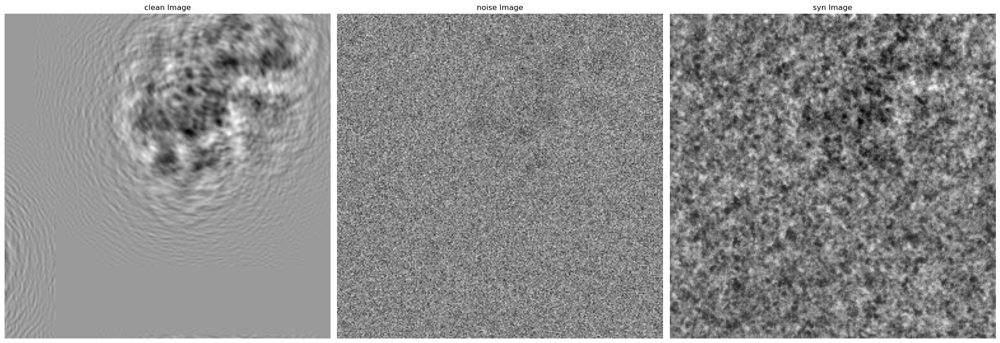

In [67]:
idx=3 #insili 4 aspire 3
plt.figure(figsize=(22, 10))

#plt.figtext(-0.01, 0.5, '5lzf_256*256', fontsize=20, va='center', rotation='vertical', color='black')
# 第一张图像
plt.subplot(1, 3, 1)  # 1 表示 1 行, 2 表示 2 列, 1 表示第一个子图
plt.imshow(img_data_clean_combined[idx], cmap='gray')
plt.axis('off')
plt.title('clean Image')

plt.subplot(1, 3, 2)  # 1 表示 1 行, 2 表示 2 列, 2 表示第二个子图
plt.imshow(img_data_denoise_combined[idx], cmap='gray')
plt.axis('off')
plt.title('noise Image')

plt.subplot(1, 3, 3)  # 1 表示 1 行, 2 表示 2 列, 2 表示第二个子图
plt.imshow(img_data_syn_combined[idx], cmap='gray')
plt.axis('off')
plt.title('syn Image')

plt.tight_layout()  # 自动调整子图布局
plt.show()

In [2]:
# 指定資料夾路徑
folder_path = '5lzf_256_clean_f'

# 取得資料夾中的所有檔案名稱，並按照順序排序
file_names = sorted(os.listdir(folder_path))[:10]
#file_names = sorted(os.listdir(folder_path), key=lambda f: len(f))
# 建立一個空的列表來存儲所有 MRC 檔案的資料
#print(file_names)
img_data_noise_list = []

# 遍歷所有檔案名稱，找出 MRC 檔案並讀取
for file_name in file_names:
    #print(file_name)
    file_path = os.path.join(folder_path, file_name)  # 檔案完整路徑
    #print(file_path)
    mrc=mrcfile.open(file_path, permissive=True) #你可以尝试将 permissive 参数设置为 True，以便在读取文件时忽略一些非严格的错误
    img_data_noise = mrc.data
    #print(img_data_noise.shape)
    img_data_noise_list.append(img_data_noise)


img_data_denoise_combined = np.stack(img_data_noise_list, axis=0)
# img_data_denoise_combined = (img_data_denoise_combined - np.min(img_data_denoise_combined)) / (np.max(img_data_denoise_combined) - np.min(img_data_denoise_combined))
#img_data_denoise_combined = img_data_denoise_combined.astype(np.float32)
print('clean data shape:', img_data_denoise_combined.shape,img_data_denoise_combined.max(),img_data_denoise_combined.min())

raw_path='5lzf_256_noise_f'
#rawfile_names = sorted(os.listdir(raw_path))
rawfile_names = sorted(os.listdir(raw_path))[:10]
# 建立一個空的列表來存儲所有 MRC 檔案的資料
#print(rawfile_names)
rawimg_data_noise_list = []

# 遍歷所有檔案名稱，找出 MRC 檔案並讀取
for file_name in rawfile_names:
    #print(file_name)
    file_path = os.path.join(raw_path, file_name)  # 檔案完整路徑
    #print(file_path)
    mrc=mrcfile.open(file_path, permissive=True) #你可以尝试将 permissive 参数设置为 True，以便在读取文件时忽略一些非严格的错误
    img_data_noise = mrc.data
    #print(img_data_noise.shape)
    rawimg_data_noise_list.append(img_data_noise)


rawimg_data_denoise_combined = np.stack(rawimg_data_noise_list, axis=0)
# rawimg_data_denoise_combined = (rawimg_data_denoise_combined - np.min(rawimg_data_denoise_combined)) / (np.max(rawimg_data_denoise_combined) - np.min(rawimg_data_denoise_combined))
#rawimg_data_denoise_combined = rawimg_data_denoise_combined.astype(np.float32)
print('gan+clean data shape:', rawimg_data_denoise_combined.shape,rawimg_data_denoise_combined.max(),rawimg_data_denoise_combined.min())

gan_path='/home/m112040012/vscode/data/3000data/256/syn'
#rawfile_names = sorted(os.listdir(raw_path))
ganfile_names = sorted(os.listdir(gan_path))[:10]
# 建立一個空的列表來存儲所有 MRC 檔案的資料
#print(ganfile_names)
gan_img_data_noise_list = []

# 遍歷所有檔案名稱，找出 MRC 檔案並讀取
for file_name in ganfile_names:
    #print(file_name)
    file_path = os.path.join(gan_path, file_name)  # 檔案完整路徑
    #print(file_path)
    mrc=mrcfile.open(file_path, permissive=True) #你可以尝试将 permissive 参数设置为 True，以便在读取文件时忽略一些非严格的错误
    img_data_noise = mrc.data
    #print(img_data_noise.shape)
    gan_img_data_noise_list.append(img_data_noise)


ganimg_data_denoise_combined = np.concatenate(gan_img_data_noise_list, axis=0)
#ganimg_data_denoise_combined = (ganimg_data_denoise_combined - np.min(ganimg_data_denoise_combined)) / (np.max(ganimg_data_denoise_combined) - np.min(ganimg_data_denoise_combined))
#ganimg_data_denoise_combined = ganimg_data_denoise_combined.astype(np.float32)
print('gan+clean data shape:', ganimg_data_denoise_combined.shape,ganimg_data_denoise_combined.max(),ganimg_data_denoise_combined.min())

clean data shape: (10, 256, 256) 1.0000005 -2.3841858e-07
gan+clean data shape: (10, 256, 256) 1.0000001 -2.9802322e-08
gan+clean data shape: (10, 256, 256) 1.0 0.0


In [6]:
# idx=2
# plt.figure(figsize=(22, 10))

# plt.figtext(-0.01, 0.5, '5lzf_256*256', fontsize=20, va='center', rotation='vertical', color='black')
# # 第一张图像
# plt.subplot(1, 3, 1)  # 1 表示 1 行, 2 表示 2 列, 1 表示第一个子图
# plt.imshow(img_data_denoise_combined[idx], cmap='gray')
# plt.axis('off')
# plt.title('clean Image')

# plt.subplot(1, 3, 2)  # 1 表示 1 行, 2 表示 2 列, 2 表示第二个子图
# plt.imshow(rawimg_data_denoise_combined[idx], cmap='gray')
# plt.axis('off')
# plt.title('noise Image')

# plt.subplot(1, 3, 3)  # 1 表示 1 行, 2 表示 2 列, 2 表示第二个子图
# plt.imshow(ganimg_data_denoise_combined[idx], cmap='gray')
# plt.axis('off')
# plt.title('syn Image')

# plt.tight_layout()  # 自动调整子图布局
# plt.show()

['sb1_210512 pos 1000 1-3_1.0.3840.256.mrc', 'sb1_210512 pos 1000 1-3_1.0.480.256.mrc', 'sb1_210512 pos 1000 1-3_1.0.640.256.mrc', 'sb1_210512 pos 1000 1-3_1.0.800.256.mrc', 'sb1_210512 pos 1000 1-3_1.0.960.256.mrc', 'sb1_210512 pos 1000 1-3_1.1120.0.256.mrc', 'sb1_210512 pos 1000 1-3_1.1120.1120.256.mrc', 'sb1_210512 pos 1000 1-3_1.1120.1280.256.mrc', 'sb1_210512 pos 1000 1-3_1.1120.1440.256.mrc', 'sb1_210512 pos 1000 1-3_1.1120.160.256.mrc', 'sb1_210512 pos 1000 1-3_1.1120.1600.256.mrc', 'sb1_210512 pos 1000 1-3_1.1120.1760.256.mrc', 'sb1_210512 pos 1000 1-3_1.1120.1920.256.mrc', 'sb1_210512 pos 1000 1-3_1.1120.2080.256.mrc', 'sb1_210512 pos 1000 1-3_1.1120.2240.256.mrc', 'sb1_210512 pos 1000 1-3_1.1120.2400.256.mrc', 'sb1_210512 pos 1000 1-3_1.1120.2560.256.mrc', 'sb1_210512 pos 1000 1-3_1.1120.2720.256.mrc', 'sb1_210512 pos 1000 1-3_1.1120.2880.256.mrc', 'sb1_210512 pos 1000 1-3_1.1120.3040.256.mrc']
gan+clean data shape: (20, 256, 256) 1.0 -5.9604645e-08


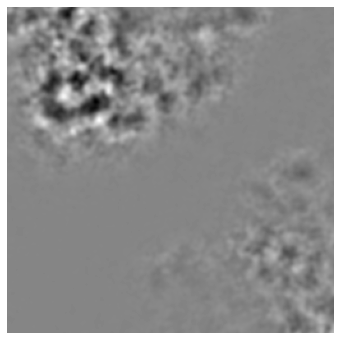

In [56]:
gan_path="/home/m112040012/vscode/data/10077/pre_256/"
#rawfile_names = sorted(os.listdir(raw_path))
ganfile_names = sorted(os.listdir(gan_path))[20:40]
# 建立一個空的列表來存儲所有 MRC 檔案的資料
print(ganfile_names)
gan_img_data_noise_list = []

# 遍歷所有檔案名稱，找出 MRC 檔案並讀取
for file_name in ganfile_names:
    #print(file_name)
    file_path = os.path.join(gan_path, file_name)  # 檔案完整路徑
    #print(file_path)
    mrc=mrcfile.open(file_path, permissive=True) #你可以尝试将 permissive 参数设置为 True，以便在读取文件时忽略一些非严格的错误
    img_data_noise = mrc.data
    #print(img_data_noise.shape)
    gan_img_data_noise_list.append(img_data_noise)


ganimg_data_denoise_combined = np.stack(gan_img_data_noise_list, axis=0)
#ganimg_data_denoise_combined = (ganimg_data_denoise_combined - np.min(ganimg_data_denoise_combined)) / (np.max(ganimg_data_denoise_combined) - np.min(ganimg_data_denoise_combined))
#ganimg_data_denoise_combined = ganimg_data_denoise_combined.astype(np.float32)
print('gan+clean data shape:', ganimg_data_denoise_combined.shape,ganimg_data_denoise_combined.max(),ganimg_data_denoise_combined.min())


plt.figure(figsize=(6, 6))
plt.imshow(ganimg_data_denoise_combined[19], cmap='gray') #img_data_clean_combined #img_data_noise_combined
plt.axis('off')  # 不顯示坐標軸
plt.show()

In [ ]:
file_number('clean',"/home/m112040012/vscode/data/aspire/256/clean/")
file_number('noise',"/home/m112040012/vscode/data/aspire/256/noise/")
file_number('syn_jpg',"/home/m112040012/vscode/data/aspire/256/syn/")
file_number('clean',"/home/m112040012/vscode/data/3000_insilicoTEM_pair/256/clean/")
file_number('noise',"/home/m112040012/vscode/data/3000_insilicoTEM_pair/256/noise/")
file_number('syn_jpg',"/home/m112040012/vscode/data/3000_insilicoTEM_pair/256/syn/")
'''
-a noisy path
-b clean path
--save-prefix save denoised micrographs /後是名稱
-o save denoised micrographs
--model
-d 1  #要從第幾張開始跑
'''
start_time = time.time()
# denoise_cmd make_paired_images_datasets要改jpg
#CUDA_VISIBLE_DEVICES=1,2,3
!python /home/m112040012/vscode/NoiseTransfer2clean-main/denoiser/denoise_cmd.py \
-a "/home/m112040012/vscode/data/3000_insilicoTEM_pair/256/syn/" \
-b "/home/m112040012/vscode/data/3000_insilicoTEM_pair/256/clean/" \
--num-epochs 10 \
--batch-size 32 \
--crop 256 \
--save-prefix /home/m112040012/vscode/fine_denoiser_model/test/model/model \
--arch 'unet' \
--holdout 0.05 \
--lr 0.001\
--format jpg \
--normalize \
-o nn \
-d 1 \ 

#--num-threads 2

end_time = time.time()
execution_time = end_time - start_time
print(f"Execution time: {execution_time:.2f} seconds")

clean: 126852
noise: 126852
syn_jpg: 126852
clean: 155918
noise: 155918
syn_jpg: 155918
# using device=1 with cuda=True
# training with 148123 image pairs
# validating on 7795 image pairs
epoch loss_train loss_val
1 0.655016070210656 0.6471127852711489                                          


# 4.Use pretrained model

In [ ]:
start_time = time.time()
CUDA_VISIBLE_DEVICES=0,1,2
!python /home/m112040012/vscode/NoiseTransfer2clean-main/denoiser/denoise_cmd.py \
/home/m112040012/vscode/data/10077/topaz_jpg_mrc/preprocess_jpg/* \
--device 1 \
--normalize \
--format jpg \
--output "/home/m112040012/vscode/fine_denoiser_model/test/pre/"\
-m "/home/m112040012/vscode/fine_denoiser_model/test/model/model_epoch10.sav"\
-s 800 \
-p 128
end_time = time.time()
execution_time = end_time - start_time
print(f"Execution time: {execution_time:.2f} seconds")

In [50]:
# 指定資料夾路徑
folder_path = '10077_raw'

# 取得資料夾中的所有檔案名稱，並按照順序排序
file_names = sorted(os.listdir(folder_path))[9:16]
#file_names = sorted(os.listdir(folder_path), key=lambda f: len(f))
# 建立一個空的列表來存儲所有 MRC 檔案的資料
print(file_names)
img_data_noise_list = []

# 遍歷所有檔案名稱，找出 MRC 檔案並讀取
for file_name in file_names:
    #print(file_name)
    file_path = os.path.join(folder_path, file_name)  # 檔案完整路徑
    #print(file_path)
    mrc=mrcfile.open(file_path, permissive=True) #你可以尝试将 permissive 参数设置为 True，以便在读取文件时忽略一些非严格的错误
    img_data_noise = mrc.data
    #print(img_data_noise.shape)
    img_data_noise_list.append(img_data_noise)


img_data_denoise_combined = np.stack(img_data_noise_list, axis=0)
img_data_denoise_combined = (img_data_denoise_combined - np.min(img_data_denoise_combined)) / (np.max(img_data_denoise_combined) - np.min(img_data_denoise_combined))
img_data_denoise_combined = img_data_denoise_combined.astype(np.float32)
print('clean data shape:', img_data_denoise_combined.shape)

raw_path="/home/m112040012/vscode/data/10077/pre_wgan0.5/"
#rawfile_names = sorted(os.listdir(raw_path))
rawfile_names = sorted(os.listdir(raw_path))[:]
# 建立一個空的列表來存儲所有 MRC 檔案的資料
print(rawfile_names)
rawimg_data_noise_list = []

# 遍歷所有檔案名稱，找出 MRC 檔案並讀取
for file_name in rawfile_names:
    #print(file_name)
    file_path = os.path.join(raw_path, file_name)  # 檔案完整路徑
    #print(file_path)
    mrc=mrcfile.open(file_path, permissive=True) #你可以尝试将 permissive 参数设置为 True，以便在读取文件时忽略一些非严格的错误
    img_data_noise = mrc.data
    #print(img_data_noise.shape)
    rawimg_data_noise_list.append(img_data_noise)


rawimg_data_denoise_combined = np.stack(rawimg_data_noise_list, axis=0)
rawimg_data_denoise_combined = (rawimg_data_denoise_combined - np.min(rawimg_data_denoise_combined)) / (np.max(rawimg_data_denoise_combined) - np.min(rawimg_data_denoise_combined))
rawimg_data_denoise_combined = rawimg_data_denoise_combined.astype(np.float32)
print('gan+clean data shape:', rawimg_data_denoise_combined.shape)

['sb1_210512 pos 1000 1-1_1.mrc', 'sb1_210512 pos 1000 1-2_1.mrc', 'sb1_210512 pos 1000 1-3_1.mrc', 'sb1_210512 pos 1000 2-1_1.mrc', 'sb1_210512 pos 1000 2-2_1.mrc', 'sb1_210512 pos 1000 2-3_1.mrc', 'sb1_210512 pos 1000 3-1_1.mrc']
clean data shape: (7, 4096, 4096)
['sb1_210512 pos 1000 1-1_1.mrc', 'sb1_210512 pos 1000 1-2_1.mrc', 'sb1_210512 pos 1000 1-3_1.mrc', 'sb1_210512 pos 1000 2-1_1.mrc', 'sb1_210512 pos 1000 2-2_1.mrc']
gan+clean data shape: (5, 4096, 4096)


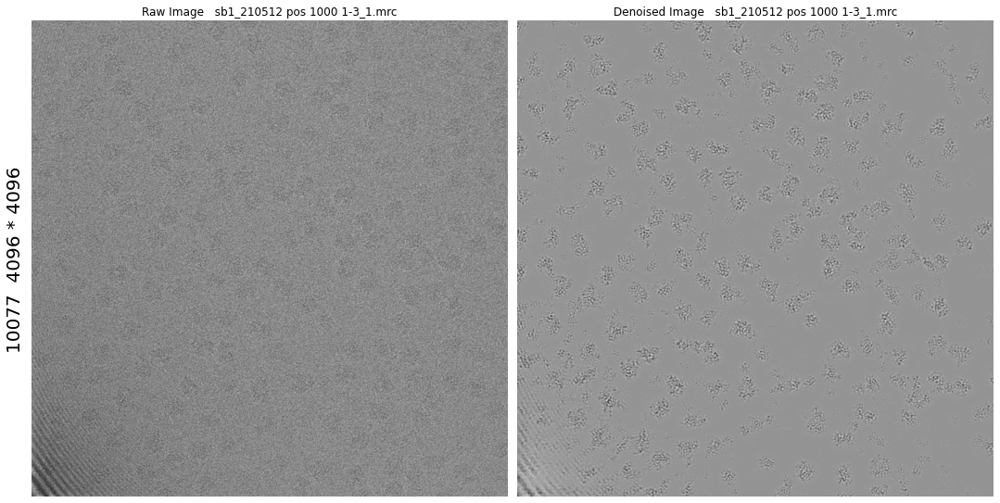

In [61]:
idx=2
plt.figure(figsize=(22, 10))

plt.figtext(-0.01, 0.5, '10077  4096 * 4096', fontsize=20, va='center', rotation='vertical', color='black')
# 第一张图像
plt.subplot(1, 3, 1)  # 1 表示 1 行, 2 表示 2 列, 1 表示第一个子图
plt.imshow(img_data_denoise_combined[idx], cmap='gray')
plt.axis('off')
plt.title(f'Raw Image   {file_names[idx]}')

plt.subplot(1, 3, 2)  # 1 表示 1 行, 2 表示 2 列, 2 表示第二个子图
plt.imshow(rawimg_data_denoise_combined[idx], cmap='gray')

plt.axis('off')
plt.title(f'Denoised Image   {rawfile_names[idx]}')

plt.tight_layout()  # 自动调整子图布局
plt.show()

In [74]:
!python \
"/home/m112040012/vscode/NoiseTransfer2clean-main/script/imcrop_mrc_256_ori.py" \
"/home/m112040012/vscode/data/10077/pre_wgan_reweight/" \
"/home/m112040012/vscode/data/10077/pre_wgan_reweight_256/"

/home/m112040012/.local/lib/python3.7/site-packages/mrcfile/mrcinterpreter.py:209: RuntimeWarning: Map ID string not found - not an MRC file, or file is corrupt
  warnings.warn(msg, RuntimeWarning)
/home/m112040012/.local/lib/python3.7/site-packages/mrcfile/mrcinterpreter.py:219: RuntimeWarning: Unrecognised machine stamp: 0x00 0x00 0x00 0x00
  warnings.warn(str(err), RuntimeWarning)
(4096, 4096)
sb1_210512 pos 1000 1-3_1


In [76]:
!python \
"/home/m112040012/vscode/NoiseTransfer2clean-main_jpg/NoiseTransfer2clean-main/script/add_gussian.py" \
"/home/m112040012/vscode/data/aspire/4096/clean/" \
"/home/m112040012/vscode/data/aspire/4096/noise_gussian/"